# 0. Requerimientos

Importamos librerías.

In [1]:
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import random as rn
import sys
import tensorflow as tf

from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem, Draw, Descriptors
from rdkit.Chem.Draw import IPythonConsole

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Concatenate
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.utils import Sequence

In [2]:
sys.path.append("/usr/local/lib/python3.7/site-packages/")

In [3]:
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.10.1


Habilitamos el procesamiento con GPU.

In [4]:
device_name = tf.test.gpu_device_name()
if device_name != "/device:GPU:0":
  raise SystemError("GPU device not found")
print(f"Found GPU at: {device_name}")
gpu_info = !nvidia-smi
gpu_info = "\n".join(gpu_info)
if gpu_info.find("failed") >= 0:
  print("Select the Runtime → 'Change runtime type' menu to enable a GPU accelerator, ")
  print("and then re-execute this cell.")
else:
  print(gpu_info)

Found GPU at: /device:GPU:0
Sat Jun 24 02:29:48 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.98                 Driver Version: 535.98       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3080 ...  WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   51C    P0              30W / 115W |  15173MiB / 16384MiB |      1%      Default |
|                                         |                      |                  N/A |
+---------------------------------------

# 1. Análisis exploratorio de datos y preprocesamiento

Generamos funciones para cargar los datos.

In [5]:
def load_data(data):
    with open(data, "r") as f:
        smiles = [r.rstrip() for r in f]
    return np.array(smiles)

def load_dictionaries(input_dict):
    with open(input_dict, "r") as fp:
        new_dict = json.load(fp)
    return new_dict

Cargamos el dataset.

In [6]:
smifile = "AI-De-Novo-Molecule-Design/Data/smiles_cleaned.smi"
data = load_data(smifile)

Verificamos el tipo de dato.

In [7]:
type(data)

numpy.ndarray

Veamos el tamaño del array.

In [8]:
data.shape

(439098,)

Observemos una muestra de este dataset.

In [9]:
print(f"Muestra de SMILES: {data[0]}")

Muestra de SMILES: O=C1Nc2cc(NC(=O)c3c[nH]cc(-c4ccc(C(F)(F)F)cc4)c3=O)ccc2C1=Cc1ccc[nH]1


Cargamos los dictionarios para mapear los caracteres a enteros y enteros a caracteres.

In [10]:
d1 = "AI-De-Novo-Molecule-Design/Data/char_to_int.json"
d2 = "AI-De-Novo-Molecule-Design/Data/int_to_char.json"
char_to_int = load_dictionaries(d1)
int_to_char = load_dictionaries(d2)
n_vocab = len(char_to_int)
print(f"Tamaño del set de caracteres: {n_vocab}")
print(f"Diccionario caracter-entero:\n{char_to_int}")
print(f"Diccionario entero-caracter:\n{int_to_char}")

Tamaño del set de caracteres: 45
Diccionario caracter-entero:
{'n': 0, '[': 1, '\\': 2, 'E': 3, 'H': 4, ')': 5, 'B': 6, '9': 7, '2': 8, ']': 9, '7': 10, '!': 11, 't': 12, 's': 13, 'o': 14, 'c': 15, 'K': 16, '-': 17, '/': 18, 'l': 19, 'A': 20, 'r': 21, '@': 22, 'C': 23, '=': 24, '6': 25, 'N': 26, 'L': 27, 'a': 28, '5': 29, 'S': 30, 'T': 31, '#': 32, '+': 33, 'P': 34, 'i': 35, '(': 36, '8': 37, '1': 38, 'I': 39, 'e': 40, 'O': 41, '3': 42, 'F': 43, '4': 44}
Diccionario entero-caracter:
{'0': 'n', '1': '[', '2': '\\', '3': 'E', '4': 'H', '5': ')', '6': 'B', '7': '9', '8': '2', '9': ']', '10': '7', '11': '!', '12': 't', '13': 's', '14': 'o', '15': 'c', '16': 'K', '17': '-', '18': '/', '19': 'l', '20': 'A', '21': 'r', '22': '@', '23': 'C', '24': '=', '25': '6', '26': 'N', '27': 'L', '28': 'a', '29': '5', '30': 'S', '31': 'T', '32': '#', '33': '+', '34': 'P', '35': 'i', '36': '(', '37': '8', '38': '1', '39': 'I', '40': 'e', '41': 'O', '42': '3', '43': 'F', '44': '4'}


Creamos una función para preparar el dataset para el aprendizaje supervisado. Para esto, se añaden los caracteres que funcionan como marcadores de inicio (!) y final (E), se añade relleno para conseguir un tamaño de secuencia uniforme, y se transforma cada secuencia en una secuencia de one-hot vectors.

In [11]:
def vectorize(smiles, embed, n_vocab):
    one_hot = np.zeros((smiles.shape[0], embed, n_vocab), dtype=np.int8)
    for i, smile in enumerate(smiles):

        # Codificamos el inicio
        one_hot[i, 0, char_to_int["!"]] = 1

        # Codificamos los caracteres SMILE
        for j, c in enumerate(smile):
            one_hot[i, j+1, char_to_int[c]] = 1

        # Codificamos el final de los string SMILE
        one_hot[i, len(smile)+1:, char_to_int["E"]] = 1

    # Retornamos dos items, uno como entrada y otro como salida
    return one_hot[:, 0:-1, :], one_hot[:, 1:, :]

Creamos el set de entrada y el set de salida.

In [12]:
full_train, test = train_test_split(data, test_size=0.2, random_state=42)
print(f"Forma de los SMILE de entrenamiento: {full_train.shape}")
print(f"Forma de los SMILE de testeo: {test.shape}")

Forma de los SMILE de entrenamiento: (351278,)
Forma de los SMILE de testeo: (87820,)


Necesitamos también un set de validación para medir el rendimiento del modelo en cada época.

In [13]:
train, val_set = train_test_split(full_train, test_size=0.1, random_state=42)
print(f"Forma de los SMILE de entrenamiento: {train.shape}")
print(f"Forma de los SMILE de validación: {val_set.shape}")

Forma de los SMILE de entrenamiento: (316150,)
Forma de los SMILE de validación: (35128,)


Creamos el set de entradas y el set de salidas.

In [14]:
embed = 101
X_train, y_train = vectorize(train, embed, n_vocab)
X_val, y_val = vectorize(val_set, embed, n_vocab)
X_test, y_test = vectorize(test, embed, n_vocab)
print(f"Forma de las entradas de entrenamiento: {X_train.shape}")
print(f"Forma de las salidas de entrenamiento: {y_train.shape}")
print(f"Forma de las entradas de validación: {X_val.shape}")
print(f"Forma de las salidas de validación: {y_val.shape}")
print(f"Forma de las entradas de testeo: {X_test.shape}")
print(f"Forma de las salidas de testeo: {y_test.shape}")

Forma de las entradas de entrenamiento: (316150, 100, 45)
Forma de las salidas de entrenamiento: (316150, 100, 45)
Forma de las entradas de validación: (35128, 100, 45)
Forma de las salidas de validación: (35128, 100, 45)
Forma de las entradas de testeo: (87820, 100, 45)
Forma de las salidas de testeo: (87820, 100, 45)


Mostramos un ejemplo de una muestra con los caracteres de inicio y finalización. Notemos que el caracter de relleno es la "E" para alcanzar un tamaño de secuencia de 100 caracteres.

In [15]:
"".join([int_to_char[str(idx)] for idx in np.argmax(X_train[0, :, :], axis=1)])

'!CC(O)(COc1ccc(F)cc1Br)C(=O)N1CCc2c(C#N)cccc21EEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEE'

Guardamos el set de testeo para le modelo generativo.

In [41]:
np.save("test.npy", test)

# 2. Generación de moléculas

## 2.1. Entrenamiento del modelo base

Definimos el modelo de red neuronal LSTM.

In [16]:
def lstm_model(X, y):

    # Capas de codificación
    enc_input = Input(shape=(X.shape[1:]))
    _, state_h, state_c = LSTM(256, return_state=True)(enc_input)
    states = Concatenate(axis=-1)([state_h, state_c])
    bottle_neck = Dense(128, activation="relu")(states)

    # Capas de decodificación
    state_h_decoded = Dense(256, activation="relu")(bottle_neck)
    state_c_decoded = Dense(256, activation="relu")(bottle_neck)
    encoder_states = [state_h_decoded, state_c_decoded]
    dec_input = Input(shape=(X.shape[1:]))
    dec1 = LSTM(256, return_sequences=True)(dec_input, initial_state=encoder_states)
    output = Dense(y.shape[2], activation="softmax")(dec1)

    model = Model(inputs=[enc_input, dec_input], outputs=output)
    return model

Instanciamos el modelo.

In [24]:
model = lstm_model(X_train, y_train)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 100, 45)]    0           []                               
                                                                                                  
 lstm_2 (LSTM)                  [(None, 256),        309248      ['input_3[0][0]']                
                                 (None, 256),                                                     
                                 (None, 256)]                                                     
                                                                                                  
 concatenate_1 (Concatenate)    (None, 512)          0           ['lstm_2[0][1]',                 
                                                                  'lstm_2[0][2]']           

Compilamos el modelo un tamaño de batch de 256, optimizador Adam y función de pérdida categorical crossentropy.

In [25]:
batch_size = 256
steps_per_epoch = len(X_train) // batch_size
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
    0.001,
    decay_steps=steps_per_epoch*50,
    decay_rate=1.0,
    staircase=False
)
opt = Adam()
model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["acc"])

Definimos una clase para generar data.

In [26]:
class Data_Generator(Sequence):

    def __init__(self, input_data, labels, batch_size):
        self.input_data, self.labels = input_data, labels
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.input_data) / float(self.batch_size)))

    def __getitem__(self, idx):
        x = self.input_data[idx * self.batch_size:(idx + 1) * self.batch_size]
        y = self.labels[idx * self.batch_size:(idx + 1) * self.batch_size]

        batch_x, batch_y = np.array(x), np.array(y)

        return [batch_x, batch_x], batch_y

Creamos instancias de los generadores de data.

In [27]:
training_generator = Data_Generator(X_train, y_train, batch_size)
validation_generator = Data_Generator(X_val, y_val, batch_size)

Funciones callback.

In [28]:
file="AI-De-Novo-Molecule-Design/Data/LSTM_Chem_weights-{epoch:02d}-{acc:.4f}-{val_loss:.4f}.hdf5"
checkpoint = ModelCheckpoint(file, monitor="val_loss", verbose=1, save_best_only=True, save_weights_only=True, mode="min")
rlrp = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=10, min_lr=1e-5)
tb = TensorBoard(log_dir="logs/chem/", histogram_freq=1, write_graph=True, write_images=True)

Entrenamos al modelo.

In [29]:
EPOCHS = 225
validation_steps = len(X_val) // batch_size
history = model.fit(
    training_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=EPOCHS,
    verbose=1,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    use_multiprocessing=False,
    shuffle=True,
    callbacks=[]
  )

Epoch 1/225


1234/1234 [==============================] - 31s 24ms/step - loss: 0.7853 - acc: 0.7553 - val_loss: 0.5518 - val_acc: 0.8175
Epoch 2/225
1234/1234 [==============================] - 29s 23ms/step - loss: 0.4975 - acc: 0.8320 - val_loss: 0.4595 - val_acc: 0.8425
Epoch 3/225
1234/1234 [==============================] - 29s 24ms/step - loss: 0.4373 - acc: 0.8489 - val_loss: 0.4173 - val_acc: 0.8546
Epoch 4/225
1234/1234 [==============================] - 29s 24ms/step - loss: 0.4038 - acc: 0.8590 - val_loss: 0.3845 - val_acc: 0.8655
Epoch 5/225
1234/1234 [==============================] - 29s 24ms/step - loss: 0.3635 - acc: 0.8732 - val_loss: 0.3708 - val_acc: 0.8693
Epoch 6/225
1234/1234 [==============================] - 29s 24ms/step - loss: 0.3306 - acc: 0.8850 - val_loss: 0.3188 - val_acc: 0.8893
Epoch 7/225
1234/1234 [==============================] - 29s 24ms/step - loss: 0.3042 - acc: 0.8946 - val_loss: 0.2897 - val_acc: 0.8995
Epoch 8/225
1234/1234 [==============================

Generamos las gráficas de precisión y pérdida para evaluar el rendimiento del modelo a lo largo de las épocas.

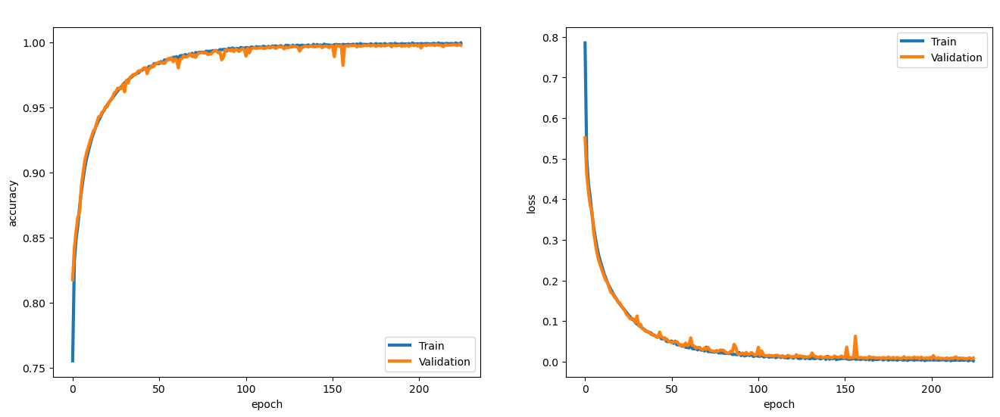

In [30]:
fig, (axis1, axis2) = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Gráfica de precisión
axis1.plot(history.history["acc"], label="Train", linewidth=3)
axis1.plot(history.history["val_acc"], label="Validation", linewidth=3)
axis1.set_title("Model accuracy", fontsize=16, color="white")
axis1.set_ylabel("accuracy")
axis1.set_xlabel("epoch")
axis1.legend(loc="lower right")

# summarize history for loss
axis2.plot(history.history["loss"], label="Train", linewidth=3)
axis2.plot(history.history["val_loss"], label="Validation", linewidth=3)
axis2.set_title("Model loss", fontsize=16, color="white")
axis2.set_ylabel("loss")
axis2.set_xlabel("epoch")
axis2.legend(loc="upper right")
plt.show()

Evaluamos el modelo con el set de testeo.

In [31]:
score, acc = model.evaluate([X_test, X_test], y_test, batch_size=batch_size, verbose=0)
print(f"Test score: {score}")
print(f"Test accuracy: {acc}")

Test score: 0.009263616055250168
Test accuracy: 0.9975401759147644


Vemos que el modelo consigue una precisión del 99.75% en el set de testeo. Guardamos el modelo y los pesos calculados.

In [32]:
mod_file = "LSTM_model.h5"
model.save(mod_file)
print("Model Saved")

Model Saved


## 2.2. Modelo generativo

Primero cargamos el modelo entrenado.

In [12]:
model_file = "LSTM_model.h5"
model = load_model(model_file)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 100, 45)]    0           []                               
                                                                                                  
 lstm_2 (LSTM)                  [(None, 256),        309248      ['input_3[0][0]']                
                                 (None, 256),                                                     
                                 (None, 256)]                                                     
                                                                                                  
 concatenate_1 (Concatenate)    (None, 512)          0           ['lstm_2[0][1]',                 
                                                                  'lstm_2[0][2]']           

Creamos el modelo de codificación a partir del modelo entrenado.

In [13]:
encoder_model = Model(inputs=model.layers[0].input, outputs=model.layers[3].output)
encoder_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 100, 45)]    0           []                               
                                                                                                  
 lstm_2 (LSTM)                  [(None, 256),        309248      ['input_3[0][0]']                
                                 (None, 256),                                                     
                                 (None, 256)]                                                     
                                                                                                  
 concatenate_1 (Concatenate)    (None, 512)          0           ['lstm_2[0][1]',                 
                                                                  'lstm_2[0][2]']             

Creamos un modelo intermediari que decodificará el espacio latente en estades que necesitas ser entradas para el decodificador LSTM.

In [14]:
latent_input = Input(shape=(128, ))
state_h = model.layers[5](latent_input)
state_c = model.layers[6](latent_input)
latent_to_states_model = Model(latent_input, [state_h, state_c])
latent_to_states_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 dense_5 (Dense)                (None, 256)          33024       ['input_1[0][0]']                
                                                                                                  
 dense_6 (Dense)                (None, 256)          33024       ['input_1[0][0]']                
                                                                                                  
Total params: 66,048
Trainable params: 66,048
Non-trainable params: 0
__________________________________________________________________________________________________


Creamos el modelo de decodificación. El modelo base se entrenó en un modelo de batches sin estados. Ahora debemos configurar el modelo de decodificación para que sea compatible con estados para predecir un caracter a la vez. Las capas se definen exactamente igual que antes excepto por la nueva forma del batch.

In [15]:
decoder_inputs = Input(batch_shape=(1, 1, 45))
decoder_lstm = LSTM(256, return_sequences=True, stateful=True)(decoder_inputs)
decoder_outputs = Dense(45, activation="softmax")(decoder_lstm)
gen_model = Model(decoder_inputs, decoder_outputs)

Transferimos los pesos del modelo enternado al modelo generativo.

In [16]:
for i in range(1,3):
    gen_model.layers[i].set_weights(model.layers[i+6].get_weights())
gen_model.save("gen_model.h5")
gen_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(1, 1, 45)]              0         
                                                                 
 lstm (LSTM)                 (1, 1, 256)               309248    
                                                                 
 dense (Dense)               (1, 1, 45)                11565     
                                                                 
Total params: 320,813
Trainable params: 320,813
Non-trainable params: 0
_________________________________________________________________


Cremos una función para muestrear el Softmax.

In [17]:
def sample_with_temp(preds, sampling_temp):
    streched = np.log(preds) / sampling_temp
    streched_probs = np.exp(streched) / np.sum(np.exp(streched))
    return np.random.choice(range(len(streched)), p=streched_probs)

Para generar muestras a partir del espacio latente, necesitamos calcular los estados h y c usando el modelo `latent_to_states_model` y luego configuramos los estados iniciales del modelo generativo LSTM. El modelo generativo será alimentado por un caracter a la vez y muestreará iterativamente el siguiente caracter hasta que se encuentre el caracter de finalización "E".

In [18]:
def sample_smiles(latent, n_vocab, sampling_temp):

    # Decodificamos los estados latentes y configuramos el estado inicial del LSTM
    states = latent_to_states_model.predict(latent)
    gen_model.layers[1].reset_states(states=[states[0], states[1]])

    # Definimos el caracter de entrada
    startidx = char_to_int["!"]
    samplevec = np.zeros((1,1,n_vocab))
    samplevec[0,0,startidx] = 1
    sequence = ""

    # Iteramos para predecir el siguiente caracter
    for i in range(101):
        preds = gen_model.predict(samplevec)[0][-1]
        if sampling_temp == 1.0:
          sampleidx = np.argmax(preds)
        else:
          sampleidx = sample_with_temp(preds, sampling_temp)
        samplechar = int_to_char[str(sampleidx)]
        if samplechar != "E":
            sequence += samplechar
            samplevec = np.zeros((1,1,n_vocab))
            samplevec[0,0,sampleidx] = 1
        else:
            break
    return sequence       

Cargamos el dataset de testeo y evaluamos el rendimiento del modelo para generar SMILES.

In [19]:
data = "test.npy"
test_data = np.load(data)
print(f"Test dataset shape: {test_data.shape}")
print(f"Test data samples:\n {test_data[0:11]}")

Test dataset shape: (87820,)
Test data samples:
 ['COc1ccc(CC(=O)O)cc1-c1ccc(F)c2c1CN(C(=O)OCC(C)C)CC2'
 'CC1C(O)CC2C1C1OCC(C)C13C=CC2(C)OO3'
 'Cc1cc(C=C2C(=O)Nc3ccc(F)cc32)c2ccccc(OCCN3CCOCC3)c1-2'
 'Cc1cc(C(=O)Nc2cccc3ccccc23)c(C)n1-c1ccccc1C(F)(F)F'
 'CC(C(=O)NCc1ccc(C(F)(F)F)nc1N1CCC(Cc2ccccc2)CC1)c1ccc(NS(C)(=O)=O)c(F)c1'
 'CC(C)(C)C(=O)N(Cc1cccc(Cl)c1Cl)C1CCNC1'
 'COCC1CCCN1S(=O)(=O)c1ccc2c(c1)C(=O)C(=O)N2Cc1cn(-c2ccccc2)nn1'
 'CONC(=O)c1cnn2ccc(N3CCCC3c3cc(F)ccc3F)nc12'
 'O=C(Cn1ccc2ccccc2c1=O)NCc1cc2cc(C(=O)N3CCC(N4C(=O)OCc5ccccc54)CC3)ccc2o1'
 'O=S(=O)(NC1CCNC1)c1ccc2[nH]c(-c3cc4ccccc4nc3O)cc2c1'
 'CC1(C)CCc2[nH]c3cc(F)cc4c(=O)[nH]nc1c2c34']


Creamos el tensor de entrada del dataset.

In [20]:
Xt, _ = vectorize(test_data, 101, n_vocab)
print(f"Sampling dataset input shape: {Xt.shape}")

Sampling dataset input shape: (87820, 100, 45)


Creamos el espacio latente para el set de testeo usando el modelo de codificación.

In [21]:
test_latent_space = encoder_model.predict(Xt)
print(f"Test data latent space shape: {test_latent_space.shape}")

2745/2745 [==============================] - 22s 5ms/step
Test data latent space shape: (87820, 128)


Generamos SMILES a partir del espacio latente de testeo usando una tempetarua de muestreo de 1.0

In [22]:
sampling_temp = 1.0
test_smile = sample_smiles(test_latent_space[0:1], n_vocab, sampling_temp)
print("Baseline sampling temp smile generation:")
print(test_smile)
print(test_data[0])

1/1 [==============================] - 0s 23ms/step
Baseline sampling temp smile generation:
COc1ccc(CC(=O)O)cc1-c1ccc(F)c2c1CN(C(=O)OCC(C)C)CC2
COc1ccc(CC(=O)O)cc1-c1ccc(F)c2c1CN(C(=O)OCC(C)C)CC2


Generamos un SMILE utilizando una temperatura de muestreo más agresiva.

In [23]:
sampling_temp = 1.25
test_smile = sample_smiles(test_latent_space[0:1], n_vocab, sampling_temp)
print(test_smile)
print(test_data[0])

1/1 [==============================] - ETA: 0s

C:\Users\eavil\AppData\Local\Temp\ipykernel_28804\3126758921.py:2: RuntimeWarning: divide by zero encountered in log
  streched = np.log(preds) / sampling_temp


1/1 [==============================] - 0s 20ms/step
COc1ccc(CC(=O)O)cc1-c1ccc(F)c2c1CN(C(=O)OCC(C)C)CC2
COc1ccc(CC(=O)O)cc1-c1ccc(F)c2c1CN(C(=O)OCC(C)C)CC2


Verificamos el porcentaje de SMILES malformadas que se generaron usando una temperatura de 1.0.

In [24]:
sampling_temp = 1.0
wrong = 0
for i in range(100):
    smiles = sample_smiles(test_latent_space[i:i+1], n_vocab, sampling_temp)
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        pass
    else: 
        wrong = wrong + 1
print("%0.1F percent wrongly formatted smiles"%(wrong/float(100)*100))

1/1 [==============================] - ETA: 0s

[02:30:52] Explicit valence for atom # 22 O, 4, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[02:31:14] Explicit valence for atom # 42 O, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[02:32:21] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[02:32:35] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc(N(C(=O)c2nc3c(Cl)cc(CC(=O)N(CC)Br)nc3C)cc2C)C2=O)cc2
[02:32:35] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc(N(C(=O)c2nc3c(Cl)cc(CC(=O)N(CC)Br)nc3C)cc2C)C2=O)cc2' for input: 'Cc1cccc(N(C(=O)c2nc3c(Cl)cc(CC(=O)N(CC)Br)nc3C)cc2C)C2=O)cc2'


1/1 [==============================] - ETA: 0s

[02:34:54] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24


1/1 [==============================] - 0s 20ms/step


[02:35:16] SMILES Parse Error: unclosed ring for input: 'COc1ccccc1N1CCN(C2CC3CC(NC4CC5CC(CN6)C5(O)C6C7CCC4(Cc6cFC)(C6)CC35)C2)C1'


1/1 [==============================] - ETA: 0s

[02:36:26] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 35


1/1 [==============================] - 0s 25ms/step
7.0 percent wrongly formatted smiles


Verificamos el porcentaje de SMILES malformadas que se generaron usando una temperatura de 1.25.

In [25]:
sampling_temp = 1.25
wrong = 0
for i in range(100):
    smiles = sample_smiles(test_latent_space[i:i+1], n_vocab, sampling_temp)
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        pass
    else: 
        wrong = wrong + 1
print("%0.1F percent wrongly formatted smiles"%(wrong/float(100)*100))

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 38ms/step


C:\Users\eavil\AppData\Local\Temp\ipykernel_28804\3126758921.py:2: RuntimeWarning: divide by zero encountered in log
  streched = np.log(preds) / sampling_temp


1/1 [==============================] - 0s 29ms/step


[02:36:45] SMILES Parse Error: extra close parentheses while parsing: CC1C(O)CC2Cc3ncc(CC)oc3C3=CC(=O)O3)O2
[02:36:45] SMILES Parse Error: Failed parsing SMILES 'CC1C(O)CC2Cc3ncc(CC)oc3C3=CC(=O)O3)O2' for input: 'CC1C(O)CC2Cc3ncc(CC)oc3C3=CC(=O)O3)O2'


1/1 [==============================] - 0s 24ms/step


[02:37:13] Explicit valence for atom # 42 O, 4, is greater than permitted


1/1 [==============================] - 0s 26ms/step


[02:37:23] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 26


1/1 [==============================] - 0s 24ms/step


[02:38:22] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[02:38:35] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(N(C(=O)c2nc3c(Cl)cc(CC(=O)S(=O)(Br)F)co3[o+]2CC)oc1C)cn1'


1/1 [==============================] - ETA: 0s

[02:38:57] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 26 34


1/1 [==============================] - 0s 20ms/step


[02:39:17] Can't kekulize mol.  Unkekulized atoms: 14 15 16 23 24 25 27 28 29 30 31


1/1 [==============================] - 0s 27ms/step


[02:40:25] Explicit valence for atom # 30 N, 6, is greater than permitted


1/1 [==============================] - 0s 21ms/step


[02:40:38] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24


1/1 [==============================] - 0s 25ms/step


[02:40:59] SMILES Parse Error: extra close parentheses while parsing: COc1ccccc1N1CCN(C2CC3CC(NC4CC5CC(CN6C)n6cc(Br)ccc5O4)CC3(O)CCBr)C2O)C1
[02:40:59] SMILES Parse Error: Failed parsing SMILES 'COc1ccccc1N1CCN(C2CC3CC(NC4CC5CC(CN6C)n6cc(Br)ccc5O4)CC3(O)CCBr)C2O)C1' for input: 'COc1ccccc1N1CCN(C2CC3CC(NC4CC5CC(CN6C)n6cc(Br)ccc5O4)CC3(O)CCBr)C2O)C1'


1/1 [==============================] - ETA: 0s

[02:41:36] Can't kekulize mol.  Unkekulized atoms: 9 10 11 22 23


1/1 [==============================] - 0s 21ms/step


[02:41:48] Can't kekulize mol.  Unkekulized atoms: 5 6 7


1/1 [==============================] - 0s 27ms/step


[02:42:09] SMILES Parse Error: syntax error while parsing: CCOC(=O)C1CC(C(=O)OCC)C(N2C(=S)CC#-c3c[nH]cc3F)c2C1C
[02:42:09] SMILES Parse Error: Failed parsing SMILES 'CCOC(=O)C1CC(C(=O)OCC)C(N2C(=S)CC#-c3c[nH]cc3F)c2C1C' for input: 'CCOC(=O)C1CC(C(=O)OCC)C(N2C(=S)CC#-c3c[nH]cc3F)c2C1C'


1/1 [==============================] - 0s 22ms/step
13.0 percent wrongly formatted smiles


Cargamos el dataset para generar espacio latente de SMILE.

In [26]:
latent_data = "latent_data_new.csv"
latent = load_data(latent_data)
print(f"Sampling dataset shape: {latent.shape}")
print(f"Sampling data samples:\n {latent[0:11]}")

Sampling dataset shape: (417,)
Sampling data samples:
 ['CC(C)CC(NC(=O)C(NC(=O)OCc1ccccc1)C(C)C)C(=O)NC(CC1CCNC1=O)C(=O)c1nc2ccccc2s1'
 'CCOC(=O)C=CC(CC1CCNC1=O)NC(=O)C(CC(C)C)NC(=O)C(NC(=O)OCc1ccccc1)C(C)C'
 'O=CC(CC1CCNC1=O)NC(=O)C(CC1CCCCC1)NC(=O)c1cc2ccccc2[nH]1'
 'O=CC(CC1CCNC1=O)NC(=O)C(Cc1cccc(F)c1)NC(=O)c1cc2ccccc2[nH]1'
 'CC(C)CC(NC(=O)OCc1ccccc1)C(=O)NC(CC(C)C)C(=O)NC(CC1CCNC1=O)C(=O)C(=O)NC(C)C'
 'CC(C)CC(NC(=O)OCc1ccccc1)C(=O)NC(C=O)CC1CCNC1=O'
 'CC(C)CC(NC(=O)OCc1ccccc1)C(=O)NC(CC1CCNC1=O)C(O)S(=O)(=O)O'
 'COc1cccc2[nH]c(C(=O)NC(CC(C)C)C(=O)NC(CC3CCNC3=O)C(=O)CO)cc12'
 'CC(OC(C)(C)C)C(NC(=O)OCc1ccccc1)C(=O)NC(CC1CCCCC1)C(=O)NC(C=O)CC1CCNC1=O'
 'N=C(NN=Cc1ccccc1O)c1nonc1NCNc1nonc1C(=N)NN=Cc1ccccc1O'
 'COc1cc(C(NC2=NC(=O)C(CC(=O)Nc3ccc(C(=O)O)cc3)S2)c2c(O)[nH]c(=O)[nH]c2=O)ccc1O']


Creamos el tensor de entrada del espacio latente.

In [27]:
X, _ = vectorize(latent, 101, n_vocab)
print(f"Sampling dataset input shape: {X.shape}")

Sampling dataset input shape: (417, 100, 45)


Creamos el espacio latente para generar moléculas usando el modelo de codificación.

In [28]:
latent_space = encoder_model.predict(X)
print(f"SMILES generating latent space shape: {latent_space.shape}")

14/14 [==============================] - 0s 12ms/step
SMILES generating latent space shape: (417, 128)


Creamos una función para generar moléculas SMILE alrededor de un vector en el espacio latente.

In [29]:
from rdkit import Chem, RDLogger
RDLogger.DisableLog('rdApp.*')

In [30]:
def generate(latent_seed, sampling_temp, scale, quant):
  samples, mols = [], []
  for i in range(quant):
    latent_vec = latent_seed + scale*(np.random.randn(latent_seed.shape[1]))
    out = sample_smiles(latent_vec, n_vocab, sampling_temp)
    mol = Chem.MolFromSmiles(out)
    if mol:
      mols.append(mol)
      samples.append(out)
  return mols, samples

In [31]:
np.seterr(divide='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

Probamos la función para generar moléculas alrededor de un vector en el espacio latente.

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step


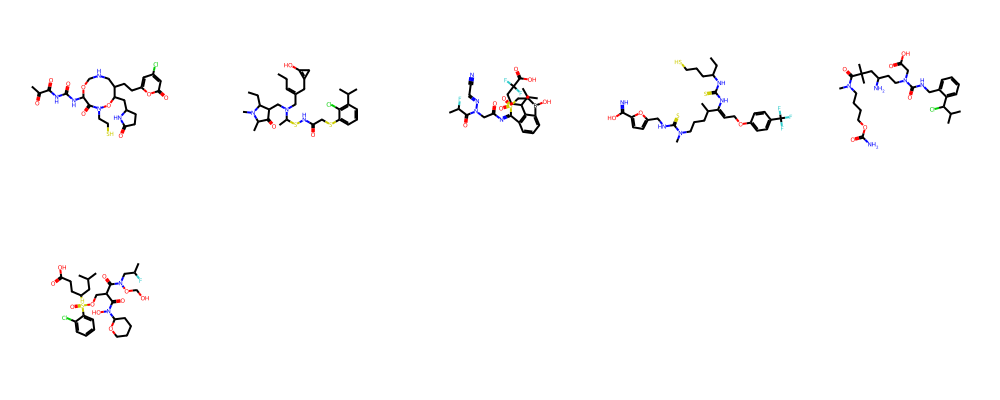

In [32]:
latent_seed = latent_space[225:226]
sampling_temp = 0.75
scale = 0.5
quantity = 20
t_mols, t_smiles = generate(latent_seed, sampling_temp, scale, quantity)
Draw.MolsToGridImage(t_mols, molsPerRow=5)

In [33]:
print(f"Sampled SMILES:\n {t_smiles}")

Sampled SMILES:
 ['CC(=O)C(=O)NC(=O)NC(OCNCC1CCc2oc(=O)cc(Cl)c2)C(=O)N(CCS)OC1CC1CCC(=O)N1', 'CCC=C(CN(C(C)SNC(=O)CSc1cccc(C(C)C)c1Cl)CC1C(=O)C(C)N(C)C1CC)CC1=C(O)C1', 'CC(F)C(=O)N(CC(=O)N=C(c1cccc2c1C(C(C)C)CCC(F)(F)C(=O)O)S(=O)(=O)CCB2O)N=CC#N', 'CCC(CCCS)NC(=S)NC(=CCOc1ccc(C(F)(F)F)cc1)C(C)CCCN(C)C(=S)NCc1ccc(C(=N)O)o1', 'CC(C)(CC(N)CCN(C(=O)NCc1ccccc1C(C(C)C)Cl)CC(=O)O)C(=O)N(C)CCCCOC(N)=O', 'CC(F)CN(C(=O)C(COS(=O)(c1ccccc1Cl)C(CC(C)C)CCC(=O)O)C(=O)N(O)C1CCCCO1)OCO']


Generamos moléculas a partir del espacio latente del dataset de muestreo.

In [41]:
gen_mols, gen_smiles = [], []
for i in range(latent.shape[0] - 1):
  latent_seed = latent_space[i:i+1]
  sampling_temp = rn.uniform(0.5, 1.2)
  scale = 0.5
  quantity = 5
  mols, smiles = generate(latent_seed, sampling_temp, scale, quantity)
  gen_mols.extend(mols)
  gen_smiles.extend(smiles)
  moles, smiles = [], []
print('SMILES generation completed!')

1/1 [==============================] - ETA: 0s

KeyboardInterrupt: 

In [42]:
print(f"Number of generated molecules: {len(gen_mols)}")
print(f"Number of generated smiles: {len(gen_smiles)}")
print(f"Generated SMILES:\n {gen_smiles}")

Number of generated molecules: 187
Number of generated smiles: 187
Generated SMILES:
 ['CCC(CCCN(C(=O)S(=O)(=O)OCc1cccc2cc(C(F)(F)F)c(S(C)(=O)=O)cc12)NCSC1COC1=O)C1CC1', 'CC(C)C(C(CO)NP(=S)(O)=Cc1ccccc1COCCC(C)(C)N)C(c1cc(OC)no1)N1CCNc2ccccc21', 'CC(CCCCS(C)(=O)=S)(NC1C2cccccc2C(=O)C1)C(C)(C)NC(=O)c1ccc(S2=NOCCO2)c2ccccc2C1', 'CCON(CC)CCC(OCC1c2nonc2CN(C(C)CCC)C(=O)O1)C(=O)NN1CC=CCc2cccc(Cl)c2C1=O', 'OCC(CC1CCSN1CCN(C)C(COCCCF)C1CC(N2Cc3ncccc3C2)CC1F)ON', 'O=CCCCOC1CN(c2sn(CC(C(=O)C)Cc3cc(C(=O)Nc4cnsc4)ccc3F)c2)O1', 'CC(F)(CCNC(=NC)c1cccc(CCCNP(=O)(O)C2CCCC2N)n1)C', 'CC(CC1(C(N)=O)CCc2ccccc2C(=O)N(CC=CC(C)CO)N1NC(=S)S)SC', 'CC(C)C(F)N(S)Cc1cccc(Br)c(N(C)C(=O)C2CCNC2=O)n1S(S)=N', 'CC(C1(C#N)C(CCl)NN=C1Cl)c1ccccc1C(=O)NC(CC1CCCCCC1S(C)(=O)=O)CCOCC(=O)OC', 'CCP(=O)(OC(CCC)SS=O)(=O)c1ccc(CC(C)NC(CC=CBr)C(C)(C)N(CCO)CC(C)C)cc1OC', 'CC1=C(C(Cl)C)C(N(C(=O)Cc2ccccc2)C(OP(=O)(OCCCO)CCC(C)(C)CNC2CC2)COCCS)NO1', 'N=C(NN=C1c2ccccc1Nc1c(NC)ncn2C1=C(O)CNN)N(C)Cc1ccncn1', 'Cc1cc(S(=O)(C2CN(C(C)C(C)N)

Guardamos la lista de SMILEs generadas.

In [43]:
outfile = "molecula.smi"
with open(outfile, "w") as f:
    for smi in gen_smiles:
        f.write(smi + os.linesep)
print("SMILES saved")

SMILES saved


# 3. Acoplamiento molecular.

Observamos los resultados del acoplamiento molecular realizado con la primera generación de moléculas.

In [1]:
import pandas as pd

filename = "resumen_VS.txt"
data = []
with open(filename, "r") as file:
    for line in file:
        name, score = line.split()
        score = float(score)
        data.append((name, score))

df = pd.DataFrame(data, columns=["Molecule Name", "Score"])
df = df.sort_values(by="Score")
print(df.head(10))


               Molecule Name  Score
196  .\lig_opt_296.pdbqt.log   -9.9
179   .\lig_opt_28.pdbqt.log   -9.3
29   .\lig_opt_127.pdbqt.log   -9.3
278  .\lig_opt_374.pdbqt.log   -9.0
0      .\lig_opt_1.pdbqt.log   -9.0
42    .\lig_opt_14.pdbqt.log   -8.9
177  .\lig_opt_278.pdbqt.log   -8.9
263   .\lig_opt_36.pdbqt.log   -8.8
163  .\lig_opt_264.pdbqt.log   -8.8
186  .\lig_opt_286.pdbqt.log   -8.7


Extraemos todas las moléculas con un puntaje menor o igual a -8.0. Esto corresponde a un total de 44 moléculas.

In [2]:
df_filtered = df[df["Score"] <= -8.0]
molecules = df_filtered["Molecule Name"].tolist()
print("Molecules with score <= -8.0:")
for molecule in molecules:
    print(molecule)

Molecules with score <= -8.0:
.\lig_opt_296.pdbqt.log
.\lig_opt_28.pdbqt.log
.\lig_opt_127.pdbqt.log
.\lig_opt_374.pdbqt.log
.\lig_opt_1.pdbqt.log
.\lig_opt_14.pdbqt.log
.\lig_opt_278.pdbqt.log
.\lig_opt_36.pdbqt.log
.\lig_opt_264.pdbqt.log
.\lig_opt_286.pdbqt.log
.\lig_opt_265.pdbqt.log
.\lig_opt_116.pdbqt.log
.\lig_opt_279.pdbqt.log
.\lig_opt_288.pdbqt.log
.\lig_opt_133.pdbqt.log
.\lig_opt_35.pdbqt.log
.\lig_opt_316.pdbqt.log
.\lig_opt_320.pdbqt.log
.\lig_opt_125.pdbqt.log
.\lig_opt_152.pdbqt.log
.\lig_opt_39.pdbqt.log
.\lig_opt_282.pdbqt.log
.\lig_opt_124.pdbqt.log
.\lig_opt_25.pdbqt.log
.\lig_opt_26.pdbqt.log
.\lig_opt_23.pdbqt.log
.\lig_opt_242.pdbqt.log
.\lig_opt_276.pdbqt.log
.\lig_opt_51.pdbqt.log
.\lig_opt_366.pdbqt.log
.\lig_opt_50.pdbqt.log
.\lig_opt_22.pdbqt.log
.\lig_opt_377.pdbqt.log
.\lig_opt_185.pdbqt.log
.\lig_opt_32.pdbqt.log
.\lig_opt_236.pdbqt.log
.\lig_opt_42.pdbqt.log
.\lig_opt_29.pdbqt.log
.\lig_opt_122.pdbqt.log
.\lig_opt_13.pdbqt.log
.\lig_opt_298.pdbqt.log
.\l

# 4. Segunda iteración

In [3]:
import sys
import os
import pandas as pd
import numpy as np
import json
from sklearn.model_selection import train_test_split
from rdkit import Chem
from rdkit.Chem import Draw, Descriptors
import random as rn
import matplotlib.pyplot as plt
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.10.1


In [4]:
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Concatenate
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.utils import Sequence

In [5]:
device_name = tf.test.gpu_device_name()
if device_name != "/device:GPU:0":
  raise SystemError("GPU device not found")
print("Found GPU at: {}".format(device_name))
gpu_info = !nvidia-smi
gpu_info = "\n".join(gpu_info)
if gpu_info.find("failed") >= 0:
  print("Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ")
  print("and then re-execute this cell.")
else:
  print(gpu_info)

Found GPU at: /device:GPU:0
Fri Jun 30 08:29:08 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.98                 Driver Version: 535.98       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3080 ...  WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   45C    P0              25W / 115W |    638MiB / 16384MiB |      2%      Default |
|                                         |                      |                  N/A |
+---------------------------------------

In [6]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
np.seterr(divide="ignore")

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [7]:
model_file = "LSTM_model.h5"
model = load_model(model_file)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 100, 45)]    0           []                               
                                                                                                  
 lstm_2 (LSTM)                  [(None, 256),        309248      ['input_3[0][0]']                
                                 (None, 256),                                                     
                                 (None, 256)]                                                     
                                                                                                  
 concatenate_1 (Concatenate)    (None, 512)          0           ['lstm_2[0][1]',                 
                                                                  'lstm_2[0][2]']           

In [8]:
def load_data(data):
    with open(data, "r") as f:
        smiles = [r.rstrip() for r in f]
    return np.array(smiles)

def load_dictionaries(input_dict):
    with open(input_dict, "r") as fp:
        new_dict = json.load(fp)
    return new_dict 

In [9]:
smifile = "nextgen_smiles.smi"
data = load_data(smifile)
print("Training dataset shape:", data.shape)
print("Sample training smile: \n", data[2])

Training dataset shape: (44,)
Sample training smile: 
 Cn1ccc2cc(N)nc(NSSC3(n4ccc5c[nH]c(=O)c5c4)N(C)c4cc(C(F)(F)F)cc(Cl)c4)c3C21


In [10]:
d1 = "AI-De-Novo-Molecule-Design/Data/char_to_int.json"
d2 = "AI-De-Novo-Molecule-Design/Data/int_to_char.json"
char_to_int = load_dictionaries(d1)
int_to_char = load_dictionaries(d2)
n_vocab = len(char_to_int)
print(f"Tamaño del set de caracteres: {n_vocab}")
print(f"Diccionario caracter-entero:\n{char_to_int}")
print(f"Diccionario entero-caracter:\n{int_to_char}")

Tamaño del set de caracteres: 45
Diccionario caracter-entero:
{'n': 0, '[': 1, '\\': 2, 'E': 3, 'H': 4, ')': 5, 'B': 6, '9': 7, '2': 8, ']': 9, '7': 10, '!': 11, 't': 12, 's': 13, 'o': 14, 'c': 15, 'K': 16, '-': 17, '/': 18, 'l': 19, 'A': 20, 'r': 21, '@': 22, 'C': 23, '=': 24, '6': 25, 'N': 26, 'L': 27, 'a': 28, '5': 29, 'S': 30, 'T': 31, '#': 32, '+': 33, 'P': 34, 'i': 35, '(': 36, '8': 37, '1': 38, 'I': 39, 'e': 40, 'O': 41, '3': 42, 'F': 43, '4': 44}
Diccionario entero-caracter:
{'0': 'n', '1': '[', '2': '\\', '3': 'E', '4': 'H', '5': ')', '6': 'B', '7': '9', '8': '2', '9': ']', '10': '7', '11': '!', '12': 't', '13': 's', '14': 'o', '15': 'c', '16': 'K', '17': '-', '18': '/', '19': 'l', '20': 'A', '21': 'r', '22': '@', '23': 'C', '24': '=', '25': '6', '26': 'N', '27': 'L', '28': 'a', '29': '5', '30': 'S', '31': 'T', '32': '#', '33': '+', '34': 'P', '35': 'i', '36': '(', '37': '8', '38': '1', '39': 'I', '40': 'e', '41': 'O', '42': '3', '43': 'F', '44': '4'}


In [11]:
def vectorize(smiles, embed, n_vocab):
    one_hot = np.zeros((smiles.shape[0], embed, n_vocab), dtype=np.int8)
    for i, smile in enumerate(smiles):
        one_hot[i,0,char_to_int["!"]] = 1
        for j, c in enumerate(smile):
            one_hot[i,j+1,char_to_int[c]] = 1
        one_hot[i,len(smile)+1:,char_to_int["E"]] = 1
    return one_hot[:,0:-1,:], one_hot[:,1:,:]

In [12]:
embed = 101
X_train, y_train = vectorize(data, embed, n_vocab)
print("Training input shape:", X_train.shape)
print("Training output shape:", y_train.shape)

Training input shape: (44, 100, 45)
Training output shape: (44, 100, 45)


Entrenamos al modelo sobre el dataset de transfer learning, es decir, sobre las mejores moléculas obtenidas en la primera generación.

In [13]:
batch_size = 8
nb_epochs = 225 // 4
model.fit([X_train, X_train], y_train, epochs=nb_epochs, batch_size=batch_size)

Epoch 1/56
6/6 [==============================] - 15s 45ms/step - loss: 1.7095 - acc: 0.8295
Epoch 2/56
6/6 [==============================] - 0s 23ms/step - loss: 2.2435 - acc: 0.7652
Epoch 3/56
6/6 [==============================] - 0s 14ms/step - loss: 1.5726 - acc: 0.7886
Epoch 4/56
6/6 [==============================] - 0s 14ms/step - loss: 1.1229 - acc: 0.8095
Epoch 5/56
6/6 [==============================] - 0s 14ms/step - loss: 0.6680 - acc: 0.8473
Epoch 6/56
6/6 [==============================] - 0s 14ms/step - loss: 0.4854 - acc: 0.8757
Epoch 7/56
6/6 [==============================] - 0s 14ms/step - loss: 0.3200 - acc: 0.9041
Epoch 8/56
6/6 [==============================] - 0s 15ms/step - loss: 0.1822 - acc: 0.9398
Epoch 9/56
6/6 [==============================] - 0s 14ms/step - loss: 0.1114 - acc: 0.9655
Epoch 10/56
6/6 [==============================] - 0s 14ms/step - loss: 0.0653 - acc: 0.9798
Epoch 11/56
6/6 [==============================] - 0s 16ms/step - loss: 0.0430

Guardamos el modelo de transfer learning y sus pesos.

In [14]:
mod_file = "LSTM_transfer_model.h5"
model.save(mod_file)
print("Model Saved")

Model Saved


In [15]:
encoder_model = Model(inputs=model.layers[0].input, outputs=model.layers[3].output)
encoder_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 100, 45)]    0           []                               
                                                                                                  
 lstm_2 (LSTM)                  [(None, 256),        309248      ['input_3[0][0]']                
                                 (None, 256),                                                     
                                 (None, 256)]                                                     
                                                                                                  
 concatenate_1 (Concatenate)    (None, 512)          0           ['lstm_2[0][1]',                 
                                                                  'lstm_2[0][2]']             

In [16]:
latent_input = Input(shape=(128, ))
state_h = model.layers[5](latent_input)
state_c = model.layers[6](latent_input)
latent_to_states_model = Model(latent_input, [state_h, state_c])
latent_to_states_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 dense_5 (Dense)                (None, 256)          33024       ['input_1[0][0]']                
                                                                                                  
 dense_6 (Dense)                (None, 256)          33024       ['input_1[0][0]']                
                                                                                                  
Total params: 66,048
Trainable params: 66,048
Non-trainable params: 0
__________________________________________________________________________________________________


In [17]:
decoder_inputs = Input(batch_shape=(1, 1, 45))
decoder_lstm = LSTM(256, return_sequences=True, stateful=True)(decoder_inputs)
decoder_outputs = Dense(45, activation="softmax")(decoder_lstm)
gen_model = Model(decoder_inputs, decoder_outputs)

In [18]:
for i in range(1,3):
    gen_model.layers[i].set_weights(model.layers[i+6].get_weights())
gen_model.save("gen_model.h5")
gen_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(1, 1, 45)]              0         
                                                                 
 lstm (LSTM)                 (1, 1, 256)               309248    
                                                                 
 dense (Dense)               (1, 1, 45)                11565     
                                                                 
Total params: 320,813
Trainable params: 320,813
Non-trainable params: 0
_________________________________________________________________


In [19]:
def sample_with_temp(preds, sampling_temp):
    streched = np.log(preds) / sampling_temp
    streched_probs = np.exp(streched) / np.sum(np.exp(streched))
    return np.random.choice(range(len(streched)), p=streched_probs)

In [20]:
def sample_smiles(latent, n_vocab, sampling_temp):
    states = latent_to_states_model.predict(latent)
    gen_model.layers[1].reset_states(states=[states[0], states[1]])
    startidx = char_to_int["!"]
    samplevec = np.zeros((1,1,n_vocab))
    samplevec[0,0,startidx] = 1
    sequence = ""
    for i in range(101):
        preds = gen_model.predict(samplevec)[0][-1]
        if sampling_temp == 1.0:
          sampleidx = np.argmax(preds)
        else:
          sampleidx = sample_with_temp(preds, sampling_temp)
        samplechar = int_to_char[str(sampleidx)]
        if samplechar != "E":
            sequence += samplechar
            samplevec = np.zeros((1,1,n_vocab))
            samplevec[0,0,sampleidx] = 1
        else:
            break
    return sequence    

In [21]:
latent_space = encoder_model.predict(X_train)
print(f"Latent space shape: {latent_space.shape}")

2/2 [==============================] - 0s 10ms/step
Latent space shape: (44, 128)


In [22]:
sampling_temp = 1.0
test_smile = sample_smiles(latent_space[0:1], n_vocab, sampling_temp)
print("Baseline sampling temp smile generation:")
print(test_smile)
print(data[0])

1/1 [==============================] - 0s 18ms/step
Baseline sampling temp smile generation:
CC(=O)OC1Cc2nnc(On3nnnc3C(F)(F)N2CC2C(=O)Nc2ccc(F)cn1)c1ccco1
CC(=O)OC1Cc2nnc(On3nnnc3C(F)(F)N2CC2C(=O)Nc2ccc(F)cn1)c1ccco1


In [24]:
sampling_temp = 1.25
test_smile = sample_smiles(latent_space[0:1], n_vocab, sampling_temp)
print(test_smile)
print(data[0])

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
CC(=O)OC1C2Cn3ncnc(NNc3nc(C)nc(C)c2C(=O)Nc2cccc(F)c2)c(=O)c3F
CC(=O)OC1Cc2nnc(On3nnnc3C(F)(F)N2CC2C(=O)Nc2ccc(F)cn1)c1ccco1


In [27]:
sampling_temp = 1.0
wrong = 0
for i in range(44):
    smiles = sample_smiles(latent_space[i:i+1], n_vocab, sampling_temp)
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        pass
    else: 
        wrong = wrong + 1
print("%0.1F percent wrongly formatted smiles"%(wrong/float(100)*100))

1/1 [==============================] - 0s 15ms/step
0.0 percent wrongly formatted smiles


In [28]:
def generate(latent_seed, sampling_temp, scale, quant):
  samples, mols = [], []
  for i in range(quant):
    latent_vec = latent_seed + scale*(np.random.randn(latent_seed.shape[1]))
    out = sample_smiles(latent_vec, n_vocab, sampling_temp)
    mol = Chem.MolFromSmiles(out)
    if mol:
      mols.append(mol)
      samples.append(out)
  return mols, samples

1/1 [==============================] - ETA: 0s

[08:43:11] SMILES Parse Error: unclosed ring for input: 'Cn1ncc(=O)n2nn(Cc3ncnc4nc(N)c-c3cn(C(O)c4cccc(Cl)c4)c3)c(I)c2'


1/1 [==============================] - 0s 16ms/step


[08:43:14] SMILES Parse Error: syntax error while parsing: Cn1ncc(=O)n(NC(=O)CNc2cnc3cc(Nc5cc(O)nc(Cl)c5ccnc4c3)c2)cc1-
[08:43:14] SMILES Parse Error: Failed parsing SMILES 'Cn1ncc(=O)n(NC(=O)CNc2cnc3cc(Nc5cc(O)nc(Cl)c5ccnc4c3)c2)cc1-' for input: 'Cn1ncc(=O)n(NC(=O)CNc2cnc3cc(Nc5cc(O)nc(Cl)c5ccnc4c3)c2)cc1-'


1/1 [==============================] - ETA: 0s

[08:43:17] SMILES Parse Error: extra open parentheses for input: 'Cn1cnc(=O)n2c(N)c(-n3[nH]c(=O)n3c3cc(C(=O)O)c(C)cc34c-2cc(F)cc1'


1/1 [==============================] - ETA: 0s

[08:43:22] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16


1/1 [==============================] - 0s 26ms/step


[08:43:24] Can't kekulize mol.  Unkekulized atoms: 6 7 9 17 18


1/1 [==============================] - 0s 15ms/step


[08:43:30] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 37


1/1 [==============================] - ETA: 0s

[08:43:33] SMILES Parse Error: extra close parentheses while parsing: Cn1cnc(=O)n1Sc1c(N)c(-c2cnc(Nc3cc(O)c4cc(C)ncc43)c(F)c2)cc1F)=C([H]
[08:43:33] SMILES Parse Error: Failed parsing SMILES 'Cn1cnc(=O)n1Sc1c(N)c(-c2cnc(Nc3cc(O)c4cc(C)ncc43)c(F)c2)cc1F)=C([H]' for input: 'Cn1cnc(=O)n1Sc1c(N)c(-c2cnc(Nc3cc(O)c4cc(C)ncc43)c(F)c2)cc1F)=C([H]'


1/1 [==============================] - 0s 18ms/step


[08:43:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 37 38


1/1 [==============================] - ETA: 0s

[08:43:40] SMILES Parse Error: syntax error while parsing: COC1OC(=O)N2C(=O)N(c3cc([N+](=O)[PN+](=O)[O-])CC(=O)Nc4ccoc43)C(C)C2)C1=O
[08:43:40] SMILES Parse Error: Failed parsing SMILES 'COC1OC(=O)N2C(=O)N(c3cc([N+](=O)[PN+](=O)[O-])CC(=O)Nc4ccoc43)C(C)C2)C1=O' for input: 'COC1OC(=O)N2C(=O)N(c3cc([N+](=O)[PN+](=O)[O-])CC(=O)Nc4ccoc43)C(C)C2)C1=O'


1/1 [==============================] - 0s 15ms/step


[08:43:43] SMILES Parse Error: extra close parentheses while parsing: CC1NC2CNC(=O)N(C)N2)C1NCCNC(=O)N(Cc1coc2CN3C(=O)C(Cc4cccs4)C3=C12)=O
[08:43:43] SMILES Parse Error: Failed parsing SMILES 'CC1NC2CNC(=O)N(C)N2)C1NCCNC(=O)N(Cc1coc2CN3C(=O)C(Cc4cccs4)C3=C12)=O' for input: 'CC1NC2CNC(=O)N(C)N2)C1NCCNC(=O)N(Cc1coc2CN3C(=O)C(Cc4cccs4)C3=C12)=O'


1/1 [==============================] - ETA: 0s

[08:43:46] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 28 30


1/1 [==============================] - ETA: 0s

[08:43:51] SMILES Parse Error: extra close parentheses while parsing: Cn1ccnc1NC(=O)N1C(=O)N2Cc3c(N)nc(N4CCC(O)C4O)c(Cl)cc3C21C)([H]
[08:43:51] SMILES Parse Error: Failed parsing SMILES 'Cn1ccnc1NC(=O)N1C(=O)N2Cc3c(N)nc(N4CCC(O)C4O)c(Cl)cc3C21C)([H]' for input: 'Cn1ccnc1NC(=O)N1C(=O)N2Cc3c(N)nc(N4CCC(O)C4O)c(Cl)cc3C21C)([H]'


1/1 [==============================] - ETA: 0s

[08:43:54] SMILES Parse Error: syntax error while parsing: Cn1c(C)nc(NC(=O)NCc2ccncc2N([S)C(=O)Nc2cc(OC(C)(C)c3ccco3)cn2)cc1
[08:43:54] SMILES Parse Error: Failed parsing SMILES 'Cn1c(C)nc(NC(=O)NCc2ccncc2N([S)C(=O)Nc2cc(OC(C)(C)c3ccco3)cn2)cc1' for input: 'Cn1c(C)nc(NC(=O)NCc2ccncc2N([S)C(=O)Nc2cc(OC(C)(C)c3ccco3)cn2)cc1'


1/1 [==============================] - 0s 16ms/step


[08:44:00] SMILES Parse Error: unclosed ring for input: 'Cn1cnc(=O)n1S(=O)(c1cc([N+](=O)N)ccn1Cc1cc(NC(=O)Cc2ccco2)ccc1=O)cccc1'


1/1 [==============================] - ETA: 0s

[08:44:03] Can't kekulize mol.  Unkekulized atoms: 10 11 19 35 36


1/1 [==============================] - 0s 14ms/step


[08:44:06] SMILES Parse Error: syntax error while parsing: Cn1nc(=O)n2c(N)nc(C[S+]([O-])CCN3C(=O)C4C(=O)C(c4ccc(F)cc4)C(=O)N3)[SeC2
[08:44:06] SMILES Parse Error: Failed parsing SMILES 'Cn1nc(=O)n2c(N)nc(C[S+]([O-])CCN3C(=O)C4C(=O)C(c4ccc(F)cc4)C(=O)N3)[SeC2' for input: 'Cn1nc(=O)n2c(N)nc(C[S+]([O-])CCN3C(=O)C4C(=O)C(c4ccc(F)cc4)C(=O)N3)[SeC2'


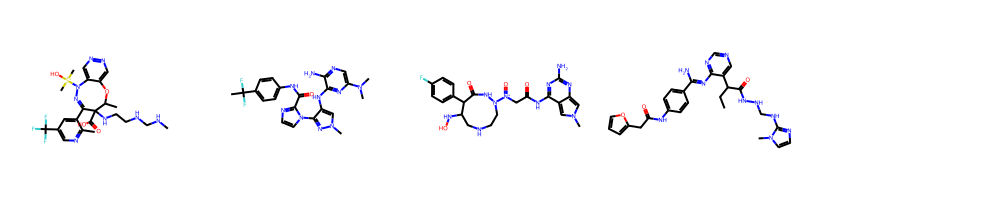

In [29]:
latent_seed = latent_space[25:26]
sampling_temp = 0.75
scale = 0.5
quantity = 20
t_mols, t_smiles = generate(latent_seed, sampling_temp, scale, quantity)
Draw.MolsToGridImage(t_mols, molsPerRow=5)

In [30]:
print(f"Sampled SMILES:\n {t_smiles}")

Sampled SMILES:
 ['CNCNCCNC1(C(=O)O)C(C)Oc2cnncc2N([S+](C)(C)O)nc1-c1cc(C(F)(F)F)cnc1C', 'Cn1cc(Nc2nc(N(C)C)cnc2N)c(-n2ccnc2C(=O)Nc2ccc(C(C)(F)F)cc2)n1', 'Cn1cc2nc(N)nc(NC(=O)C[N+](=O)N3CCNCC(NO)C(c4ccc(F)cc4)C(=O)N3)c2c1', 'Cn1ccnc1NCNNC(=O)C(c1cncnc1N=C(N)c1ccc(NC(=O)Cc2ccco2)cc1)C([H])C']


Creamos 50 moléculas por cada semilla del espacio latente.

In [34]:
gen_mols, gen_smiles = [], []
for i in range(latent_space.shape[0] - 1):
  latent_seed = latent_space[i:i+1]
  sampling_temp = rn.uniform(0.75, 1.26)
  scale = 0.75
  quantity = 50
  mols, smiles = generate(latent_seed, sampling_temp, scale, quantity)
  gen_mols.extend(mols)
  gen_smiles.extend(smiles)
  moles, smiles = [], []
print("SMILES generation completed!")

1/1 [==============================] - 0s 18ms/step


[13:11:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7


1/1 [==============================] - ETA: 0s

[13:11:15] SMILES Parse Error: extra open parentheses for input: 'CC5Oc1c(F)nc2nnc(NN=Nc3cc(-c4ccccc4N(C)n4cc(-c5cccnc5)cc43)c2'


1/1 [==============================] - 0s 16ms/step


[13:11:18] SMILES Parse Error: syntax error while parsing: CCN(C)c1cnc(Nc2nc(Oc3nc(N(C)C)c(-c4cn([O+](=O)[O-])cc4)c3)s2)cc1l
[13:11:18] SMILES Parse Error: Failed parsing SMILES 'CCN(C)c1cnc(Nc2nc(Oc3nc(N(C)C)c(-c4cn([O+](=O)[O-])cc4)c3)s2)cc1l' for input: 'CCN(C)c1cnc(Nc2nc(Oc3nc(N(C)C)c(-c4cn([O+](=O)[O-])cc4)c3)s2)cc1l'


1/1 [==============================] - ETA: 0s

[13:11:21] SMILES Parse Error: extra close parentheses while parsing: CC(=O)NCCc1cncn1-n1nnnc1C(N)=O)c1cc(C=N)c(Nc2ccc(F)cc2)cn1
[13:11:21] SMILES Parse Error: Failed parsing SMILES 'CC(=O)NCCc1cncn1-n1nnnc1C(N)=O)c1cc(C=N)c(Nc2ccc(F)cc2)cn1' for input: 'CC(=O)NCCc1cncn1-n1nnnc1C(N)=O)c1cc(C=N)c(Nc2ccc(F)cc2)cn1'


1/1 [==============================] - ETA: 0s

[13:11:24] Can't kekulize mol.  Unkekulized atoms: 4 6 7


1/1 [==============================] - 0s 16ms/step


[13:11:27] Can't kekulize mol.  Unkekulized atoms: 3 4 6


1/1 [==============================] - 0s 15ms/step


[13:11:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9


1/1 [==============================] - ETA: 0s

[13:11:32] SMILES Parse Error: unclosed ring for input: 'CN5NC(c2cc(Nc3ncnc(N)n3)nc(O)c2)C(N2CCCc3nccnc32)C(F)C1'


1/1 [==============================] - 0s 16ms/step


[13:11:35] Explicit valence for atom # 2 C, 5, is greater than permitted


1/1 [==============================] - 0s 15ms/step


[13:11:38] SMILES Parse Error: extra close parentheses while parsing: CC(C)CO)nc(CNCc1nnnn1C(=O)C1(N)CC(F)(F)F)c2c(F)cnc2C1=C
[13:11:38] SMILES Parse Error: Failed parsing SMILES 'CC(C)CO)nc(CNCc1nnnn1C(=O)C1(N)CC(F)(F)F)c2c(F)cnc2C1=C' for input: 'CC(C)CO)nc(CNCc1nnnn1C(=O)C1(N)CC(F)(F)F)c2c(F)cnc2C1=C'


1/1 [==============================] - 0s 15ms/step


[13:11:43] SMILES Parse Error: extra open parentheses for input: 'CC(OCc1cccc(NC(c2nnnn2C)nc1N(C)c1cc(F)c(N2CCCC2=O)cn1)c1ccco1'


1/1 [==============================] - 0s 16ms/step


[13:11:46] Can't kekulize mol.  Unkekulized atoms: 4 5 7 9 10 31 32


1/1 [==============================] - 0s 17ms/step


[13:11:49] SMILES Parse Error: extra close parentheses while parsing: Cn1COc2ccnc(N)nc2NS(=O)(=O)Oc2cc(C#N)cc(F)c2)N1C(=O)Cc1ccc(F)nc1
[13:11:49] SMILES Parse Error: Failed parsing SMILES 'Cn1COc2ccnc(N)nc2NS(=O)(=O)Oc2cc(C#N)cc(F)c2)N1C(=O)Cc1ccc(F)nc1' for input: 'Cn1COc2ccnc(N)nc2NS(=O)(=O)Oc2cc(C#N)cc(F)c2)N1C(=O)Cc1ccc(F)nc1'


1/1 [==============================] - ETA: 0s

[13:11:52] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=O)c1ncnc2c1nc(N)n1C2=O)(NF)=O)C1(C)N(O)C1CCC(F)(F)(F)F)c1
[13:11:52] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)c1ncnc2c1nc(N)n1C2=O)(NF)=O)C1(C)N(O)C1CCC(F)(F)(F)F)c1' for input: 'CC(NC(=O)c1ncnc2c1nc(N)n1C2=O)(NF)=O)C1(C)N(O)C1CCC(F)(F)(F)F)c1'


1/1 [==============================] - ETA: 0s

[13:11:55] SMILES Parse Error: extra close parentheses while parsing: CC(=O)Nc1cc(=O)n2cc(-n3nnc(N)c3=O)c(-c3cn(C)c4cc(C)c(C)cc43)c2)cn1
[13:11:55] SMILES Parse Error: Failed parsing SMILES 'CC(=O)Nc1cc(=O)n2cc(-n3nnc(N)c3=O)c(-c3cn(C)c4cc(C)c(C)cc43)c2)cn1' for input: 'CC(=O)Nc1cc(=O)n2cc(-n3nnc(N)c3=O)c(-c3cn(C)c4cc(C)c(C)cc43)c2)cn1'


1/1 [==============================] - ETA: 0s

[13:11:58] SMILES Parse Error: ring closure 1 duplicates bond between atom 15 and atom 16 for input: 'CNCNCCOc1cncn1nc(=O)n1-c1cc(N2CCC(O)(CCn3cc(C)c(=O)[nH]3)C2)cc1'


1/1 [==============================] - ETA: 0s

[13:12:02] SMILES Parse Error: unclosed ring for input: 'CNC=CNc1ncc(N)c(N2N(c3ncc(C)c(C(C)(F)F)c3N4)c2)C(Cl)(F)CCO'


1/1 [==============================] - ETA: 0s

[13:12:06] Can't kekulize mol.  Unkekulized atoms: 6 8


1/1 [==============================] - 0s 20ms/step


[13:12:10] SMILES Parse Error: extra close parentheses while parsing: CNC)(O)c1cnc2nnc(N)c(nc3c2N(c2ccc(CN4CC(c5ccncc5)CC4)cc2)c1
[13:12:10] SMILES Parse Error: Failed parsing SMILES 'CNC)(O)c1cnc2nnc(N)c(nc3c2N(c2ccc(CN4CC(c5ccncc5)CC4)cc2)c1' for input: 'CNC)(O)c1cnc2nnc(N)c(nc3c2N(c2ccc(CN4CC(c5ccncc5)CC4)cc2)c1'


1/1 [==============================] - ETA: 0s

[13:12:14] Explicit valence for atom # 12 N, 4, is greater than permitted


1/1 [==============================] - 0s 22ms/step


[13:12:21] SMILES Parse Error: unclosed ring for input: 'CC(=O)(c1ccc(NO)c(NN)n1C)NC(=O)CC1SC(C#N)(c2ccncc2)C1c1'


1/1 [==============================] - 0s 18ms/step


[13:12:24] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 29 31


1/1 [==============================] - 0s 24ms/step


[13:12:28] SMILES Parse Error: extra close parentheses while parsing: CNC(=O)c1ccc(N2Cc3cnnnc3)nc2N(F)F)nc1-c1SCCc2cc(F)nc(F)c2)c1
[13:12:28] SMILES Parse Error: Failed parsing SMILES 'CNC(=O)c1ccc(N2Cc3cnnnc3)nc2N(F)F)nc1-c1SCCc2cc(F)nc(F)c2)c1' for input: 'CNC(=O)c1ccc(N2Cc3cnnnc3)nc2N(F)F)nc1-c1SCCc2cc(F)nc(F)c2)c1'


1/1 [==============================] - 0s 21ms/step


[13:12:31] SMILES Parse Error: unclosed ring for input: 'CNC(=O)C1Cc2nnnc2-n1nnc(-c2ccc(N)c(C)c(=O)n2-c2ccc(F)cc2)c1'


1/1 [==============================] - 0s 18ms/step


[13:12:34] SMILES Parse Error: extra close parentheses while parsing: CC(O)COCNc1onc(NN=N(C)C2CN(C)C(O)CCS(C)(=O)c3ccc[nH]3)C2)n1
[13:12:34] SMILES Parse Error: Failed parsing SMILES 'CC(O)COCNc1onc(NN=N(C)C2CN(C)C(O)CCS(C)(=O)c3ccc[nH]3)C2)n1' for input: 'CC(O)COCNc1onc(NN=N(C)C2CN(C)C(O)CCS(C)(=O)c3ccc[nH]3)C2)n1'


1/1 [==============================] - 0s 20ms/step


[13:12:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8


1/1 [==============================] - 0s 22ms/step


[13:12:42] SMILES Parse Error: unclosed ring for input: 'CC(=O)(Cc1snnc31)NCc1nc([N+](=O)N)cc(C(=O)Nc2cc(C#N)cnc2)c1CCCO'


1/1 [==============================] - 0s 20ms/step


[13:12:45] SMILES Parse Error: syntax error while parsing: C(C(Nc1cc(-c2n[nH]nn2)nc(N)c1F)=NC(Cl)=O)NC1CC(N)Cc2ccco2+
[13:12:45] SMILES Parse Error: Failed parsing SMILES 'C(C(Nc1cc(-c2n[nH]nn2)nc(N)c1F)=NC(Cl)=O)NC1CC(N)Cc2ccco2+' for input: 'C(C(Nc1cc(-c2n[nH]nn2)nc(N)c1F)=NC(Cl)=O)NC1CC(N)Cc2ccco2+'


1/1 [==============================] - ETA: 0s

[13:12:49] Can't kekulize mol.  Unkekulized atoms: 20 21 22 25 32


1/1 [==============================] - 0s 19ms/step


[13:12:52] SMILES Parse Error: unclosed ring for input: 'CC(O)c1ccc(N)nc2N(NN=O)C(NC(=O)O)C(Cc3cc(C)c(O)cc3)c1C'


1/1 [==============================] - 0s 19ms/step


[13:12:55] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:12:59] Explicit valence for atom # 12 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:13:02] SMILES Parse Error: extra close parentheses while parsing: CC(O)n1c(Cn2ncnc2CN=[N+](=O)=O)c(C)nc(NCCc2cnccc2)c1=O)c1ccco1
[13:13:02] SMILES Parse Error: Failed parsing SMILES 'CC(O)n1c(Cn2ncnc2CN=[N+](=O)=O)c(C)nc(NCCc2cnccc2)c1=O)c1ccco1' for input: 'CC(O)n1c(Cn2ncnc2CN=[N+](=O)=O)c(C)nc(NCCc2cnccc2)c1=O)c1ccco1'


1/1 [==============================] - 0s 24ms/step


[13:13:05] SMILES Parse Error: extra open parentheses for input: 'CC(NCCc1ccnc(NN2C(=O)n2c(=O)n2c(C)n(C)c2c1=O)-c1ccccc1'


1/1 [==============================] - ETA: 0s

[13:13:08] SMILES Parse Error: extra close parentheses while parsing: CNCCO)c1cnc2nnc(N=NN3CCN(C)CCO3)c2n1-c1cc(F)c2ncccc2c1
[13:13:08] SMILES Parse Error: Failed parsing SMILES 'CNCCO)c1cnc2nnc(N=NN3CCN(C)CCO3)c2n1-c1cc(F)c2ncccc2c1' for input: 'CNCCO)c1cnc2nnc(N=NN3CCN(C)CCO3)c2n1-c1cc(F)c2ncccc2c1'


1/1 [==============================] - ETA: 0s

[13:13:11] SMILES Parse Error: unclosed ring for input: 'CC(O)COCc1ncnc2nc(N)nc(N3C(=O)C4CC4CNc4ccc(F)c(F)c43)c(Br)c2'


1/1 [==============================] - ETA: 0s

[13:13:14] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7


1/1 [==============================] - ETA: 0s

[13:13:17] SMILES Parse Error: extra close parentheses while parsing: CNC(=O)COC(n1cnc2nnn[n+](CC(N)=O)c2c1)C(NC(=O)Cc1cccs1)=C)c1ccco1
[13:13:17] SMILES Parse Error: Failed parsing SMILES 'CNC(=O)COC(n1cnc2nnn[n+](CC(N)=O)c2c1)C(NC(=O)Cc1cccs1)=C)c1ccco1' for input: 'CNC(=O)COC(n1cnc2nnn[n+](CC(N)=O)c2c1)C(NC(=O)Cc1cccs1)=C)c1ccco1'


1/1 [==============================] - ETA: 0s

[13:13:20] SMILES Parse Error: extra close parentheses while parsing: C(=O)C=C)c1cncc(Nc2nnnn2)c(-c2cnc(N)c(F)c2Cl)c1Br
[13:13:20] SMILES Parse Error: Failed parsing SMILES 'C(=O)C=C)c1cncc(Nc2nnnn2)c(-c2cnc(N)c(F)c2Cl)c1Br' for input: 'C(=O)C=C)c1cncc(Nc2nnnn2)c(-c2cnc(N)c(F)c2Cl)c1Br'


1/1 [==============================] - 0s 23ms/step


[13:13:23] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 20 31


1/1 [==============================] - ETA: 0s

[13:13:32] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 30


1/1 [==============================] - ETA: 0s

[13:13:36] Can't kekulize mol.  Unkekulized atoms: 26 27 29 30 32


1/1 [==============================] - ETA: 0s

[13:13:39] Can't kekulize mol.  Unkekulized atoms: 4 21 23 29 30


1/1 [==============================] - ETA: 0s

[13:13:43] SMILES Parse Error: extra close parentheses while parsing: CC(O)c1ccc(Nc2nc(=N)c(Nc3cn(C)c(C)c3C)n(CC(O)C3Cc4ccco4)c3)c2)n1
[13:13:43] SMILES Parse Error: Failed parsing SMILES 'CC(O)c1ccc(Nc2nc(=N)c(Nc3cn(C)c(C)c3C)n(CC(O)C3Cc4ccco4)c3)c2)n1' for input: 'CC(O)c1ccc(Nc2nc(=N)c(Nc3cn(C)c(C)c3C)n(CC(O)C3Cc4ccco4)c3)c2)n1'


1/1 [==============================] - ETA: 0s

[13:13:46] non-ring atom 11 marked aromatic


1/1 [==============================] - 0s 22ms/step


[13:13:49] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8


1/1 [==============================] - ETA: 0s

[13:13:53] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:13:56] SMILES Parse Error: unclosed ring for input: 'O=C(O)c1cccc2nc3c(S(N)(=O)=O)cccc3c(-c3cc(=O)n(Cc4ccc(F)c(F)c4)cc3)cc1Br'


1/1 [==============================] - ETA: 0s

[13:14:03] SMILES Parse Error: extra open parentheses for input: 'O=S(C)Oc1ccc(Nc2nc(N=N(c3cccc(N)c3)c(=O)n2C)cc(-c2ccccc2)c1Cl'


1/1 [==============================] - ETA: 0s

[13:14:07] SMILES Parse Error: syntax error while parsing: Il(=O)c1ccc(CNC2SC([N+](=O)[O-])C(c3ccnc(-c4cc(C(=O)O)ccc34)c2)(=O)c2ccco2)c1
[13:14:07] SMILES Parse Error: Failed parsing SMILES 'Il(=O)c1ccc(CNC2SC([N+](=O)[O-])C(c3ccnc(-c4cc(C(=O)O)ccc34)c2)(=O)c2ccco2)c1' for input: 'Il(=O)c1ccc(CNC2SC([N+](=O)[O-])C(c3ccnc(-c4cc(C(=O)O)ccc34)c2)(=O)c2ccco2)c1'


1/1 [==============================] - ETA: 0s

[13:14:10] Explicit valence for atom # 13 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:14:14] SMILES Parse Error: syntax error while parsing: O=C(NCc1cccc(Nc2nc(S(N)(=O)=O)cs2)cc1)C(=O)N([O)C(c1ccccc1)c1ccc(F)cc1
[13:14:14] SMILES Parse Error: Failed parsing SMILES 'O=C(NCc1cccc(Nc2nc(S(N)(=O)=O)cs2)cc1)C(=O)N([O)C(c1ccccc1)c1ccc(F)cc1' for input: 'O=C(NCc1cccc(Nc2nc(S(N)(=O)=O)cs2)cc1)C(=O)N([O)C(c1ccccc1)c1ccc(F)cc1'


1/1 [==============================] - ETA: 0s

[13:14:18] SMILES Parse Error: syntax error while parsing: S(=C(Cc1ccco1)C1SC(n2c(F)ccc2O)C(c2cc(S([H](=)(=O)Nc3ccccc3)cc2)CC(c2ccco2)6
[13:14:18] SMILES Parse Error: Failed parsing SMILES 'S(=C(Cc1ccco1)C1SC(n2c(F)ccc2O)C(c2cc(S([H](=)(=O)Nc3ccccc3)cc2)CC(c2ccco2)6' for input: 'S(=C(Cc1ccco1)C1SC(n2c(F)ccc2O)C(c2cc(S([H](=)(=O)Nc3ccccc3)cc2)CC(c2ccco2)6'


1/1 [==============================] - 0s 24ms/step


[13:14:22] SMILES Parse Error: unclosed ring for input: 'O=C(NCc1ccnc(N2CCC(N3C(=O)CCC3Cl)=NC23)N1CC1(C)c2ccccc2N1)=Cc1ccco1'


1/1 [==============================] - ETA: 0s

[13:14:25] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1ccc2cnc(NC(=O)NC(CC3(C#N)CC3)C(O)C(=O)Nc3cccc(O)c3Cl)c2)cc1
[13:14:25] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1ccc2cnc(NC(=O)NC(CC3(C#N)CC3)C(O)C(=O)Nc3cccc(O)c3Cl)c2)cc1' for input: 'O=C(O)c1ccc2cnc(NC(=O)NC(CC3(C#N)CC3)C(O)C(=O)Nc3cccc(O)c3Cl)c2)cc1'


1/1 [==============================] - 0s 21ms/step


[13:14:29] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34


1/1 [==============================] - ETA: 0s

[13:14:33] SMILES Parse Error: unclosed ring for input: 'o=C(NCc1cccc(N2CNC(=O)OCC2)C(O)C2OCC(=O)N(Cc3ncc(Cl)cc3)CC2=O)c1ccc(F)cc1'


1/1 [==============================] - ETA: 0s

[13:14:37] SMILES Parse Error: extra close parentheses while parsing: N(F)(Nc1ccc(C=C2NC(=O)NCC2Cl)c2c(N)c(O)c(C(=O)Nc3ccccc3)cc2)cc1)c1ccco1
[13:14:37] SMILES Parse Error: Failed parsing SMILES 'N(F)(Nc1ccc(C=C2NC(=O)NCC2Cl)c2c(N)c(O)c(C(=O)Nc3ccccc3)cc2)cc1)c1ccco1' for input: 'N(F)(Nc1ccc(C=C2NC(=O)NCC2Cl)c2c(N)c(O)c(C(=O)Nc3ccccc3)cc2)cc1)c1ccco1'


1/1 [==============================] - 0s 25ms/step


[13:14:40] SMILES Parse Error: extra close parentheses while parsing: O=c1sc2cc(O)nc3c(NSSc4cc(O)ncc4c3=O)c(NC(=O)Cc3ccc(C(F)(F)F)cc3)c2)cc1
[13:14:40] SMILES Parse Error: Failed parsing SMILES 'O=c1sc2cc(O)nc3c(NSSc4cc(O)ncc4c3=O)c(NC(=O)Cc3ccc(C(F)(F)F)cc3)c2)cc1' for input: 'O=c1sc2cc(O)nc3c(NSSc4cc(O)ncc4c3=O)c(NC(=O)Cc3ccc(C(F)(F)F)cc3)c2)cc1'


1/1 [==============================] - 0s 24ms/step


[13:14:49] SMILES Parse Error: unclosed ring for input: 'O=S(C#Cc1ccc(N2CC(CN3C(c4ccn(C)c3)c(=O)n2)Cn2cccc2C(=O)O)cc1F)(F)(F)F'


1/1 [==============================] - 0s 24ms/step


[13:14:53] SMILES Parse Error: extra open parentheses for input: 'O=C(NCc1cccc(ON2CCN(C(=O)c3cc(O)cc(C)c32)c1)(c1cccc(F)c1F)CCc1cccoc1'


1/1 [==============================] - 0s 24ms/step


[13:14:57] SMILES Parse Error: extra open parentheses for input: 'O=C(NCC1Cc2c(nc(CC(NO)C3C(=O)C3)ncc2C(N)=O)c2cc(-c3ccccc3)c(F)cc21'


1/1 [==============================] - 0s 24ms/step


[13:15:02] SMILES Parse Error: unclosed ring for input: 'O=C(NCc1cccc(N2CC(O)C(CO)C(NC(=O)O)C(O)C(=O)Nc3ccc(F)cc32)c1)C1CC(F)(F)F'


1/1 [==============================] - ETA: 0s

[13:15:07] SMILES Parse Error: extra open parentheses for input: 'S=C(NCc1ccc(N=N)c(N2CC(C#N)CO2)C(O)C(C#N)C1COC(=Cc1ccc(F)cc1)C(=O)[P@@H](O'


1/1 [==============================] - ETA: 0s

[13:15:11] SMILES Parse Error: unclosed ring for input: 'CI(C)c1cccc(C2NC3=NC(c4ccc(C#N)nc4)C(O)(C(F)(F)F)c4cc(O)c(C5CCCC4)cc3)2C'


1/1 [==============================] - ETA: 0s

[13:15:14] SMILES Parse Error: extra open parentheses for input: 'NS(C(=O)OCC1C2CC3CN(c4cc(C)c(N)c(COP(=O)(O)O)c5c4C3Cc1ccc(F)cc21'


1/1 [==============================] - 0s 17ms/step


[13:15:18] SMILES Parse Error: extra open parentheses for input: 'O=C(NCC1CCC2(C=NN(c1cc(F)cnc2F)C1)NC(=O)Nc1ccc2ccc(Cl)cc2c1=O'


1/1 [==============================] - ETA: 0s

[13:15:21] SMILES Parse Error: extra open parentheses for input: 'O=C(NCCc1ccc(CNC2SC(c3c(N)c(C)cc(=O)c32)C(=O)Nc2ccc(O)c(I)c2)cc1'


1/1 [==============================] - 0s 26ms/step


[13:15:25] SMILES Parse Error: extra close parentheses while parsing: O=C(NCCc1ccc(Nc2nc(N)c(=O)c2C(=O)O)c2oc(-c3ccncc3)c(F)c2)cc1F)c1ccco1
[13:15:25] SMILES Parse Error: Failed parsing SMILES 'O=C(NCCc1ccc(Nc2nc(N)c(=O)c2C(=O)O)c2oc(-c3ccncc3)c(F)c2)cc1F)c1ccco1' for input: 'O=C(NCCc1ccc(Nc2nc(N)c(=O)c2C(=O)O)c2oc(-c3ccncc3)c(F)c2)cc1F)c1ccco1'


1/1 [==============================] - 0s 17ms/step


[13:15:33] SMILES Parse Error: extra close parentheses while parsing: O=C(NCC1Br)C=CCN(C(=O)c2ccc(F)nc2)C(O)CN(C)C(=O)Nc2cccc(F)c2)C1C(CCF)C
[13:15:33] SMILES Parse Error: Failed parsing SMILES 'O=C(NCC1Br)C=CCN(C(=O)c2ccc(F)nc2)C(O)CN(C)C(=O)Nc2cccc(F)c2)C1C(CCF)C' for input: 'O=C(NCC1Br)C=CCN(C(=O)c2ccc(F)nc2)C(O)CN(C)C(=O)Nc2cccc(F)c2)C1C(CCF)C'


1/1 [==============================] - 0s 21ms/step


[13:15:36] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 24


1/1 [==============================] - ETA: 0s

[13:15:40] Explicit valence for atom # 18 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:15:44] Can't kekulize mol.  Unkekulized atoms: 9 10 17 18 19


1/1 [==============================] - 0s 20ms/step


[13:15:47] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 25 26 29 30 31 32 34


1/1 [==============================] - 0s 19ms/step


[13:15:51] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1ccc2c(C=C3NC(CF)(c4cccnc4)NC3=O)cnc(-c3cccc(F)c3)c(Cl)c2)c1F
[13:15:51] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1ccc2c(C=C3NC(CF)(c4cccnc4)NC3=O)cnc(-c3cccc(F)c3)c(Cl)c2)c1F' for input: 'O=C(O)c1ccc2c(C=C3NC(CF)(c4cccnc4)NC3=O)cnc(-c3cccc(F)c3)c(Cl)c2)c1F'


1/1 [==============================] - ETA: 0s

[13:15:54] SMILES Parse Error: extra open parentheses for input: 'O=C(CB(OCCC1=O)C2NC(C1)C(OCCNc1nc(C(=O)Nc3ccccc3)cc12)Cc1ccccc1'


1/1 [==============================] - ETA: 0s

[13:15:58] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 16 17 18 19 20 22 23 26


1/1 [==============================] - 0s 20ms/step


[13:16:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 35


1/1 [==============================] - ETA: 0s

[13:16:05] SMILES Parse Error: extra open parentheses for input: 'O=C(OCCc1ccc(Nc2nc(S)nc(-c3cccc(F)c2Cl)n3)cc1-c1ccccc1Cl'


1/1 [==============================] - ETA: 0s

[13:16:08] SMILES Parse Error: extra open parentheses for input: 'I(=N(C)Cc1ccnc(Nc2conc2Oc2cc(N3CCC(O)C(=O)N(Cc4ccccc4)C3)ccc2'


1/1 [==============================] - ETA: 0s

[13:16:12] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29 30 31 32 33


1/1 [==============================] - ETA: 0s

[13:16:15] SMILES Parse Error: unclosed ring for input: 'O=C(I)c1cccc(SN2C(=O)Nc3cccc(CNCc4cc(C(=O)O)c(C(F)(F)F)cc34)c(=O)c2)CCl'


1/1 [==============================] - 0s 29ms/step


[13:16:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 37 38


1/1 [==============================] - ETA: 0s

[13:16:23] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:16:27] Explicit valence for atom # 9 C, 5, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[13:16:35] SMILES Parse Error: extra open parentheses for input: 'O=C(NCCc1ccc(N=NNC(=O)C2CCN(C)CCC2)c(=O)n1-c1cccc([Se][Se]CC(F)F)c1'


1/1 [==============================] - 0s 24ms/step


[13:16:39] Can't kekulize mol.  Unkekulized atoms: 9 11 13 14 15 16 17 23 24 25 26 36 37


1/1 [==============================] - 0s 23ms/step


[13:16:45] SMILES Parse Error: extra open parentheses for input: 'O=C(NCc1ccsc1Sn1c(=O)n(-c2ccc(N([P@](O)(O)O)c(=O)c2Cl)cc1)C1CCCOC1'


1/1 [==============================] - ETA: 0s

[13:16:49] SMILES Parse Error: syntax error while parsing: c1(Cl)c+]2cc(C=O)nc(NCc3ccccn3)c2)c(C)n1CC(=O)Nc1ccc2ccccc2c1-c1ccocc1
[13:16:49] SMILES Parse Error: Failed parsing SMILES 'c1(Cl)c+]2cc(C=O)nc(NCc3ccccn3)c2)c(C)n1CC(=O)Nc1ccc2ccccc2c1-c1ccocc1' for input: 'c1(Cl)c+]2cc(C=O)nc(NCc3ccccn3)c2)c(C)n1CC(=O)Nc1ccc2ccccc2c1-c1ccocc1'


1/1 [==============================] - 0s 21ms/step


[13:16:53] SMILES Parse Error: extra open parentheses for input: 'ON(C)c1ccsc1-n1c(Cn2nccc2C(c2cccnc2)cnc(C(=O)O)c1C1CCC(CO)CC1'


1/1 [==============================] - ETA: 0s

[13:16:58] SMILES Parse Error: unclosed ring for input: 'O=C(O)c1ccc2c(NCC(=O)Nc3cccc(-n4ccnc3)c(=O)n(Cc3cccc(F)c3)c-4)cn2CCl'


1/1 [==============================] - 0s 17ms/step


[13:17:02] SMILES Parse Error: unclosed ring for input: 'O=c1sc2cc(N3C(=O)C(COc4ccc(Cn5ccnc5)c(Cl)c5)cc43)ccc2cc1-c1ccccc1'


1/1 [==============================] - ETA: 0s

[13:17:05] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 26 28 30 31 32


1/1 [==============================] - 0s 21ms/step


[13:17:09] SMILES Parse Error: extra close parentheses while parsing: Cn1cccc1C(=O)N1C(=C2N(C)C3c4ccc(-c5cn(C)c(=O)n5Cl)ccc43)C2)COC1
[13:17:09] SMILES Parse Error: Failed parsing SMILES 'Cn1cccc1C(=O)N1C(=C2N(C)C3c4ccc(-c5cn(C)c(=O)n5Cl)ccc43)C2)COC1' for input: 'Cn1cccc1C(=O)N1C(=C2N(C)C3c4ccc(-c5cn(C)c(=O)n5Cl)ccc43)C2)COC1'


1/1 [==============================] - ETA: 0s

[13:17:14] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 17 18 19 39 40 41 42


1/1 [==============================] - 0s 27ms/step


[13:17:18] SMILES Parse Error: extra close parentheses while parsing: Cc1cc2cn(CN3NC(=O)Nc4ccc5csc(N)c-5)nc(C(F)(F)F)c4c3)C(Cl)Cl)cc2c1C
[13:17:18] SMILES Parse Error: Failed parsing SMILES 'Cc1cc2cn(CN3NC(=O)Nc4ccc5csc(N)c-5)nc(C(F)(F)F)c4c3)C(Cl)Cl)cc2c1C' for input: 'Cc1cc2cn(CN3NC(=O)Nc4ccc5csc(N)c-5)nc(C(F)(F)F)c4c3)C(Cl)Cl)cc2c1C'


1/1 [==============================] - ETA: 0s

[13:17:23] SMILES Parse Error: extra close parentheses while parsing: [O-][O+]c1ccc(NN=SSSCCN3C(=O)Cn2ccnc(=O)c3=O)C2c2cc(F)c(F)c(C(F)(F)F)c2)c1
[13:17:23] SMILES Parse Error: Failed parsing SMILES '[O-][O+]c1ccc(NN=SSSCCN3C(=O)Cn2ccnc(=O)c3=O)C2c2cc(F)c(F)c(C(F)(F)F)c2)c1' for input: '[O-][O+]c1ccc(NN=SSSCCN3C(=O)Cn2ccnc(=O)c3=O)C2c2cc(F)c(F)c(C(F)(F)F)c2)c1'


1/1 [==============================] - ETA: 0s

[13:17:28] SMILES Parse Error: extra close parentheses while parsing: I(=O)c1ccc2nnn(CNS(=O)(=O)c3ccc(Nc4cc(Cn5ccnc(C)c5Cl)c(S)[PH](C)C)cc4)c3)cc2c1
[13:17:28] SMILES Parse Error: Failed parsing SMILES 'I(=O)c1ccc2nnn(CNS(=O)(=O)c3ccc(Nc4cc(Cn5ccnc(C)c5Cl)c(S)[PH](C)C)cc4)c3)cc2c1' for input: 'I(=O)c1ccc2nnn(CNS(=O)(=O)c3ccc(Nc4cc(Cn5ccnc(C)c5Cl)c(S)[PH](C)C)cc4)c3)cc2c1'


1/1 [==============================] - 0s 22ms/step


[13:17:33] SMILES Parse Error: extra close parentheses while parsing: C[C@H])c1cc(NON=C(NC(=O)c2cccs2)Cn2ccnc2)c(C)n1C(=O)N(C)CCC1CC(F)(F)F)C1
[13:17:33] SMILES Parse Error: Failed parsing SMILES 'C[C@H])c1cc(NON=C(NC(=O)c2cccs2)Cn2ccnc2)c(C)n1C(=O)N(C)CCC1CC(F)(F)F)C1' for input: 'C[C@H])c1cc(NON=C(NC(=O)c2cccs2)Cn2ccnc2)c(C)n1C(=O)N(C)CCC1CC(F)(F)F)C1'


1/1 [==============================] - 0s 24ms/step


[13:17:38] Explicit valence for atom # 10 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:17:42] SMILES Parse Error: unclosed ring for input: 'C[n+]1ccc(N)n2nc(NC(COc3ccc4c(O)nc(C(F)(F)F)c34)c(C(C)(F)F)c1F)c1=O'


1/1 [==============================] - 0s 17ms/step


[13:17:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 29 30 31


1/1 [==============================] - ETA: 0s

[13:17:50] SMILES Parse Error: unclosed ring for input: 'COc1ccc2cc(NN=C(NS(=O)(=O)c3cccc4[nH]c(N)c-3)cc(=O)c3cc(Cl)cccc-3c2)c1'


1/1 [==============================] - ETA: 0s

[13:17:53] SMILES Parse Error: extra close parentheses while parsing: C[N+])c1cnc(NN=NNC(=O)Nc2ccsc2-c2ccc(N=O)cn2)c(F)c1C(F)(F)c1ccc(Cl)cc1
[13:17:53] SMILES Parse Error: Failed parsing SMILES 'C[N+])c1cnc(NN=NNC(=O)Nc2ccsc2-c2ccc(N=O)cn2)c(F)c1C(F)(F)c1ccc(Cl)cc1' for input: 'C[N+])c1cnc(NN=NNC(=O)Nc2ccsc2-c2ccc(N=O)cn2)c(F)c1C(F)(F)c1ccc(Cl)cc1'


1/1 [==============================] - ETA: 0s

[13:17:58] SMILES Parse Error: ring closure 4 duplicates bond between atom 15 and atom 31 for input: 'Cn1ccc2c(S)nc(NS(=O)(=O)OCC34CC(c5cn(C)c(=O)c5)c(C(F)(F)F)cc34)c(Cl)cc21'


1/1 [==============================] - 0s 23ms/step


[13:18:02] SMILES Parse Error: syntax error while parsing: COCc1cc2c(N)n(SSSS2](=O)c2cnccc2-c2cn(C)c(=O)n(Cc3ccc(C(C)(C)C)cc3)c2)n1
[13:18:02] SMILES Parse Error: Failed parsing SMILES 'COCc1cc2c(N)n(SSSS2](=O)c2cnccc2-c2cn(C)c(=O)n(Cc3ccc(C(C)(C)C)cc3)c2)n1' for input: 'COCc1cc2c(N)n(SSSS2](=O)c2cnccc2-c2cn(C)c(=O)n(Cc3ccc(C(C)(C)C)cc3)c2)n1'


1/1 [==============================] - ETA: 0s

[13:18:07] SMILES Parse Error: syntax error while parsing: COc1ccc(CCN2SCNC(=O)NCC2Cc2ccnc(Nc3cc(C(=O)O)c(O)c(C(F)(F)F)c3)c2)C(=O)[SeCC
[13:18:07] SMILES Parse Error: Failed parsing SMILES 'COc1ccc(CCN2SCNC(=O)NCC2Cc2ccnc(Nc3cc(C(=O)O)c(O)c(C(F)(F)F)c3)c2)C(=O)[SeCC' for input: 'COc1ccc(CCN2SCNC(=O)NCC2Cc2ccnc(Nc3cc(C(=O)O)c(O)c(C(F)(F)F)c3)c2)C(=O)[SeCC'


1/1 [==============================] - 0s 22ms/step


[13:18:11] SMILES Parse Error: unclosed ring for input: 'COC[n+]1ccc(S(N)(=O)=O)n2nc(-c3ccncn3)nc(N(c)c(F)c2C(=O)OC)c1cc(C)ccc1'


1/1 [==============================] - 0s 19ms/step


[13:18:15] SMILES Parse Error: unclosed ring for input: 'C[n+]1cccc(NN2C(=O)C(N3CNCC3C3=O)C3C(=O)Nc3cc(C(F)(F)F)cc(Cl)c(=O)c3F)c2Cl'


1/1 [==============================] - 0s 21ms/step


[13:18:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 15 16 17 19 22 23 24 26 31 32 33 34 36 37


1/1 [==============================] - 0s 20ms/step


[13:18:24] SMILES Parse Error: extra close parentheses while parsing: [n+]C1COCn2nn(CNS(=O)(=O)c3cc(-c4ccncc4)nc(NC(=O)Cc4cc(F)c(Cl)c(Cl)c4)c3)c2)C1
[13:18:24] SMILES Parse Error: Failed parsing SMILES '[n+]C1COCn2nn(CNS(=O)(=O)c3cc(-c4ccncc4)nc(NC(=O)Cc4cc(F)c(Cl)c(Cl)c4)c3)c2)C1' for input: '[n+]C1COCn2nn(CNS(=O)(=O)c3cc(-c4ccncc4)nc(NC(=O)Cc4cc(F)c(Cl)c(Cl)c4)c3)c2)C1'


1/1 [==============================] - 0s 18ms/step


[13:18:28] Can't kekulize mol.  Unkekulized atoms: 17 19 21


1/1 [==============================] - 0s 18ms/step


[13:18:33] Can't kekulize mol.  Unkekulized atoms: 2 4 5 28 29


1/1 [==============================] - 0s 22ms/step


[13:18:41] SMILES Parse Error: unclosed ring for input: 'Cn1c[nH]c1CNN1C(=O)SN(c2cnc3nc4cc(O)cc(N=C(N)Nc2ccc(C(F)(F)F)c2)cc(F)c3)CCC14'


1/1 [==============================] - ETA: 0s

[13:18:48] SMILES Parse Error: extra close parentheses while parsing: COc1nccc1CN(C)S(N=C(=O)c1cc2[nH]c(Oc3cn(C)c(=O)c4c3)cc2Cl)cc1)C(F)(F)F
[13:18:48] SMILES Parse Error: Failed parsing SMILES 'COc1nccc1CN(C)S(N=C(=O)c1cc2[nH]c(Oc3cn(C)c(=O)c4c3)cc2Cl)cc1)C(F)(F)F' for input: 'COc1nccc1CN(C)S(N=C(=O)c1cc2[nH]c(Oc3cn(C)c(=O)c4c3)cc2Cl)cc1)C(F)(F)F'


1/1 [==============================] - ETA: 0s

[13:18:53] SMILES Parse Error: extra open parentheses for input: 'COc1[nH]ccc1Sn1cnc(SN(c2ccc3nc[nH]c2c3)cn1-c1c(S)cc(-c2ccc(C(F)(F)F)cn2)cc1Cl'


1/1 [==============================] - 0s 21ms/step


[13:18:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 18 19 20 21 31 33 35


1/1 [==============================] - ETA: 0s

[13:19:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 36


1/1 [==============================] - 0s 19ms/step


[13:19:04] SMILES Parse Error: unclosed ring for input: 'COc2cccc(NC(=NC(N=N)C3Nc4ccccc4-c4c(N)nc(C)c43)c(F)c2Cl)c1C(=O)NCl'


1/1 [==============================] - 0s 18ms/step


[13:19:09] SMILES Parse Error: extra close parentheses while parsing: C[C@H]1Cn2c(NC(=S)NN3c4ccccc43)-c3ccc(N)nc3C2(C)C(F)(F)F)c2c(C(C)(F)F)cnc21
[13:19:09] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1Cn2c(NC(=S)NN3c4ccccc43)-c3ccc(N)nc3C2(C)C(F)(F)F)c2c(C(C)(F)F)cnc21' for input: 'C[C@H]1Cn2c(NC(=S)NN3c4ccccc43)-c3ccc(N)nc3C2(C)C(F)(F)F)c2c(C(C)(F)F)cnc21'


1/1 [==============================] - 0s 22ms/step


[13:19:13] SMILES Parse Error: syntax error while parsing: [NF)c1ccc2nc(NC(NS(=O)(c3ccc[n+]([O-])c3)n3)[nH]c(C=C(F)F)c3c1)CC(C)(C)CC2
[13:19:13] SMILES Parse Error: Failed parsing SMILES '[NF)c1ccc2nc(NC(NS(=O)(c3ccc[n+]([O-])c3)n3)[nH]c(C=C(F)F)c3c1)CC(C)(C)CC2' for input: '[NF)c1ccc2nc(NC(NS(=O)(c3ccc[n+]([O-])c3)n3)[nH]c(C=C(F)F)c3c1)CC(C)(C)CC2'


1/1 [==============================] - 0s 22ms/step


[13:19:17] SMILES Parse Error: extra close parentheses while parsing: COCc1cc2cc(NN=C(O)S3N4CCOCC4C4=NC(=O)C4=Nn4ccc(F)c43)c(F)c(Cl)c2)cc1C
[13:19:17] SMILES Parse Error: Failed parsing SMILES 'COCc1cc2cc(NN=C(O)S3N4CCOCC4C4=NC(=O)C4=Nn4ccc(F)c43)c(F)c(Cl)c2)cc1C' for input: 'COCc1cc2cc(NN=C(O)S3N4CCOCC4C4=NC(=O)C4=Nn4ccc(F)c43)c(F)c(Cl)c2)cc1C'


1/1 [==============================] - ETA: 0s

[13:19:21] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc2c(NC(=O)NNC(=O)c3ccncc3c3ccsc3nc-1(C)N(N)CCc1ccc(C(C)(C)Cl)cc12'


1/1 [==============================] - 0s 20ms/step


[13:19:24] SMILES Parse Error: extra close parentheses while parsing: C[C@@H]1CCn2nc(N)nc(Nc3ccc4[nH]ccc34)n2)c(=O)n1C(F)C(F)(F)F)c1ccon1
[13:19:24] SMILES Parse Error: Failed parsing SMILES 'C[C@@H]1CCn2nc(N)nc(Nc3ccc4[nH]ccc34)n2)c(=O)n1C(F)C(F)(F)F)c1ccon1' for input: 'C[C@@H]1CCn2nc(N)nc(Nc3ccc4[nH]ccc34)n2)c(=O)n1C(F)C(F)(F)F)c1ccon1'


1/1 [==============================] - 0s 21ms/step


[13:19:29] Can't kekulize mol.  Unkekulized atoms: 2 4 5 28


1/1 [==============================] - ETA: 0s

[13:19:33] SMILES Parse Error: unclosed ring for input: 'cccc2cc1c(N)nc(S(N)(=O)=O)c(Cc3cnc4cc(N)nc(N(C)c5cc(C(F)(F)F)ncc4)c3)cc12'


1/1 [==============================] - ETA: 0s

[13:19:37] SMILES Parse Error: syntax error while parsing: C[7+]1Cc2cc(N)c(CNS(=O)(=O)c3cc(=O)[nH]c(=O)c3)cc2)C(=O)Nc2cc(Cl)c(Cl)cc21
[13:19:37] SMILES Parse Error: Failed parsing SMILES 'C[7+]1Cc2cc(N)c(CNS(=O)(=O)c3cc(=O)[nH]c(=O)c3)cc2)C(=O)Nc2cc(Cl)c(Cl)cc21' for input: 'C[7+]1Cc2cc(N)c(CNS(=O)(=O)c3cc(=O)[nH]c(=O)c3)cc2)C(=O)Nc2cc(Cl)c(Cl)cc21'


1/1 [==============================] - 0s 19ms/step


[13:19:42] SMILES Parse Error: unclosed ring for input: 'cncc[n+]c(CNN=C(N)SC(c1cc[nH]c2c1-c3cc(N)c(C=O)c(Cl)c31)CCC2)c1cc(P(C)=O)ccc1'


1/1 [==============================] - 0s 19ms/step


[13:19:46] SMILES Parse Error: syntax error while parsing: COc1ccc2c(N)nc(SSSS3+](N)c2cc2cc(-c3cnc(NC(=O)C)c(Cl)c3)c(C(F)(F)F)nc2c1
[13:19:46] SMILES Parse Error: Failed parsing SMILES 'COc1ccc2c(N)nc(SSSS3+](N)c2cc2cc(-c3cnc(NC(=O)C)c(Cl)c3)c(C(F)(F)F)nc2c1' for input: 'COc1ccc2c(N)nc(SSSS3+](N)c2cc2cc(-c3cnc(NC(=O)C)c(Cl)c3)c(C(F)(F)F)nc2c1'


1/1 [==============================] - 0s 19ms/step


[13:19:50] SMILES Parse Error: extra close parentheses while parsing: Ic1ccc2ccnc(NS3(NC(=O)c4cc5c4c(ccc5F)nncc32)C(F)(F)F)c1C(F)(F)F)N1CCCCC1
[13:19:50] SMILES Parse Error: Failed parsing SMILES 'Ic1ccc2ccnc(NS3(NC(=O)c4cc5c4c(ccc5F)nncc32)C(F)(F)F)c1C(F)(F)F)N1CCCCC1' for input: 'Ic1ccc2ccnc(NS3(NC(=O)c4cc5c4c(ccc5F)nncc32)C(F)(F)F)c1C(F)(F)F)N1CCCCC1'


1/1 [==============================] - ETA: 0s

[13:19:58] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 14 15 16 17 18 19 21 22 23 24 26


1/1 [==============================] - 0s 25ms/step


[13:20:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 29 31 33 34


1/1 [==============================] - ETA: 0s

[13:20:06] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 21


1/1 [==============================] - ETA: 0s

[13:20:09] SMILES Parse Error: syntax error while parsing: Cc1cccc2ccnc(Nc3c(C(Nc4cc[nH]c(Nc5cn(C)c(F)c5F)c(Cl)cc4)cH]3)cn12
[13:20:09] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc2ccnc(Nc3c(C(Nc4cc[nH]c(Nc5cn(C)c(F)c5F)c(Cl)cc4)cH]3)cn12' for input: 'Cc1cccc2ccnc(Nc3c(C(Nc4cc[nH]c(Nc5cn(C)c(F)c5F)c(Cl)cc4)cH]3)cn12'


1/1 [==============================] - 0s 24ms/step


[13:20:14] SMILES Parse Error: extra close parentheses while parsing: Cn1ccc2cc(NC(=O)NC(CN3CCC4C(=O)OCc4cc(N)c(O)c(Cl)c5)cc43)c(C(F)(F)F)c2)CC(C)C
[13:20:14] SMILES Parse Error: Failed parsing SMILES 'Cn1ccc2cc(NC(=O)NC(CN3CCC4C(=O)OCc4cc(N)c(O)c(Cl)c5)cc43)c(C(F)(F)F)c2)CC(C)C' for input: 'Cn1ccc2cc(NC(=O)NC(CN3CCC4C(=O)OCc4cc(N)c(O)c(Cl)c5)cc43)c(C(F)(F)F)c2)CC(C)C'


1/1 [==============================] - 0s 19ms/step


[13:20:18] SMILES Parse Error: unclosed ring for input: 'C[O+]c1cc(NC(=O)NNC(=O)N(C)c2ccccc2N4C)cc(N(C)C)c1-c1cc(O)c(C(F)(F)F)cc1'


1/1 [==============================] - 0s 19ms/step


[13:20:22] SMILES Parse Error: extra close parentheses while parsing: CCCOc1ccc(NCNS(=O)(=O)NCc2ccc3[nH]c(-c4cn(C)c(=O)cc4)c(C)c(Cl)c2)C3)n1C
[13:20:22] SMILES Parse Error: Failed parsing SMILES 'CCCOc1ccc(NCNS(=O)(=O)NCc2ccc3[nH]c(-c4cn(C)c(=O)cc4)c(C)c(Cl)c2)C3)n1C' for input: 'CCCOc1ccc(NCNS(=O)(=O)NCc2ccc3[nH]c(-c4cn(C)c(=O)cc4)c(C)c(Cl)c2)C3)n1C'


1/1 [==============================] - 0s 23ms/step


[13:20:26] SMILES Parse Error: extra close parentheses while parsing: Ic1[nH]cc2onnc2SSSn13)C1OC(=O)C2C(c4cn([PH](F)(F)F)ccc4C(=O)NCC3Cl)C1(O)CCC2
[13:20:26] SMILES Parse Error: Failed parsing SMILES 'Ic1[nH]cc2onnc2SSSn13)C1OC(=O)C2C(c4cn([PH](F)(F)F)ccc4C(=O)NCC3Cl)C1(O)CCC2' for input: 'Ic1[nH]cc2onnc2SSSn13)C1OC(=O)C2C(c4cn([PH](F)(F)F)ccc4C(=O)NCC3Cl)C1(O)CCC2'


1/1 [==============================] - 0s 18ms/step


[13:20:31] SMILES Parse Error: unclosed ring for input: 'Cn1(cnc2cc(S(=O)(=O)NN3CCOC34C[S+]([O-])C(CO)C(O)CC4)c3cc(Cl)c2)C(=O)C(F)F1'


1/1 [==============================] - 0s 19ms/step


[13:20:39] non-ring atom 0 marked aromatic


1/1 [==============================] - 0s 23ms/step


[13:20:43] Explicit valence for atom # 9 C, 5, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:20:47] SMILES Parse Error: unclosed ring for input: 'Ic1cn2nc(SC(C(=O)N)CC(OP3(C(C)(F)F)CO)c(cc(CCCCCCNCCC)nc3)C(O)C3)cc2c1'


1/1 [==============================] - 0s 25ms/step


[13:20:51] SMILES Parse Error: extra open parentheses for input: 'COCON1COC2(NC(=O)C(C)C(NC(=O)CC3CCC(COCCC3=O)C(n3ccnc(C)c3=O)C2)(OC)C1'


1/1 [==============================] - ETA: 0s

[13:20:55] SMILES Parse Error: extra close parentheses while parsing: Cn1cnc2c(S(N)C(C)C(C)(C)N(C)C(=O)C3CCCC53C)CC(=O)NC3=O)c(C=O)c(F)c2C1
[13:20:55] SMILES Parse Error: Failed parsing SMILES 'Cn1cnc2c(S(N)C(C)C(C)(C)N(C)C(=O)C3CCCC53C)CC(=O)NC3=O)c(C=O)c(F)c2C1' for input: 'Cn1cnc2c(S(N)C(C)C(C)(C)N(C)C(=O)C3CCCC53C)CC(=O)NC3=O)c(C=O)c(F)c2C1'


1/1 [==============================] - 0s 19ms/step


[13:21:00] Can't kekulize mol.  Unkekulized atoms: 1 2 28 29 30 31 33 36 38 39 40 41


1/1 [==============================] - 0s 18ms/step


[13:21:04] SMILES Parse Error: extra open parentheses for input: 'CC(c1nc(O)nc(SN(C)CC(Cl)CN2C(=O)C(CCC3CCC(=O)Nc4cc(O)c(Cl)ccc43)c2)CN3C'


1/1 [==============================] - 0s 18ms/step


[13:21:09] SMILES Parse Error: unclosed ring for input: 'CN(n1cncc1S(=O)(=O)N1CCC(C2C(C(=O)O)C(CCC3CCC(N)=CC3=O)C(=O)NC2=O)C1=O)Cc1c'


1/1 [==============================] - 0s 23ms/step


[13:21:13] SMILES Parse Error: extra close parentheses while parsing: CC2c2ncc(NP3(NC(=O)C(P(NC(=O)C)NCCCC5OCCC(O)C5O)C(O)CC(C)O4)OC3)COCC2)cn1
[13:21:13] SMILES Parse Error: Failed parsing SMILES 'CC2c2ncc(NP3(NC(=O)C(P(NC(=O)C)NCCCC5OCCC(O)C5O)C(O)CC(C)O4)OC3)COCC2)cn1' for input: 'CC2c2ncc(NP3(NC(=O)C(P(NC(=O)C)NCCCC5OCCC(O)C5O)C(O)CC(C)O4)OC3)COCC2)cn1'


1/1 [==============================] - ETA: 0s

[13:21:17] SMILES Parse Error: extra open parentheses for input: 'cccc2c1nc(N)n(CC(C)C(=O)NC(Cl)CC3=CC(=O)NCC3=C(c3ccc(C#N)cn3)CC(c3ccco3)c2'


1/1 [==============================] - 0s 19ms/step


[13:21:21] SMILES Parse Error: extra close parentheses while parsing: Cc1ccn2c(S(N)(=O)=O)c(CC(C)C(C)(C)C3CCC4C3=CCC(Cl)=CC4C3)c(F)cn2)cc1
[13:21:21] SMILES Parse Error: Failed parsing SMILES 'Cc1ccn2c(S(N)(=O)=O)c(CC(C)C(C)(C)C3CCC4C3=CCC(Cl)=CC4C3)c(F)cn2)cc1' for input: 'Cc1ccn2c(S(N)(=O)=O)c(CC(C)C(C)(C)C3CCC4C3=CCC(Cl)=CC4C3)c(F)cn2)cc1'


1/1 [==============================] - 0s 26ms/step


[13:21:26] SMILES Parse Error: extra close parentheses while parsing: COc1nc2nc(SN(C)C(O)C(CC(=O)N)NC(CCCCC3=O)C3OC(=O)C3Cc4cc(O)c(C)c(F)c43)cc2)cc1
[13:21:26] SMILES Parse Error: Failed parsing SMILES 'COc1nc2nc(SN(C)C(O)C(CC(=O)N)NC(CCCCC3=O)C3OC(=O)C3Cc4cc(O)c(C)c(F)c43)cc2)cc1' for input: 'COc1nc2nc(SN(C)C(O)C(CC(=O)N)NC(CCCCC3=O)C3OC(=O)C3Cc4cc(O)c(C)c(F)c43)cc2)cc1'


1/1 [==============================] - 0s 25ms/step


[13:21:30] SMILES Parse Error: unclosed ring for input: 'COc1nc(-n2c(N)n(C(C(C)C(=O)O)C(OCCCC3CCC3=O)OC3=O)c(NC(C)c3ccc(C)cn3)2)cc1'


1/1 [==============================] - 0s 21ms/step


[13:21:34] SMILES Parse Error: unclosed ring for input: 'COc1cnn2c(NS(C)(=O)=O)c(=O)n(CC(CO)CC3CCC(COc5ccc(O)c5c4)CC(C)(C)C)cc3NCC2'


1/1 [==============================] - 0s 21ms/step


[13:21:39] SMILES Parse Error: unclosed ring for input: 'nc1nc2ncn(C(NC(=O)CC(C(C(C(=O)N)NC3CCCCC3O)CC(C#N)C)C(=O)N3)CCCC35)c2c1'


1/1 [==============================] - 0s 24ms/step


[13:21:43] SMILES Parse Error: syntax error while parsing: cncn+]2c(S(N)(=O)=O)c(Cl)c(NC(C)CC(C)(O)C3CC3CC(CCn4ccnc3)C4)c(OCC)cc2c1
[13:21:43] SMILES Parse Error: Failed parsing SMILES 'cncn+]2c(S(N)(=O)=O)c(Cl)c(NC(C)CC(C)(O)C3CC3CC(CCn4ccnc3)C4)c(OCC)cc2c1' for input: 'cncn+]2c(S(N)(=O)=O)c(Cl)c(NC(C)CC(C)(O)C3CC3CC(CCn4ccnc3)C4)c(OCC)cc2c1'


1/1 [==============================] - 0s 19ms/step


[13:21:48] SMILES Parse Error: extra close parentheses while parsing: COC1OC(c2c(P(=O)(OP3C(CC(=O)N(C)C)C(C)C4CC3CC3=O)c4cc(O)nc(O)c4c3)on2)C(C)=O)C1C
[13:21:48] SMILES Parse Error: Failed parsing SMILES 'COC1OC(c2c(P(=O)(OP3C(CC(=O)N(C)C)C(C)C4CC3CC3=O)c4cc(O)nc(O)c4c3)on2)C(C)=O)C1C' for input: 'COC1OC(c2c(P(=O)(OP3C(CC(=O)N(C)C)C(C)C4CC3CC3=O)c4cc(O)nc(O)c4c3)on2)C(C)=O)C1C'


1/1 [==============================] - 0s 23ms/step


[13:21:52] SMILES Parse Error: extra open parentheses for input: 'Ic1cn2c(=O)n(SC(=O)C1SC(C(=O)N(C(=O)CCC5COCCNC(=O)NC)OCCCC5CC(C)C)COC2'


1/1 [==============================] - 0s 19ms/step


[13:21:56] SMILES Parse Error: extra open parentheses for input: 'C(C1CN2C(N)=NC(C)(Cl)C(C)C(=O)NC(C3CCC(CO)OCC(CCn4ccnc(C)c34)C2)C1OC(CC)C'


1/1 [==============================] - ETA: 0s

[13:22:00] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 11 36


1/1 [==============================] - 0s 22ms/step


[13:22:04] SMILES Parse Error: syntax error while parsing: Ic1onc2c(nH)n(C(C(C(=O)O)C(O)C(NC(=O)CCCCC3=O)C(=O)C(Cc4ccco4)C3)cn2C)c1C
[13:22:04] SMILES Parse Error: Failed parsing SMILES 'Ic1onc2c(nH)n(C(C(C(=O)O)C(O)C(NC(=O)CCCCC3=O)C(=O)C(Cc4ccco4)C3)cn2C)c1C' for input: 'Ic1onc2c(nH)n(C(C(C(=O)O)C(O)C(NC(=O)CCCCC3=O)C(=O)C(Cc4ccco4)C3)cn2C)c1C'


1/1 [==============================] - 0s 25ms/step


[13:22:13] SMILES Parse Error: syntax error while parsing: COc1cnncc(NS(=O)(=O)C(Cl)C(=O)NC(C=CCC(CO)CC2OCC(COCCCC)=O)C2l)N(C)C)c1
[13:22:13] SMILES Parse Error: Failed parsing SMILES 'COc1cnncc(NS(=O)(=O)C(Cl)C(=O)NC(C=CCC(CO)CC2OCC(COCCCC)=O)C2l)N(C)C)c1' for input: 'COc1cnncc(NS(=O)(=O)C(Cl)C(=O)NC(C=CCC(CO)CC2OCC(COCCCC)=O)C2l)N(C)C)c1'


1/1 [==============================] - ETA: 0s

[13:22:18] SMILES Parse Error: extra open parentheses for input: 'CO5c1nc(CS(=O)(=O)O)C(C(=O)NC(CC(=O)NC(CBr)C2OC(=O)C(Cc3cccc(O)c3)C2)cn1C'


1/1 [==============================] - 0s 25ms/step


[13:22:28] SMILES Parse Error: extra open parentheses for input: 'Cn1c(Nc2cc(N)nc(NC(C)C(=O)N(C(CC)CCN3CC(CCc4cnc(C)nc34)CC)c2)cc1C(=O)C'


1/1 [==============================] - ETA: 0s

[13:22:32] Explicit valence for atom # 35 O, 3, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[13:22:43] SMILES Parse Error: unclosed ring for input: 'Cc1cc2[nH]c(N(C(=O)C)C(O)C(O)C(O)C(CCC3CC(C)C5ONC(=O)C3Cc3ccc(S)c(F)c34)CC)cn2'


1/1 [==============================] - 0s 19ms/step


[13:22:51] SMILES Parse Error: unclosed ring for input: 'COc1cnn2c(NS(C)(=O)=O)c(C(CC(=O)N3C=CCCC3C3=CC=C(=O)Nc3ccoc3)c(=O)n2)cc1'


1/1 [==============================] - ETA: 0s

[13:22:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 40 41


1/1 [==============================] - 0s 20ms/step


[13:23:01] Explicit valence for atom # 41 O, 5, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[13:23:05] SMILES Parse Error: extra open parentheses for input: 'COC1OC2n2n(n1)c(=O)n(CC(C)CC(=O)NCC1CCC(O)=CC1)C1C(=C(O)OCCc3ccccc31'


1/1 [==============================] - 0s 27ms/step


[13:23:09] SMILES Parse Error: unclosed ring for input: 'COc1nc(N)nc(SN(C)C(C)(C)C(=O)N(C)CCC2CCC(c3cncn(CCCC)c3)C2)n1Cc1C'


1/1 [==============================] - 0s 23ms/step


[13:23:14] SMILES Parse Error: unclosed ring for input: 'COC1OC2=NC(=O)C(C(N)(C(=O)O)C(N)(CCC3CC3)OCC(C)C2C(=O)Nc2ccc(C(C)(C)C)cc2)=O'


1/1 [==============================] - 0s 19ms/step


[13:23:18] SMILES Parse Error: extra close parentheses while parsing: C[N+]21CC(N)(C(=O)O)C(C)C(=O)N(C)CCC(=O)Nc3cccc(C=CC4CC(=O)NCC4)CC3)C12
[13:23:18] SMILES Parse Error: Failed parsing SMILES 'C[N+]21CC(N)(C(=O)O)C(C)C(=O)N(C)CCC(=O)Nc3cccc(C=CC4CC(=O)NCC4)CC3)C12' for input: 'C[N+]21CC(N)(C(=O)O)C(C)C(=O)N(C)CCC(=O)Nc3cccc(C=CC4CC(=O)NCC4)CC3)C12'


1/1 [==============================] - ETA: 0s

[13:23:22] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 37 38 39


1/1 [==============================] - 0s 28ms/step


[13:23:26] SMILES Parse Error: extra open parentheses for input: 'CC1N2CCn2n(C(C(C)C(=O)O)C(OCC(=O)NCCCCCC2OCC(NCc3ccco3)C(=O)C2)C1'


1/1 [==============================] - 0s 23ms/step


[13:23:34] SMILES Parse Error: extra close parentheses while parsing: COc1cn2cc(S(N)(=O)=O)c(CCNS(=O)(=O)C(CCC3=CCOc4ccc(N(C)C)cc3)CC4)c(=O)c2)cc1
[13:23:34] SMILES Parse Error: Failed parsing SMILES 'COc1cn2cc(S(N)(=O)=O)c(CCNS(=O)(=O)C(CCC3=CCOc4ccc(N(C)C)cc3)CC4)c(=O)c2)cc1' for input: 'COc1cn2cc(S(N)(=O)=O)c(CCNS(=O)(=O)C(CCC3=CCOc4ccc(N(C)C)cc3)CC4)c(=O)c2)cc1'


1/1 [==============================] - 0s 21ms/step


[13:23:39] SMILES Parse Error: extra close parentheses while parsing: COc1nc2nc(NC(=O)NC(Cl)=NS(=O)(=O)C3CC(CC4CC4)NCC(=O)Nc4ccoc4)c3C72)ccc1
[13:23:39] SMILES Parse Error: Failed parsing SMILES 'COc1nc2nc(NC(=O)NC(Cl)=NS(=O)(=O)C3CC(CC4CC4)NCC(=O)Nc4ccoc4)c3C72)ccc1' for input: 'COc1nc2nc(NC(=O)NC(Cl)=NS(=O)(=O)C3CC(CC4CC4)NCC(=O)Nc4ccoc4)c3C72)ccc1'


1/1 [==============================] - 0s 26ms/step


[13:23:43] SMILES Parse Error: extra close parentheses while parsing: Cc1cn2ncc(NS(=O)(=O)C(Cl)=C(O)C(C)C3(O)C4(C)CCC5CN=CC(=O)C5O)C4C(O)C(O)C3)cc2n1
[13:23:43] SMILES Parse Error: Failed parsing SMILES 'Cc1cn2ncc(NS(=O)(=O)C(Cl)=C(O)C(C)C3(O)C4(C)CCC5CN=CC(=O)C5O)C4C(O)C(O)C3)cc2n1' for input: 'Cc1cn2ncc(NS(=O)(=O)C(Cl)=C(O)C(C)C3(O)C4(C)CCC5CN=CC(=O)C5O)C4C(O)C(O)C3)cc2n1'


1/1 [==============================] - 0s 27ms/step


[13:23:48] SMILES Parse Error: unclosed ring for input: 'Cn1nc2nc(S)nc(NC(C)C(=O)NC(Cl)CC3OCC(COCCCN3C(=O)C(c4ccc(O)cc3)CC4)c2)c1=O'


1/1 [==============================] - 0s 28ms/step


[13:23:52] SMILES Parse Error: extra open parentheses for input: 'Ic1cc2ncn(C(NC(=O)C(=O)NC(C3(C)CCC3Cc3ccc(O)cc3)CNC(=O)C3CC3)c(N3CCCC3)c2c1'


1/1 [==============================] - 0s 23ms/step


[13:23:56] SMILES Parse Error: extra close parentheses while parsing: COc1nc2nc(S(N)(=O)=O)c(C(C)CN(C(=O)CCC3CC3C=O)COC(=O)NC)cc(O)c(Cl)c2)c1
[13:23:56] SMILES Parse Error: Failed parsing SMILES 'COc1nc2nc(S(N)(=O)=O)c(C(C)CN(C(=O)CCC3CC3C=O)COC(=O)NC)cc(O)c(Cl)c2)c1' for input: 'COc1nc2nc(S(N)(=O)=O)c(C(C)CN(C(=O)CCC3CC3C=O)COC(=O)NC)cc(O)c(Cl)c2)c1'


1/1 [==============================] - 0s 23ms/step


[13:24:01] SMILES Parse Error: unclosed ring for input: 'COc1cn2c(=O)n(C(C(F)(F)C(=O)NC(CCC(=O)NCCCC5=O)C(OCCCn3cccn3)C(C)C)cc2)c1'


1/1 [==============================] - 0s 20ms/step


[13:24:06] SMILES Parse Error: extra close parentheses while parsing: nc1nc(N2CCN(C(=O)NC(=O)C(F)(F)C(F)(F)F)c3cc(C=CCC4CN(C)C=C(N)CCC4)nc3)2)cc1
[13:24:06] SMILES Parse Error: Failed parsing SMILES 'nc1nc(N2CCN(C(=O)NC(=O)C(F)(F)C(F)(F)F)c3cc(C=CCC4CN(C)C=C(N)CCC4)nc3)2)cc1' for input: 'nc1nc(N2CCN(C(=O)NC(=O)C(F)(F)C(F)(F)F)c3cc(C=CCC4CN(C)C=C(N)CCC4)nc3)2)cc1'


1/1 [==============================] - 0s 19ms/step


[13:24:10] SMILES Parse Error: ring closure 4 duplicates bond between atom 20 and atom 21 for input: 'Cc1cc2nc(S(N)(=O)=O)c(CC(C)C3(O)C(C)CCC4C4=CCN(C=CC3)CC4=O)ccc2n1Cc1ccco1'


1/1 [==============================] - 0s 22ms/step


[13:24:14] SMILES Parse Error: extra close parentheses while parsing: CCC(CCP(NC(=O)P(=O)(O)Oc1ccccc1)CC(O)C1SC(C)C1SC(NC)=C)c1ccno1)C1CCOc2ccocc221
[13:24:14] SMILES Parse Error: Failed parsing SMILES 'CCC(CCP(NC(=O)P(=O)(O)Oc1ccccc1)CC(O)C1SC(C)C1SC(NC)=C)c1ccno1)C1CCOc2ccocc221' for input: 'CCC(CCP(NC(=O)P(=O)(O)Oc1ccccc1)CC(O)C1SC(C)C1SC(NC)=C)c1ccno1)C1CCOc2ccocc221'


1/1 [==============================] - 0s 23ms/step


[13:24:19] SMILES Parse Error: extra close parentheses while parsing: CC(CCCNC(=O)NC(=O)NCc1ccccc1F)C1(O)CC(=O)N(C)CC(Cl)CCn2ccnc2C(=O)c2ccccc2)S1
[13:24:19] SMILES Parse Error: Failed parsing SMILES 'CC(CCCNC(=O)NC(=O)NCc1ccccc1F)C1(O)CC(=O)N(C)CC(Cl)CCn2ccnc2C(=O)c2ccccc2)S1' for input: 'CC(CCCNC(=O)NC(=O)NCc1ccccc1F)C1(O)CC(=O)N(C)CC(Cl)CCn2ccnc2C(=O)c2ccccc2)S1'


1/1 [==============================] - 0s 22ms/step


[13:24:24] SMILES Parse Error: unclosed ring for input: 'CCCCCC(=O)NNS(=O)(=O)Nc1ccccc1CCCCCN1C(=O)C(C2CCC(COC3=NOCC(C)N(O)CC3)CC2C)c2CC2C'


1/1 [==============================] - 0s 23ms/step


[13:24:29] SMILES Parse Error: extra close parentheses while parsing: CC(CC)CNS(=O)(=O)N(C(C)C1CCC2C1C(C1CCC3)NC(=O)C(COC(=O)CCC3=O)C1=O)NCC2C)(C)CC
[13:24:29] SMILES Parse Error: Failed parsing SMILES 'CC(CC)CNS(=O)(=O)N(C(C)C1CCC2C1C(C1CCC3)NC(=O)C(COC(=O)CCC3=O)C1=O)NCC2C)(C)CC' for input: 'CC(CC)CNS(=O)(=O)N(C(C)C1CCC2C1C(C1CCC3)NC(=O)C(COC(=O)CCC3=O)C1=O)NCC2C)(C)CC'


1/1 [==============================] - 0s 25ms/step


[13:24:34] SMILES Parse Error: syntax error while parsing: CC(CCC(=O)NP(NC(=O)C1(c2ccccc2Cl)COC(C)(C)C(=O)NCCC2CN3CC(CC(=O)N3C)C12)Cc1ccco1l
[13:24:34] SMILES Parse Error: Failed parsing SMILES 'CC(CCC(=O)NP(NC(=O)C1(c2ccccc2Cl)COC(C)(C)C(=O)NCCC2CN3CC(CC(=O)N3C)C12)Cc1ccco1l' for input: 'CC(CCC(=O)NP(NC(=O)C1(c2ccccc2Cl)COC(C)(C)C(=O)NCCC2CN3CC(CC(=O)N3C)C12)Cc1ccco1l'


1/1 [==============================] - 0s 24ms/step


[13:24:38] SMILES Parse Error: extra close parentheses while parsing: CCCCC(C(=O)NC(C)C(=O)OCc1ccccc1F)C(C)N(NC(=O)CCN1CCCCN1C)=O)Cc1oc2ccccc21
[13:24:38] SMILES Parse Error: Failed parsing SMILES 'CCCCC(C(=O)NC(C)C(=O)OCc1ccccc1F)C(C)N(NC(=O)CCN1CCCCN1C)=O)Cc1oc2ccccc21' for input: 'CCCCC(C(=O)NC(C)C(=O)OCc1ccccc1F)C(C)N(NC(=O)CCN1CCCCN1C)=O)Cc1oc2ccccc21'


1/1 [==============================] - 0s 20ms/step


[13:24:43] Explicit valence for atom # 47 F, 2, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:24:48] SMILES Parse Error: extra open parentheses for input: 'CC(C)CC(C(NC(=O)C(O)C(c1cccc(C(=O)c2cccc(C(=O)NCCCC4CCN(C)C)cc2)NC)c1)CCOCCC'


1/1 [==============================] - 0s 22ms/step


[13:24:53] SMILES Parse Error: extra close parentheses while parsing: CCCF)c(C(NS(=O)(=O)NC(Cl)(Cl)C1CC2CCC(C3CC4=C(O)CCC(CC4=O)C3=O)C1=O)C2)N(C)Cc1ccnoc1
[13:24:53] SMILES Parse Error: Failed parsing SMILES 'CCCF)c(C(NS(=O)(=O)NC(Cl)(Cl)C1CC2CCC(C3CC4=C(O)CCC(CC4=O)C3=O)C1=O)C2)N(C)Cc1ccnoc1' for input: 'CCCF)c(C(NS(=O)(=O)NC(Cl)(Cl)C1CC2CCC(C3CC4=C(O)CCC(CC4=O)C3=O)C1=O)C2)N(C)Cc1ccnoc1'


1/1 [==============================] - 0s 22ms/step


[13:24:57] SMILES Parse Error: extra close parentheses while parsing: CC(CC)C(=O)N(C(=O)C1(C2Cc3ccccc3C4(O)CC(=O)N(CCO)CCSC2=O)C(=O)O)C1=O)c1ccccc1
[13:24:57] SMILES Parse Error: Failed parsing SMILES 'CC(CC)C(=O)N(C(=O)C1(C2Cc3ccccc3C4(O)CC(=O)N(CCO)CCSC2=O)C(=O)O)C1=O)c1ccccc1' for input: 'CC(CC)C(=O)N(C(=O)C1(C2Cc3ccccc3C4(O)CC(=O)N(CCO)CCSC2=O)C(=O)O)C1=O)c1ccccc1'


1/1 [==============================] - 0s 23ms/step


[13:25:02] SMILES Parse Error: unclosed ring for input: 'CCC1CC(=O)N(C(=O)C(O)C2Cc3ccccc3CCCCCN2S(=O)(=O)N(Cc2cccc(NOCCCC)CO)c2)COC14'


1/1 [==============================] - 0s 19ms/step


[13:25:06] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 40 41 42 43


1/1 [==============================] - 0s 22ms/step


[13:25:16] SMILES Parse Error: extra close parentheses while parsing: CC1CCC(NC(=O)NN(C(c2ccccc2F)C(F)(F)F)N2C(=O)CCNCC4OCC2)=O)C1=C(N)c1ccc(Cl)nc1
[13:25:16] SMILES Parse Error: Failed parsing SMILES 'CC1CCC(NC(=O)NN(C(c2ccccc2F)C(F)(F)F)N2C(=O)CCNCC4OCC2)=O)C1=C(N)c1ccc(Cl)nc1' for input: 'CC1CCC(NC(=O)NN(C(c2ccccc2F)C(F)(F)F)N2C(=O)CCNCC4OCC2)=O)C1=C(N)c1ccc(Cl)nc1'


1/1 [==============================] - 0s 24ms/step


[13:25:20] SMILES Parse Error: extra open parentheses for input: 'CC(CCC)(NC(=O)c1c(NC(=O)c2ccccc2Cl)nc(CCCCC2NC(=O)CCNCCC2NCC(=O)Nc2ccccc21)C1CCC'


1/1 [==============================] - 0s 23ms/step


[13:25:25] SMILES Parse Error: extra close parentheses while parsing: CCCC1C(=O)NNP(N)(c2ccccc2-c2ccccc2)NCC(C)C2C(CCN3CCC(C=O)C3)=O)C2)c2nc(C)ccc21
[13:25:25] SMILES Parse Error: Failed parsing SMILES 'CCCC1C(=O)NNP(N)(c2ccccc2-c2ccccc2)NCC(C)C2C(CCN3CCC(C=O)C3)=O)C2)c2nc(C)ccc21' for input: 'CCCC1C(=O)NNP(N)(c2ccccc2-c2ccccc2)NCC(C)C2C(CCN3CCC(C=O)C3)=O)C2)c2nc(C)ccc21'


1/1 [==============================] - 0s 24ms/step


[13:25:30] SMILES Parse Error: extra close parentheses while parsing: CC=CCC(=O)NC(=O)C(N)(Cc1ccccc1F)C(Cl)=Cl)N1CCC(CN2C(=O)Sc3ccccc3C2)C(=O)N1CCCCC
[13:25:30] SMILES Parse Error: Failed parsing SMILES 'CC=CCC(=O)NC(=O)C(N)(Cc1ccccc1F)C(Cl)=Cl)N1CCC(CN2C(=O)Sc3ccccc3C2)C(=O)N1CCCCC' for input: 'CC=CCC(=O)NC(=O)C(N)(Cc1ccccc1F)C(Cl)=Cl)N1CCC(CN2C(=O)Sc3ccccc3C2)C(=O)N1CCCCC'


1/1 [==============================] - 0s 19ms/step


[13:25:35] SMILES Parse Error: extra close parentheses while parsing: CCCC1(C(=O)NNC(=O)C(n2ccc3ccccc32)C3)C(=O)N(CCC2C3=CC(=O)CNCC3=O)C2)C1Cc1ccco1
[13:25:35] SMILES Parse Error: Failed parsing SMILES 'CCCC1(C(=O)NNC(=O)C(n2ccc3ccccc32)C3)C(=O)N(CCC2C3=CC(=O)CNCC3=O)C2)C1Cc1ccco1' for input: 'CCCC1(C(=O)NNC(=O)C(n2ccc3ccccc32)C3)C(=O)N(CCC2C3=CC(=O)CNCC3=O)C2)C1Cc1ccco1'


1/1 [==============================] - 0s 25ms/step


[13:25:40] Explicit valence for atom # 45 O, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:25:44] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)NS(C)(=O)=O)(Cc1ccccc1Cl)C1CCC(N2CC(C(=O)NCCCC=C(N)Cn3cccc3)C2)C1
[13:25:44] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)NS(C)(=O)=O)(Cc1ccccc1Cl)C1CCC(N2CC(C(=O)NCCCC=C(N)Cn3cccc3)C2)C1' for input: 'CC(C)(C)NS(C)(=O)=O)(Cc1ccccc1Cl)C1CCC(N2CC(C(=O)NCCCC=C(N)Cn3cccc3)C2)C1'


1/1 [==============================] - 0s 23ms/step


[13:25:49] SMILES Parse Error: extra open parentheses for input: 'CC(C)CC(=O)N(CC(O)(CC1CCCc2cccc(C(=O)O)c2C(=O)NCCC2CCNCCNC1=NCC2)C1CCCC'


1/1 [==============================] - 0s 25ms/step


[13:25:54] SMILES Parse Error: extra close parentheses while parsing: CC1(CC(O)(O)NC(=O)C(Nc2ccccc2F)C(F)(F)F)N2C(CCC3CCSC(=O)NC3=O)C2)CN(c2ccccc2)CC1=O
[13:25:54] SMILES Parse Error: Failed parsing SMILES 'CC1(CC(O)(O)NC(=O)C(Nc2ccccc2F)C(F)(F)F)N2C(CCC3CCSC(=O)NC3=O)C2)CN(c2ccccc2)CC1=O' for input: 'CC1(CC(O)(O)NC(=O)C(Nc2ccccc2F)C(F)(F)F)N2C(CCC3CCSC(=O)NC3=O)C2)CN(c2ccccc2)CC1=O'


1/1 [==============================] - 0s 22ms/step


[13:25:59] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(C)NC(=O)NP1(=O)C(c2ccccc2Cl)CC2C(CC(=O)NCCC3CN3C(=O)CCC3C=O)=CC(=O)C2C1)c1ccco1
[13:25:59] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(C)NC(=O)NP1(=O)C(c2ccccc2Cl)CC2C(CC(=O)NCCC3CN3C(=O)CCC3C=O)=CC(=O)C2C1)c1ccco1' for input: 'CC(C)C(C)NC(=O)NP1(=O)C(c2ccccc2Cl)CC2C(CC(=O)NCCC3CN3C(=O)CCC3C=O)=CC(=O)C2C1)c1ccco1'


1/1 [==============================] - 0s 25ms/step


[13:26:04] SMILES Parse Error: extra close parentheses while parsing: CC(CCC)NS(=O)(=O)NN1C(Cc2ccccc2F)CC1)C(O)C(CC(=O)NC1CCCOCCNC1=O)NN1CCCCC1=O
[13:26:04] SMILES Parse Error: Failed parsing SMILES 'CC(CCC)NS(=O)(=O)NN1C(Cc2ccccc2F)CC1)C(O)C(CC(=O)NC1CCCOCCNC1=O)NN1CCCCC1=O' for input: 'CC(CCC)NS(=O)(=O)NN1C(Cc2ccccc2F)CC1)C(O)C(CC(=O)NC1CCCOCCNC1=O)NN1CCCCC1=O'


1/1 [==============================] - 0s 21ms/step


[13:26:08] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC(=O)NNP(=O)(OCCc1ccccc1)CC(O)C(Cl)=O)NCCCNCCNC(=C(N)C1CCCOC1=O
[13:26:08] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(=O)NNP(=O)(OCCc1ccccc1)CC(O)C(Cl)=O)NCCCNCCNC(=C(N)C1CCCOC1=O' for input: 'CC(C)CC(=O)NNP(=O)(OCCc1ccccc1)CC(O)C(Cl)=O)NCCCNCCNC(=C(N)C1CCCOC1=O'


1/1 [==============================] - 0s 20ms/step


[13:26:17] Explicit valence for atom # 37 N, 4, is greater than permitted


1/1 [==============================] - 0s 22ms/step


[13:26:22] SMILES Parse Error: extra close parentheses while parsing: CC=CCC(=O)NNC(=O)C(c1c(-c2cccs2)ccc1C(=O)N(C)CCC1SCC2OCC2C1=O)N(C)N)NC1CCC(F)(F)F1
[13:26:22] SMILES Parse Error: Failed parsing SMILES 'CC=CCC(=O)NNC(=O)C(c1c(-c2cccs2)ccc1C(=O)N(C)CCC1SCC2OCC2C1=O)N(C)N)NC1CCC(F)(F)F1' for input: 'CC=CCC(=O)NNC(=O)C(c1c(-c2cccs2)ccc1C(=O)N(C)CCC1SCC2OCC2C1=O)N(C)N)NC1CCC(F)(F)F1'


1/1 [==============================] - 0s 23ms/step


[13:26:36] SMILES Parse Error: extra close parentheses while parsing: CCCCCC(=O)NS(C)(=O)c1cc(F)c2ccccc2c1CCC(C(O)C)NC1CCSCCN1C=S)NNC1CCCCC1
[13:26:36] SMILES Parse Error: Failed parsing SMILES 'CCCCCC(=O)NS(C)(=O)c1cc(F)c2ccccc2c1CCC(C(O)C)NC1CCSCCN1C=S)NNC1CCCCC1' for input: 'CCCCCC(=O)NS(C)(=O)c1cc(F)c2ccccc2c1CCC(C(O)C)NC1CCSCCN1C=S)NNC1CCCCC1'


1/1 [==============================] - 0s 25ms/step


[13:26:45] SMILES Parse Error: extra close parentheses while parsing: CCCCCC(=O)N(C)C(=O)N(c1ccc2ccccc2c1=O)C(Cl)=C(NC(=O)Cc1ccon1)NCCN)C1CCC(F)(F)F
[13:26:45] SMILES Parse Error: Failed parsing SMILES 'CCCCCC(=O)N(C)C(=O)N(c1ccc2ccccc2c1=O)C(Cl)=C(NC(=O)Cc1ccon1)NCCN)C1CCC(F)(F)F' for input: 'CCCCCC(=O)N(C)C(=O)N(c1ccc2ccccc2c1=O)C(Cl)=C(NC(=O)Cc1ccon1)NCCN)C1CCC(F)(F)F'


1/1 [==============================] - 0s 27ms/step


[13:26:49] SMILES Parse Error: extra close parentheses while parsing: CC=CCCC(NC(=O)NC(Cl)(c1ccccc1F)C(O)CC(C(N)=O)=O)NCC1CCCN2C(=O)C3CCC4CC34)C21
[13:26:49] SMILES Parse Error: Failed parsing SMILES 'CC=CCCC(NC(=O)NC(Cl)(c1ccccc1F)C(O)CC(C(N)=O)=O)NCC1CCCN2C(=O)C3CCC4CC34)C21' for input: 'CC=CCCC(NC(=O)NC(Cl)(c1ccccc1F)C(O)CC(C(N)=O)=O)NCC1CCCN2C(=O)C3CCC4CC34)C21'


1/1 [==============================] - 0s 26ms/step


[13:26:54] Can't kekulize mol.  Unkekulized atoms: 40 41 42 43 44


1/1 [==============================] - ETA: 0s

[13:26:59] SMILES Parse Error: extra close parentheses while parsing: CC1CCC(NC(=O)NC(C)(C)c2ccccc2)C(F)OCC(C)CN2C(=O)C(CCC3=CCNCC3=O)C23)C1c1ccccc1
[13:26:59] SMILES Parse Error: Failed parsing SMILES 'CC1CCC(NC(=O)NC(C)(C)c2ccccc2)C(F)OCC(C)CN2C(=O)C(CCC3=CCNCC3=O)C23)C1c1ccccc1' for input: 'CC1CCC(NC(=O)NC(C)(C)c2ccccc2)C(F)OCC(C)CN2C(=O)C(CCC3=CCNCC3=O)C23)C1c1ccccc1'


1/1 [==============================] - 0s 24ms/step


[13:27:04] SMILES Parse Error: extra close parentheses while parsing: CCCCCC(O)(N1C(C)(C(F)(F)F)CCc2ccccc2C(=O)C(O)C(O)CCC2NCCNCC2)NCCNC1=O)Cc1ccocn1
[13:27:04] SMILES Parse Error: Failed parsing SMILES 'CCCCCC(O)(N1C(C)(C(F)(F)F)CCc2ccccc2C(=O)C(O)C(O)CCC2NCCNCC2)NCCNC1=O)Cc1ccocn1' for input: 'CCCCCC(O)(N1C(C)(C(F)(F)F)CCc2ccccc2C(=O)C(O)C(O)CCC2NCCNCC2)NCCNC1=O)Cc1ccocn1'


1/1 [==============================] - 0s 29ms/step


[13:27:09] SMILES Parse Error: extra close parentheses while parsing: CCC1CC(=O)NNC(=O)N(C)CCc2ccccc2CC(C(=O)O)NC(CO)CCN2C(=O)CCC(C3CC3)COCC2=O)C1
[13:27:09] SMILES Parse Error: Failed parsing SMILES 'CCC1CC(=O)NNC(=O)N(C)CCc2ccccc2CC(C(=O)O)NC(CO)CCN2C(=O)CCC(C3CC3)COCC2=O)C1' for input: 'CCC1CC(=O)NNC(=O)N(C)CCc2ccccc2CC(C(=O)O)NC(CO)CCN2C(=O)CCC(C3CC3)COCC2=O)C1'


1/1 [==============================] - 0s 26ms/step


[13:27:13] SMILES Parse Error: extra open parentheses for input: 'CCCCCC(=O)NC(=O)N(C)C(c1ccc2ccccc2c1CCC(C)NC(=O)CC12C=C(NC3CCNCC3C121'


1/1 [==============================] - 0s 22ms/step


[13:27:18] SMILES Parse Error: extra close parentheses while parsing: CCC1CC(C(=O)NP2(C(c3ccccc3)CCC(F)(F)F)c3c(O)nc(CCC4CCSC4=O)c3)c2)C(C)(C)CCN1C
[13:27:18] SMILES Parse Error: Failed parsing SMILES 'CCC1CC(C(=O)NP2(C(c3ccccc3)CCC(F)(F)F)c3c(O)nc(CCC4CCSC4=O)c3)c2)C(C)(C)CCN1C' for input: 'CCC1CC(C(=O)NP2(C(c3ccccc3)CCC(F)(F)F)c3c(O)nc(CCC4CCSC4=O)c3)c2)C(C)(C)CCN1C'


1/1 [==============================] - 0s 21ms/step


[13:27:23] SMILES Parse Error: extra close parentheses while parsing: CCCCCC(=O)NP(=O)(OP(C)(C)(O)OCCc1ccccc1)NCCC(NC(=O)Nc1cc(O)CCNCCN)cc(C)c1C)1CCOCC1
[13:27:23] SMILES Parse Error: Failed parsing SMILES 'CCCCCC(=O)NP(=O)(OP(C)(C)(O)OCCc1ccccc1)NCCC(NC(=O)Nc1cc(O)CCNCCN)cc(C)c1C)1CCOCC1' for input: 'CCCCCC(=O)NP(=O)(OP(C)(C)(O)OCCc1ccccc1)NCCC(NC(=O)Nc1cc(O)CCNCCN)cc(C)c1C)1CCOCC1'


1/1 [==============================] - 0s 23ms/step


[13:27:28] Can't kekulize mol.  Unkekulized atoms: 44 45 46 47 48 49 50


1/1 [==============================] - 0s 22ms/step


[13:27:33] SMILES Parse Error: extra close parentheses while parsing: CC(CCC(O)NN1C(=O)C(N)C2CCc3ccccc3CCC2(O)C(C)C2SCCC(NCc3cocn3)C2)C1=O)Cc1ccco1
[13:27:33] SMILES Parse Error: Failed parsing SMILES 'CC(CCC(O)NN1C(=O)C(N)C2CCc3ccccc3CCC2(O)C(C)C2SCCC(NCc3cocn3)C2)C1=O)Cc1ccco1' for input: 'CC(CCC(O)NN1C(=O)C(N)C2CCc3ccccc3CCC2(O)C(C)C2SCCC(NCc3cocn3)C2)C1=O)Cc1ccco1'


1/1 [==============================] - 0s 23ms/step


[13:27:42] SMILES Parse Error: extra open parentheses for input: 'CCCCCP(NC(=O)C(NC(=O)C1CCCc2cccc(C(=O)OCC(CCC3CN3CCCC3)NCC4)C2O)C1F)(Cc1ccocc1'


1/1 [==============================] - 0s 23ms/step


[13:27:52] SMILES Parse Error: extra close parentheses while parsing: CC(CC)(C(=O)NP1(C(C)C2C(C3CCC(F)CC4)OC(CCCN3C)C(=O)NCC3=CC=C(=O)NC3=O)C2)CCC1)COC
[13:27:52] SMILES Parse Error: Failed parsing SMILES 'CC(CC)(C(=O)NP1(C(C)C2C(C3CCC(F)CC4)OC(CCCN3C)C(=O)NCC3=CC=C(=O)NC3=O)C2)CCC1)COC' for input: 'CC(CC)(C(=O)NP1(C(C)C2C(C3CCC(F)CC4)OC(CCCN3C)C(=O)NCC3=CC=C(=O)NC3=O)C2)CCC1)COC'


1/1 [==============================] - 0s 22ms/step


[13:27:56] SMILES Parse Error: unclosed ring for input: 'CCCCCC(=O)NC(C(C(=O)N1CCCc2cccc(Cl)c2Cl)C(C(C)C2CN3CCC(C4CC4)NCCC23)C1=O)Cc1'


1/1 [==============================] - 0s 20ms/step


[13:28:01] SMILES Parse Error: unclosed ring for input: 'CCCCCC(=O)NP(NC(=O)C1C(C2CCCCC2O)C(O)C(Cl)=C(NCC2CCC(COCCNCC4)C2)C1)c1cccoc1'


1/1 [==============================] - 0s 23ms/step


[13:28:06] SMILES Parse Error: extra close parentheses while parsing: CCCCCC(O)(C(=O)NP(=O)(O)Cc1ccccc1F)C(O)C(O)C(O)C(=O)NCC1CCSCCN1S(=O)=O)c1ccco1
[13:28:06] SMILES Parse Error: Failed parsing SMILES 'CCCCCC(O)(C(=O)NP(=O)(O)Cc1ccccc1F)C(O)C(O)C(O)C(=O)NCC1CCSCCN1S(=O)=O)c1ccco1' for input: 'CCCCCC(O)(C(=O)NP(=O)(O)Cc1ccccc1F)C(O)C(O)C(O)C(=O)NCC1CCSCCN1S(=O)=O)c1ccco1'


1/1 [==============================] - ETA: 0s

[13:28:15] SMILES Parse Error: syntax error while parsing: CP2i(OP(=O)(OP(NC(=O)CC(O)C1CCC(c3cccn3)c(OC(=O)Nc3cc(C)c(=O)[nH]c3)c1=O)C2
[13:28:15] SMILES Parse Error: Failed parsing SMILES 'CP2i(OP(=O)(OP(NC(=O)CC(O)C1CCC(c3cccn3)c(OC(=O)Nc3cc(C)c(=O)[nH]c3)c1=O)C2' for input: 'CP2i(OP(=O)(OP(NC(=O)CC(O)C1CCC(c3cccn3)c(OC(=O)Nc3cc(C)c(=O)[nH]c3)c1=O)C2'


1/1 [==============================] - 0s 22ms/step


[13:28:24] SMILES Parse Error: extra open parentheses for input: 'COc1cc(CCNC(=O)NN2C(CC(C(=O)O)C3CC(CC(=O)Nc4cc(O)n(C)c(=O)[nH]3)C2)[nH]c1C'


1/1 [==============================] - ETA: 0s

[13:28:28] SMILES Parse Error: unclosed ring for input: 'CC2C1C(C(=O)NS(=O)(=O)C(C)(C)C3C(=O)C(C)(C)N([O-])C(=O)Nc4ccc(F)c(C)c4)c3C5=2'


1/1 [==============================] - 0s 22ms/step


[13:28:33] Can't kekulize mol.  Unkekulized atoms: 1 2 32 33 34


1/1 [==============================] - 0s 24ms/step


[13:28:38] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(SS(=O)(=O)P(NC(=O)C(NC(=O)Cc2c3cc(C=O)ccc3N4CC2)[nH]c1-c1cc(=O)ccn1'


1/1 [==============================] - 0s 23ms/step


[13:28:42] SMILES Parse Error: extra open parentheses for input: 'COC1(CC(=O)NC(=O)NC(C(C(=O)NC2CCC(O)C2)NCC(O)C2Nc2ccc(F)cn1)c1ccc(F)cc1'


1/1 [==============================] - 0s 25ms/step


[13:28:47] SMILES Parse Error: extra open parentheses for input: 'Cc1cc(CS(=O)(=O)N2C(CCN(c3ncccc3F)C(=O)Nc3cc(cc(N)[nH]c34)C2)[nH]c(Br)c1'


1/1 [==============================] - 0s 27ms/step


[13:28:51] SMILES Parse Error: extra open parentheses for input: 'COc1c(C=CS(=O)(=O)N2C(CCC3(c4cccc(F)c3)C(C#N)CC2NC(=O)Nc2ccccc2)cc(F)cc14'


1/1 [==============================] - 0s 23ms/step


[13:28:56] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 34 35 36


1/1 [==============================] - 0s 21ms/step


[13:29:00] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(S(NS(=O)(=O)NC(CCc2cn(Cc3ccc(C#N)cc3)nc(Nc3ccnc(N)c34)c2)CO)c1'


1/1 [==============================] - ETA: 0s

[13:29:05] SMILES Parse Error: extra close parentheses while parsing: Cn1scc(=NS2(=O)=O)C(NC(=O)C(c3cccc(C(=O)O)c3F)C(=O)Nc3ccc(-c4ccncc4)c3)c2)c1
[13:29:05] SMILES Parse Error: Failed parsing SMILES 'Cn1scc(=NS2(=O)=O)C(NC(=O)C(c3cccc(C(=O)O)c3F)C(=O)Nc3ccc(-c4ccncc4)c3)c2)c1' for input: 'Cn1scc(=NS2(=O)=O)C(NC(=O)C(c3cccc(C(=O)O)c3F)C(=O)Nc3ccc(-c4ccncc4)c3)c2)c1'


1/1 [==============================] - 0s 23ms/step


[13:29:10] SMILES Parse Error: unclosed ring for input: 'COc1cc(CS(C)(N2C(=O)C(C(C)C)C(O)CC(=O)Nc3cc(C)c(O)ccc32)c2)cc(F)cc2=O'


1/1 [==============================] - 0s 22ms/step


[13:29:15] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26


1/1 [==============================] - 0s 24ms/step


[13:29:19] SMILES Parse Error: unclosed ring for input: 'COc1cc(C=NS(=O)(=O)N(c2ccc(-c3cccc(F)c3F)nc(NCc3ccnc(N)c34)c2)Cn2cccc2)cn1'


1/1 [==============================] - 0s 23ms/step


[13:29:24] SMILES Parse Error: ring closure 1 duplicates bond between atom 3 and atom 33 for input: 'CPCC1(C(=O)NN=C(C)C(C(=O)Nc2cccc(C(=O)O)c2)CN(C)Nc2cccnc2)C1C(=O)C'


1/1 [==============================] - 0s 28ms/step


[13:29:28] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(CS(=O)(=O)N1CCNC(=O)c2cccc(N(C)CCn3cc(C)c(=O)cc43)c2)c1Cc1cccnc1'


1/1 [==============================] - 0s 24ms/step


[13:29:33] SMILES Parse Error: extra close parentheses while parsing: COc1cc(C(CNS(=O)(=O)O)C(Cl)(=O)O)c2cccc(C(=O)O)c2)c(=O)n(Cc2ccc(N)c(F)c2)c1
[13:29:33] SMILES Parse Error: Failed parsing SMILES 'COc1cc(C(CNS(=O)(=O)O)C(Cl)(=O)O)c2cccc(C(=O)O)c2)c(=O)n(Cc2ccc(N)c(F)c2)c1' for input: 'COc1cc(C(CNS(=O)(=O)O)C(Cl)(=O)O)c2cccc(C(=O)O)c2)c(=O)n(Cc2ccc(N)c(F)c2)c1'


1/1 [==============================] - 0s 26ms/step


[13:29:38] SMILES Parse Error: extra close parentheses while parsing: COc1cc(CS(=O)(=O)NN2C(CC(Cl)=C3CC3C3=O)C(CO3)=O)c2)c(F)nc1-c1cc(-n2ccnc2)cccc1
[13:29:38] SMILES Parse Error: Failed parsing SMILES 'COc1cc(CS(=O)(=O)NN2C(CC(Cl)=C3CC3C3=O)C(CO3)=O)c2)c(F)nc1-c1cc(-n2ccnc2)cccc1' for input: 'COc1cc(CS(=O)(=O)NN2C(CC(Cl)=C3CC3C3=O)C(CO3)=O)c2)c(F)nc1-c1cc(-n2ccnc2)cccc1'


1/1 [==============================] - ETA: 0s

[13:29:46] SMILES Parse Error: extra open parentheses for input: 'Cc2cc(CS(SS(=O)(=O)N1CCC3Cc4cccc(C(=O)Nc4cc(N)nc(Cl)c45)[nH]3)COC12'


1/1 [==============================] - 0s 20ms/step


[13:29:51] SMILES Parse Error: extra open parentheses for input: 'C(Cc1c(SC(=O)N(c2cc(Cl)c(Nc3cccc(F)c3F)nc(NCc3ccnc(N)c3Cl)c2)cc[nH]c1'


1/1 [==============================] - ETA: 0s

[13:29:56] SMILES Parse Error: extra open parentheses for input: 'CCCOCC(=O)NS(C(=O)(N1C(=O)C(CC2OC(CCC3Cl)=CC(=O)Nc3c2nc2cc(O)cc(=O)[nH]24)C1'


1/1 [==============================] - 0s 22ms/step


[13:30:00] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(S(NS2(=O)=O)C(c3cc(C)c(I)c4F)C(Cn2ccnc2C3=O)C(=O)Nc2cccnc2)C1'


1/1 [==============================] - 0s 20ms/step


[13:30:04] SMILES Parse Error: unclosed ring for input: 'Clc1cc(CS(=O)(=O)N2C(=O)C(c3cc(-c4ccc(O)c(Cl)c5)nc(NC)c-4C3)nc2)ccc1'


1/1 [==============================] - 0s 20ms/step


[13:30:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 14 44


1/1 [==============================] - 0s 26ms/step


[13:30:14] SMILES Parse Error: extra open parentheses for input: 'CC2CCC(NS(=O)(=O)NP(CC1C(COC3=CCC4CC4O)C(=O)Nc2ncc([S+]([O-])=CC[SH]3)C1=O)=O'


1/1 [==============================] - ETA: 0s

[13:30:18] SMILES Parse Error: unclosed ring for input: 'COC1CC(CS(=O)(=O)NS(C)(=O)c2cc(Cl)ccn2)c(F)nc2cc(N(C)c3cc(O)c(C)cc34)ccc21'


1/1 [==============================] - 0s 22ms/step


[13:30:21] SMILES Parse Error: extra open parentheses for input: 'COc1cc(CSn2nn(C(C)CN3C(=O)c4cc(Cl)ccc34)nc(NC(C)C)n2)c2nc([SH]c2c1'


1/1 [==============================] - 0s 17ms/step


[13:30:25] Explicit valence for atom # 1 O, 3, is greater than permitted


1/1 [==============================] - 0s 18ms/step


[13:30:27] SMILES Parse Error: extra open parentheses for input: 'Ic1ccc(SC(N)=NN2)c(CC(C)(F)F)c(c3'


1/1 [==============================] - ETA: 0s

[13:30:30] SMILES Parse Error: extra close parentheses while parsing: CB1CC(CN2S(=O)(=O)N(C)C(=O)OCC2CC2)C(O)C(NC(=O)Cc3cccnc3)C2)(c2ccno2)C1
[13:30:30] SMILES Parse Error: Failed parsing SMILES 'CB1CC(CN2S(=O)(=O)N(C)C(=O)OCC2CC2)C(O)C(NC(=O)Cc3cccnc3)C2)(c2ccno2)C1' for input: 'CB1CC(CN2S(=O)(=O)N(C)C(=O)OCC2CC2)C(O)C(NC(=O)Cc3cccnc3)C2)(c2ccno2)C1'


1/1 [==============================] - 0s 20ms/step


[13:30:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 17 34 35


1/1 [==============================] - ETA: 0s

[13:30:38] SMILES Parse Error: extra close parentheses while parsing: CC1C=CC(=O)NS(=O)(=O)C(C)(C)c2cc(OC(=O)Cc3ccc(N)nc3)nc(N)c2C)-c2ccc(S)[nH]2)C1
[13:30:38] SMILES Parse Error: Failed parsing SMILES 'CC1C=CC(=O)NS(=O)(=O)C(C)(C)c2cc(OC(=O)Cc3ccc(N)nc3)nc(N)c2C)-c2ccc(S)[nH]2)C1' for input: 'CC1C=CC(=O)NS(=O)(=O)C(C)(C)c2cc(OC(=O)Cc3ccc(N)nc3)nc(N)c2C)-c2ccc(S)[nH]2)C1'


1/1 [==============================] - 0s 20ms/step


[13:30:42] SMILES Parse Error: ring closure 3 duplicates bond between atom 13 and atom 15 for input: 'COc1cc(SC(=O)NN2C(=O)C(C3(C)C3(O)C(=O)NCCC3=O)C(n3ccnc3)C2)[nH]c(=O)c1Cl'


1/1 [==============================] - ETA: 0s

[13:30:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 40


1/1 [==============================] - 0s 27ms/step


[13:30:50] SMILES Parse Error: unclosed ring for input: 'COc1ccc(SSSSn3ncc(C(=O)Nc2cccc(C(=O)O)c2Cl)c2cc(N(C)C)c(-c4cncc(C)c4)c3)c2'


1/1 [==============================] - ETA: 0s

[13:30:54] SMILES Parse Error: extra open parentheses for input: 'Cc1cccc1C(NC(=O)NC(C)C1(NC(=O)Cc2cccc(F)c2)COC(n2ccnc(F)c2)C(c2ccc(=O)nc2)C1'


1/1 [==============================] - ETA: 0s

[13:30:58] SMILES Parse Error: unclosed ring for input: 'Clc1cc(SS2(=O)=NNC(=O)C(c3cccc(F)c3F)=C(c3cnc4cc(Sc5ccc(O)nc5)cc-3)cc2)ccc1'


1/1 [==============================] - ETA: 0s

[13:31:02] Can't kekulize mol.  Unkekulized atoms: 10 25


1/1 [==============================] - ETA: 0s

[13:31:10] SMILES Parse Error: extra close parentheses while parsing: CC2CCC1(NS(=O)(=O)NC(=O)C2C3OC(COC(=O)C4Cl)=O)C3O2)=O)(c2cccnc2)C(=O)Nc3=O
[13:31:10] SMILES Parse Error: Failed parsing SMILES 'CC2CCC1(NS(=O)(=O)NC(=O)C2C3OC(COC(=O)C4Cl)=O)C3O2)=O)(c2cccnc2)C(=O)Nc3=O' for input: 'CC2CCC1(NS(=O)(=O)NC(=O)C2C3OC(COC(=O)C4Cl)=O)C3O2)=O)(c2cccnc2)C(=O)Nc3=O'


1/1 [==============================] - ETA: 0s

[13:31:14] SMILES Parse Error: unclosed ring for input: 'CCc1c(C=NC(=O)NC(=O)(C)N2CCC(c3ccc(C(=O)Nc4cc(=O)nc(N)c5ccc(=O)[nH]4)c3)2)sn1'


1/1 [==============================] - 0s 17ms/step


[13:31:18] SMILES Parse Error: unclosed ring for input: 'Cc1cc(CC(NC(=O)N2C(=O)C(c3ccc(-c5cc(C)c(Cl)cc5)nc34)c2)(c2cccnc2)=O)cn1'


1/1 [==============================] - ETA: 0s

[13:31:22] SMILES Parse Error: unclosed ring for input: 'CC1CCC(O)NNS(=O)(=O)OCCc2cccc(NCCC(c7nccnc4)c3nc([S+]([O-])=CC(=O)O)cc3)C2C1'


1/1 [==============================] - ETA: 0s

[13:31:30] SMILES Parse Error: unclosed ring for input: 'CC2CCP1(=O)NS(=O)(=O)C(C)(C2CC(O)C(O)CO2)C(=O)Nc2cc(Sc[n+]([N-]=O)c3ccccc3)c2C1'


1/1 [==============================] - ETA: 0s

[13:31:34] Explicit valence for atom # 11 N, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:31:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3


1/1 [==============================] - ETA: 0s

[13:31:41] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 35 36


1/1 [==============================] - 0s 25ms/step


[13:31:45] SMILES Parse Error: extra open parentheses for input: 'C(CC1(C)N(C(=O)c2cccc(F)c2)CNC(=O)C2CC=C(O)CNC(=O)NC2c1cccn1'


1/1 [==============================] - 0s 19ms/step


[13:31:52] SMILES Parse Error: extra open parentheses for input: 'C(C(CC)(NC(=O)OCC1CCC(C)C2N(C)CC(O)(C3CCC(=O)N(CC)CCC3C)c3cc(O)ccc3121'


1/1 [==============================] - 0s 20ms/step


[13:32:03] SMILES Parse Error: unclosed ring for input: 'CC(C)=C(C(=O)N1CCCC(Cl)(CN2C(=O)C(CO)C(O)C(NC(=O)Cc3ccco3)C23)C1=O)Cc1ocnc1'


1/1 [==============================] - 0s 21ms/step


[13:32:11] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(=O)N(C=O)c1cccc(CCN2C(=O)C(CCC3C(=O)C(C)N)C3CC3CC3CC3)c2)C1
[13:32:11] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)N(C=O)c1cccc(CCN2C(=O)C(CCC3C(=O)C(C)N)C3CC3CC3CC3)c2)C1' for input: 'CC(C)C(=O)N(C=O)c1cccc(CCN2C(=O)C(CCC3C(=O)C(C)N)C3CC3CC3CC3)c2)C1'


1/1 [==============================] - ETA: 0s

[13:32:15] SMILES Parse Error: extra close parentheses while parsing: CP(C)=O)N(C)c1ccc(C(F)(F)F)ncn1C(=O)N1CCC2C1SC(C(=O)N(Cc1ccc(O)nc1)CS2
[13:32:15] SMILES Parse Error: Failed parsing SMILES 'CP(C)=O)N(C)c1ccc(C(F)(F)F)ncn1C(=O)N1CCC2C1SC(C(=O)N(Cc1ccc(O)nc1)CS2' for input: 'CP(C)=O)N(C)c1ccc(C(F)(F)F)ncn1C(=O)N1CCC2C1SC(C(=O)N(Cc1ccc(O)nc1)CS2'


1/1 [==============================] - 0s 28ms/step


[13:32:20] SMILES Parse Error: syntax error while parsing: CC(C)CC(=O)NC1CCC2CCC(C3=NC(=O)C4(CCC(=O)N(C)C)=CC4=C3l)C(=O)C1Cc1ccscc221
[13:32:20] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(=O)NC1CCC2CCC(C3=NC(=O)C4(CCC(=O)N(C)C)=CC4=C3l)C(=O)C1Cc1ccscc221' for input: 'CC(C)CC(=O)NC1CCC2CCC(C3=NC(=O)C4(CCC(=O)N(C)C)=CC4=C3l)C(=O)C1Cc1ccscc221'


1/1 [==============================] - 0s 25ms/step


[13:32:29] SMILES Parse Error: unclosed ring for input: 'C(C(=O)C(O)(=O)N1CCCCC1CC1OC(=O)C(CO)CCSC1SC(C(=O)N(C)C)C1CCSC1=O)Cn1'


1/1 [==============================] - ETA: 0s

[13:32:33] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)NC(C1CCCCC1S(=O)(=O)N(C)CCC1SC(CO)(NC(=O)Nc2ccccc2C1=O)CO'


1/1 [==============================] - 0s 21ms/step


[13:32:38] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C)(NC(=O)OC(CCC(=O)N1CC=C(CCN2CC(CC(=O)O)(=O)N(Cc3ccc(C)nc3)2)C1=O)=O'


1/1 [==============================] - ETA: 0s

[13:32:43] SMILES Parse Error: extra close parentheses while parsing: C(C)C1(C(=O)N2CCCCC(CCN3C(=O)C(CCC4COC(=O)N(C)C)=CC3=O)C2)=O)C(=O)C1=O
[13:32:43] SMILES Parse Error: Failed parsing SMILES 'C(C)C1(C(=O)N2CCCCC(CCN3C(=O)C(CCC4COC(=O)N(C)C)=CC3=O)C2)=O)C(=O)C1=O' for input: 'C(C)C1(C(=O)N2CCCCC(CCN3C(=O)C(CCC4COC(=O)N(C)C)=CC3=O)C2)=O)C(=O)C1=O'


1/1 [==============================] - ETA: 0s

[13:32:47] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N(NC1CCCCC1NC(=O)Nc1cccc(C(=O)c2cc(Sc3cccs3)ccc2C1=O)1COCC'


1/1 [==============================] - 0s 23ms/step


[13:32:51] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N(c1cccc(F)c1CN=C1Sc2cc(N)c(C(Cl)=CCNC(=O)O)c3ccsc3c21)CO'


1/1 [==============================] - 0s 23ms/step


[13:32:54] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N(c1ccc(Cl)cc1C=NCC1CC2OC(CCC(=O)N(C)CC=O)CCC=C1=O)C2'


1/1 [==============================] - ETA: 0s

[13:32:58] SMILES Parse Error: syntax error while parsing: CC(C)(C)(C(=O)OC1CCCC1CN1C(=O)C(C2CCC(NC(=O)C3S(=O)(c4)ccc3)C2C1)C(=O)[O
[13:32:58] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)(C(=O)OC1CCCC1CN1C(=O)C(C2CCC(NC(=O)C3S(=O)(c4)ccc3)C2C1)C(=O)[O' for input: 'CC(C)(C)(C(=O)OC1CCCC1CN1C(=O)C(C2CCC(NC(=O)C3S(=O)(c4)ccc3)C2C1)C(=O)[O'


1/1 [==============================] - 0s 24ms/step


[13:33:10] SMILES Parse Error: extra close parentheses while parsing: CC(C)=C(C)NCc1ccc(Cl)cc1CN1CC=C(Cl)C2C(C)C(=O)N(C=Cc3ccco3)C2)C1=O
[13:33:10] SMILES Parse Error: Failed parsing SMILES 'CC(C)=C(C)NCc1ccc(Cl)cc1CN1CC=C(Cl)C2C(C)C(=O)N(C=Cc3ccco3)C2)C1=O' for input: 'CC(C)=C(C)NCc1ccc(Cl)cc1CN1CC=C(Cl)C2C(C)C(=O)N(C=Cc3ccco3)C2)C1=O'


1/1 [==============================] - ETA: 0s

[13:33:15] SMILES Parse Error: extra open parentheses for input: 'CC(CC(=O)N(C)C1CC2(CC3C4=C(CCC5C3=O)C(C(=O)O)C(COc5ccc(C)c(=O)n45)32)C1=O'


1/1 [==============================] - 0s 18ms/step


[13:33:18] SMILES Parse Error: extra close parentheses while parsing: CC(C)CNS(=O)(=O)c1ccc(Cl)c(-c2nccn2CCC(C(C)C)C2C(C(F)(F)F)C2C)=O)c1
[13:33:18] SMILES Parse Error: Failed parsing SMILES 'CC(C)CNS(=O)(=O)c1ccc(Cl)c(-c2nccn2CCC(C(C)C)C2C(C(F)(F)F)C2C)=O)c1' for input: 'CC(C)CNS(=O)(=O)c1ccc(Cl)c(-c2nccn2CCC(C(C)C)C2C(C(F)(F)F)C2C)=O)c1'


1/1 [==============================] - ETA: 0s

[13:33:29] SMILES Parse Error: extra open parentheses for input: 'CC(SCC(=O)N(c1cccc(F)c1Cl)NC1=NCC(OCC(C(=O)NCC23C=CCCC3CC2)N1'


1/1 [==============================] - 0s 20ms/step


[13:33:33] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)C(=O)NC(C)C1CCC(C2CN3CC=CCC3C(=O)NC(=O)C4(Cl)CCC34)C2)C1=O)Cc1ccco1
[13:33:33] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C(=O)NC(C)C1CCC(C2CN3CC=CCC3C(=O)NC(=O)C4(Cl)CCC34)C2)C1=O)Cc1ccco1' for input: 'C(C(=O)C(=O)NC(C)C1CCC(C2CN3CC=CCC3C(=O)NC(=O)C4(Cl)CCC34)C2)C1=O)Cc1ccco1'


1/1 [==============================] - 0s 22ms/step


[13:33:40] Explicit valence for atom # 5 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:33:47] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)S(=O)(=O)Oc1cccc(Cl)c1NC(=O)CN1C(=O)C(CCS(=O)(=O)O)C2CCC2C1=O)[P(C)=O
[13:33:47] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)S(=O)(=O)Oc1cccc(Cl)c1NC(=O)CN1C(=O)C(CCS(=O)(=O)O)C2CCC2C1=O)[P(C)=O' for input: 'CC(C)(C)S(=O)(=O)Oc1cccc(Cl)c1NC(=O)CN1C(=O)C(CCS(=O)(=O)O)C2CCC2C1=O)[P(C)=O'


1/1 [==============================] - ETA: 0s

[13:33:51] SMILES Parse Error: extra close parentheses while parsing: CP(C)(=O)NS(=O)(c1ccc(F)cc1CN=C1C(=O)C(C)C2C(C=O)N(C)C)ccc2C1=O)C(C)C
[13:33:51] SMILES Parse Error: Failed parsing SMILES 'CP(C)(=O)NS(=O)(c1ccc(F)cc1CN=C1C(=O)C(C)C2C(C=O)N(C)C)ccc2C1=O)C(C)C' for input: 'CP(C)(=O)NS(=O)(c1ccc(F)cc1CN=C1C(=O)C(C)C2C(C=O)N(C)C)ccc2C1=O)C(C)C'


1/1 [==============================] - 0s 20ms/step


[13:33:55] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N(c1ccc(C(F)(F)F)c(N2CCCCC2N(CC(=O)Nc2cccs2)C(=O)OCC2)C1'


1/1 [==============================] - 0s 20ms/step


[13:33:59] SMILES Parse Error: extra close parentheses while parsing: C(C(C)C(=O)N(c1ccc(F)cc1Cl)CNC1SCC2)C(C(=O)O)=C(N=Cc3ccco3)C1=O)Cc1ccncc12
[13:33:59] SMILES Parse Error: Failed parsing SMILES 'C(C(C)C(=O)N(c1ccc(F)cc1Cl)CNC1SCC2)C(C(=O)O)=C(N=Cc3ccco3)C1=O)Cc1ccncc12' for input: 'C(C(C)C(=O)N(c1ccc(F)cc1Cl)CNC1SCC2)C(C(=O)O)=C(N=Cc3ccco3)C1=O)Cc1ccncc12'


1/1 [==============================] - ETA: 0s

[13:34:03] Can't kekulize mol.  Unkekulized atoms: 8


1/1 [==============================] - ETA: 0s

[13:34:06] SMILES Parse Error: unclosed ring for input: 'C(C(C)C(=O)N1CCCCC1CCN3CN(C)C2CCC(C)C3S(=O)(=O)N(Cc3ccccn3)C21=O)=O'


1/1 [==============================] - ETA: 0s

[13:34:14] SMILES Parse Error: unclosed ring for input: 'Clc(F)P(=O)(OC(CF)CC(CCn1cnn(C)c1=O)C1CCSC1C(=O)N(C=Cc1ccco1)C1=O)COC'


1/1 [==============================] - ETA: 0s

[13:34:17] SMILES Parse Error: unclosed ring for input: 'C(C(C)C)SN(=O)C1CCC2C(C1NC(=O)C(CCC)C(O)C(NC(=O)C)NCC3=CCC3=O)C12'


1/1 [==============================] - 0s 18ms/step


[13:34:21] SMILES Parse Error: syntax error while parsing: C(C(=O)C(C)N1CCCCC1CCNC1=NC2CC2C(C(NC(=O)O)C2CCC(=O)NC2=O)C1=O)C[P(C)=O
[13:34:21] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C(C)N1CCCCC1CCNC1=NC2CC2C(C(NC(=O)O)C2CCC(=O)NC2=O)C1=O)C[P(C)=O' for input: 'C(C(=O)C(C)N1CCCCC1CCNC1=NC2CC2C(C(NC(=O)O)C2CCC(=O)NC2=O)C1=O)C[P(C)=O'


1/1 [==============================] - 0s 18ms/step


[13:34:25] Can't kekulize mol.  Unkekulized atoms: 25 27 28 29 33 34 35


1/1 [==============================] - ETA: 0s

[13:34:28] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(=O)NCC(O)CCC(CCn1cc(C)c2C=O)cc(nc(=O)n2CCOCCC3C)N1C(=O)C1CO3)=O
[13:34:28] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)NCC(O)CCC(CCn1cc(C)c2C=O)cc(nc(=O)n2CCOCCC3C)N1C(=O)C1CO3)=O' for input: 'CC(C)C(=O)NCC(O)CCC(CCn1cc(C)c2C=O)cc(nc(=O)n2CCOCCC3C)N1C(=O)C1CO3)=O'


1/1 [==============================] - ETA: 0s

[13:34:32] SMILES Parse Error: unclosed ring for input: 'C(C(F)C1(N)(c2cc(F)cc(Cl)c2N3C2CCC2C(=O)NC(=O)C(CCC3=O)C3O)=O)C1=O'


1/1 [==============================] - 0s 19ms/step


[13:34:36] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N(c1cccc(CCCn2nc(C(CCC(C)CCC3S(O)(=O)Nc4ccco4)c3)cn2)cc1)CC(C'


1/1 [==============================] - 0s 25ms/step


[13:34:40] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(C)N(OCC(F)OCC(C(NC(=O)C1(C(C=C(O)C)NC(=O)NC)c2cccnc2NC1=O)C(=O)CO'


1/1 [==============================] - 0s 21ms/step


[13:34:44] SMILES Parse Error: extra close parentheses while parsing: COC(CC)(NC(=O)OCc1ccc(Cl)cc1)NC1CCN(C)CC(C)N(C(=O)Cc2ccco2)CO1)=CC
[13:34:44] SMILES Parse Error: Failed parsing SMILES 'COC(CC)(NC(=O)OCc1ccc(Cl)cc1)NC1CCN(C)CC(C)N(C(=O)Cc2ccco2)CO1)=CC' for input: 'COC(CC)(NC(=O)OCc1ccc(Cl)cc1)NC1CCN(C)CC(C)N(C(=O)Cc2ccco2)CO1)=CC'


1/1 [==============================] - 0s 21ms/step


[13:34:47] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)NC1CCCCC1CC(NO)C(C1CCC(O)CCS1(=O)=O)N(Cc1ccccc1S3CC1=O)=O'


1/1 [==============================] - 0s 20ms/step


[13:34:51] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(=O)NC1CC2CC(O)N(CCN3CC=CCC3Cl)=C(NC(=O)Cc3ccco3)C12'


1/1 [==============================] - 0s 20ms/step


[13:34:54] Explicit valence for atom # 10 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:34:58] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(N2CCOC(c3ncnc(C)c3F)(c3ccccc3)C2)N2CCC(CC34C=CC=CC43)cc2C'


1/1 [==============================] - 0s 23ms/step


[13:35:01] SMILES Parse Error: unclosed ring for input: 'CC1CC2Nc3ncc(-c4ncc(F)c(C#N)c4c4CCCC34CC(Cn5cc(C6=NCC(=O)N5)s4)c3)cc2'


1/1 [==============================] - ETA: 0s

[13:35:05] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(NC2CNC(c3nc(C)nc(NCc4ccccc3O4CCC(=O)N(O)CCC4CCS)4n3)c2)cc1'


1/1 [==============================] - 0s 21ms/step


[13:35:09] SMILES Parse Error: unclosed ring for input: 'Ic1ccc2cc(=O)nc(-c3cc(-c4c(F)c(-c5cccs5)cc(CN5CCC(C5)N5)sc4)c3)cc2s1'


1/1 [==============================] - 0s 21ms/step


[13:35:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 20 21 22 23


1/1 [==============================] - 0s 18ms/step


[13:35:16] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(NC2=O)c2nc(Cl)c(N)c(-c2cccc(O)c2Cl)cc1N1CC=CCC2OCCC24)C1
[13:35:16] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(NC2=O)c2nc(Cl)c(N)c(-c2cccc(O)c2Cl)cc1N1CC=CCC2OCCC24)C1' for input: 'Cc1ccc(NC2=O)c2nc(Cl)c(N)c(-c2cccc(O)c2Cl)cc1N1CC=CCC2OCCC24)C1'


1/1 [==============================] - ETA: 0s

[13:35:19] SMILES Parse Error: extra close parentheses while parsing: Cc1cccn1Sc1cnc(-n2cc(F)c(-c3cnccc3Br)c3cc(C4CC(C)NCCN)ccc34)2)c1
[13:35:19] SMILES Parse Error: Failed parsing SMILES 'Cc1cccn1Sc1cnc(-n2cc(F)c(-c3cnccc3Br)c3cc(C4CC(C)NCCN)ccc34)2)c1' for input: 'Cc1cccn1Sc1cnc(-n2cc(F)c(-c3cnccc3Br)c3cc(C4CC(C)NCCN)ccc34)2)c1'


1/1 [==============================] - 0s 18ms/step


[13:35:23] SMILES Parse Error: unclosed ring for input: 'Clc1cc(SCN2C(=O)Cc3cn(C)c(C)c3F)c3c(c(O)c2cc(C5=CCC5CCNCC5)cn23)ccc1'


1/1 [==============================] - ETA: 0s

[13:35:27] SMILES Parse Error: extra close parentheses while parsing: Ic1cccc(N)c1Cn1cc(Cc2nc(C(C)(F)F)c3cc(C4CC4)cn(CCC4C)c3=O)c2)cc1
[13:35:27] SMILES Parse Error: Failed parsing SMILES 'Ic1cccc(N)c1Cn1cc(Cc2nc(C(C)(F)F)c3cc(C4CC4)cn(CCC4C)c3=O)c2)cc1' for input: 'Ic1cccc(N)c1Cn1cc(Cc2nc(C(C)(F)F)c3cc(C4CC4)cn(CCC4C)c3=O)c2)cc1'


1/1 [==============================] - ETA: 0s

[13:35:30] SMILES Parse Error: extra close parentheses while parsing: Bc1ccnc2c1CNC2Nc1c(C)n(Cc2cccc(Cl)c2)cc1C=C1CCN(C)C2CC2)N1
[13:35:30] SMILES Parse Error: Failed parsing SMILES 'Bc1ccnc2c1CNC2Nc1c(C)n(Cc2cccc(Cl)c2)cc1C=C1CCN(C)C2CC2)N1' for input: 'Bc1ccnc2c1CNC2Nc1c(C)n(Cc2cccc(Cl)c2)cc1C=C1CCN(C)C2CC2)N1'


1/1 [==============================] - ETA: 0s

[13:35:33] SMILES Parse Error: unclosed ring for input: 'Ic1ccc2oc(O)c(-c3ccnc(C(=O)O)c3c3cc(C=CC4CCCNC(=O)C4)ccc35)c2c1'


1/1 [==============================] - 0s 19ms/step


[13:35:37] SMILES Parse Error: extra open parentheses for input: 'Cc1ccncc1-c1ccnc(NC(=O)(C)C(c2ccccn2)ccc1CCN1CC=C(C)C2C(C3CC3)C21'


1/1 [==============================] - 0s 19ms/step


[13:35:41] SMILES Parse Error: extra close parentheses while parsing: FBrC1(c2ncnc3nc(=O)c(=O)[nH]c2C3)CCc2ccc(NCCC4(O)CCC(CO)CC4)cc3)C2C
[13:35:41] SMILES Parse Error: Failed parsing SMILES 'FBrC1(c2ncnc3nc(=O)c(=O)[nH]c2C3)CCc2ccc(NCCC4(O)CCC(CO)CC4)cc3)C2C' for input: 'FBrC1(c2ncnc3nc(=O)c(=O)[nH]c2C3)CCc2ccc(NCCC4(O)CCC(CO)CC4)cc3)C2C'


1/1 [==============================] - 0s 25ms/step


[13:35:48] SMILES Parse Error: extra close parentheses while parsing: Fc1ccc2nc(OC(c3cnccc3)(F)(F)F)cc(-c3ccnc(NCCC4CCNCCC4)n3C)c2)c1
[13:35:48] SMILES Parse Error: Failed parsing SMILES 'Fc1ccc2nc(OC(c3cnccc3)(F)(F)F)cc(-c3ccnc(NCCC4CCNCCC4)n3C)c2)c1' for input: 'Fc1ccc2nc(OC(c3cnccc3)(F)(F)F)cc(-c3ccnc(NCCC4CCNCCC4)n3C)c2)c1'


1/1 [==============================] - 0s 24ms/step


[13:35:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 9 37 38


1/1 [==============================] - ETA: 0s

[13:35:56] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(Nc2cnc(Nc3ccc(C(=O)NCC(F)(F)F)c4c3ccn4C)c(NCC4CC4)nc(F)c3)cn2)c1F
[13:35:56] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(Nc2cnc(Nc3ccc(C(=O)NCC(F)(F)F)c4c3ccn4C)c(NCC4CC4)nc(F)c3)cn2)c1F' for input: 'Cc1ccc(Nc2cnc(Nc3ccc(C(=O)NCC(F)(F)F)c4c3ccn4C)c(NCC4CC4)nc(F)c3)cn2)c1F'


1/1 [==============================] - 0s 24ms/step


[13:35:59] Can't kekulize mol.  Unkekulized atoms: 11 12 14 22 23


1/1 [==============================] - 0s 21ms/step


[13:36:03] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(N2Cn3c(-c4ccc(C(N)(C(F)(F)F)c5cccc(OC(C)C)c5)noc45)ccc32)cc1'


1/1 [==============================] - ETA: 0s

[13:36:06] SMILES Parse Error: unclosed ring for input: 'Cc1cc2ncnc(-c3ccc4c(=O)c(Cl)ccc4c3cc2c2NCCNC(CC3CC4)CC3)cc2n1'


1/1 [==============================] - ETA: 0s

[13:36:10] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(NC(=O)C2Nc3cc(C)nc(-c4ccccc3)c2C4CNC(=O)NCC23CCC4CN3)2c1'


1/1 [==============================] - ETA: 0s

[13:36:13] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2nc(S(N)(=O)=O)c(Cn3C(=O)C(Cc4ccccc4NCC4CC4)NCC3)cc2O=O'


1/1 [==============================] - 0s 21ms/step


[13:36:17] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2nc(OCCNc3nc(C)nc(C)c3cc(Cc4cc(C)c(O)c5c4)C(CO)CNC3)sc2c1'


1/1 [==============================] - 0s 20ms/step


[13:36:20] SMILES Parse Error: unclosed ring for input: 'Clc1c(-n2cc(OCn3cccc(N)c3=O)c3ccccc3c2=O)ccc(NCCN2CCC3CS2)c1'


1/1 [==============================] - 0s 19ms/step


[13:36:23] SMILES Parse Error: unclosed ring for input: 'CB1CC2Nc3c(Nc4cc(F)n(C(F)(F)F)c4cnc(Cl)cc3C4=O)c(O)ccc2OCC3C'


1/1 [==============================] - ETA: 0s

[13:36:27] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(NC2=NCc3cc(-c4c(S)c(C)c(F)c5cccc(Cl)c5c43)NCCCC2C)c2oc(C)cn2'


1/1 [==============================] - 0s 20ms/step


[13:36:31] SMILES Parse Error: ring closure 4 duplicates bond between atom 31 and atom 36 for input: 'Fc1cccn1CNSc1nc(-c2cc(-c3nc(-c4ccccc4Cl)cs3)nc(NCC34CCC(=O)C43)c2)s1'


1/1 [==============================] - 0s 18ms/step


[13:36:37] SMILES Parse Error: extra open parentheses for input: 'Clc1cc(Oc2c(O)nc3cc(C#N)ccc32)ccc1CC(NC1CCSC1NCCNCC1'


1/1 [==============================] - ETA: 0s

[13:36:41] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2ncc(NN=C(c3cn(-c5cccc(F)c5F)c5cc(C(C)(C)C)sc5N4)c3)cc2s1'


1/1 [==============================] - 0s 21ms/step


[13:36:44] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 22 35 36


1/1 [==============================] - 0s 20ms/step


[13:36:48] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc1Sn1nc(C)c2c(=O)c(C(=O)NCCC)ccc3c(N4CCC(C)C4COC(=O)C4O)cc32)C1
[13:36:48] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc1Sn1nc(C)c2c(=O)c(C(=O)NCCC)ccc3c(N4CCC(C)C4COC(=O)C4O)cc32)C1' for input: 'Cc1cccc1Sn1nc(C)c2c(=O)c(C(=O)NCCC)ccc3c(N4CCC(C)C4COC(=O)C4O)cc32)C1'


1/1 [==============================] - 0s 27ms/step


[13:36:52] SMILES Parse Error: extra close parentheses while parsing: Fc1ccc(N2C(=O)N(c3cccc(F)c3)c(F)c2cc(F)c2ccc(NCC34CCNCC=C4)c3)cn2)cc1
[13:36:52] SMILES Parse Error: Failed parsing SMILES 'Fc1ccc(N2C(=O)N(c3cccc(F)c3)c(F)c2cc(F)c2ccc(NCC34CCNCC=C4)c3)cn2)cc1' for input: 'Fc1ccc(N2C(=O)N(c3cccc(F)c3)c(F)c2cc(F)c2ccc(NCC34CCNCC=C4)c3)cn2)cc1'


1/1 [==============================] - 0s 19ms/step


[13:36:56] SMILES Parse Error: extra close parentheses while parsing: COC1CSCC2(C3)C(OCP(=O)(O)O)(c4cccc(C(=O)O)c4)NC(COCCN2)N3C)=CCC1
[13:36:56] SMILES Parse Error: Failed parsing SMILES 'COC1CSCC2(C3)C(OCP(=O)(O)O)(c4cccc(C(=O)O)c4)NC(COCCN2)N3C)=CCC1' for input: 'COC1CSCC2(C3)C(OCP(=O)(O)O)(c4cccc(C(=O)O)c4)NC(COCCN2)N3C)=CCC1'


1/1 [==============================] - 0s 20ms/step


[13:36:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 37 38 39


1/1 [==============================] - 0s 27ms/step


[13:37:03] SMILES Parse Error: extra close parentheses while parsing: Ic1ccn2c(-c3ncccc3F)nc(C(c3ccccc3)c3cc(C4CC(N)CNCC4)no3)c2)cc1
[13:37:03] SMILES Parse Error: Failed parsing SMILES 'Ic1ccn2c(-c3ncccc3F)nc(C(c3ccccc3)c3cc(C4CC(N)CNCC4)no3)c2)cc1' for input: 'Ic1ccn2c(-c3ncccc3F)nc(C(c3ccccc3)c3cc(C4CC(N)CNCC4)no3)c2)cc1'


1/1 [==============================] - 0s 18ms/step


[13:37:06] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23 24 25 26 27


1/1 [==============================] - ETA: 0s

[13:37:10] SMILES Parse Error: unclosed ring for input: 'Cc1cc(CNC(=O)C(Oc2ccc(N(C#N)c3ccccc3F)nc2)CN2CC(Cl)CCN3CC2)ccn3'


1/1 [==============================] - 0s 23ms/step


[13:37:17] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(-n2c(OC3(c4cc(S)nc(Cl)c4F)c4cc(OCCCNC(=O)C)sc34)cnc(Cl)c2N3'


1/1 [==============================] - 0s 24ms/step


[13:37:20] SMILES Parse Error: extra close parentheses while parsing: Cc1cccn1C1CN2C(=O)C3C(N(C)c4cc(F)ccc4O)c4c(NCC=O)nc(C)c-3C23C)c1=O
[13:37:20] SMILES Parse Error: Failed parsing SMILES 'Cc1cccn1C1CN2C(=O)C3C(N(C)c4cc(F)ccc4O)c4c(NCC=O)nc(C)c-3C23C)c1=O' for input: 'Cc1cccn1C1CN2C(=O)C3C(N(C)c4cc(F)ccc4O)c4c(NCC=O)nc(C)c-3C23C)c1=O'


1/1 [==============================] - 0s 20ms/step


[13:37:24] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SC(c2nocc2F)Cn2c(S)c(C)c3cc(C4CCC(=O)Nc4ccoc4N)c(Br)cn23)c1'


1/1 [==============================] - 0s 21ms/step


[13:37:28] SMILES Parse Error: extra open parentheses for input: 'Clc1nc(CSc5nc([PH](c2=NC(=O)CCc2ccccc2)NCC(=O)N2CCCCC2=O)Cn1ccncc1'


1/1 [==============================] - ETA: 0s

[13:37:31] Can't kekulize mol.  Unkekulized atoms: 15 24


1/1 [==============================] - ETA: 0s

[13:37:35] SMILES Parse Error: extra close parentheses while parsing: CB1CCN(C(=O)C2Cc3ccc(C#N)nc32)Cc2cc(N)c(N3CC4CC4CN3CC4)cc3)c2C1
[13:37:35] SMILES Parse Error: Failed parsing SMILES 'CB1CCN(C(=O)C2Cc3ccc(C#N)nc32)Cc2cc(N)c(N3CC4CC4CN3CC4)cc3)c2C1' for input: 'CB1CCN(C(=O)C2Cc3ccc(C#N)nc32)Cc2cc(N)c(N3CC4CC4CN3CC4)cc3)c2C1'


1/1 [==============================] - ETA: 0s

[13:37:41] SMILES Parse Error: syntax error while parsing: Ic1cccc(N2CCNC2)nc1Cc1cccc(+](Cc2cccs2)CNC(=O)C2CCN(C)CC2)c1
[13:37:41] SMILES Parse Error: Failed parsing SMILES 'Ic1cccc(N2CCNC2)nc1Cc1cccc(+](Cc2cccs2)CNC(=O)C2CCN(C)CC2)c1' for input: 'Ic1cccc(N2CCNC2)nc1Cc1cccc(+](Cc2cccs2)CNC(=O)C2CCN(C)CC2)c1'


1/1 [==============================] - ETA: 0s

[13:37:45] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(Sc2nc(OC(c3cc(C(=O)N)ccc4F)cnc3F)CCNCCCN3CCSCC3)c2)cc1
[13:37:45] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(Sc2nc(OC(c3cc(C(=O)N)ccc4F)cnc3F)CCNCCCN3CCSCC3)c2)cc1' for input: 'Cc1ccc(Sc2nc(OC(c3cc(C(=O)N)ccc4F)cnc3F)CCNCCCN3CCSCC3)c2)cc1'


1/1 [==============================] - 0s 17ms/step


[13:37:49] SMILES Parse Error: unclosed ring for input: 'Ic1ccc2ncnc(Cn3cc(C(=O)Nc4ccc(Cl)cc4F)nc(N4CCCC4C3=CC(=O)NCC4C3)c2)cn1'


1/1 [==============================] - ETA: 0s

[13:37:53] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc2cnc(OC(C)C(=O)O)C3CC4(CCC(CCN3C(=O)C(CO)CCCn5ccc(F)c5F)CC4)CC3)c2O1
[13:37:53] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc2cnc(OC(C)C(=O)O)C3CC4(CCC(CCN3C(=O)C(CO)CCCn5ccc(F)c5F)CC4)CC3)c2O1' for input: 'Cc1cccc2cnc(OC(C)C(=O)O)C3CC4(CCC(CCN3C(=O)C(CO)CCCn5ccc(F)c5F)CC4)CC3)c2O1'


1/1 [==============================] - ETA: 0s

[13:37:57] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2[nH]c3c(C=S)ncc3c2F)cc1CC(OCCCN1C(=O)C(CCCCC2=O)c2cc(O)ccc2C1Cc1cccs1
[13:37:57] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2[nH]c3c(C=S)ncc3c2F)cc1CC(OCCCN1C(=O)C(CCCCC2=O)c2cc(O)ccc2C1Cc1cccs1' for input: 'Cc1ccc2[nH]c3c(C=S)ncc3c2F)cc1CC(OCCCN1C(=O)C(CCCCC2=O)c2cc(O)ccc2C1Cc1cccs1'


1/1 [==============================] - 0s 20ms/step


[13:38:02] SMILES Parse Error: unclosed ring for input: 'Ic1cccc2cnnc(CCNS3(=O)(c4cccc(C(CCC5CNCC(=O)NCCC5O)C(=O)N(C)CC5)C4CC3)c2)c1'


1/1 [==============================] - 0s 20ms/step


[13:38:06] SMILES Parse Error: unclosed ring for input: 'Fcccc2c1[nH]nc(cc1-c1cc(OCC(=O)Nc3cccc(C(=O)OCCCCCC4CN(C)C)cc3)c(O)cc1)CCO2'


1/1 [==============================] - 0s 20ms/step


[13:38:10] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2[nH]c(CCNC(=O)c3cccc(CCC4ONC(=O)C(F)(F)CCC4CN3)OCC(Cc3ccccc4)c3)c2'


1/1 [==============================] - ETA: 0s

[13:38:14] SMILES Parse Error: extra open parentheses for input: 'ncccc2[nH]nc(CCCNC(=O)c1ccc(CCC(=O)NCCCCC(=O)Nc3cc(C(F)(F)F)ccc3)c1C'


1/1 [==============================] - 0s 21ms/step


[13:38:18] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc2ncnc(CC(NO)C(c3cccc(C)c3F)CN(CCNCCC3CN3C(=O)C(C)O)C(C)C(O)CCC3)c2)c1
[13:38:18] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc2ncnc(CC(NO)C(c3cccc(C)c3F)CN(CCNCCC3CN3C(=O)C(C)O)C(C)C(O)CCC3)c2)c1' for input: 'Cc1cccc2ncnc(CC(NO)C(c3cccc(C)c3F)CN(CCNCCC3CN3C(=O)C(C)O)C(C)C(O)CCC3)c2)c1'


1/1 [==============================] - 0s 24ms/step


[13:38:22] SMILES Parse Error: unclosed ring for input: 'Cc1cccc2cn3c(N)c(CNC4CCC(c4ccc(C(O)(CC(C)C5ONC(=O)C(N)CCC)C5)cc4)CC3)sc2c1'


1/1 [==============================] - 0s 18ms/step


[13:38:31] SMILES Parse Error: unclosed ring for input: 'Ccccc2cc[nH]c2c1S(=O)([O-])Cc1ccc(Sc2cc(OC(C)CC(N)=O)cc(C(=O)Nc3ccco3)c2)cc1'


1/1 [==============================] - 0s 21ms/step


[13:38:35] SMILES Parse Error: extra open parentheses for input: 'nccc2cccc2nc(OC(=O)Nc2ccccc2C(C)C2CN2C(=O)C(C2CCN(NC(=O)Cc3ccccc3)C2C)c1ccccc1'


1/1 [==============================] - ETA: 0s

[13:38:39] SMILES Parse Error: extra close parentheses while parsing: Cc1cccnc1-c1cncc(Nc2ccccc2CCCN2CC(C)C3CN=C(N)C(C)C3Cc3ccccc3)c2)c1F
[13:38:39] SMILES Parse Error: Failed parsing SMILES 'Cc1cccnc1-c1cncc(Nc2ccccc2CCCN2CC(C)C3CN=C(N)C(C)C3Cc3ccccc3)c2)c1F' for input: 'Cc1cccnc1-c1cncc(Nc2ccccc2CCCN2CC(C)C3CN=C(N)C(C)C3Cc3ccccc3)c2)c1F'


1/1 [==============================] - 0s 19ms/step


[13:38:43] SMILES Parse Error: extra close parentheses while parsing: Clc1c[nH]c2cc(NC(=O)C3C4CCC5C4C(C=O)NC(C(O)COP(=O)(O)O)CC5O)c4ccc(Cl)cc3s4)nc2c1
[13:38:43] SMILES Parse Error: Failed parsing SMILES 'Clc1c[nH]c2cc(NC(=O)C3C4CCC5C4C(C=O)NC(C(O)COP(=O)(O)O)CC5O)c4ccc(Cl)cc3s4)nc2c1' for input: 'Clc1c[nH]c2cc(NC(=O)C3C4CCC5C4C(C=O)NC(C(O)COP(=O)(O)O)CC5O)c4ccc(Cl)cc3s4)nc2c1'


1/1 [==============================] - ETA: 0s

[13:38:47] SMILES Parse Error: ring closure 4 duplicates bond between atom 14 and atom 38 for input: 'Cccccc2c1nnc(C)c(N(C)C34CC(c5cc(C(O)(CC)C6=NCC(=O)COP(=O)(O)O)C5)ccc34)c2c1'


1/1 [==============================] - ETA: 0s

[13:38:51] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc2ncnc2c(C(=O)NC3CCC4C4CC=C(COCCC3=O)N(C(=O)Cc3ccc(O)n(C)c34)c3ccccc13'


1/1 [==============================] - 0s 27ms/step


[13:38:55] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc[n+](C2(c3cc(F)cc(F)c3)C(C(=O)NC3=CCC4C=NC(=O)NCC4C3=O)CCCCCC3)c2)c1
[13:38:55] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc[n+](C2(c3cc(F)cc(F)c3)C(C(=O)NC3=CCC4C=NC(=O)NCC4C3=O)CCCCCC3)c2)c1' for input: 'Cc1ccc[n+](C2(c3cc(F)cc(F)c3)C(C(=O)NC3=CCC4C=NC(=O)NCC4C3=O)CCCCCC3)c2)c1'


1/1 [==============================] - 0s 19ms/step


[13:38:59] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc[n+](C)c1SCN(C)C1SC2(C)C(C)CC(C)N3C(=O)C(Cl)=CC4C=CC4CC3CC4)C2C1
[13:38:59] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc[n+](C)c1SCN(C)C1SC2(C)C(C)CC(C)N3C(=O)C(Cl)=CC4C=CC4CC3CC4)C2C1' for input: 'Cc1ccc[n+](C)c1SCN(C)C1SC2(C)C(C)CC(C)N3C(=O)C(Cl)=CC4C=CC4CC3CC4)C2C1'


1/1 [==============================] - 0s 18ms/step


[13:39:03] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2cnc3c(OC(=O)c4ccccc4C4(O)CC(C)C5C(=O)NC(=C)C5CC5CC3C4)cc2)cc1Cl
[13:39:03] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2cnc3c(OC(=O)c4ccccc4C4(O)CC(C)C5C(=O)NC(=C)C5CC5CC3C4)cc2)cc1Cl' for input: 'Cc1ccc2cnc3c(OC(=O)c4ccccc4C4(O)CC(C)C5C(=O)NC(=C)C5CC5CC3C4)cc2)cc1Cl'


1/1 [==============================] - 0s 18ms/step


[13:39:07] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc[n+](c2c(C(C)(C)F)ccc2n1CC1CCN(C(=O)CCC2CCC(=O)NCC2)C(C)C1CC1(O)CCOC'


1/1 [==============================] - 0s 23ms/step


[13:39:12] SMILES Parse Error: extra open parentheses for input: 'COc1cc2nccnc2cc1SSSCC1C(=CC2CCC(OCCN3C(=O)C(CCCC3=O)C(=O)N(C)C)c3cc(C)c(F)cc21'


1/1 [==============================] - 0s 18ms/step


[13:39:17] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 36


1/1 [==============================] - ETA: 0s

[13:39:23] Explicit valence for atom # 32 C, 6, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:39:28] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2c[nH]nc(CCN3C(=O)c4cccc(C(=O)NCCCNCCCNCC(C)C)cc4)c3c2)c1C1CCC(C)CC1
[13:39:28] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2c[nH]nc(CCN3C(=O)c4cccc(C(=O)NCCCNCCCNCC(C)C)cc4)c3c2)c1C1CCC(C)CC1' for input: 'Cc1ccc2c[nH]nc(CCN3C(=O)c4cccc(C(=O)NCCCNCCCNCC(C)C)cc4)c3c2)c1C1CCC(C)CC1'


1/1 [==============================] - ETA: 0s

[13:39:33] SMILES Parse Error: unclosed ring for input: 'CCccccc2[nH]nc(Cn3ncc(-c4ccc(C(O)(CC(C)C5ONC(=O)C(N)C(O)CCC)c5)cc(C)c4)c3)c2c1'


1/1 [==============================] - 0s 31ms/step


[13:39:44] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2ncn(C)c(=O)n2-c2ccc(C(Cl)CC(O)COP3C(C(F)(F)F)=CCNCC(C)=O)C3)cc2)c1
[13:39:44] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2ncn(C)c(=O)n2-c2ccc(C(Cl)CC(O)COP3C(C(F)(F)F)=CCNCC(C)=O)C3)cc2)c1' for input: 'Cc1ccc2ncn(C)c(=O)n2-c2ccc(C(Cl)CC(O)COP3C(C(F)(F)F)=CCNCC(C)=O)C3)cc2)c1'


1/1 [==============================] - ETA: 0s

[13:39:49] Can't kekulize mol.  Unkekulized atoms: 6 7 9 10 11 13 36 43 44


1/1 [==============================] - ETA: 0s

[13:39:53] Can't kekulize mol.  Unkekulized atoms: 9 10 11 21 43


1/1 [==============================] - 0s 18ms/step


[13:39:57] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2[nH]nc(C(=O)Oc3ccccc3C3(C(=O)NCCC3=O)C(C)C(=O)N(C=CCC5CC3)C(F)(F)F)c2n1'


1/1 [==============================] - 0s 21ms/step


[13:40:02] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc[nH]1n1CC(O)C2Oc3ccccc3C(CCC4C(C=O)NCC(=O)N(CO)CCC4C)c3nc(I)ccc32)C1
[13:40:02] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc[nH]1n1CC(O)C2Oc3ccccc3C(CCC4C(C=O)NCC(=O)N(CO)CCC4C)c3nc(I)ccc32)C1' for input: 'Cc1ccc[nH]1n1CC(O)C2Oc3ccccc3C(CCC4C(C=O)NCC(=O)N(CO)CCC4C)c3nc(I)ccc32)C1'


1/1 [==============================] - ETA: 0s

[13:40:07] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2nnc(-c3c(NC(=O)c4ccc(C5CC(C#N)CC5)nc(C(C)(C)C)c(Cl)c5)nc43)ccc2Cl)c1
[13:40:07] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2nnc(-c3c(NC(=O)c4ccc(C5CC(C#N)CC5)nc(C(C)(C)C)c(Cl)c5)nc43)ccc2Cl)c1' for input: 'Cc1ccc2nnc(-c3c(NC(=O)c4ccc(C5CC(C#N)CC5)nc(C(C)(C)C)c(Cl)c5)nc43)ccc2Cl)c1'


1/1 [==============================] - 0s 19ms/step


[13:40:11] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc2ncnc2cc(CN=C3c4ccc(N(C)CCC5(O)NCC(=O)N(C)CCC6C)OC(=O)C54)s3)cc1
[13:40:11] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc2ncnc2cc(CN=C3c4ccc(N(C)CCC5(O)NCC(=O)N(C)CCC6C)OC(=O)C54)s3)cc1' for input: 'Cc1cccc2ncnc2cc(CN=C3c4ccc(N(C)CCC5(O)NCC(=O)N(C)CCC6C)OC(=O)C54)s3)cc1'


1/1 [==============================] - 0s 20ms/step


[13:40:15] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2ncnc2cc1Sn1cnc2cc(Cl)c(C(O)(CC3OCCC4)NCC(=O)N(C)CCC3CC3)cc(F)c321'


1/1 [==============================] - 0s 20ms/step


[13:40:19] SMILES Parse Error: extra close parentheses while parsing: CC=cccc2[nH]1)c(CCNc1ccc(OCCC3CCCNC(=O)NCC34C)c(=O)N(C)CCC3=O)co3)cc1Br
[13:40:19] SMILES Parse Error: Failed parsing SMILES 'CC=cccc2[nH]1)c(CCNc1ccc(OCCC3CCCNC(=O)NCC34C)c(=O)N(C)CCC3=O)co3)cc1Br' for input: 'CC=cccc2[nH]1)c(CCNc1ccc(OCCC3CCCNC(=O)NCC34C)c(=O)N(C)CCC3=O)co3)cc1Br'


1/1 [==============================] - 0s 19ms/step


[13:40:23] SMILES Parse Error: extra open parentheses for input: 'Clc1cccc2[nH]nc(CCNC(C3CCCCC3)NCC(O)C(NC(=O)C34C(=C(C)C)=CCC4C3OCC)c1=O'


1/1 [==============================] - 0s 18ms/step


[13:40:27] SMILES Parse Error: unclosed ring for input: 'Ic1ccc2[nH]nc2cc(SN=C(CCC3CC4)NCCC4CN(CC(O)CCC)c5cc(C(=O)N)c(Cl)cc54)cc35'


1/1 [==============================] - ETA: 0s

[13:40:36] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2ncnc2c1SC1CCc2cccc(C(CCC3CNC(=O)C(C)C)c4cn(C=CCCCC5CNCC5)cc4)C32)C1
[13:40:36] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2ncnc2c1SC1CCc2cccc(C(CCC3CNC(=O)C(C)C)c4cn(C=CCCCC5CNCC5)cc4)C32)C1' for input: 'Cc1ccc2ncnc2c1SC1CCc2cccc(C(CCC3CNC(=O)C(C)C)c4cn(C=CCCCC5CNCC5)cc4)C32)C1'


1/1 [==============================] - 0s 17ms/step


[13:40:40] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc2nc(N)c(Cc3cc(O)c(-c4ccc(CCNC(=O)CO)c(CNCC(C)CC(=O)NCCC)cc4)c3)CCO2)c1
[13:40:40] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc2nc(N)c(Cc3cc(O)c(-c4ccc(CCNC(=O)CO)c(CNCC(C)CC(=O)NCCC)cc4)c3)CCO2)c1' for input: 'Cc1cccc2nc(N)c(Cc3cc(O)c(-c4ccc(CCNC(=O)CO)c(CNCC(C)CC(=O)NCCC)cc4)c3)CCO2)c1'


1/1 [==============================] - 0s 19ms/step


[13:40:44] SMILES Parse Error: extra close parentheses while parsing: COCc2ccnc3nc(OC4C(c5cccc(O)c5C(F)(F)F)NCC(C(C)C5CNCC(=O)C5)C4CC3)cc2)cc1
[13:40:44] SMILES Parse Error: Failed parsing SMILES 'COCc2ccnc3nc(OC4C(c5cccc(O)c5C(F)(F)F)NCC(C(C)C5CNCC(=O)C5)C4CC3)cc2)cc1' for input: 'COCc2ccnc3nc(OC4C(c5cccc(O)c5C(F)(F)F)NCC(C(C)C5CNCC(=O)C5)C4CC3)cc2)cc1'


1/1 [==============================] - 0s 22ms/step


[13:40:49] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2nnc(OCC(C(=O)Oc3ccccc3C(F)(F)F)N3CCC4CN3C(=O)C(c4cc(C)c(S)[nH]3)c2)COCC4'


1/1 [==============================] - ETA: 0s

[13:40:53] SMILES Parse Error: extra close parentheses while parsing: Cc1ccn2nccc2c1C(=O)Nc1ccccc1C(=O)N(C)CC=C(O)C1SC(C(F)(F)F)c2ccnc(I)c2)CCC1=O
[13:40:53] SMILES Parse Error: Failed parsing SMILES 'Cc1ccn2nccc2c1C(=O)Nc1ccccc1C(=O)N(C)CC=C(O)C1SC(C(F)(F)F)c2ccnc(I)c2)CCC1=O' for input: 'Cc1ccn2nccc2c1C(=O)Nc1ccccc1C(=O)N(C)CC=C(O)C1SC(C(F)(F)F)c2ccnc(I)c2)CCC1=O'


1/1 [==============================] - 0s 22ms/step


[13:41:02] SMILES Parse Error: unclosed ring for input: 'Cc1ccc[n+](c2c(=O)n(Cc3cccc(C)c3c3cc(C(C)(C)C4CN(NC(=O)C)CCC4)noc3)cc2)CC(F)F'


1/1 [==============================] - 0s 23ms/step


[13:41:06] Explicit valence for atom # 45 O, 3, is greater than permitted


1/1 [==============================] - 0s 21ms/step


[13:41:10] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2[nH]nc(C(CC(=O)O)C3CCC4CC(CCC3C(=O)NCC(F)C3S(=O)(=O)N)CC4CC3)cc2)(c2ccccc2
[13:41:10] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2[nH]nc(C(CC(=O)O)C3CCC4CC(CCC3C(=O)NCC(F)C3S(=O)(=O)N)CC4CC3)cc2)(c2ccccc2' for input: 'Cc1ccc2[nH]nc(C(CC(=O)O)C3CCC4CC(CCC3C(=O)NCC(F)C3S(=O)(=O)N)CC4CC3)cc2)(c2ccccc2'


1/1 [==============================] - 0s 21ms/step


[13:41:15] SMILES Parse Error: unclosed ring for input: 'Fc1cnc2cnc3ccc(C(n3cccc3)C(O)C(F)CC3=C(CCN4C(=O)C(COCCCC4=O)C(C)(C)C)C3)cc2n1'


1/1 [==============================] - 0s 25ms/step


[13:41:19] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc2ncnc(CC(Cn3ccc4ccccc4C3C(=O)NCC(CCNCCC(=O)NCCCC3)C(O)C2)c1ccccc1'


1/1 [==============================] - 0s 20ms/step


[13:41:23] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc2ncnc(CC(C(N)(C)CC(C)C3=CCNCCC3Cl)=O)C2)nc1CC1CCN(C(=O)Cc2ccccn2)C1
[13:41:23] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc2ncnc(CC(C(N)(C)CC(C)C3=CCNCCC3Cl)=O)C2)nc1CC1CCN(C(=O)Cc2ccccn2)C1' for input: 'Cc1ccc2ncnc(CC(C(N)(C)CC(C)C3=CCNCCC3Cl)=O)C2)nc1CC1CCN(C(=O)Cc2ccccn2)C1'


1/1 [==============================] - 0s 21ms/step


[13:41:28] SMILES Parse Error: unclosed ring for input: 'Cc1cc[nH]c2nc(NP(=CC)CCC3C(C)CC(C)C4C3=NC(=O)C(c4ccc(C(=O)O)c(F)c4)CC3)cc(O)c1Br'


1/1 [==============================] - 0s 18ms/step


[13:41:31] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 18 20 21


1/1 [==============================] - 0s 20ms/step


[13:41:39] SMILES Parse Error: extra close parentheses while parsing: CCNC(=O)S(N)c1ccn(NN(N)(c2ccccn2-c2ccncc2)c1)c1c(=O)c2ccccc2c1)c1ccccc1
[13:41:39] SMILES Parse Error: Failed parsing SMILES 'CCNC(=O)S(N)c1ccn(NN(N)(c2ccccn2-c2ccncc2)c1)c1c(=O)c2ccccc2c1)c1ccccc1' for input: 'CCNC(=O)S(N)c1ccn(NN(N)(c2ccccn2-c2ccncc2)c1)c1c(=O)c2ccccc2c1)c1ccccc1'


1/1 [==============================] - 0s 17ms/step


[13:41:43] SMILES Parse Error: extra open parentheses for input: 'Cn1oc(SC(c2cncncn2)n(C#N)c1-c1cc[n+]([O-])cc1-c1ccc2ccccc2c1-c1ccco1'


1/1 [==============================] - 0s 18ms/step


[13:41:51] Explicit valence for atom # 2 N, 5, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:41:54] SMILES Parse Error: extra open parentheses for input: 'CNCC(=O)SNc1cccnc1N(NC(=O)c1cc2[nH]c[nH]c2cc1-c1ccccc1-1'


1/1 [==============================] - 0s 19ms/step


[13:41:58] SMILES Parse Error: extra close parentheses while parsing: CCN(C)C(N)=O)c1ccc(N)nc1-c1Sc[n+]([O-])cc1-c1cc(-c2ccccc2)ccc1CCC
[13:41:58] SMILES Parse Error: Failed parsing SMILES 'CCN(C)C(N)=O)c1ccc(N)nc1-c1Sc[n+]([O-])cc1-c1cc(-c2ccccc2)ccc1CCC' for input: 'CCN(C)C(N)=O)c1ccc(N)nc1-c1Sc[n+]([O-])cc1-c1cc(-c2ccccc2)ccc1CCC'


1/1 [==============================] - 0s 23ms/step


[13:42:02] SMILES Parse Error: extra close parentheses while parsing: Cn1(O)C(=O)Nc2cccnn2N(C)c2ccc[n+]([O-])c2-c2ccccc2F)c1-c1ccccc1Cl
[13:42:02] SMILES Parse Error: Failed parsing SMILES 'Cn1(O)C(=O)Nc2cccnn2N(C)c2ccc[n+]([O-])c2-c2ccccc2F)c1-c1ccccc1Cl' for input: 'Cn1(O)C(=O)Nc2cccnn2N(C)c2ccc[n+]([O-])c2-c2ccccc2F)c1-c1ccccc1Cl'


1/1 [==============================] - ETA: 0s

[13:42:05] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32


1/1 [==============================] - 0s 23ms/step


[13:42:09] SMILES Parse Error: syntax error while parsing: CNC(=O)C(N1Cc2cnnn(c(=O)n2)Cc2c-1c@H]cc(O)c1-c1cccsc21)c1ccccc1
[13:42:09] SMILES Parse Error: Failed parsing SMILES 'CNC(=O)C(N1Cc2cnnn(c(=O)n2)Cc2c-1c@H]cc(O)c1-c1cccsc21)c1ccccc1' for input: 'CNC(=O)C(N1Cc2cnnn(c(=O)n2)Cc2c-1c@H]cc(O)c1-c1cccsc21)c1ccccc1'


1/1 [==============================] - 0s 18ms/step


[13:42:13] Can't kekulize mol.  Unkekulized atoms: 8 9 38


1/1 [==============================] - 0s 19ms/step


[13:42:20] Explicit valence for atom # 12 S, 7, is greater than permitted


1/1 [==============================] - 0s 19ms/step


[13:42:24] Explicit valence for atom # 17 H, 3, is greater than permitted


1/1 [==============================] - 0s 21ms/step


[13:42:29] Explicit valence for atom # 11 N, 4, is greater than permitted


1/1 [==============================] - 0s 22ms/step


[13:42:37] SMILES Parse Error: extra open parentheses for input: 'CC(NC1C(=O)Oc2ccn(n(N)n2)C(C)(c2ccncc2N)C1c1ccc(-c2ccccc2)cc1Cl'


1/1 [==============================] - 0s 20ms/step


[13:42:40] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 16 18


1/1 [==============================] - 0s 20ms/step


[13:42:44] SMILES Parse Error: extra close parentheses while parsing: Cn1nc(C(=O)Nc2cc(N)n(C#N)c2)c2ccccc2-c2cc(-c3ccccc3)cc2F)C@H](Cl
[13:42:44] SMILES Parse Error: Failed parsing SMILES 'Cn1nc(C(=O)Nc2cc(N)n(C#N)c2)c2ccccc2-c2cc(-c3ccccc3)cc2F)C@H](Cl' for input: 'Cn1nc(C(=O)Nc2cc(N)n(C#N)c2)c2ccccc2-c2cc(-c3ccccc3)cc2F)C@H](Cl'


1/1 [==============================] - 0s 21ms/step


[13:42:48] SMILES Parse Error: extra close parentheses while parsing: CCn1c(=O)n(-c2ncc(NS(N)(=O)=O)c3cc[nH]c2-c2cnc[nH]2)cc3)c1-c1ccccc1
[13:42:48] SMILES Parse Error: Failed parsing SMILES 'CCn1c(=O)n(-c2ncc(NS(N)(=O)=O)c3cc[nH]c2-c2cnc[nH]2)cc3)c1-c1ccccc1' for input: 'CCn1c(=O)n(-c2ncc(NS(N)(=O)=O)c3cc[nH]c2-c2cnc[nH]2)cc3)c1-c1ccccc1'


1/1 [==============================] - 0s 20ms/step


[13:42:59] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 15


1/1 [==============================] - ETA: 0s

[13:43:03] SMILES Parse Error: extra close parentheses while parsing: CC(O)C1(S)O[N+](=O)=O)c(N)c1cc(C)c2ncccc2n1-c1cc(N)c2cc(-c3ccccc3)ccc2c1
[13:43:03] SMILES Parse Error: Failed parsing SMILES 'CC(O)C1(S)O[N+](=O)=O)c(N)c1cc(C)c2ncccc2n1-c1cc(N)c2cc(-c3ccccc3)ccc2c1' for input: 'CC(O)C1(S)O[N+](=O)=O)c(N)c1cc(C)c2ncccc2n1-c1cc(N)c2cc(-c3ccccc3)ccc2c1'


1/1 [==============================] - 0s 18ms/step


[13:43:08] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 18 19 20 21 22 25 26 27 28 29 30 31 34 35 36 38 39 40


1/1 [==============================] - 0s 21ms/step


[13:43:12] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13 14 16


1/1 [==============================] - 0s 20ms/step


[13:43:16] SMILES Parse Error: extra close parentheses while parsing: COCN(CC(O)Cc1cncnn1)N(C)c1ccc2[nH]c(=O)c3cc(-c4ccccc4)ccc3c2)cc1Br
[13:43:16] SMILES Parse Error: Failed parsing SMILES 'COCN(CC(O)Cc1cncnn1)N(C)c1ccc2[nH]c(=O)c3cc(-c4ccccc4)ccc3c2)cc1Br' for input: 'COCN(CC(O)Cc1cncnn1)N(C)c1ccc2[nH]c(=O)c3cc(-c4ccccc4)ccc3c2)cc1Br'


1/1 [==============================] - 0s 20ms/step


[13:43:20] SMILES Parse Error: extra open parentheses for input: 'Cn1(F)(O)(=O)Nc2nc(NN(c3cccc([N+](=O)[O-])c3[nH]c2ccccc1-c1ccccc1Cl'


1/1 [==============================] - 0s 19ms/step


[13:43:24] SMILES Parse Error: extra close parentheses while parsing: CCN(C)C(=O)NC1c2cn(NNS(=O)(=O)c3cccnc3-c3ccncc3)c2)c2cccc(F)c2F)c2ccccc21
[13:43:24] SMILES Parse Error: Failed parsing SMILES 'CCN(C)C(=O)NC1c2cn(NNS(=O)(=O)c3cccnc3-c3ccncc3)c2)c2cccc(F)c2F)c2ccccc21' for input: 'CCN(C)C(=O)NC1c2cn(NNS(=O)(=O)c3cccnc3-c3ccncc3)c2)c2cccc(F)c2F)c2ccccc21'


1/1 [==============================] - 0s 21ms/step


[13:43:28] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 12


1/1 [==============================] - 0s 23ms/step


[13:43:32] Explicit valence for atom # 35 F, 3, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:43:36] SMILES Parse Error: extra close parentheses while parsing: CC5NC(=O)Sc7cccc(P(N)(=O)Nc2cccc(-n3cnc4ccccc34)c2)c1)c1ccccc1Cl
[13:43:36] SMILES Parse Error: Failed parsing SMILES 'CC5NC(=O)Sc7cccc(P(N)(=O)Nc2cccc(-n3cnc4ccccc34)c2)c1)c1ccccc1Cl' for input: 'CC5NC(=O)Sc7cccc(P(N)(=O)Nc2cccc(-n3cnc4ccccc34)c2)c1)c1ccccc1Cl'


1/1 [==============================] - 0s 21ms/step


[13:43:39] Can't kekulize mol.  Unkekulized atoms: 13 14 15 23 24


1/1 [==============================] - 0s 24ms/step


[13:43:43] Can't kekulize mol.  Unkekulized atoms: 7 8 9 22 23


1/1 [==============================] - 0s 19ms/step


[13:43:47] SMILES Parse Error: extra open parentheses for input: 'Cn1oc(NS(=O)(c2cncnn2)n(-c2cc(-c3cc[nH]c(N)c3)c3cc(-c4ccccc4)c(F)cc32)c1F'


1/1 [==============================] - 0s 18ms/step


[13:43:51] SMILES Parse Error: unclosed ring for input: 'CN(NC(=O)C1c2ccncn2N(n2)c2cc(-c3cccnc3)c(-c3ccccc3)c2F)C1C(F)(F)F'


1/1 [==============================] - ETA: 0s

[13:43:55] SMILES Parse Error: extra open parentheses for input: 'S(N(=O)(c1cc(-c2nnnn(N)c2C#N)ccc1-c1ccno1)c1ccc2ccccc2c1-c1ccccc1'


1/1 [==============================] - 0s 19ms/step


[13:43:59] SMILES Parse Error: extra open parentheses for input: 'CCN(CC(O)Nc1cccnn1N)N(C(=O)c1cc2[nH]ccc2n1-c1cc(F)c2ncccc2c1-c1ccccc1'


1/1 [==============================] - 0s 23ms/step


[13:44:03] SMILES Parse Error: extra close parentheses while parsing: CC2NCC(=O)N(c1cccn(N)n1)C2c1ccc2[nH]c(-c3ccccc3)c2-c2ccccc2F)c1F
[13:44:03] SMILES Parse Error: Failed parsing SMILES 'CC2NCC(=O)N(c1cccn(N)n1)C2c1ccc2[nH]c(-c3ccccc3)c2-c2ccccc2F)c1F' for input: 'CC2NCC(=O)N(c1cccn(N)n1)C2c1ccc2[nH]c(-c3ccccc3)c2-c2ccccc2F)c1F'


1/1 [==============================] - 0s 22ms/step


[13:44:07] Can't kekulize mol.  Unkekulized atoms: 23 24 27 28 29 36 43 44 45


1/1 [==============================] - 0s 21ms/step


[13:44:23] SMILES Parse Error: extra close parentheses while parsing: C(N)C(=O)SCc1cc(NS(N)(=O)=O)c2ccc(-c3ccncc3)c(-c3ccccc3)c2)cc1Cc1ccco1
[13:44:23] SMILES Parse Error: Failed parsing SMILES 'C(N)C(=O)SCc1cc(NS(N)(=O)=O)c2ccc(-c3ccncc3)c(-c3ccccc3)c2)cc1Cc1ccco1' for input: 'C(N)C(=O)SCc1cc(NS(N)(=O)=O)c2ccc(-c3ccncc3)c(-c3ccccc3)c2)cc1Cc1ccco1'


1/1 [==============================] - ETA: 0s

[13:44:27] SMILES Parse Error: extra open parentheses for input: 'CNC(=O)C(O)COc1cnn(NN(c2ccc[n+]([O-])c2)c2cc(F)ccc2c1-c1cccc(F)c1Cl'


1/1 [==============================] - 0s 20ms/step


[13:44:32] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32


1/1 [==============================] - ETA: 0s

[13:44:37] SMILES Parse Error: extra close parentheses while parsing: CC1NCC(N)(c2ccncc2N(C)c2ccc[n+]([O-])c2-c2cnc[n+]([O-])c2F)(F)(F)(F)F)CC1
[13:44:37] SMILES Parse Error: Failed parsing SMILES 'CC1NCC(N)(c2ccncc2N(C)c2ccc[n+]([O-])c2-c2cnc[n+]([O-])c2F)(F)(F)(F)F)CC1' for input: 'CC1NCC(N)(c2ccncc2N(C)c2ccc[n+]([O-])c2-c2cnc[n+]([O-])c2F)(F)(F)(F)F)CC1'


1/1 [==============================] - ETA: 0s

[13:44:41] Explicit valence for atom # 13 N, 4, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[13:44:44] SMILES Parse Error: extra open parentheses for input: 'CCN(CC(=O)Nc1ccc(NNN(c2ccccc2[N+]([O-])Cc2ccc[nH]c2)cc1)c1ccc(F)cc1'


1/1 [==============================] - 0s 19ms/step


[13:44:52] SMILES Parse Error: extra open parentheses for input: 'CCCOCCNC(C(=O)N1CCC2C(=O)NCC2C1(CC)COP(O)(NC(=O)CCN1CCSCC1=O)COC'


1/1 [==============================] - 0s 21ms/step


[13:44:57] SMILES Parse Error: extra close parentheses while parsing: CC1CC(O)NS(=O)(=O)c2cc(F)c(=O)n(CCC(O)CC(=O)N(C)CC(=O)Nc3ccco3)c(C)n2)CC1
[13:44:57] SMILES Parse Error: Failed parsing SMILES 'CC1CC(O)NS(=O)(=O)c2cc(F)c(=O)n(CCC(O)CC(=O)N(C)CC(=O)Nc3ccco3)c(C)n2)CC1' for input: 'CC1CC(O)NS(=O)(=O)c2cc(F)c(=O)n(CCC(O)CC(=O)N(C)CC(=O)Nc3ccco3)c(C)n2)CC1'


1/1 [==============================] - 0s 19ms/step


[13:45:01] SMILES Parse Error: unclosed ring for input: 'CC1CC1(ONS(=O)(=O)c1cc(F)c(C#N)c2c(=O)n(CCCCCNC(=O)NCC=C(O)C)c(=O)c1Cl)COc1c2'


1/1 [==============================] - 0s 21ms/step


[13:45:05] SMILES Parse Error: unclosed ring for input: 'Cn1C(C)n2(C(=O)NCc3cc(C(C)(F)F)c(C(F)(F)F)cc3)c(C(O)C(O)CC(=O)O)c2O'


1/1 [==============================] - 0s 18ms/step


[13:45:09] SMILES Parse Error: extra close parentheses while parsing: CC(C1COC(=O)NC1Cc1cc(F)ccc1F)C(F)OCC(=O)N(C)C)NCC17CCCOCC2OCC2C1
[13:45:09] SMILES Parse Error: Failed parsing SMILES 'CC(C1COC(=O)NC1Cc1cc(F)ccc1F)C(F)OCC(=O)N(C)C)NCC17CCCOCC2OCC2C1' for input: 'CC(C1COC(=O)NC1Cc1cc(F)ccc1F)C(F)OCC(=O)N(C)C)NCC17CCCOCC2OCC2C1'


1/1 [==============================] - 0s 22ms/step


[13:45:13] SMILES Parse Error: extra open parentheses for input: 'Clc1oc2c(NC(=O)Nc3ccc(N(C)C)cc3c2)c(C(C(=O)O)NCCC2CCC(=O)N(Cc3cccnc3)21'


1/1 [==============================] - ETA: 0s

[13:45:26] SMILES Parse Error: unclosed ring for input: 'CC(CCC1=O)N(C)C2Cc1c(cnc(C)c(C)c2Cl)C(ONC(=O)NC)NC(=O)Nc2cccc(C(=O)O)c2C1=O'


1/1 [==============================] - 0s 20ms/step


[13:45:29] Can't kekulize mol.  Unkekulized atoms: 6 7 18


1/1 [==============================] - 0s 26ms/step


[13:45:34] SMILES Parse Error: extra close parentheses while parsing: CC(C)COC(=O)NC1Cc2ccncc2-c2c(F)c(F)c(C(=O)O)nc(NCC=C(O)c3ccn(C)c3)c2)n1
[13:45:34] SMILES Parse Error: Failed parsing SMILES 'CC(C)COC(=O)NC1Cc2ccncc2-c2c(F)c(F)c(C(=O)O)nc(NCC=C(O)c3ccn(C)c3)c2)n1' for input: 'CC(C)COC(=O)NC1Cc2ccncc2-c2c(F)c(F)c(C(=O)O)nc(NCC=C(O)c3ccn(C)c3)c2)n1'


1/1 [==============================] - ETA: 0s

[13:45:50] SMILES Parse Error: syntax error while parsing: CC1C(CC)NNS(CH]2Cc3cc(C(=O)NCC(F)(F)F)c(CN4CCSC(=O)N(C)C4CC4)c(=O)n(C)c32)C1=O
[13:45:50] SMILES Parse Error: Failed parsing SMILES 'CC1C(CC)NNS(CH]2Cc3cc(C(=O)NCC(F)(F)F)c(CN4CCSC(=O)N(C)C4CC4)c(=O)n(C)c32)C1=O' for input: 'CC1C(CC)NNS(CH]2Cc3cc(C(=O)NCC(F)(F)F)c(CN4CCSC(=O)N(C)C4CC4)c(=O)n(C)c32)C1=O'


1/1 [==============================] - 0s 21ms/step


[13:45:54] SMILES Parse Error: unclosed ring for input: 'CC(C)CCN1C(=O)N(c2ccccc2N(F)F)(c2cccc(C(F)(F)F)c2)CNCC(C)C2=CCCO2'


1/1 [==============================] - 0s 21ms/step


[13:45:58] SMILES Parse Error: extra close parentheses while parsing: CC1CC)CN(C(=O)(C2Cc2cnc(-c3cc(F)c(C#N)c(Cl)cn3)n2)CC2CCC(CO)CC2)C1=O
[13:45:58] SMILES Parse Error: Failed parsing SMILES 'CC1CC)CN(C(=O)(C2Cc2cnc(-c3cc(F)c(C#N)c(Cl)cn3)n2)CC2CCC(CO)CC2)C1=O' for input: 'CC1CC)CN(C(=O)(C2Cc2cnc(-c3cc(F)c(C#N)c(Cl)cn3)n2)CC2CCC(CO)CC2)C1=O'


1/1 [==============================] - 0s 21ms/step


[13:46:03] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 20 21 23


1/1 [==============================] - 0s 20ms/step


[13:46:07] SMILES Parse Error: unclosed ring for input: 'CC(C)COC(=O)NS(c1ccnc2ccnc(-c3cc(C)c(Cl)cc3)nc(NCCNCCC4=O)c2c1)C1CC1CC1'


1/1 [==============================] - ETA: 0s

[13:46:11] Can't kekulize mol.  Unkekulized atoms: 11 12 20 31 38


1/1 [==============================] - ETA: 0s

[13:46:15] SMILES Parse Error: extra close parentheses while parsing: CCCOCC(=O)NS(C=O)(=O)c1cc(-c2cccc(C(=O)O)c2Cl)n(CC(C)CCC2=CC(O)(C)C)c2)n1
[13:46:15] SMILES Parse Error: Failed parsing SMILES 'CCCOCC(=O)NS(C=O)(=O)c1cc(-c2cccc(C(=O)O)c2Cl)n(CC(C)CCC2=CC(O)(C)C)c2)n1' for input: 'CCCOCC(=O)NS(C=O)(=O)c1cc(-c2cccc(C(=O)O)c2Cl)n(CC(C)CCC2=CC(O)(C)C)c2)n1'


1/1 [==============================] - 0s 23ms/step


[13:46:19] SMILES Parse Error: extra close parentheses while parsing: CC(C)C1(C(=O)NC(Cc2cc(O)c(C(F)(F)F)cc2)C(C)N2S(=O)(=O)NCC2C)OCC1=O)c1ccon1
[13:46:19] SMILES Parse Error: Failed parsing SMILES 'CC(C)C1(C(=O)NC(Cc2cc(O)c(C(F)(F)F)cc2)C(C)N2S(=O)(=O)NCC2C)OCC1=O)c1ccon1' for input: 'CC(C)C1(C(=O)NC(Cc2cc(O)c(C(F)(F)F)cc2)C(C)N2S(=O)(=O)NCC2C)OCC1=O)c1ccon1'


1/1 [==============================] - 0s 31ms/step


[13:46:24] SMILES Parse Error: unclosed ring for input: 'CC1CC2C(OS(=O)(=O)c3ccc(N)c(Cl)c3)C(Cl)NC(=O)C3=C(c4cccc(O)c43)COC2=O'


1/1 [==============================] - 0s 21ms/step


[13:46:32] SMILES Parse Error: extra close parentheses while parsing: CC(C)CNC(=O)NC1Cc2cnccn2)C(F)(F)C(F)(F)OCC(=O)N(C)CCN2C(=O)CCC2C=O)=N1
[13:46:32] SMILES Parse Error: Failed parsing SMILES 'CC(C)CNC(=O)NC1Cc2cnccn2)C(F)(F)C(F)(F)OCC(=O)N(C)CCN2C(=O)CCC2C=O)=N1' for input: 'CC(C)CNC(=O)NC1Cc2cnccn2)C(F)(F)C(F)(F)OCC(=O)N(C)CCN2C(=O)CCC2C=O)=N1'


1/1 [==============================] - 0s 22ms/step


[13:46:40] SMILES Parse Error: unclosed ring for input: 'C(CC=O)NC(C(NC(=O)c1cc2c(=O)n(C)c(Cl)c(C)c2SCC(=O)N(C)CC2CC2C)c1onc1=O)CO'


1/1 [==============================] - ETA: 0s

[13:46:44] SMILES Parse Error: extra close parentheses while parsing: CC1(C)OC(=O)NC(c2ccncc2C(=O)Nc2cccc(C(=O)O)c2)NC(=O)NCC2CN3CC(C)C3O)C1C2
[13:46:44] SMILES Parse Error: Failed parsing SMILES 'CC1(C)OC(=O)NC(c2ccncc2C(=O)Nc2cccc(C(=O)O)c2)NC(=O)NCC2CN3CC(C)C3O)C1C2' for input: 'CC1(C)OC(=O)NC(c2ccncc2C(=O)Nc2cccc(C(=O)O)c2)NC(=O)NCC2CN3CC(C)C3O)C1C2'


1/1 [==============================] - 0s 25ms/step


[13:46:48] SMILES Parse Error: unclosed ring for input: 'CC1COCC2(O)N(C)Cc3c(F)nc(-c4ccc(Cl)nc(N(C)C)c(NCC5CC4)c(=O)c3)C(C2)CO1'


1/1 [==============================] - ETA: 0s

[13:46:53] SMILES Parse Error: ring closure 2 duplicates bond between atom 4 and atom 15 for input: 'CC1C(CN2(C(=O)NCc3cccnc3)n2)c(F)c2c(F)c(C(=O)N(C)c3cc(C=C(N)C)c(O)c3)ccc2O1'


1/1 [==============================] - 0s 24ms/step


[13:47:01] Explicit valence for atom # 37 C, 5, is greater than permitted


1/1 [==============================] - 0s 21ms/step


[13:47:05] SMILES Parse Error: unclosed ring for input: 'CC1(C)COP(=O)(O)Oc2ccncc2N(C)CC(C)C2C(C)C(OC(=O)CCNCCC3CC(C)C3)CO2'


1/1 [==============================] - 0s 20ms/step


[13:47:09] SMILES Parse Error: extra open parentheses for input: 'C(C(C1COC(NC(C2c3ccncc3C(=O)O)C2O)C(O)C(O)C(C(=O)Nc2cc(OCCCCN)ccc2O1'


1/1 [==============================] - 0s 21ms/step


[13:47:13] SMILES Parse Error: extra open parentheses for input: 'CC(C)COC(=O)NC(Cc1ccccc1-c1cc(F)ccc1N(C)N)NC(C(=O)NC1CCCOC3=NCCN31'


1/1 [==============================] - 0s 23ms/step


[13:47:17] Can't kekulize mol.  Unkekulized atoms: 30 31 32 34 35


1/1 [==============================] - 0s 19ms/step


[13:47:22] SMILES Parse Error: unclosed ring for input: 'CC1(CCN2C(=O)C(c3ccc(F)c(F)c3)c(C(F)(F)F)c3c(SCCC4CN(C)C)ccc3C2=O)COC1=O'


1/1 [==============================] - 0s 20ms/step


[13:47:26] SMILES Parse Error: extra close parentheses while parsing: CCCOCC1(C=C(C)N2C(=O)CC2)C(O)(C(F)(F)F)C2C(C(O)C)C(N3CCC4C3=O)CC32)C1
[13:47:26] SMILES Parse Error: Failed parsing SMILES 'CCCOCC1(C=C(C)N2C(=O)CC2)C(O)(C(F)(F)F)C2C(C(O)C)C(N3CCC4C3=O)CC32)C1' for input: 'CCCOCC1(C=C(C)N2C(=O)CC2)C(O)(C(F)(F)F)C2C(C(O)C)C(N3CCC4C3=O)CC32)C1'


1/1 [==============================] - 0s 25ms/step


[13:47:29] SMILES Parse Error: extra close parentheses while parsing: CC1(C)CNC(=O)NC3c2ccc(C(=O)Nc4cccc(C(C)CC(N)=O)n(CCCCC)c5)nc4-3)C2C1
[13:47:29] SMILES Parse Error: Failed parsing SMILES 'CC1(C)CNC(=O)NC3c2ccc(C(=O)Nc4cccc(C(C)CC(N)=O)n(CCCCC)c5)nc4-3)C2C1' for input: 'CC1(C)CNC(=O)NC3c2ccc(C(=O)Nc4cccc(C(C)CC(N)=O)n(CCCCC)c5)nc4-3)C2C1'


1/1 [==============================] - ETA: 0s

[13:47:34] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 16 19 21 22


1/1 [==============================] - ETA: 0s

[13:47:39] SMILES Parse Error: syntax error while parsing: Clc=CCNC(=O)NC(Cc1cccnc1F)C(O)C1CC(C)C2S(=O)(=O)N(CC3CCC(=O)N3C)c3cc(/=O)cc123
[13:47:39] SMILES Parse Error: Failed parsing SMILES 'Clc=CCNC(=O)NC(Cc1cccnc1F)C(O)C1CC(C)C2S(=O)(=O)N(CC3CCC(=O)N3C)c3cc(/=O)cc123' for input: 'Clc=CCNC(=O)NC(Cc1cccnc1F)C(O)C1CC(C)C2S(=O)(=O)N(CC3CCC(=O)N3C)c3cc(/=O)cc123'


1/1 [==============================] - 0s 19ms/step


[13:47:43] SMILES Parse Error: unclosed ring for input: 'C(F)NCCn1nn(C)c2c(F)nc(-c3cc(O)c(C(F)(F)F)nc(CCNC3CCC(O)CC3)c3)c2c1C3'


1/1 [==============================] - 0s 22ms/step


[13:47:47] SMILES Parse Error: extra close parentheses while parsing: CC(CCC1(C=O)C(Oc2ccc(O)c(F)c2)C(C)C1)NCC(C(N)=O)C(=O)C1CCC2OC2=O)C1
[13:47:47] SMILES Parse Error: Failed parsing SMILES 'CC(CCC1(C=O)C(Oc2ccc(O)c(F)c2)C(C)C1)NCC(C(N)=O)C(=O)C1CCC2OC2=O)C1' for input: 'CC(CCC1(C=O)C(Oc2ccc(O)c(F)c2)C(C)C1)NCC(C(N)=O)C(=O)C1CCC2OC2=O)C1'


1/1 [==============================] - 0s 20ms/step


[13:47:51] Explicit valence for atom # 4 C, 5, is greater than permitted


1/1 [==============================] - 0s 18ms/step


[13:47:55] Can't kekulize mol.  Unkekulized atoms: 20 22 23


1/1 [==============================] - 0s 18ms/step


[13:47:59] SMILES Parse Error: extra open parentheses for input: 'CC(CC)C(NC(=O)NC(c1cccc(-n2cccc2)c1)C(O)C(NC(=O)CCN1CCCOCC1=O)COCC'


1/1 [==============================] - ETA: 0s

[13:48:03] SMILES Parse Error: extra close parentheses while parsing: CC(C)COP1(=O)N(c2ccc(C#N)c(F)c2Cl)COC2C(C)N(CC(C)C3CC3)COC1=O)C2
[13:48:03] SMILES Parse Error: Failed parsing SMILES 'CC(C)COP1(=O)N(c2ccc(C#N)c(F)c2Cl)COC2C(C)N(CC(C)C3CC3)COC1=O)C2' for input: 'CC(C)COP1(=O)N(c2ccc(C#N)c(F)c2Cl)COC2C(C)N(CC(C)C3CC3)COC1=O)C2'


1/1 [==============================] - 0s 25ms/step


[13:48:07] SMILES Parse Error: extra open parentheses for input: 'C(F(=O)C1(C(=O)NC(c2ccc(-c3cc(F)c(F)c(Cl)c(Cl)c3)nc2)NCC(=O)N2CCCCO2)C1'


1/1 [==============================] - 0s 21ms/step


[13:48:11] SMILES Parse Error: ring closure 2 duplicates bond between atom 14 and atom 15 for input: 'CCCCCCNC(=O)SC(O)C1CC2(c2ccc(C(=O)OCC(=O)N(C)C)cc2NC(=O)C2CC2)C1=O'


1/1 [==============================] - 0s 20ms/step


[13:48:15] SMILES Parse Error: extra open parentheses for input: 'CC=Cc1c(Cl)c(N2CC(C(O)(c3ccccc3Cl)C(O)C3OC4=C(CCC3CCC(=O)N(C)C)CC2)ncn1'


1/1 [==============================] - 0s 20ms/step


[13:48:19] SMILES Parse Error: unclosed ring for input: 'CC=CCC(OC(=O)c1c(NC(=O)NC(Cl)Cl)ccn(CC2CCC(N3CCC4C=C(N)CCC3=O)C2)n1)c1ccno1'


1/1 [==============================] - 0s 21ms/step


[13:48:24] SMILES Parse Error: unclosed ring for input: 'CC(C)C(OP(=O)(O)C(C1(C)C2(O)C(O)=C(Cl)CCN3C(=O)CC3=C(O3)C(OC(=O)C)C1=O)C2)=O'


1/1 [==============================] - 0s 19ms/step


[13:48:28] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N1C(=O)C(N)C2CCc3ccccc3N(C(=O)CCCN3CCNC(=O)NCC3CC3CC3=O)C12'


1/1 [==============================] - 0s 25ms/step


[13:48:32] SMILES Parse Error: extra open parentheses for input: 'C(C(Cl)COC(COP(N)(C(=O)O)C1CCC(O)(C(=O)O)C(C2CCC(C)CCS2)C1)C1OCCOc2ccoc212'


1/1 [==============================] - ETA: 0s

[13:48:37] SMILES Parse Error: extra close parentheses while parsing: CC=C(CC)CC1(O)C(C)(N2CCCCC2)C(C)(C)N2C(=O)NC(=O)Nc3ccc(C(C)(F)F)cn3C2=O)C1
[13:48:37] SMILES Parse Error: Failed parsing SMILES 'CC=C(CC)CC1(O)C(C)(N2CCCCC2)C(C)(C)N2C(=O)NC(=O)Nc3ccc(C(C)(F)F)cn3C2=O)C1' for input: 'CC=C(CC)CC1(O)C(C)(N2CCCCC2)C(C)(C)N2C(=O)NC(=O)Nc3ccc(C(C)(F)F)cn3C2=O)C1'


1/1 [==============================] - 0s 20ms/step


[13:48:41] SMILES Parse Error: extra close parentheses while parsing: CC1(O)C(F)Cn1c(=O)n(C(=O)c2cccc(C(=O)NCCCCCC3=NC(=O)C4CC4C(=O)C)CC3)c2)n1
[13:48:41] SMILES Parse Error: Failed parsing SMILES 'CC1(O)C(F)Cn1c(=O)n(C(=O)c2cccc(C(=O)NCCCCCC3=NC(=O)C4CC4C(=O)C)CC3)c2)n1' for input: 'CC1(O)C(F)Cn1c(=O)n(C(=O)c2cccc(C(=O)NCCCCCC3=NC(=O)C4CC4C(=O)C)CC3)c2)n1'


1/1 [==============================] - 0s 19ms/step


[13:48:46] SMILES Parse Error: syntax error while parsing: CC1(CC)(C)CNC(=O)C(N)(CC2CCC(CCN3C(=O)CCC3C3=C(NC(=O)CCC3=O)C2)C1=O)C[P(C)([F)B([Oe]
[13:48:46] SMILES Parse Error: Failed parsing SMILES 'CC1(CC)(C)CNC(=O)C(N)(CC2CCC(CCN3C(=O)CCC3C3=C(NC(=O)CCC3=O)C2)C1=O)C[P(C)([F)B([Oe]' for input: 'CC1(CC)(C)CNC(=O)C(N)(CC2CCC(CCN3C(=O)CCC3C3=C(NC(=O)CCC3=O)C2)C1=O)C[P(C)([F)B([Oe]'


1/1 [==============================] - ETA: 0s

[13:48:51] SMILES Parse Error: extra open parentheses for input: 'C(C(CC)C(O)C1CC1)(NC(CF)c1ccccc1NC(=O)c1c(Cl)ccc(NCCCCN2CCN(CC(F)C2)CO)c1'


1/1 [==============================] - 0s 18ms/step


[13:48:55] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)CC(=O)NP1C(CCN(C)C)C2CC(C)CN(C(=O)CCC3=NCC(C)(C)=O)C3)COC2=O)CN1
[13:48:55] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)CC(=O)NP1C(CCN(C)C)C2CC(C)CN(C(=O)CCC3=NCC(C)(C)=O)C3)COC2=O)CN1' for input: 'CC(C)(C)CC(=O)NP1C(CCN(C)C)C2CC(C)CN(C(=O)CCC3=NCC(C)(C)=O)C3)COC2=O)CN1'


1/1 [==============================] - ETA: 0s

[13:48:59] SMILES Parse Error: unclosed ring for input: 'CC(C)C(O)C(O)COP1(=O)C(c2cccc(F)c2Cl)C(=O)N(C)CCC2CN3CC(CCNC(=O)C4)C312=O'


1/1 [==============================] - 0s 26ms/step


[13:49:08] SMILES Parse Error: extra open parentheses for input: 'CC(C)(C)C(OC)C(O)C(C(CC1(c2ccccc2C(=O)O)C(=O)NCC1=O)NCC1OCC(C(F)F)NCCN1C'


1/1 [==============================] - 0s 22ms/step


[13:49:13] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 14


1/1 [==============================] - 0s 20ms/step


[13:49:17] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(OC(=O)C1C(C2NC(Cc3cccc(C(=O)N(C)c4cc(NCCCC5=NCC(=O)O)s4)c3)C2)=O1'


1/1 [==============================] - 0s 21ms/step


[13:49:21] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)CC(O)C1S(=O)(=O)OCc2ccccc2C(=O)N(C)CCn2ccnc2C(=O)NCC2CC2)CN1C
[13:49:21] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)CC(O)C1S(=O)(=O)OCc2ccccc2C(=O)N(C)CCn2ccnc2C(=O)NCC2CC2)CN1C' for input: 'CC(C)(C)CC(O)C1S(=O)(=O)OCc2ccccc2C(=O)N(C)CCn2ccnc2C(=O)NCC2CC2)CN1C'


1/1 [==============================] - 0s 21ms/step


[13:49:30] SMILES Parse Error: extra close parentheses while parsing: CC(CCC1(C)O)C1(O)C(=O)N(C1CCCCN1C(=O)Nc1ccccc1Sn1CCCCN(C)c2ccco2)C1=O)Cc1ccco1
[13:49:30] SMILES Parse Error: Failed parsing SMILES 'CC(CCC1(C)O)C1(O)C(=O)N(C1CCCCN1C(=O)Nc1ccccc1Sn1CCCCN(C)c2ccco2)C1=O)Cc1ccco1' for input: 'CC(CCC1(C)O)C1(O)C(=O)N(C1CCCCN1C(=O)Nc1ccccc1Sn1CCCCN(C)c2ccco2)C1=O)Cc1ccco1'


1/1 [==============================] - 0s 22ms/step


[13:49:39] Can't kekulize mol.  Unkekulized atoms: 43 44 45 47 48


1/1 [==============================] - 0s 18ms/step


[13:49:44] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 40 for input: 'CC1(C(C)C(O)C(O)C(NC(CCCCC)C(C)C2CN3C(=O)C(C)NCC(=O)Nc4cc(O)n(C)cn32)CO)C1'


1/1 [==============================] - 0s 20ms/step


[13:49:48] Can't kekulize mol.  Unkekulized atoms: 24 25 26 39 42


1/1 [==============================] - 0s 25ms/step


[13:49:52] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)CCP1(=O)O)(NC(C)(c2ccccc2)C(O)C(O)C(O)C(O)CCSCCNC(=O)NCCC=C1S'


1/1 [==============================] - ETA: 0s

[13:49:57] Explicit valence for atom # 11 N, 4, is greater than permitted


1/1 [==============================] - 0s 19ms/step


[13:50:01] SMILES Parse Error: unclosed ring for input: 'CC(C)=C(SC(=O)O)C(C)(N1C(C2CCCC2F)OC(=O)N(C)CCC2C3=C(C(=O)NCC3Cl)=CC21=O)Cn1C'


1/1 [==============================] - 0s 20ms/step


[13:50:05] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(O)C(O)C(NS(=O)(=O)OCCc1cccc(C(=O)Nc2cc(Cl)ccc2CNCCCCN2CC2)s1'


1/1 [==============================] - 0s 23ms/step


[13:50:09] SMILES Parse Error: unclosed ring for input: 'CC(=C)C(O)C1C(O)C(O)C(CCC2CCC(O)C(O)COP(O)(CC(C)C3CN4CCC3)COC2=O)C1'


1/1 [==============================] - 0s 19ms/step


[13:50:14] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(C)CNCC1OC(=O)C(C)(C)C2CCC(CCN3C(=O)C(CCCCC4CN4)NC(=O)NC(=O)CCC3=O)C2)C1
[13:50:14] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(C)CNCC1OC(=O)C(C)(C)C2CCC(CCN3C(=O)C(CCCCC4CN4)NC(=O)NC(=O)CCC3=O)C2)C1' for input: 'CC(C)C(C)CNCC1OC(=O)C(C)(C)C2CCC(CCN3C(=O)C(CCCCC4CN4)NC(=O)NC(=O)CCC3=O)C2)C1'


1/1 [==============================] - ETA: 0s

[13:50:19] Explicit valence for atom # 22 C, 5, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[13:50:23] Explicit valence for atom # 37 O, 3, is greater than permitted


1/1 [==============================] - ETA: 0s

[13:50:27] SMILES Parse Error: extra open parentheses for input: 'C(C(OCP(=O)(O)CNCC(=O)NC(CCCCCC(N)=O)C(=O)COP1C(C2=C(NCCCC)c3ocnc32)C1=O)C'


1/1 [==============================] - 0s 21ms/step


[13:50:32] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)C(O)C1C2C(N)(C(c3ccccc3F)C(=O)N3CC(c4cnon4)NCC3)C2)CC(C)NC(=O)C1
[13:50:32] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)C(O)C1C2C(N)(C(c3ccccc3F)C(=O)N3CC(c4cnon4)NCC3)C2)CC(C)NC(=O)C1' for input: 'CC(C)(C)C(O)C1C2C(N)(C(c3ccccc3F)C(=O)N3CC(c4cnon4)NCC3)C2)CC(C)NC(=O)C1'


1/1 [==============================] - 0s 20ms/step


[13:50:36] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC1C(Cn2cc(C(N)(C(F)(F)F)F)cc(Cl)c2)=O)CN2CCN(CC3CCC(O)CC3)CN1C2
[13:50:36] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC1C(Cn2cc(C(N)(C(F)(F)F)F)cc(Cl)c2)=O)CN2CCN(CC3CCC(O)CC3)CN1C2' for input: 'CC(C)CC1C(Cn2cc(C(N)(C(F)(F)F)F)cc(Cl)c2)=O)CN2CCN(CC3CCC(O)CC3)CN1C2'


1/1 [==============================] - ETA: 0s

[13:50:40] Can't kekulize mol.  Unkekulized atoms: 37


1/1 [==============================] - 0s 19ms/step


[13:50:44] SMILES Parse Error: extra open parentheses for input: 'CC(SC(=O)C(O)C(C(=O)NC(Cc1cccc(CNC(=O)NCCC)c1)NCCNCCC(C)C)NCCNCC'


1/1 [==============================] - 0s 20ms/step


[13:50:49] SMILES Parse Error: extra open parentheses for input: 'CC(C)(C(=O)NC(COP(=O)(O)C(O)C1CCC(F)(F)C12C(=O)CCC1C=C(O)=CC(=O)NCC=C12)=O'


1/1 [==============================] - 0s 23ms/step


[13:50:58] SMILES Parse Error: unclosed ring for input: 'CC(C)CC(CC(O)C1SC(c2(c(F)c2cccc(=N)n2)COCC(C)C2CN3CC(CC4CC4)NCC32)C1=O)CO'


1/1 [==============================] - 0s 19ms/step


[13:51:02] SMILES Parse Error: extra open parentheses for input: 'C(C(CC(O)C(O)C(C)S(=O)(=O)OCC1(C)CCN(C(=O)Cc2cccc(CN3CCCCC3)c2)C1)C(=O)CO'


1/1 [==============================] - 0s 26ms/step


[13:51:07] SMILES Parse Error: extra open parentheses for input: 'CSC(OCC(=O)C1SC(c2)n(-c3ccccc3Cl)nc(NC(c3cccc(NCCCCCCN3C)C(O)C(F)F)c2)C1=O'


1/1 [==============================] - ETA: 0s

[13:51:11] SMILES Parse Error: extra close parentheses while parsing: CC1(C)C)c(NC(=O)C2(C)(C)(c3cccc(F)c3)CN2C(=O)C(CCC23CC(=O)NCC3C2)=O)C1NCCc1ccn
[13:51:11] SMILES Parse Error: Failed parsing SMILES 'CC1(C)C)c(NC(=O)C2(C)(C)(c3cccc(F)c3)CN2C(=O)C(CCC23CC(=O)NCC3C2)=O)C1NCCc1ccn' for input: 'CC1(C)C)c(NC(=O)C2(C)(C)(c3cccc(F)c3)CN2C(=O)C(CCC23CC(=O)NCC3C2)=O)C1NCCc1ccn'


1/1 [==============================] - 0s 31ms/step


[13:51:28] SMILES Parse Error: extra close parentheses while parsing: CC(C)COC(=O)C(O)C(NS(=O)(=O)O)Cc1cccc(CN2CCC(C(=O)O)NCCCCCn3ccnc(C)c3=O)c2)c1
[13:51:28] SMILES Parse Error: Failed parsing SMILES 'CC(C)COC(=O)C(O)C(NS(=O)(=O)O)Cc1cccc(CN2CCC(C(=O)O)NCCCCCn3ccnc(C)c3=O)c2)c1' for input: 'CC(C)COC(=O)C(O)C(NS(=O)(=O)O)Cc1cccc(CN2CCC(C(=O)O)NCCCCCn3ccnc(C)c3=O)c2)c1'


1/1 [==============================] - 0s 30ms/step


[13:51:33] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)NC(C1C(C)CN(C(=O)c2cccc(F)c2Cl)CO1)C(O)C(CC(=O)N1CCCCCN2CCNC12)C'


1/1 [==============================] - 0s 30ms/step


[13:51:38] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)COC(CO)C(C(=O)NC(Cc1ccccc1Cl)CN1CC=C(C)C2CCNCCC2NC(=S)C1)CNCCN'


1/1 [==============================] - 0s 28ms/step


[13:51:43] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)COC(CF)C(O)C(NC(=O)c1ccc(C(=O)NCCN2CCCCN2)cc1)C(=O)N(C)CCC1CCSC1=O'


1/1 [==============================] - 0s 21ms/step


[13:51:49] SMILES Parse Error: syntax error while parsing: C(=C(COP(C)(C)C1SC(C)C(O)C(CCC2C(COC(=O)C3CCC(=O)NC3=O)C2)C(=O)OC1=O)[S+]1C[P@P(C[H]]r1
[13:51:49] SMILES Parse Error: Failed parsing SMILES 'C(=C(COP(C)(C)C1SC(C)C(O)C(CCC2C(COC(=O)C3CCC(=O)NC3=O)C2)C(=O)OC1=O)[S+]1C[P@P(C[H]]r1' for input: 'C(=C(COP(C)(C)C1SC(C)C(O)C(CCC2C(COC(=O)C3CCC(=O)NC3=O)C2)C(=O)OC1=O)[S+]1C[P@P(C[H]]r1'


1/1 [==============================] - 0s 20ms/step


[13:51:53] Explicit valence for atom # 11 C, 5, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:51:57] SMILES Parse Error: extra close parentheses while parsing: CNC(F)(F)F)(N1CC(O)N(C)CCc2cc(F)c(N(C)CC(O)CC(=O)NC3CCSCC3)C(N3CCCC3)CC2)=C1
[13:51:57] SMILES Parse Error: Failed parsing SMILES 'CNC(F)(F)F)(N1CC(O)N(C)CCc2cc(F)c(N(C)CC(O)CC(=O)NC3CCSCC3)C(N3CCCC3)CC2)=C1' for input: 'CNC(F)(F)F)(N1CC(O)N(C)CCc2cc(F)c(N(C)CC(O)CC(=O)NC3CCSCC3)C(N3CCCC3)CC2)=C1'


1/1 [==============================] - 0s 24ms/step


[13:52:01] Can't kekulize mol.  Unkekulized atoms: 3 6 23 24 25 26 27 28 29


1/1 [==============================] - ETA: 0s

[13:52:04] SMILES Parse Error: syntax error while parsing: o=(C)SC(c1cccc2ccn(C)nc2c1)CNC(=O)Sc1ccccc1
[13:52:04] SMILES Parse Error: Failed parsing SMILES 'o=(C)SC(c1cccc2ccn(C)nc2c1)CNC(=O)Sc1ccccc1' for input: 'o=(C)SC(c1cccc2ccn(C)nc2c1)CNC(=O)Sc1ccccc1'


1/1 [==============================] - 0s 24ms/step


[13:52:07] SMILES Parse Error: extra close parentheses while parsing: O=C1C(=O)NCCc2ccccc2-n2c(=O)c(S)cc(=O)c2)c2ccccc21
[13:52:07] SMILES Parse Error: Failed parsing SMILES 'O=C1C(=O)NCCc2ccccc2-n2c(=O)c(S)cc(=O)c2)c2ccccc21' for input: 'O=C1C(=O)NCCc2ccccc2-n2c(=O)c(S)cc(=O)c2)c2ccccc21'


1/1 [==============================] - 0s 24ms/step


[13:52:11] SMILES Parse Error: extra close parentheses while parsing: O=C1C(C)(O)C2c3ccc(N)c(=O)c3CC3)C(C(=O)O)c4cccc1432
[13:52:11] SMILES Parse Error: Failed parsing SMILES 'O=C1C(C)(O)C2c3ccc(N)c(=O)c3CC3)C(C(=O)O)c4cccc1432' for input: 'O=C1C(C)(O)C2c3ccc(N)c(=O)c3CC3)C(C(=O)O)c4cccc1432'


1/1 [==============================] - 0s 20ms/step


[13:52:14] SMILES Parse Error: unclosed ring for input: 'O=C(O)SC(NC1C2c3cc(C(N)=O)c(C)c(Cl)cc3N=CC2O1)Cc1c'


1/1 [==============================] - 0s 21ms/step


[13:52:17] SMILES Parse Error: syntax error while parsing: O=C(OC(=O)C1=Cc2ccc(N(C)C)cc2C1=O)C(NSN+](=O)[O-])CC
[13:52:17] SMILES Parse Error: Failed parsing SMILES 'O=C(OC(=O)C1=Cc2ccc(N(C)C)cc2C1=O)C(NSN+](=O)[O-])CC' for input: 'O=C(OC(=O)C1=Cc2ccc(N(C)C)cc2C1=O)C(NSN+](=O)[O-])CC'


1/1 [==============================] - ETA: 0s

[13:52:20] SMILES Parse Error: extra close parentheses while parsing: O=C1C(C=O)c2cc(F)cn(N)c2c1)C1CCN(S)Cc2ccco2)C1
[13:52:20] SMILES Parse Error: Failed parsing SMILES 'O=C1C(C=O)c2cc(F)cn(N)c2c1)C1CCN(S)Cc2ccco2)C1' for input: 'O=C1C(C=O)c2cc(F)cn(N)c2c1)C1CCN(S)Cc2ccco2)C1'


1/1 [==============================] - 0s 20ms/step


[13:52:26] SMILES Parse Error: extra close parentheses while parsing: Oc1oc(NC(=O)O)ccc1-c1ccNc2ncccc2C(=O)NCCc2ccccc2)o1
[13:52:26] SMILES Parse Error: Failed parsing SMILES 'Oc1oc(NC(=O)O)ccc1-c1ccNc2ncccc2C(=O)NCCc2ccccc2)o1' for input: 'Oc1oc(NC(=O)O)ccc1-c1ccNc2ncccc2C(=O)NCCc2ccccc2)o1'


1/1 [==============================] - 0s 29ms/step


[13:52:29] Explicit valence for atom # 24 N, 6, is greater than permitted


1/1 [==============================] - 0s 19ms/step


[13:52:32] SMILES Parse Error: syntax error while parsing: O=c1oc(C)c2cc(-c3cnnn3C3CC4CC3=NN([S)C[PH]3)sc42)cn1
[13:52:32] SMILES Parse Error: Failed parsing SMILES 'O=c1oc(C)c2cc(-c3cnnn3C3CC4CC3=NN([S)C[PH]3)sc42)cn1' for input: 'O=c1oc(C)c2cc(-c3cnnn3C3CC4CC3=NN([S)C[PH]3)sc42)cn1'


1/1 [==============================] - ETA: 0s

[13:52:36] SMILES Parse Error: unclosed ring for input: 'O=c1oc(C)c(Cc2cncn2nnc(C(F)(F)F)c2c(C(=O)NCC23CCC2)=O)c1'


1/1 [==============================] - ETA: 0s

[13:52:39] SMILES Parse Error: unclosed ring for input: 'Oc1oc(N)nc(c2ccccc2=NCC2CCC(CO)C(=O)O)c3ccccc-32'


1/1 [==============================] - 0s 22ms/step


[13:52:42] SMILES Parse Error: extra close parentheses while parsing: O=C1C(=C)NC(C)C2CCCN3C(C4CCC4CN3P(=O)(O)[OH])CC23)O1
[13:52:42] SMILES Parse Error: Failed parsing SMILES 'O=C1C(=C)NC(C)C2CCCN3C(C4CCC4CN3P(=O)(O)[OH])CC23)O1' for input: 'O=C1C(=C)NC(C)C2CCCN3C(C4CCC4CN3P(=O)(O)[OH])CC23)O1'


1/1 [==============================] - 0s 22ms/step


[13:52:45] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 24 25 26


1/1 [==============================] - 0s 20ms/step


[13:52:50] Can't kekulize mol.  Unkekulized atoms: 21


1/1 [==============================] - 0s 21ms/step


[13:52:56] Explicit valence for atom # 28 O, 4, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:52:59] SMILES Parse Error: extra open parentheses for input: 'O=C(OCS(=O)(=O)c1ccccc1NC1CCC2C(N=C3NC(=O)C31)C2O'


1/1 [==============================] - 0s 20ms/step


[13:53:02] Explicit valence for atom # 23 F, 2, is greater than permitted


1/1 [==============================] - 0s 21ms/step


[13:53:05] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11


1/1 [==============================] - 0s 23ms/step


[13:53:08] Can't kekulize mol.  Unkekulized atoms: 17 18 19 22 23


1/1 [==============================] - 0s 21ms/step


[13:53:11] SMILES Parse Error: unclosed ring for input: 'O=c1oc(=O)ncc1-c1cc(N)nc2cccc(CN3C)cc3c2-c1ccocc1'


1/1 [==============================] - 0s 24ms/step


[13:53:13] SMILES Parse Error: unclosed ring for input: 'O=C(O)COC(=O)c1cc2c(N)nc(O)c3cc2CCN=C3c1cccs1'


1/1 [==============================] - 0s 21ms/step


[13:53:16] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9


1/1 [==============================] - 0s 19ms/step


[13:53:21] Can't kekulize mol.  Unkekulized atoms: 5 15 16


1/1 [==============================] - ETA: 0s

[13:53:24] non-ring atom 0 marked aromatic


1/1 [==============================] - 0s 20ms/step


[13:53:28] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 28


1/1 [==============================] - 0s 24ms/step


[13:53:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


1/1 [==============================] - 0s 30ms/step


[13:53:36] Can't kekulize mol.  Unkekulized atoms: 1 2 5 6 7 8 9 10 11


1/1 [==============================] - 0s 25ms/step


[13:53:40] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 17 18 22 23 24 26 27 28


1/1 [==============================] - 0s 21ms/step


[13:53:43] SMILES Parse Error: unclosed ring for input: 'O=C1C(=O)NC(=O)C2CCN(N3C(CF)C4S)C(=O)N3c3ccccn321'


1/1 [==============================] - 0s 23ms/step


[13:53:48] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10


1/1 [==============================] - 0s 20ms/step


[13:53:52] SMILES Parse Error: extra open parentheses for input: 'O=c1oc(SCN2c3cccc(C(N)=O)c(Cl)c3c(=S)[nH]c2ccc1-c1ccon1'


1/1 [==============================] - 0s 22ms/step


[13:53:55] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[13:53:58] SMILES Parse Error: unclosed ring for input: 'O=c1c(C(=O)C)nc2ccc(-c3sccc3C3CC(N)C(F)OCc4ccs3)c2n1'


1/1 [==============================] - 0s 23ms/step


[13:54:01] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 14


1/1 [==============================] - ETA: 0s

[13:54:04] SMILES Parse Error: unclosed ring for input: 'B1(F)(CNC(Cc2ccccc2NNCc2ccnc(N)c2S)[nH]c2=O)CNC2'


1/1 [==============================] - 0s 22ms/step


[13:54:07] SMILES Parse Error: unclosed ring for input: 'O=C1C(=C)NCc2ccccc2C(C)CN2C(C)CC(C(=O)O)c3ccsc32'


1/1 [==============================] - 0s 20ms/step


[13:54:14] SMILES Parse Error: extra close parentheses while parsing: O=c1c(C(=O)O)c(Br)c2nc(-c3cc(N)cc(C)n3)s2)cc1-c1ccocc1
[13:54:14] SMILES Parse Error: Failed parsing SMILES 'O=c1c(C(=O)O)c(Br)c2nc(-c3cc(N)cc(C)n3)s2)cc1-c1ccocc1' for input: 'O=c1c(C(=O)O)c(Br)c2nc(-c3cc(N)cc(C)n3)s2)cc1-c1ccocc1'


1/1 [==============================] - 0s 22ms/step


[13:54:17] SMILES Parse Error: extra open parentheses for input: 'O=C1C(NC(=O)Cc2cccnc2N(c2ccc(S(N)(=O)=O)cc2)CC1'


1/1 [==============================] - 0s 22ms/step


[13:54:20] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 14 15 22 23 24 26 27


1/1 [==============================] - 0s 21ms/step


[13:54:23] SMILES Parse Error: unclosed ring for input: 'O=C1C(C)COC2CCCc3nc(C4CC4C5(C)CCN(C#N)CC54)c3C21'


1/1 [==============================] - ETA: 0s

[13:54:29] Can't kekulize mol.  Unkekulized atoms: 18


1/1 [==============================] - 0s 21ms/step


[13:54:37] Explicit valence for atom # 1 N, 4, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[13:54:41] SMILES Parse Error: extra open parentheses for input: 'C(NC(CP(=O)(c1cncnn1C)C(c1cccnc1-c1ccccc1C1=CCCCC1)=CC1CC1'


1/1 [==============================] - ETA: 0s

[13:54:46] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)C)c1ccc(N(N)C(=O)c2c([nH]c2cc(F)c2ccccc2c1)CCc1ccco1'


1/1 [==============================] - 0s 25ms/step


[13:54:51] SMILES Parse Error: extra close parentheses while parsing: C(CN(CCl)c1cnccn1)N(c1ccccc1F)Cc1cccc(Sc2ccccc2F)c1F)c1ccccc1
[13:54:51] SMILES Parse Error: Failed parsing SMILES 'C(CN(CCl)c1cnccn1)N(c1ccccc1F)Cc1cccc(Sc2ccccc2F)c1F)c1ccccc1' for input: 'C(CN(CCl)c1cnccn1)N(c1ccccc1F)Cc1cccc(Sc2ccccc2F)c1F)c1ccccc1'


1/1 [==============================] - 0s 23ms/step


[13:54:55] Can't kekulize mol.  Unkekulized atoms: 6 7 8 15 16 17 18 19 21 22 23


1/1 [==============================] - 0s 30ms/step


[13:55:00] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


1/1 [==============================] - 0s 26ms/step


[13:55:09] SMILES Parse Error: extra open parentheses for input: 'C(N(C(=O)C(c1cccc(F)n1)(Nc1cccc(-n2cccn2)c1)(c1ccco1)c1cccs1)c1ccco1'


1/1 [==============================] - 0s 23ms/step


[13:55:14] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24


1/1 [==============================] - 0s 19ms/step


[13:55:18] SMILES Parse Error: unclosed ring for input: 'CCN(CC(=O)COc1ccnc(N(N)C(F)F)c1Cc1coc2ccc(F)cc121)c1cccc(C#N)c1F'


1/1 [==============================] - 0s 20ms/step


[13:55:22] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 12


1/1 [==============================] - 0s 21ms/step


[13:55:26] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 34


1/1 [==============================] - 0s 28ms/step


[13:55:31] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=O)Cc1ccccn1)NS(=O)(=O)c1cn(-c2ccccc2NCC2c3ccccc3F)c2)cc1-c1cconc1=O
[13:55:31] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)Cc1ccccn1)NS(=O)(=O)c1cn(-c2ccccc2NCC2c3ccccc3F)c2)cc1-c1cconc1=O' for input: 'CC(NC(=O)Cc1ccccn1)NS(=O)(=O)c1cn(-c2ccccc2NCC2c3ccccc3F)c2)cc1-c1cconc1=O'


1/1 [==============================] - ETA: 0s

[13:55:32] SMILES Parse Error: extra open parentheses for input: 'CC(NCC(O)COCC'


1/1 [==============================] - 0s 26ms/step


[13:55:44] SMILES Parse Error: extra open parentheses for input: 'C(C(NC(=O)Cc1ccncc1N(N)=O)c1cc(F)c2nc(O)c3ccccc3c2c1-c1ccccc1'


1/1 [==============================] - 0s 25ms/step


[13:55:56] SMILES Parse Error: extra open parentheses for input: 'CNC(NCC(c1ccc(N(N)C(c2cc(F)ccc2F)cnc(F)c2ccccc2)c1)CCc1ccon1'


1/1 [==============================] - ETA: 0s

[13:55:59] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


1/1 [==============================] - 0s 24ms/step


[13:56:03] SMILES Parse Error: unclosed ring for input: 'CNC(=O)OCc1ccc(O)nc(C(=O)Nc2cc(F)ccc2C(c2cccc(F)c2)c1Cc2ccccc2)c1F'


1/1 [==============================] - 0s 23ms/step


[13:56:07] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 15


1/1 [==============================] - 0s 21ms/step


[13:56:15] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)COc1cccnc1NN(NC(C)C1C(=Cc2ccc(N(C)C)cc2)Cc2ccccc21)CC[P+](C'


1/1 [==============================] - 0s 22ms/step


[13:56:19] SMILES Parse Error: extra open parentheses for input: 'CC(NCc1ccccc1-c1c(N)n(C(C)c2ccc(O)cc2)c(Cl)c2ccc(Br)c(Br)c2n1'


1/1 [==============================] - ETA: 0s

[13:56:23] Explicit valence for atom # 1 N, 6, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[13:56:27] SMILES Parse Error: unclosed ring for input: 'CN(NCC(c1cc[nH]c2=NP(N)(C)c3ccc(C#CCCCCn4cccc4)cc3)c1)c1ccccc1'


1/1 [==============================] - 0s 23ms/step


[13:56:30] Explicit valence for atom # 35 Br, 2, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[13:56:34] SMILES Parse Error: extra open parentheses for input: 'CNC(NCC(c1cnccn1)(=O)(c1ccc2cccnc2c1)C1CC2(c3ccccc3)CCC21'


1/1 [==============================] - 0s 26ms/step


[13:56:45] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29 30 31 32 33


1/1 [==============================] - ETA: 0s

[13:56:53] SMILES Parse Error: unclosed ring for input: 'CCN(C)C(O)c1cc[nH]c(=N)n1-c1cc(-c2ccccn2)ccc1CCC1CCCc2ccco2'


1/1 [==============================] - 0s 28ms/step


[13:56:58] Can't kekulize mol.  Unkekulized atoms: 9 10 23 24 25


1/1 [==============================] - 0s 31ms/step


[13:57:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 15 33


1/1 [==============================] - 0s 31ms/step


[13:57:08] SMILES Parse Error: extra open parentheses for input: 'CC(NCC(=O)C[P+](c1)n(N)c1cc(F)ccc1C1=CC2CC(Cl)c3cc4ccccc-4c3C12'


1/1 [==============================] - ETA: 0s

[13:57:17] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 15 16


1/1 [==============================] - 0s 20ms/step


[13:57:21] Can't kekulize mol.  Unkekulized atoms: 8 18 19 20


1/1 [==============================] - ETA: 0s

[13:57:25] SMILES Parse Error: extra open parentheses for input: 'CC(NCC(O)c1cccnc1N(N)Cc1cc(F)c2ncccc2c1C(=O)c1cccc(O)c1Br'


1/1 [==============================] - 0s 23ms/step


[13:57:28] SMILES Parse Error: syntax error while parsing: CC(NC(=O)Cc1cscn1)NC(=O)[Sel)C1CCN(c2cccc(Br)c2F)CC1
[13:57:28] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)Cc1cscn1)NC(=O)[Sel)C1CCN(c2cccc(Br)c2F)CC1' for input: 'CC(NC(=O)Cc1cscn1)NC(=O)[Sel)C1CCN(c2cccc(Br)c2F)CC1'


1/1 [==============================] - ETA: 0s

[13:57:32] SMILES Parse Error: extra close parentheses while parsing: IC(NC(=O)COCc1cnc(NS(=O)(=O)c2ccccn2)cc1)C1C2C3CCC4CCCCC4C23)C1
[13:57:32] SMILES Parse Error: Failed parsing SMILES 'IC(NC(=O)COCc1cnc(NS(=O)(=O)c2ccccn2)cc1)C1C2C3CCC4CCCCC4C23)C1' for input: 'IC(NC(=O)COCc1cnc(NS(=O)(=O)c2ccccn2)cc1)C1C2C3CCC4CCCCC4C23)C1'


1/1 [==============================] - ETA: 0s

[13:57:40] SMILES Parse Error: extra open parentheses for input: 'CCN(C)C(=O)C1c2ccc(N(N)(c1ccc(-c3ccncc3)c3)ccc3c1-c1ccccc121CC3'


1/1 [==============================] - 0s 25ms/step


[13:57:45] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)Cc1ccncc1N(C(=O)C1Cc2cc3cc(O)ccc3c2CC1CC1CC1)C1CCC1'


1/1 [==============================] - 0s 18ms/step


[13:57:49] SMILES Parse Error: extra close parentheses while parsing: CC(O)c1c(Cl)cncc1S(=O)(=O)[n+]1cc(F)c2cc(C)c3ccccc3c2c1Br)c1ccco1
[13:57:49] SMILES Parse Error: Failed parsing SMILES 'CC(O)c1c(Cl)cncc1S(=O)(=O)[n+]1cc(F)c2cc(C)c3ccccc3c2c1Br)c1ccco1' for input: 'CC(O)c1c(Cl)cncc1S(=O)(=O)[n+]1cc(F)c2cc(C)c3ccccc3c2c1Br)c1ccco1'


1/1 [==============================] - 0s 28ms/step


[13:57:53] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 26 28


1/1 [==============================] - 0s 20ms/step


[13:57:57] SMILES Parse Error: extra open parentheses for input: 'CCCC1(C)NN=Cc2ccnc(nc2C)C1Cc1ccc(NS(=O)([H])c(-c2ccc(F)c(S)c2)c1'


1/1 [==============================] - 0s 21ms/step


[13:58:01] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 19 20 21


1/1 [==============================] - 0s 19ms/step


[13:58:05] SMILES Parse Error: unclosed ring for input: 'CCCCC1SCN(c2ccncc2nc(Cc3ccccc3F)cn2CCN(N(N)C3CCC(F)(F)Cn4)c3)c2'


1/1 [==============================] - ETA: 0s

[13:58:10] SMILES Parse Error: extra close parentheses while parsing: CCC=CCNS(=O)(=O)c1cccnn1-c1cc(F)c2cc(N=C(N)=O)c3cc(C)c(Cl)cc3n2)cc1l
[13:58:10] SMILES Parse Error: Failed parsing SMILES 'CCC=CCNS(=O)(=O)c1cccnn1-c1cc(F)c2cc(N=C(N)=O)c3cc(C)c(Cl)cc3n2)cc1l' for input: 'CCC=CCNS(=O)(=O)c1cccnn1-c1cc(F)c2cc(N=C(N)=O)c3cc(C)c(Cl)cc3n2)cc1l'


1/1 [==============================] - 0s 20ms/step


[13:58:14] SMILES Parse Error: extra close parentheses while parsing: CCC1CC(=O)N(c2ccnc(N)c2F)COc2cccc(N(C)NC(=O)Nc3ccc(Cl)nc3)c2)C1
[13:58:14] SMILES Parse Error: Failed parsing SMILES 'CCC1CC(=O)N(c2ccnc(N)c2F)COc2cccc(N(C)NC(=O)Nc3ccc(Cl)nc3)c2)C1' for input: 'CCC1CC(=O)N(c2ccnc(N)c2F)COc2cccc(N(C)NC(=O)Nc3ccc(Cl)nc3)c2)C1'


1/1 [==============================] - 0s 19ms/step


[13:58:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 15


1/1 [==============================] - 0s 21ms/step


[13:58:30] Explicit valence for atom # 6 N, 4, is greater than permitted


1/1 [==============================] - 0s 22ms/step


[13:58:46] SMILES Parse Error: extra close parentheses while parsing: CCC1CCCNN2C(c3cn(C)c(-c4ccsc4F)nc3Cl)nc(NS(C)(=O)=O)c2c1=O)=O
[13:58:46] SMILES Parse Error: Failed parsing SMILES 'CCC1CCCNN2C(c3cn(C)c(-c4ccsc4F)nc3Cl)nc(NS(C)(=O)=O)c2c1=O)=O' for input: 'CCC1CCCNN2C(c3cn(C)c(-c4ccsc4F)nc3Cl)nc(NS(C)(=O)=O)c2c1=O)=O'


1/1 [==============================] - ETA: 0s

[13:58:50] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 17


1/1 [==============================] - 0s 21ms/step


[13:58:58] Can't kekulize mol.  Unkekulized atoms: 5 6 21


1/1 [==============================] - 0s 20ms/step


[13:59:02] SMILES Parse Error: syntax error while parsing: CCCNCCNSn1ccnc1-(N)C(Cc1ccccc1)NC(=O)C(F)=C(NC12CCCCC2C1=O)=O
[13:59:02] SMILES Parse Error: Failed parsing SMILES 'CCCNCCNSn1ccnc1-(N)C(Cc1ccccc1)NC(=O)C(F)=C(NC12CCCCC2C1=O)=O' for input: 'CCCNCCNSn1ccnc1-(N)C(Cc1ccccc1)NC(=O)C(F)=C(NC12CCCCC2C1=O)=O'


1/1 [==============================] - 0s 26ms/step


[13:59:07] SMILES Parse Error: extra close parentheses while parsing: CCCC1(CNSc2ncncc2N(F)(F)F)c2cccc(F)c2)C1C(C)N(N=O)C1Cc2ccc(S(C)(F)F)n2C1
[13:59:07] SMILES Parse Error: Failed parsing SMILES 'CCCC1(CNSc2ncncc2N(F)(F)F)c2cccc(F)c2)C1C(C)N(N=O)C1Cc2ccc(S(C)(F)F)n2C1' for input: 'CCCC1(CNSc2ncncc2N(F)(F)F)c2cccc(F)c2)C1C(C)N(N=O)C1Cc2ccc(S(C)(F)F)n2C1'


1/1 [==============================] - 0s 22ms/step


[13:59:11] SMILES Parse Error: extra open parentheses for input: 'CCC=C(NC(=O)N(c1ccnc(N)c2c1-c1ccccc1NC(=S)N(C)c1ccc(F)c(S2)n1'


1/1 [==============================] - ETA: 0s

[13:59:16] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36 39 40 41 42


1/1 [==============================] - 0s 21ms/step


[13:59:20] Explicit valence for atom # 22 N, 4, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[13:59:24] Can't kekulize mol.  Unkekulized atoms: 22 23 29 31 32


1/1 [==============================] - ETA: 0s

[13:59:27] SMILES Parse Error: unclosed ring for input: 'CCCc1c(CN(Nc2ccc(N)c(-c3ccccc3Br)n2)cnn(C)c2cc(F)cc2)CN(=O)C'


1/1 [==============================] - 0s 21ms/step


[13:59:31] SMILES Parse Error: extra close parentheses while parsing: CCCSc1onn(C)c2ncnc(Cc3ccccc3)c2-c1S(N)(=O)=O)c1cc(Cl)ccc1C(N)=O
[13:59:31] SMILES Parse Error: Failed parsing SMILES 'CCCSc1onn(C)c2ncnc(Cc3ccccc3)c2-c1S(N)(=O)=O)c1cc(Cl)ccc1C(N)=O' for input: 'CCCSc1onn(C)c2ncnc(Cc3ccccc3)c2-c1S(N)(=O)=O)c1cc(Cl)ccc1C(N)=O'


1/1 [==============================] - 0s 22ms/step


[13:59:35] Explicit valence for atom # 12 N, 5, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[13:59:56] SMILES Parse Error: extra close parentheses while parsing: CCC=C1(NC(=O)C2OC2)n2c(=O)c(-c3cccc(CN(C)n4cnc(F)c4F)c3)c(C(N)=O)n2)C1
[13:59:56] SMILES Parse Error: Failed parsing SMILES 'CCC=C1(NC(=O)C2OC2)n2c(=O)c(-c3cccc(CN(C)n4cnc(F)c4F)c3)c(C(N)=O)n2)C1' for input: 'CCC=C1(NC(=O)C2OC2)n2c(=O)c(-c3cccc(CN(C)n4cnc(F)c4F)c3)c(C(N)=O)n2)C1'


1/1 [==============================] - 0s 23ms/step


[14:00:01] SMILES Parse Error: unclosed ring for input: 'CCCC1C(NC(=O)O)c2ccn(c(=O)c2)Cc2ccccc2N(C)C(=O)C23Cc4cc(CP(C)(F)F)cn432'


1/1 [==============================] - 0s 22ms/step


[14:00:08] SMILES Parse Error: extra close parentheses while parsing: CCCC1(C)NNNc2cc(N)nc(Cc3cccc(O)c3C(C(N)=O)C(C)C3CC(C)CC3)c2)O1
[14:00:08] SMILES Parse Error: Failed parsing SMILES 'CCCC1(C)NNNc2cc(N)nc(Cc3cccc(O)c3C(C(N)=O)C(C)C3CC(C)CC3)c2)O1' for input: 'CCCC1(C)NNNc2cc(N)nc(Cc3cccc(O)c3C(C(N)=O)C(C)C3CC(C)CC3)c2)O1'


1/1 [==============================] - 0s 22ms/step


[14:00:13] Can't kekulize mol.  Unkekulized atoms: 8 9 10


1/1 [==============================] - 0s 24ms/step


[14:00:22] SMILES Parse Error: extra open parentheses for input: 'CCCC=CNSc1ncncc1-n1c(=O)c2ccccc2n1CCC(N)(Nc1ccc2ccc(Cl)c(Cl)n21'


1/1 [==============================] - 0s 25ms/step


[14:00:27] SMILES Parse Error: extra close parentheses while parsing: CC(C)CNC(=O)n1ccnc2nc(-c3ccccc3)cc(=O)n(C)c2=O)c1C)c1cc(S)ccn1
[14:00:27] SMILES Parse Error: Failed parsing SMILES 'CC(C)CNC(=O)n1ccnc2nc(-c3ccccc3)cc(=O)n(C)c2=O)c1C)c1cc(S)ccn1' for input: 'CC(C)CNC(=O)n1ccnc2nc(-c3ccccc3)cc(=O)n(C)c2=O)c1C)c1cc(S)ccn1'


1/1 [==============================] - ETA: 0s

[14:00:29] SMILES Parse Error: extra open parentheses for input: 'CCC(C)S(N=C(=O)c1ccncc1-c1'


1/1 [==============================] - 0s 27ms/step


[14:00:35] Explicit valence for atom # 3 C, 5, is greater than permitted


1/1 [==============================] - 0s 31ms/step


[14:00:40] SMILES Parse Error: extra close parentheses while parsing: CCCC1CSSn5ncc2cc(-c3c(F)ccc3F)cc(-c3cn(S(O)(=O)(=O)O)c(Cl)c4)c3)c2N1
[14:00:40] SMILES Parse Error: Failed parsing SMILES 'CCCC1CSSn5ncc2cc(-c3c(F)ccc3F)cc(-c3cn(S(O)(=O)(=O)O)c(Cl)c4)c3)c2N1' for input: 'CCCC1CSSn5ncc2cc(-c3c(F)ccc3F)cc(-c3cn(S(O)(=O)(=O)O)c(Cl)c4)c3)c2N1'


1/1 [==============================] - 0s 27ms/step


[14:00:44] SMILES Parse Error: extra close parentheses while parsing: CCCc1nn(N)c2cccc(N)c(=O)c2c1F)C1CCC(N(C)C)c2cc(C(C)C)ccn21
[14:00:44] SMILES Parse Error: Failed parsing SMILES 'CCCc1nn(N)c2cccc(N)c(=O)c2c1F)C1CCC(N(C)C)c2cc(C(C)C)ccn21' for input: 'CCCc1nn(N)c2cccc(N)c(=O)c2c1F)C1CCC(N(C)C)c2cc(C(C)C)ccn21'


1/1 [==============================] - 0s 28ms/step


[14:00:49] Explicit valence for atom # 10 C, 6, is greater than permitted


1/1 [==============================] - 0s 20ms/step


[14:00:53] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 25 27 28 29 30 32 34


1/1 [==============================] - ETA: 0s

[14:01:05] SMILES Parse Error: extra close parentheses while parsing: CC1C(CNS(=O)(=O)c2ccncc2)(c2cccc(F)c2)NC(=O)N(Cc2cccs2)C1=O)C(N)C
[14:01:05] SMILES Parse Error: Failed parsing SMILES 'CC1C(CNS(=O)(=O)c2ccncc2)(c2cccc(F)c2)NC(=O)N(Cc2cccs2)C1=O)C(N)C' for input: 'CC1C(CNS(=O)(=O)c2ccncc2)(c2cccc(F)c2)NC(=O)N(Cc2cccs2)C1=O)C(N)C'


1/1 [==============================] - 0s 24ms/step


[14:01:14] SMILES Parse Error: extra open parentheses for input: 'CCC=CC(NC(=O)c1ccncc1N(C)C)c1ccccc1CNS(=O)(=O)N(c1ccccc1P(S)C'


1/1 [==============================] - 0s 23ms/step


[14:01:18] Explicit valence for atom # 26 N, 4, is greater than permitted


1/1 [==============================] - 0s 26ms/step


[14:01:22] SMILES Parse Error: extra open parentheses for input: 'Fc1ccc(CSc2c(OCC(c3cn(N)c(C)c4cc(Cl)ccc34)c(C3=NCCNCC3)s2)cn1'


1/1 [==============================] - ETA: 0s

[14:01:26] SMILES Parse Error: extra close parentheses while parsing: Clc1ccc(C=C2CC(c3nc(F)c(=O)c4c3cccc3)CCC(C)NC4=O)C2)s1
[14:01:26] SMILES Parse Error: Failed parsing SMILES 'Clc1ccc(C=C2CC(c3nc(F)c(=O)c4c3cccc3)CCC(C)NC4=O)C2)s1' for input: 'Clc1ccc(C=C2CC(c3nc(F)c(=O)c4c3cccc3)CCC(C)NC4=O)C2)s1'


1/1 [==============================] - 0s 23ms/step


[14:01:29] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc(N2CC3(C)c3c(P(=O)([O-])=O)ccc4F)c2)c(C)n1CCN1CCNCC1
[14:01:29] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc(N2CC3(C)c3c(P(=O)([O-])=O)ccc4F)c2)c(C)n1CCN1CCNCC1' for input: 'Cc1cccc(N2CC3(C)c3c(P(=O)([O-])=O)ccc4F)c2)c(C)n1CCN1CCNCC1'


1/1 [==============================] - 0s 23ms/step


[14:01:34] SMILES Parse Error: unclosed ring for input: 'Clc1ccc(C2OCC(O)C(O)C(C(=O)O)c3ccccc3C(=O)NCC3CCN(c4nccn4)C2)s3'


1/1 [==============================] - 0s 19ms/step


[14:01:41] SMILES Parse Error: unclosed ring for input: 'Fc1cccc2ncc(OCCn3c(=O)n(C)c4cc(Cl)ccc34)c(NC(CO)C3OCC(=O)C3)s2'


1/1 [==============================] - 0s 32ms/step


[14:01:46] SMILES Parse Error: extra open parentheses for input: 'Cc1cccc(CSCC(OC(=O)CP(=O)(O)C(c2ccccc2C(=O)O)C2CCNCCNC2=O)c1ccocc1'


1/1 [==============================] - ETA: 0s

[14:01:50] SMILES Parse Error: unclosed ring for input: 'Sc1cccc(OC2(O)C3(c4n(P(C)(F)(F)F)cc3F)nc(-c3cc(S)nc(N)c43)c2)COF'


1/1 [==============================] - 0s 27ms/step


[14:01:53] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5


1/1 [==============================] - ETA: 0s

[14:01:58] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(C2Oc3cc(N)c(C(=O)NC(c1ccccc4)c4cc(O)c(C5CNCCN=CC5)c4)c32)c1'


1/1 [==============================] - 0s 26ms/step


[14:02:02] SMILES Parse Error: unclosed ring for input: 'Ic1ccc(SC2Cc3cnccc3N(C(=O)O)Cc3ccccc3C4(C(=O)Nc3ccco3)CC2=O)ccc1'


1/1 [==============================] - 0s 22ms/step


[14:02:06] SMILES Parse Error: unclosed ring for input: 'Cc1cccc2c(OCC(=O)Nc3c(S)[nH]c(Cl)c34)ccc(=O)n1CCN1CC(CC3CC3)CN1C2'


1/1 [==============================] - 0s 24ms/step


[14:02:10] SMILES Parse Error: unclosed ring for input: 'Cc1ccccc1SC1CN2Cc8nc(C(F)(F)F)cnc2Cc2ccc(C(=O)Nc3cc(C)ncc43)cn21'


1/1 [==============================] - 0s 19ms/step


[14:02:15] SMILES Parse Error: extra close parentheses while parsing: Ic1cccc(NCc2cncc(-c3c(S(F)(F)F)ccc4c(F)ccc3Cl)n2NC2CCC3CN3)c2)n1
[14:02:15] SMILES Parse Error: Failed parsing SMILES 'Ic1cccc(NCc2cncc(-c3c(S(F)(F)F)ccc4c(F)ccc3Cl)n2NC2CCC3CN3)c2)n1' for input: 'Ic1cccc(NCc2cncc(-c3c(S(F)(F)F)ccc4c(F)ccc3Cl)n2NC2CCC3CN3)c2)n1'


1/1 [==============================] - ETA: 0s

[14:02:18] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(C=NCC2(C)c3nc(=O)c(-c4cccc(Cl)c5F)nc(NCC4CC4)cn3C2C)s1'


1/1 [==============================] - 0s 24ms/step


[14:02:23] SMILES Parse Error: extra open parentheses for input: 'COc1cccc(OC(c2cc(Nc3c(S(=O)(=O)=O)ccc3F)c(F)cc2CCNC(=O)C)c1nccn1'


1/1 [==============================] - ETA: 0s

[14:02:27] SMILES Parse Error: unclosed ring for input: 'Cc1cccc1C(NCC(O)CN1C(=O)C([C@H]2CCC2O)(Cl)C1O)N1CC2CC(C1CN4)COC2=O'


1/1 [==============================] - ETA: 0s

[14:02:31] SMILES Parse Error: extra close parentheses while parsing: ClC1CC2(c3c(=O)c(N)c(C)c-3-c3ccccc3F)CCN(C3=CCCNC3=O)C2)C1
[14:02:31] SMILES Parse Error: Failed parsing SMILES 'ClC1CC2(c3c(=O)c(N)c(C)c-3-c3ccccc3F)CCN(C3=CCCNC3=O)C2)C1' for input: 'ClC1CC2(c3c(=O)c(N)c(C)c-3-c3ccccc3F)CCN(C3=CCCNC3=O)C2)C1'


1/1 [==============================] - ETA: 0s

[14:02:35] SMILES Parse Error: unclosed ring for input: 'COc1cc(CC2CCn3cnc(S(=O)(=O)c4ccccc4)c(F)c3C2=O)c2c(N3CCC4)sc3o2'


1/1 [==============================] - 0s 21ms/step


[14:02:38] SMILES Parse Error: syntax error while parsing: Cc1ccc(O)nc1Sc1cnc(Cn2ncc(F)c2cc(-c2ccccc2N4CCN2CCCn2cccc1l
[14:02:38] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(O)nc1Sc1cnc(Cn2ncc(F)c2cc(-c2ccccc2N4CCN2CCCn2cccc1l' for input: 'Cc1ccc(O)nc1Sc1cnc(Cn2ncc(F)c2cc(-c2ccccc2N4CCN2CCCn2cccc1l'


1/1 [==============================] - 0s 30ms/step


[14:02:43] SMILES Parse Error: extra close parentheses while parsing: CC2CcCc1cnc(CCn2c(C(C(C)(F)F)c3cccc(Cl)c4)c3C3)nc(C4=O)sc32)s1
[14:02:43] SMILES Parse Error: Failed parsing SMILES 'CC2CcCc1cnc(CCn2c(C(C(C)(F)F)c3cccc(Cl)c4)c3C3)nc(C4=O)sc32)s1' for input: 'CC2CcCc1cnc(CCn2c(C(C(C)(F)F)c3cccc(Cl)c4)c3C3)nc(C4=O)sc32)s1'


1/1 [==============================] - ETA: 0s

[14:02:47] SMILES Parse Error: extra close parentheses while parsing: Cc1ccccc1NC1C(=O)N2CCN(C(=O)c3ccccc3F)CCNCC4NCCNC2)CC1
[14:02:47] SMILES Parse Error: Failed parsing SMILES 'Cc1ccccc1NC1C(=O)N2CCN(C(=O)c3ccccc3F)CCNCC4NCCNC2)CC1' for input: 'Cc1ccccc1NC1C(=O)N2CCN(C(=O)c3ccccc3F)CCNCC4NCCNC2)CC1'


1/1 [==============================] - 0s 36ms/step


[14:02:52] SMILES Parse Error: extra open parentheses for input: 'Cccccc1C2CC(OC(=O)Nc3nc(C(c1ccccc4F)c4cc(C=CCNCCN)ccc34)s1'


1/1 [==============================] - 0s 30ms/step


[14:02:57] Explicit valence for atom # 12 S, 7, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:03:02] SMILES Parse Error: extra close parentheses while parsing: Cc1ccccc1SCC(O)CN1C(=O)C(Cc2ccccc2O)C1CC1SCC2NC(=O)NC1=O)c2ccoc1
[14:03:02] SMILES Parse Error: Failed parsing SMILES 'Cc1ccccc1SCC(O)CN1C(=O)C(Cc2ccccc2O)C1CC1SCC2NC(=O)NC1=O)c2ccoc1' for input: 'Cc1ccccc1SCC(O)CN1C(=O)C(Cc2ccccc2O)C1CC1SCC2NC(=O)NC1=O)c2ccoc1'


1/1 [==============================] - 0s 28ms/step


[14:03:07] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(Sc2nc(O)c(=N)n(C)c2-c2cc(F)ccc2C4CN2CCNCC2)[nH]c1=O'


1/1 [==============================] - 0s 27ms/step


[14:03:12] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SC(c2nc(-c3ccc(N(C)C)cc3)cn2CCCC2CCN(c4ccco4)C2)C3)nc1C'


1/1 [==============================] - 0s 26ms/step


[14:03:16] SMILES Parse Error: extra open parentheses for input: 'Cc1cccc(N=C2C(C3(c1c(S(=O)(=O)Nc4ccccc4F)cc(Cl)cc3N2)=O)c1I'


1/1 [==============================] - 0s 25ms/step


[14:03:21] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 9 16 17 18 19 20 24 25 27 29 30 33 35 36


1/1 [==============================] - ETA: 0s

[14:03:25] SMILES Parse Error: extra close parentheses while parsing: FFFCC1Sc2cnc(OC(=O)Nc3cc[nH]c4ccccc34)C(N3CCNCC3)C2)C1
[14:03:25] SMILES Parse Error: Failed parsing SMILES 'FFFCC1Sc2cnc(OC(=O)Nc3cc[nH]c4ccccc34)C(N3CCNCC3)C2)C1' for input: 'FFFCC1Sc2cnc(OC(=O)Nc3cc[nH]c4ccccc34)C(N3CCNCC3)C2)C1'


1/1 [==============================] - ETA: 0s

[14:03:29] SMILES Parse Error: unclosed ring for input: 'Ic1cccc2onc(Cc3nc(C(F)(F)F)nc4cc(Cl)ccc34)c(N3CCC4CN4)CC3C2'


1/1 [==============================] - ETA: 0s

[14:03:33] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(CN2CCCc3cc(=O)n(-c4ccc(Cl)c(F)c5c4c(=O)noc4c5cnccn32)cc1'


1/1 [==============================] - 0s 34ms/step


[14:03:38] SMILES Parse Error: syntax error while parsing: B]c1ccc(C=C2(C)C(=O)N(C)Cc3ccccc3C2)ccc1NC(CCn1cnnn1)CC
[14:03:38] SMILES Parse Error: Failed parsing SMILES 'B]c1ccc(C=C2(C)C(=O)N(C)Cc3ccccc3C2)ccc1NC(CCn1cnnn1)CC' for input: 'B]c1ccc(C=C2(C)C(=O)N(C)Cc3ccccc3C2)ccc1NC(CCn1cnnn1)CC'


1/1 [==============================] - 0s 20ms/step


[14:03:42] SMILES Parse Error: extra close parentheses while parsing: COCC1CCNC2C(c3nc(=O)n(C#N)c4cc(Cl)ccc4c3)CC(C3NCC4)NCCN3)C2C1
[14:03:42] SMILES Parse Error: Failed parsing SMILES 'COCC1CCNC2C(c3nc(=O)n(C#N)c4cc(Cl)ccc4c3)CC(C3NCC4)NCCN3)C2C1' for input: 'COCC1CCNC2C(c3nc(=O)n(C#N)c4cc(Cl)ccc4c3)CC(C3NCC4)NCCN3)C2C1'


1/1 [==============================] - 0s 26ms/step


[14:03:45] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(C=C2Cn2cc(Cl)c(-c2cc(F)c3ccccc4CCNCCN4CC4C)c2)c3'


1/1 [==============================] - 0s 21ms/step


[14:03:53] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(Sc2cc(-c3cc(OP(=O)(O)O)c(-c4cccc(I)c5)oc3NCCNCS4)cc2)o1'


1/1 [==============================] - 0s 30ms/step


[14:03:57] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 34


1/1 [==============================] - 0s 22ms/step


[14:04:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 34


1/1 [==============================] - ETA: 0s

[14:04:05] SMILES Parse Error: extra close parentheses while parsing: COFc1cc(=O)c2noc2cn1C(=O)Nc1cccc(Cl)c1F)C1NCC(N2CCCNC2=O)C1
[14:04:05] SMILES Parse Error: Failed parsing SMILES 'COFc1cc(=O)c2noc2cn1C(=O)Nc1cccc(Cl)c1F)C1NCC(N2CCCNC2=O)C1' for input: 'COFc1cc(=O)c2noc2cn1C(=O)Nc1cccc(Cl)c1F)C1NCC(N2CCCNC2=O)C1'


1/1 [==============================] - 0s 19ms/step


[14:04:10] SMILES Parse Error: extra close parentheses while parsing: Cc1ccccc1SNC1C(=O)Nc2nc(C(=O)O)c(-c3cccc(Cl)c3)cc(COCCCCN3C)C4)c2O1
[14:04:10] SMILES Parse Error: Failed parsing SMILES 'Cc1ccccc1SNC1C(=O)Nc2nc(C(=O)O)c(-c3cccc(Cl)c3)cc(COCCCCN3C)C4)c2O1' for input: 'Cc1ccccc1SNC1C(=O)Nc2nc(C(=O)O)c(-c3cccc(Cl)c3)cc(COCCCCN3C)C4)c2O1'


1/1 [==============================] - 0s 20ms/step


[14:04:14] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(CNC(=O)C2(n3cc(F)n(C)c3=O)cc2)Cc2cc(C#N)c(OCCN3CCNCC4)n3)c2C1
[14:04:14] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(CNC(=O)C2(n3cc(F)n(C)c3=O)cc2)Cc2cc(C#N)c(OCCN3CCNCC4)n3)c2C1' for input: 'Cc1ccc(CNC(=O)C2(n3cc(F)n(C)c3=O)cc2)Cc2cc(C#N)c(OCCN3CCNCC4)n3)c2C1'


1/1 [==============================] - 0s 22ms/step


[14:04:18] Can't kekulize mol.  Unkekulized atoms: 7 25 26 27 31 32 33


1/1 [==============================] - ETA: 0s

[14:04:23] SMILES Parse Error: extra close parentheses while parsing: Clc1ccc(CN2CCNC(=O)N(C)C(c3cccc(O)c3F)CC2CCN2CCNCC2)Cn2cccc24)cc1
[14:04:23] SMILES Parse Error: Failed parsing SMILES 'Clc1ccc(CN2CCNC(=O)N(C)C(c3cccc(O)c3F)CC2CCN2CCNCC2)Cn2cccc24)cc1' for input: 'Clc1ccc(CN2CCNC(=O)N(C)C(c3cccc(O)c3F)CC2CCN2CCNCC2)Cn2cccc24)cc1'


1/1 [==============================] - 0s 22ms/step


[14:04:27] SMILES Parse Error: extra close parentheses while parsing: CC=Cc1ccc(C2(O)C(c3cn(C(=O)O)c(F)c3F)CC2)NCCCCN2CCNCC2)[nH]c1=O
[14:04:27] SMILES Parse Error: Failed parsing SMILES 'CC=Cc1ccc(C2(O)C(c3cn(C(=O)O)c(F)c3F)CC2)NCCCCN2CCNCC2)[nH]c1=O' for input: 'CC=Cc1ccc(C2(O)C(c3cn(C(=O)O)c(F)c3F)CC2)NCCCCN2CCNCC2)[nH]c1=O'


1/1 [==============================] - 0s 24ms/step


[14:04:31] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(NC2CNC2C(c2)n(N)c(Cc3cc(Cl)ccc34)n2)CCN1CCNC1CCNCC1'


1/1 [==============================] - 0s 25ms/step


[14:04:35] SMILES Parse Error: syntax error while parsing: Ic1cccc(OC2=C(c3cnc(P(=O)([O)C)cc3F)CC2)CC2CCN(C)CCN3C)cc32
[14:04:35] SMILES Parse Error: Failed parsing SMILES 'Ic1cccc(OC2=C(c3cnc(P(=O)([O)C)cc3F)CC2)CC2CCN(C)CCN3C)cc32' for input: 'Ic1cccc(OC2=C(c3cnc(P(=O)([O)C)cc3F)CC2)CC2CCN(C)CCN3C)cc32'


1/1 [==============================] - ETA: 0s

[14:04:39] SMILES Parse Error: extra close parentheses while parsing: Cc1ccccc1SC1C(O)Cn2c(=O)n(-c3cccc(F)c4F)c(C=O)c2C3=O)c2ccsc21
[14:04:39] SMILES Parse Error: Failed parsing SMILES 'Cc1ccccc1SC1C(O)Cn2c(=O)n(-c3cccc(F)c4F)c(C=O)c2C3=O)c2ccsc21' for input: 'Cc1ccccc1SC1C(O)Cn2c(=O)n(-c3cccc(F)c4F)c(C=O)c2C3=O)c2ccsc21'


1/1 [==============================] - ETA: 0s

[14:04:43] SMILES Parse Error: unclosed ring for input: 'CC1CCC2(C)OC(c3c(F)cnc(-c4cc(F)c4ccccc4c3)NCCNC(=O)NC2=O)C1'


1/1 [==============================] - 0s 30ms/step


[14:04:46] SMILES Parse Error: extra open parentheses for input: 'Cc1cccc(NC(c3cc(Nc2cc(C)ncc4F)cc2)cnc(-c2cc(N4CCCCN4C)cn2)c3'


1/1 [==============================] - 0s 25ms/step


[14:04:51] SMILES Parse Error: extra open parentheses for input: 'CCc1cc(NC(=O)C2CCC3CN=C(C(C)(C)C(O)CCC4CNCC(=O)N(C)c4cc(C)c(=O)oc34)c2)nc1C(N'


1/1 [==============================] - 0s 24ms/step


[14:04:57] SMILES Parse Error: extra close parentheses while parsing: CCCC1C(=O)N(C(=O)c2ccc(NC(=O)NC(C=O)NCC(Cl)=Cl)ccn2)NC(=O)C(C)CCC2CCS(=O)(=O)C2)S1
[14:04:57] SMILES Parse Error: Failed parsing SMILES 'CCCC1C(=O)N(C(=O)c2ccc(NC(=O)NC(C=O)NCC(Cl)=Cl)ccn2)NC(=O)C(C)CCC2CCS(=O)(=O)C2)S1' for input: 'CCCC1C(=O)N(C(=O)c2ccc(NC(=O)NC(C=O)NCC(Cl)=Cl)ccn2)NC(=O)C(C)CCC2CCS(=O)(=O)C2)S1'


1/1 [==============================] - 0s 22ms/step


[14:05:02] SMILES Parse Error: extra close parentheses while parsing: CC1CC(CO)(OC(C2CC3)C4)SC(C4)C(CC(O)C4C3=O)c4c(S(O)(=O)N(C)C)cc(C(=O)O)c(C4)n(C)c(=O)n32)CO1
[14:05:02] SMILES Parse Error: Failed parsing SMILES 'CC1CC(CO)(OC(C2CC3)C4)SC(C4)C(CC(O)C4C3=O)c4c(S(O)(=O)N(C)C)cc(C(=O)O)c(C4)n(C)c(=O)n32)CO1' for input: 'CC1CC(CO)(OC(C2CC3)C4)SC(C4)C(CC(O)C4C3=O)c4c(S(O)(=O)N(C)C)cc(C(=O)O)c(C4)n(C)c(=O)n32)CO1'


1/1 [==============================] - 0s 28ms/step


[14:05:08] SMILES Parse Error: syntax error while parsing: CCC(=CS(=O)(=O)c1cc(C2CCNC3=NC(C)(C(F)(F)F)C(OC)OC(=O)NCC(CC)=CC3=O)c2)c(S)[P(C)(C)N
[14:05:08] SMILES Parse Error: Failed parsing SMILES 'CCC(=CS(=O)(=O)c1cc(C2CCNC3=NC(C)(C(F)(F)F)C(OC)OC(=O)NCC(CC)=CC3=O)c2)c(S)[P(C)(C)N' for input: 'CCC(=CS(=O)(=O)c1cc(C2CCNC3=NC(C)(C(F)(F)F)C(OC)OC(=O)NCC(CC)=CC3=O)c2)c(S)[P(C)(C)N'


1/1 [==============================] - 0s 21ms/step


[14:05:13] SMILES Parse Error: extra open parentheses for input: 'CCC=C(CNC(=O)C(C1CC2)N(C(=O)C3(C(C)C)C(=O)Nc4cc(C(=O)O)c(S)[nH]c5=OC(=O)C4C3)CNC1=O2'


1/1 [==============================] - 0s 21ms/step


[14:05:19] SMILES Parse Error: extra close parentheses while parsing: CC1C(C)N(C(=O)C2NCCN2C(=O)C(C)(CC(CCC3C(=O)NCC(=O)NC)=C(O)OCC3)=O)C2OC(C(F)(F)F)C1=O)C2
[14:05:19] SMILES Parse Error: Failed parsing SMILES 'CC1C(C)N(C(=O)C2NCCN2C(=O)C(C)(CC(CCC3C(=O)NCC(=O)NC)=C(O)OCC3)=O)C2OC(C(F)(F)F)C1=O)C2' for input: 'CC1C(C)N(C(=O)C2NCCN2C(=O)C(C)(CC(CCC3C(=O)NCC(=O)NC)=C(O)OCC3)=O)C2OC(C(F)(F)F)C1=O)C2'


1/1 [==============================] - ETA: 0s

[14:05:24] SMILES Parse Error: unclosed ring for input: 'CCCSCC(NC(=O)C1CC2OC4C(N)SC(C)C(OCC=O)C(O)C(=O)NC(=O)NC(=O)C3CC3)CSC1(=O)N2'


1/1 [==============================] - 0s 20ms/step


[14:05:29] SMILES Parse Error: syntax error while parsing: CC(C)C(=O)NCC(OCCC1CN2SC(C(O)C(O)CC(C(O)C)P3](=O)N(C)O)C(=C)N(C)CCC2C1=O)N(C)S(C)(=O)=O
[14:05:29] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)NCC(OCCC1CN2SC(C(O)C(O)CC(C(O)C)P3](=O)N(C)O)C(=C)N(C)CCC2C1=O)N(C)S(C)(=O)=O' for input: 'CC(C)C(=O)NCC(OCCC1CN2SC(C(O)C(O)CC(C(O)C)P3](=O)N(C)O)C(=C)N(C)CCC2C1=O)N(C)S(C)(=O)=O'


1/1 [==============================] - 0s 21ms/step


[14:05:35] SMILES Parse Error: extra close parentheses while parsing: CCCNC(=O)NC(COC)C1C2=NC(C)C(OC(C)CC(C)C3CN3C(=O)NC(=O)CCC3S)OC(=O)N(C)C(=O)N2)C1=O
[14:05:35] SMILES Parse Error: Failed parsing SMILES 'CCCNC(=O)NC(COC)C1C2=NC(C)C(OC(C)CC(C)C3CN3C(=O)NC(=O)CCC3S)OC(=O)N(C)C(=O)N2)C1=O' for input: 'CCCNC(=O)NC(COC)C1C2=NC(C)C(OC(C)CC(C)C3CN3C(=O)NC(=O)CCC3S)OC(=O)N(C)C(=O)N2)C1=O'


1/1 [==============================] - ETA: 0s

[14:05:40] SMILES Parse Error: unclosed ring for input: 'CCCOCC(=O)N(C(=O)CCC1CSC(N)(C(=O)CC(CCC)c2nc(C(C)(F)F)nc(C)c2Cl)C1=O)NN1C(=O)CC(=O)N'


1/1 [==============================] - 0s 20ms/step


[14:05:45] SMILES Parse Error: extra open parentheses for input: 'CCC(CC(O)(COC(C1CC2OC(=O)N(C=C(Cl)CC(=O)O)c1=O)C2OC(=O)C(/C=O)=O)C1CCSS1'


1/1 [==============================] - 0s 19ms/step


[14:05:50] SMILES Parse Error: extra close parentheses while parsing: CCC1(C=S)n1c(=O)c(CCc2cnc(NC(=O)C(C(C)CCC)c3noc(C)c3C)n2)cc(C(=O)O)c1C)(C(C)N(N)CC
[14:05:50] SMILES Parse Error: Failed parsing SMILES 'CCC1(C=S)n1c(=O)c(CCc2cnc(NC(=O)C(C(C)CCC)c3noc(C)c3C)n2)cc(C(=O)O)c1C)(C(C)N(N)CC' for input: 'CCC1(C=S)n1c(=O)c(CCc2cnc(NC(=O)C(C(C)CCC)c3noc(C)c3C)n2)cc(C(=O)O)c1C)(C(C)N(N)CC'


1/1 [==============================] - 0s 22ms/step


[14:06:06] SMILES Parse Error: extra close parentheses while parsing: CCC=CC(NC(=O)C1CCC2CN2C(=O)NCC(C)C(O)C(O)C(=O)NC(C(O)CCn3CC)c(C)n(C)c3=O)C1=O)C2
[14:06:06] SMILES Parse Error: Failed parsing SMILES 'CCC=CC(NC(=O)C1CCC2CN2C(=O)NCC(C)C(O)C(O)C(=O)NC(C(O)CCn3CC)c(C)n(C)c3=O)C1=O)C2' for input: 'CCC=CC(NC(=O)C1CCC2CN2C(=O)NCC(C)C(O)C(O)C(=O)NC(C(O)CCn3CC)c(C)n(C)c3=O)C1=O)C2'


1/1 [==============================] - ETA: 0s

[14:06:11] Can't kekulize mol.  Unkekulized atoms: 31 32 33 38 39


1/1 [==============================] - 0s 25ms/step


[14:06:17] SMILES Parse Error: extra close parentheses while parsing: CCC=C(CNC(=O)C1C=CCC2(NC(=O)(C)C3(C=O)C(CC)C5SC(C(=O)O)C(O)C3O)C(=O)N(C)C1=O)C2)=C
[14:06:17] SMILES Parse Error: Failed parsing SMILES 'CCC=C(CNC(=O)C1C=CCC2(NC(=O)(C)C3(C=O)C(CC)C5SC(C(=O)O)C(O)C3O)C(=O)N(C)C1=O)C2)=C' for input: 'CCC=C(CNC(=O)C1C=CCC2(NC(=O)(C)C3(C=O)C(CC)C5SC(C(=O)O)C(O)C3O)C(=O)N(C)C1=O)C2)=C'


1/1 [==============================] - 0s 21ms/step


[14:06:21] SMILES Parse Error: extra open parentheses for input: 'CCCSCC(NC(=O)C(C1CCC(n2c(=O)c(C(C)C(=O)NC(C)C)cc1)C(NC(N)=O)C2OCCP(S)CCS'


1/1 [==============================] - ETA: 0s

[14:06:27] SMILES Parse Error: extra open parentheses for input: 'CCC(CC(NC(=O)C1CCC2C1C(O)=C(CCC1C(=O)NC(=O)CCC1S(=O)(=O)Nc1cccc(C(=O)N(C)C(=O)N1C)C2'


1/1 [==============================] - 0s 24ms/step


[14:06:32] SMILES Parse Error: extra open parentheses for input: 'CC1C(OS(=O)(=O)C2(c3cccc(C(NC(=O)C(OCC(=O)NCCCl)NC(=O)N(CCO)CCC)c4cn(S(C)(F)F)n3)C2)S1'


1/1 [==============================] - ETA: 0s

[14:06:38] SMILES Parse Error: extra open parentheses for input: 'CCC=C(C)NC(=O)C1CC2CCN(CCNCC(C(C)CC(O)CC(O)C(=O)NC(=O)Nc3ccc(C(C)=O)n(C)c3=O)C(N)C12'


1/1 [==============================] - 0s 21ms/step


[14:06:53] Explicit valence for atom # 21 Cl, 2, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[14:07:06] Explicit valence for atom # 17 N, 4, is greater than permitted


1/1 [==============================] - 0s 33ms/step


[14:07:13] Can't kekulize mol.  Unkekulized atoms: 10 11 12 27 28 35 36


1/1 [==============================] - 0s 29ms/step


[14:07:20] SMILES Parse Error: extra open parentheses for input: 'CCC(CC(=O)NS(C)(=O)c1coc(N=C(N)C(C)C(=O)NC(CCC(=O)O)NCC(=O)Nc2cccc(C(N)=O)c2)S(=O)(=O)=O'


1/1 [==============================] - 0s 35ms/step


[14:07:27] SMILES Parse Error: unclosed ring for input: 'CC2CC(=O)NC1C(CC)C2C(C=C(N(O)C(Cl)(Cl)=O)=O)C(OCCN3C(=O)C(C)c4cc(C)n(C)c4)(C(C)CNC3=O)=O12'


1/1 [==============================] - 0s 29ms/step


[14:07:34] SMILES Parse Error: extra open parentheses for input: 'CC1(C(=O)NC2CCc3cc(N)c(CNC(=O)C(F)(F)C(O)C4S(=O)(=O)NCC(=O)N4CC(CC(=O)NC3)C(=O)N2)SO'


1/1 [==============================] - 0s 27ms/step


[14:07:41] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:07:58] Explicit valence for atom # 23 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:08:03] SMILES Parse Error: extra close parentheses while parsing: CCC=CC(=O)NCC=CCC1OS2(=O)C(COC(C)CC(C)C(=O)O)NC(=O)NC(=O)Nc3cc(C(C)(F)F)c(N)n(C)c3)c21
[14:08:03] SMILES Parse Error: Failed parsing SMILES 'CCC=CC(=O)NCC=CCC1OS2(=O)C(COC(C)CC(C)C(=O)O)NC(=O)NC(=O)Nc3cc(C(C)(F)F)c(N)n(C)c3)c21' for input: 'CCC=CC(=O)NCC=CCC1OS2(=O)C(COC(C)CC(C)C(=O)O)NC(=O)NC(=O)Nc3cc(C(C)(F)F)c(N)n(C)c3)c21'


1/1 [==============================] - 0s 24ms/step


[14:08:10] SMILES Parse Error: extra open parentheses for input: 'CCC(CC(O)(C(=O)N1CCC2CN3SC(C)C(O)(CC(CC(=O)O)NC(=O)NCCC3=O)C(=O)N(C)CCC(N=C1)C2=O)COP'


1/1 [==============================] - 0s 35ms/step


[14:08:16] SMILES Parse Error: extra close parentheses while parsing: CC(C)SCNCC1CC(O)C2C(C(NS(=O)(=O)NCC(Cl)=O)C(=O)O)=O)CN(CC(=O)Nc3cc(Cl)nc(C)n3C1=O)C2
[14:08:16] SMILES Parse Error: Failed parsing SMILES 'CC(C)SCNCC1CC(O)C2C(C(NS(=O)(=O)NCC(Cl)=O)C(=O)O)=O)CN(CC(=O)Nc3cc(Cl)nc(C)n3C1=O)C2' for input: 'CC(C)SCNCC1CC(O)C2C(C(NS(=O)(=O)NCC(Cl)=O)C(=O)O)=O)CN(CC(=O)Nc3cc(Cl)nc(C)n3C1=O)C2'


1/1 [==============================] - 0s 22ms/step


[14:08:22] SMILES Parse Error: extra open parentheses for input: 'CC(CCS(=O)(=O)c1cc(Cl)cc(N2C(=O)C(COC(=O)CCO)C(O)C(=O)NC(=O)NCC(NC(=O)C)C(=O)C2)C1=O'


1/1 [==============================] - 0s 23ms/step


[14:08:27] SMILES Parse Error: extra close parentheses while parsing: CCCSCC(NC1CC(O)CC2NC(=O)C(COP3C(C(C)C)COC(=O)O)C(NC)=CC3C)OC(=O)NC(=O)NC1=O)C2
[14:08:27] SMILES Parse Error: Failed parsing SMILES 'CCCSCC(NC1CC(O)CC2NC(=O)C(COP3C(C(C)C)COC(=O)O)C(NC)=CC3C)OC(=O)NC(=O)NC1=O)C2' for input: 'CCCSCC(NC1CC(O)CC2NC(=O)C(COP3C(C(C)C)COC(=O)O)C(NC)=CC3C)OC(=O)NC(=O)NC1=O)C2'


1/1 [==============================] - 0s 24ms/step


[14:08:32] SMILES Parse Error: unclosed ring for input: 'CCC=CC(NC(=O)C(C1CC2CNC(=O)NC1(C)CC(C(=O)O)C(OCC(=O)NC(C=O)Sc1=O)c(=O)N(C)C)SC2=O)C'


1/1 [==============================] - 0s 21ms/step


[14:08:43] Explicit valence for atom # 13 C, 5, is greater than permitted


1/1 [==============================] - 0s 22ms/step


[14:08:48] SMILES Parse Error: extra open parentheses for input: 'C(C(=C)NC(C(O)C1COCCN2C(N)=C(CCC(=O)NC(COP(=O)(O)N)Cl)c1/N=C(NCCCC(=O)O)SCC2'


1/1 [==============================] - ETA: 0s

[14:08:54] SMILES Parse Error: unclosed ring for input: 'CCCOCC(NC(=O)c1csc(OC(=O)NC(COP(=O)(O)OCC)c1cc(S(N)(=O)=O)ccc1)CS(C)(C)=O)c1cc(S)on1'


1/1 [==============================] - 0s 22ms/step


[14:08:59] Can't kekulize mol.  Unkekulized atoms: 34


1/1 [==============================] - ETA: 0s

[14:09:04] SMILES Parse Error: extra close parentheses while parsing: CC1CC(N2(C(=O)C3CCC4)NC(=O)(C4(C(C)C)C(=O)NCC(C)C4=O)OC3=O)C(N)=NC(C)(C)C)C2CN1C
[14:09:04] SMILES Parse Error: Failed parsing SMILES 'CC1CC(N2(C(=O)C3CCC4)NC(=O)(C4(C(C)C)C(=O)NCC(C)C4=O)OC3=O)C(N)=NC(C)(C)C)C2CN1C' for input: 'CC1CC(N2(C(=O)C3CCC4)NC(=O)(C4(C(C)C)C(=O)NCC(C)C4=O)OC3=O)C(N)=NC(C)(C)C)C2CN1C'


1/1 [==============================] - 0s 24ms/step


[14:09:10] SMILES Parse Error: extra open parentheses for input: 'CCC(CC(=O)NC(C1CC2CCN(C(=O)C(OC(=O)CC(C)C)c3nc(C(C)(F)F)nn3C)CC(=O)NS1(=O)=O)C2)CN([H]'


1/1 [==============================] - 0s 22ms/step


[14:09:13] SMILES Parse Error: extra open parentheses for input: 'CCC=CC(O)(C(=O)N1CCCCN1S(=O)(=O)NCCC(C)C(=O)N(C)CCC'


1/1 [==============================] - 0s 21ms/step


[14:09:19] SMILES Parse Error: extra close parentheses while parsing: CCC(C=CNC(C)C1C(OC2CNC(=O)(C(CCC3C(=O)OCC(C)C)=CC(N)=NCC3C)=O)C2)CN(C)C1=O)=OP(=S)=O
[14:09:19] SMILES Parse Error: Failed parsing SMILES 'CCC(C=CNC(C)C1C(OC2CNC(=O)(C(CCC3C(=O)OCC(C)C)=CC(N)=NCC3C)=O)C2)CN(C)C1=O)=OP(=S)=O' for input: 'CCC(C=CNC(C)C1C(OC2CNC(=O)(C(CCC3C(=O)OCC(C)C)=CC(N)=NCC3C)=O)C2)CN(C)C1=O)=OP(=S)=O'


1/1 [==============================] - ETA: 0s

[14:09:24] SMILES Parse Error: extra open parentheses for input: 'CCC=C(C(=O)NCC1CC2(CNC(=O)C(CCC)c3c(SC(C)(F)F)ccn3)(OC(=O)Nc3ccc(C(C)(C)C)nc3S2=O1'


1/1 [==============================] - ETA: 0s

[14:09:29] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 18 24 25 26


1/1 [==============================] - 0s 23ms/step


[14:09:39] SMILES Parse Error: extra close parentheses while parsing: CCC1CC(CNS(=O)(=O)c2ccc(NC(=O)NCC(F)(F)F)c3noc(CC(C)C)c3N)c2)NC(=O)C2CCC2O1
[14:09:39] SMILES Parse Error: Failed parsing SMILES 'CCC1CC(CNS(=O)(=O)c2ccc(NC(=O)NCC(F)(F)F)c3noc(CC(C)C)c3N)c2)NC(=O)C2CCC2O1' for input: 'CCC1CC(CNS(=O)(=O)c2ccc(NC(=O)NCC(F)(F)F)c3noc(CC(C)C)c3N)c2)NC(=O)C2CCC2O1'


1/1 [==============================] - 0s 21ms/step


[14:09:43] SMILES Parse Error: extra open parentheses for input: 'CC(C)C(C)(NC(=O)c1coc2cc(S(=O)(=O)NCCC(=O)O)c(Cl)ccc1n2CC(=O)N(C)CCC1CCCO1'


1/1 [==============================] - 0s 22ms/step


[14:09:49] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(NC(=O)C1C=Cc2cnc(NC(C)C3CC(C)C3Cl)nc(N(N)N)c2C12C=CCC(C(=O)F)C2=O)C'


1/1 [==============================] - ETA: 0s

[14:09:53] SMILES Parse Error: syntax error while parsing: CC(CC(=O)NC(=O)N1CCCC2NC(=O)C(COP3](C(=O)O)C(O)=O)CC(C)=CC3C1=O)C2O)=O
[14:09:53] SMILES Parse Error: Failed parsing SMILES 'CC(CC(=O)NC(=O)N1CCCC2NC(=O)C(COP3](C(=O)O)C(O)=O)CC(C)=CC3C1=O)C2O)=O' for input: 'CC(CC(=O)NC(=O)N1CCCC2NC(=O)C(COP3](C(=O)O)C(O)=O)CC(C)=CC3C1=O)C2O)=O'


1/1 [==============================] - 0s 26ms/step


[14:09:58] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(O)(NC(=O)c1coc2cc(SNC(=O)C(F)(F)F)c(C=CCC3CCN(NC(=O)C)CC3=O)cnc12)CO'


1/1 [==============================] - 0s 22ms/step


[14:10:03] SMILES Parse Error: extra open parentheses for input: 'CC(CCCSCSC(NC(=O)C1CCSC1C(=O)NC(CC(C)C)NCC(C)CCC1SC(C)C1=O)NCCNCCC'


1/1 [==============================] - 0s 22ms/step


[14:10:07] SMILES Parse Error: extra close parentheses while parsing: CC(CCC)NS(C)(=O)c1ccc2c(=O)n(CC(C)CC(O)(Cl)=O)c(Cl)c(C=C(O)c3ccno3)c2)c1
[14:10:07] SMILES Parse Error: Failed parsing SMILES 'CC(CCC)NS(C)(=O)c1ccc2c(=O)n(CC(C)CC(O)(Cl)=O)c(Cl)c(C=C(O)c3ccno3)c2)c1' for input: 'CC(CCC)NS(C)(=O)c1ccc2c(=O)n(CC(C)CC(O)(Cl)=O)c(Cl)c(C=C(O)c3ccno3)c2)c1'


1/1 [==============================] - 0s 30ms/step


[14:10:12] SMILES Parse Error: unclosed ring for input: 'CCCCCC(NC(=O)N1C(CC2OC(C3=NC(=O)C(C=C3CCC3=O)C(NC)=O)C(NC)C(O)C2)O)C1=O'


1/1 [==============================] - 0s 20ms/step


[14:10:17] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)NC(=O)OC1C2CCCN(C(=O)C3(C)C(=O)NCC(CC(=O)NCC3)CC1)C2)C(=O)[P+]1C
[14:10:17] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)NC(=O)OC1C2CCCN(C(=O)C3(C)C(=O)NCC(CC(=O)NCC3)CC1)C2)C(=O)[P+]1C' for input: 'CC(C)(C)NC(=O)OC1C2CCCN(C(=O)C3(C)C(=O)NCC(CC(=O)NCC3)CC1)C2)C(=O)[P+]1C'


1/1 [==============================] - 0s 23ms/step


[14:10:21] SMILES Parse Error: extra open parentheses for input: 'CC(CCCNC(=O)NC1(c2ccc(N3CCCCN4C(C(F)CO)C(C(F)F)NC(=O)NCCC3CC3)nc2)CO1'


1/1 [==============================] - 0s 21ms/step


[14:10:36] SMILES Parse Error: extra open parentheses for input: 'CC(CC1(CN2(C(=O)c3cc(C(NS(=O)(=O)NC(=O)CCC)c5cn(C(=O)O)c(Cl)c5)ncn3)COC2)CO1'


1/1 [==============================] - ETA: 0s

[14:10:40] SMILES Parse Error: syntax error while parsing: CC(CCC)(OC)CN1CC=CCCN2S(=O)(=O)C(CC(=O)NCCCCC(=O)Nc3cc(C)c(C)c(=O)[n35)C21
[14:10:40] SMILES Parse Error: Failed parsing SMILES 'CC(CCC)(OC)CN1CC=CCCN2S(=O)(=O)C(CC(=O)NCCCCC(=O)Nc3cc(C)c(C)c(=O)[n35)C21' for input: 'CC(CCC)(OC)CN1CC=CCCN2S(=O)(=O)C(CC(=O)NCCCCC(=O)Nc3cc(C)c(C)c(=O)[n35)C21'


1/1 [==============================] - ETA: 0s

[14:10:51] Can't kekulize mol.  Unkekulized atoms: 27 28 29 34 37


1/1 [==============================] - ETA: 0s

[14:10:56] SMILES Parse Error: unclosed ring for input: 'CC(C)C(CN1C(CC2CC3C=CCN(C=O)C(OC)C(O)(CC(=O)O)C(OC)=C(C3CC3)C2)=O)CN1C'


1/1 [==============================] - ETA: 0s

[14:11:01] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(O)(NC(=O)C1CC=C(C2=NC(=O)NC(=O)CCC2O)(NC(=O)N(Cc2ccccc2)C1=O)COCC'


1/1 [==============================] - ETA: 0s

[14:11:05] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(O)(O)C1C=CCC2CN3C(CC(CC(=O)O)C(O)C(CC(=O)NCCCC3=O)C2O)C1=O'


1/1 [==============================] - 0s 23ms/step


[14:11:15] SMILES Parse Error: extra open parentheses for input: 'CC1CC(C)N(C(=O)C2COC3C(C(=O)NCC(O)CCC4C(C(F)O)C(=O)NCC(C=CC[Si])C32)C(=O)O1'


1/1 [==============================] - 0s 35ms/step


[14:11:20] SMILES Parse Error: extra open parentheses for input: 'CCCCCC(=O)N(C(=O)OCC1CC2NC(=O)C(COP3C(C(O)O)C(O)C(C(C)C)C(=O)N(C)CCC3)CN12'


1/1 [==============================] - 0s 24ms/step


[14:11:25] SMILES Parse Error: extra close parentheses while parsing: CCCC1C(=O)N(C)C2CNc3cc(C(=O)NCCC(C)C4C(=O)NCC(=O)NCCC3Cl)c3[nH]ccc23)C1=O
[14:11:25] SMILES Parse Error: Failed parsing SMILES 'CCCC1C(=O)N(C)C2CNc3cc(C(=O)NCCC(C)C4C(=O)NCC(=O)NCCC3Cl)c3[nH]ccc23)C1=O' for input: 'CCCC1C(=O)N(C)C2CNc3cc(C(=O)NCCC(C)C4C(=O)NCC(=O)NCCC3Cl)c3[nH]ccc23)C1=O'


1/1 [==============================] - ETA: 0s

[14:11:30] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCN(C=O)C1CC2CN(C(=O)C(OP(=O)(O)O)C(Cl)=Cl)c3cc(C=CC(=O)N)ccc31)C2=O
[14:11:30] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCN(C=O)C1CC2CN(C(=O)C(OP(=O)(O)O)C(Cl)=Cl)c3cc(C=CC(=O)N)ccc31)C2=O' for input: 'CC(C)CCN(C=O)C1CC2CN(C(=O)C(OP(=O)(O)O)C(Cl)=Cl)c3cc(C=CC(=O)N)ccc31)C2=O'


1/1 [==============================] - 0s 20ms/step


[14:11:39] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 29 30


1/1 [==============================] - ETA: 0s

[14:11:44] SMILES Parse Error: unclosed ring for input: 'CC(C)CC(=O)NS(CO1C(C2CCC(N3)NCC4)C(C(CCC(=O)O)NCC(C)C3=O)C(=O)NCC2=O)C1=O'


1/1 [==============================] - 0s 25ms/step


[14:11:49] SMILES Parse Error: ring closure 4 duplicates bond between atom 30 and atom 35 for input: 'CC(C)C=C(NC(=O)c1csc2ccn(N=C(O)C(O)C(O)CC(C)C(=O)NC(=O)C34C(=O)CCC34)c2)c1'


1/1 [==============================] - 0s 26ms/step


[14:11:53] SMILES Parse Error: extra open parentheses for input: 'CC1CC(=O)NN2CCc3cc(C4CC(N(C(=O)O)C(O)C(O)CC(CC(=O)O)NC(=O)NCC4CC3)cc21'


1/1 [==============================] - 0s 23ms/step


[14:11:58] SMILES Parse Error: extra open parentheses for input: 'CCCCC(=O)SSC(CO)C(OCC1OC2SC(C(O)C(OCC(C)CC(C)C(=O)O)NC(=O)C3Cc4ccccc43)C21C'


1/1 [==============================] - ETA: 0s

[14:12:04] Explicit valence for atom # 16 C, 5, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:12:08] SMILES Parse Error: unclosed ring for input: 'CC1CC(=O)NC1CC1CCOc2cc(N)c(C(OCC(C(C)C)C(O)C(Cl)=Cl)c3)sc2=O1'


1/1 [==============================] - ETA: 0s

[14:12:13] SMILES Parse Error: extra close parentheses while parsing: CC(CC)C(NC(=O)N1CC1CC1CN2C(=O)NC(C3CC(C(F)O)C(O)C(=O)NCC3=O)CC2=O)C1=O)C[P(C)=O
[14:12:13] SMILES Parse Error: Failed parsing SMILES 'CC(CC)C(NC(=O)N1CC1CC1CN2C(=O)NC(C3CC(C(F)O)C(O)C(=O)NCC3=O)CC2=O)C1=O)C[P(C)=O' for input: 'CC(CC)C(NC(=O)N1CC1CC1CN2C(=O)NC(C3CC(C(F)O)C(O)C(=O)NCC3=O)CC2=O)C1=O)C[P(C)=O'


1/1 [==============================] - 0s 25ms/step


[14:12:18] SMILES Parse Error: extra close parentheses while parsing: CCCCCC(=O)N1C(=O)c2ccc(OC3=NC(=O)C4C(C(C)C)C(=O)NCC(=O)NCC4C3)cc(O)c2)C1
[14:12:18] SMILES Parse Error: Failed parsing SMILES 'CCCCCC(=O)N1C(=O)c2ccc(OC3=NC(=O)C4C(C(C)C)C(=O)NCC(=O)NCC4C3)cc(O)c2)C1' for input: 'CCCCCC(=O)N1C(=O)c2ccc(OC3=NC(=O)C4C(C(C)C)C(=O)NCC(=O)NCC4C3)cc(O)c2)C1'


1/1 [==============================] - ETA: 0s

[14:12:23] SMILES Parse Error: unclosed ring for input: 'CC1CC(=O)NNC(c2ccnc(N3C(=O)C(NCCCC4CCC(=O)N(C)C)c4cc(S(C)(F)F)ccc4)c3C2)C1'


1/1 [==============================] - ETA: 0s

[14:12:28] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(=O)NC(Cc1cc2cc(NC(=O)C(O)C(OCCCC=C(O)CP(=O)(O)Nc3ccco3)ccn2C)cc1'


1/1 [==============================] - 0s 22ms/step


[14:12:33] SMILES Parse Error: extra close parentheses while parsing: CC(CCC(O)(NC(=O)c1coc2cc(SNCC(O)(C(F)(F)F)CC(O)COP3S(C)(C)=O)ccc3c1C)C2)=O)COC
[14:12:33] SMILES Parse Error: Failed parsing SMILES 'CC(CCC(O)(NC(=O)c1coc2cc(SNCC(O)(C(F)(F)F)CC(O)COP3S(C)(C)=O)ccc3c1C)C2)=O)COC' for input: 'CC(CCC(O)(NC(=O)c1coc2cc(SNCC(O)(C(F)(F)F)CC(O)COP3S(C)(C)=O)ccc3c1C)C2)=O)COC'


1/1 [==============================] - 0s 29ms/step


[14:12:42] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(=O)NC(C1CC2C=CCN(CC3CC(CCC4COC(=O)C)C(=O)NCC34C)C(=O)NC1=O)CC2'


1/1 [==============================] - 0s 22ms/step


[14:12:47] SMILES Parse Error: extra open parentheses for input: 'CCCCCP(NC(=O)N1CCC2C1CNC(NC(CCC(=O)NCCCC(=O)O)NC(=O)C2CC1(C)C)N(=O)=O1'


1/1 [==============================] - ETA: 0s

[14:12:52] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 15 33 34 35


1/1 [==============================] - ETA: 0s

[14:12:57] SMILES Parse Error: extra open parentheses for input: 'CCCCC(=O)NS(=O)(=O)c1csc(N2C(=O)N(CCC3CCC(C)C3C(=O)NC(=O)Nc3ccc(C(=O)NO)cn32)c1'


1/1 [==============================] - 0s 22ms/step


[14:13:02] SMILES Parse Error: extra close parentheses while parsing: CCC=CC(=O)NC(C1CC2)C(C3=CC(=O)NC(C)C(OCCC)C(O)C(C(=O)O)C(=O)NCC3=O)C1=O)C2
[14:13:02] SMILES Parse Error: Failed parsing SMILES 'CCC=CC(=O)NC(C1CC2)C(C3=CC(=O)NC(C)C(OCCC)C(O)C(C(=O)O)C(=O)NCC3=O)C1=O)C2' for input: 'CCC=CC(=O)NC(C1CC2)C(C3=CC(=O)NC(C)C(OCCC)C(O)C(C(=O)O)C(=O)NCC3=O)C1=O)C2'


1/1 [==============================] - ETA: 0s

[14:13:07] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(=O)NS(C=O)C1C2OC(C(=O)NC(C)C(O)C(Cl)=Cl)NCC(NC(=O)C34C=CC=N3)=O)C2=O
[14:13:07] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)NS(C=O)C1C2OC(C(=O)NC(C)C(O)C(Cl)=Cl)NCC(NC(=O)C34C=CC=N3)=O)C2=O' for input: 'CC(C)C(=O)NS(C=O)C1C2OC(C(=O)NC(C)C(O)C(Cl)=Cl)NCC(NC(=O)C34C=CC=N3)=O)C2=O'


1/1 [==============================] - 0s 24ms/step


[14:13:12] SMILES Parse Error: unclosed ring for input: 'CC1CCC(O)N(C=O)CC2CCC3CN(C(=O)C(F)(F)C(OCC(=O)N(C)C)CCC3S(=O)(=O)C23)C1'


1/1 [==============================] - ETA: 0s

[14:13:17] SMILES Parse Error: extra open parentheses for input: 'CC(CCC)(NC(=O)OCC1CCN2C(=O)C(CCC3=C(O)C(=O)NC(=O)CC3=C(NC(=O)Cc3ccco3)C12'


1/1 [==============================] - ETA: 0s

[14:13:22] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC(NC(=O)N1CCc2ccnc(N3CCC(O)C(O)C(CCC)C(=O)NCC3)c2)C1)C(=O)N(C)C1CCNC1
[14:13:22] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(NC(=O)N1CCc2ccnc(N3CCC(O)C(O)C(CCC)C(=O)NCC3)c2)C1)C(=O)N(C)C1CCNC1' for input: 'CC(C)CC(NC(=O)N1CCc2ccnc(N3CCC(O)C(O)C(CCC)C(=O)NCC3)c2)C1)C(=O)N(C)C1CCNC1'


1/1 [==============================] - ETA: 0s

[14:13:27] Explicit valence for atom # 40 C, 6, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:13:32] SMILES Parse Error: unclosed ring for input: 'Ic1cc(O)nc(NN=C([N+](=O)Nc2ccc3cc(C=CCO)cccc34)c2)c1-c1ccco1'


1/1 [==============================] - ETA: 0s

[14:13:36] SMILES Parse Error: extra close parentheses while parsing: C[C+]2C)c(Nc3c(N)c(-c4ccsc4N(C)C)cc(OCCc4ccc[nH]c34)ccc1-c1ccccc2
[14:13:36] SMILES Parse Error: Failed parsing SMILES 'C[C+]2C)c(Nc3c(N)c(-c4ccsc4N(C)C)cc(OCCc4ccc[nH]c34)ccc1-c1ccccc2' for input: 'C[C+]2C)c(Nc3c(N)c(-c4ccsc4N(C)C)cc(OCCc4ccc[nH]c34)ccc1-c1ccccc2'


1/1 [==============================] - 0s 39ms/step


[14:13:40] SMILES Parse Error: unclosed ring for input: 'IC2CC1C(n2nncn2-n3cnc4cc(O)c(-c5cc(N7CCCCc6cccc6)cc54)c3C2)C1'


1/1 [==============================] - 0s 24ms/step


[14:13:44] SMILES Parse Error: extra close parentheses while parsing: C[N+](O)CNC(=O)N1CNc2cnc3ncccc23)C1C(CC(=O)OCc1ccccc1F)C(C)C
[14:13:44] SMILES Parse Error: Failed parsing SMILES 'C[N+](O)CNC(=O)N1CNc2cnc3ncccc23)C1C(CC(=O)OCc1ccccc1F)C(C)C' for input: 'C[N+](O)CNC(=O)N1CNc2cnc3ncccc23)C1C(CC(=O)OCc1ccccc1F)C(C)C'


1/1 [==============================] - ETA: 0s

[14:13:48] SMILES Parse Error: unclosed ring for input: 'Cn1cc2cc(=O)nc(N)nc2cc1-c1nc(Nc2cccc(F)c2)ccc1-c1ccccc14'


1/1 [==============================] - ETA: 0s

[14:13:52] SMILES Parse Error: extra close parentheses while parsing: CC1COCCn2nnc(=O)n2-c2c3cnncc3nc(CCc4ccccc4F)c3)c2O
[14:13:52] SMILES Parse Error: Failed parsing SMILES 'CC1COCCn2nnc(=O)n2-c2c3cnncc3nc(CCc4ccccc4F)c3)c2O' for input: 'CC1COCCn2nnc(=O)n2-c2c3cnncc3nc(CCc4ccccc4F)c3)c2O'


1/1 [==============================] - 0s 32ms/step


[14:13:56] SMILES Parse Error: syntax error while parsing: Cn1(H]C2)nc(N)c(NC([S+]([O-])c3nccnc3c2)CCN2Cc3ccccc3CC2F)c2ccncc21
[14:13:56] SMILES Parse Error: Failed parsing SMILES 'Cn1(H]C2)nc(N)c(NC([S+]([O-])c3nccnc3c2)CCN2Cc3ccccc3CC2F)c2ccncc21' for input: 'Cn1(H]C2)nc(N)c(NC([S+]([O-])c3nccnc3c2)CCN2Cc3ccccc3CC2F)c2ccncc21'


1/1 [==============================] - ETA: 0s

[14:14:01] Can't kekulize mol.  Unkekulized atoms: 3 7 11 12 13


1/1 [==============================] - 0s 26ms/step


[14:14:05] Explicit valence for atom # 23 C, 5, is greater than permitted


1/1 [==============================] - 0s 35ms/step


[14:14:09] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27 28 29 30 31


1/1 [==============================] - 0s 28ms/step


[14:14:15] SMILES Parse Error: unclosed ring for input: 'COCOc1cccnc1NNc1ncnc2[nH]c(-c3cc(OCC(c5ccccc5F)ccc-4)c3)cc2n1'


1/1 [==============================] - 0s 29ms/step


[14:14:19] SMILES Parse Error: extra open parentheses for input: 'COc1ccc2cc(CN3CNCC(c4[nH]cnc3N4CCn4cccc3F)ccc2-c1ccccc1'


1/1 [==============================] - 0s 28ms/step


[14:14:25] SMILES Parse Error: extra close parentheses while parsing: Cn1cccc1=NN)c1(N)c2[nH]c(=N)c(=O)c2cc1-c1cc(Cl)ccc2ccc(=O)n(c24)C1
[14:14:25] SMILES Parse Error: Failed parsing SMILES 'Cn1cccc1=NN)c1(N)c2[nH]c(=N)c(=O)c2cc1-c1cc(Cl)ccc2ccc(=O)n(c24)C1' for input: 'Cn1cccc1=NN)c1(N)c2[nH]c(=N)c(=O)c2cc1-c1cc(Cl)ccc2ccc(=O)n(c24)C1'


1/1 [==============================] - 0s 34ms/step


[14:14:30] SMILES Parse Error: extra close parentheses while parsing: C[C@H]1CCNN2)nc(N)c(-c3cnc4nc(N5CCCC5)nccc3-c3ccccc3F)cc1-4
[14:14:30] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1CCNN2)nc(N)c(-c3cnc4nc(N5CCCC5)nccc3-c3ccccc3F)cc1-4' for input: 'C[C@H]1CCNN2)nc(N)c(-c3cnc4nc(N5CCCC5)nccc3-c3ccccc3F)cc1-4'


1/1 [==============================] - 0s 33ms/step


[14:14:35] SMILES Parse Error: extra close parentheses while parsing: COC1OC)CNCCN2C(=O)n3c[n+]([O-])c4cc(OCC)ccc3c4[nH]cc2-c2cc(F)cn2-
[14:14:35] SMILES Parse Error: Failed parsing SMILES 'COC1OC)CNCCN2C(=O)n3c[n+]([O-])c4cc(OCC)ccc3c4[nH]cc2-c2cc(F)cn2-' for input: 'COC1OC)CNCCN2C(=O)n3c[n+]([O-])c4cc(OCC)ccc3c4[nH]cc2-c2cc(F)cn2-'


1/1 [==============================] - 0s 30ms/step


[14:14:40] SMILES Parse Error: extra open parentheses for input: 'COc1cc1Sc6nnc(N=CCn2cnc3nc(N5CCCCC5C(=O)O)ccc4c3-c2ccccc1'


1/1 [==============================] - 0s 27ms/step


[14:14:46] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2c(=O)n(C)nc(Nc3cc4[nH]c(N5CCC(O)(Cn5cccc5F)ccc45)c3)cc2[nH]'


1/1 [==============================] - 0s 21ms/step


[14:14:51] SMILES Parse Error: unclosed ring for input: 'CNCCNCC1OC(NCc2ncnc3[nH]c(C)c(C)c24)OC3Cc2ccc[n+]([O-])c2CC31'


1/1 [==============================] - 0s 28ms/step


[14:14:55] SMILES Parse Error: unclosed ring for input: 'COc1cc(OCCn2nnc(-c3[nH]nc3-c3c(NCCC(F)F)ccc34)c2)ccc1-c1ccncc1'


1/1 [==============================] - 0s 28ms/step


[14:14:59] SMILES Parse Error: extra open parentheses for input: 'CC2c1c(C)nc(NNc2nc3[nH]c4ncccc3n4c(=O)c(Cc3ccccc3)c2[n+]2ccccc12'


1/1 [==============================] - 0s 26ms/step


[14:15:04] SMILES Parse Error: unclosed ring for input: 'Cn1c(CCO)nc(NC(=N)c2c[nH]c3nc(OCC4(O)C(F)(F)F)ccc3-c3ccccc24)cn1'


1/1 [==============================] - 0s 34ms/step


[14:15:09] SMILES Parse Error: unclosed ring for input: 'Cc1ccccc1S(=O)(N1CN2C(=O)Nc3c1nc(C(=O)OC)c1cc(cccc14)c1ccccc13)C2'


1/1 [==============================] - 0s 27ms/step


[14:15:14] SMILES Parse Error: extra open parentheses for input: 'cn1c(C)cnc(NN=C([N+]([O-])C2N3Cc4cc(O)n(C=O)c(Cl)c4c23)-c2ccccc21'


1/1 [==============================] - ETA: 0s

[14:15:28] Can't kekulize mol.  Unkekulized atoms: 11 12 13 28 29 30 31


1/1 [==============================] - ETA: 0s

[14:15:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7


1/1 [==============================] - 0s 23ms/step


[14:15:38] SMILES Parse Error: extra close parentheses while parsing: C[C@H]1C(Nc2nnc(O)nc2[N+](=O)Nc2cccc(C)c3Cc4ccccc43)c2)cc(F)ccn1
[14:15:38] SMILES Parse Error: Failed parsing SMILES 'C[C@H]1C(Nc2nnc(O)nc2[N+](=O)Nc2cccc(C)c3Cc4ccccc43)c2)cc(F)ccn1' for input: 'C[C@H]1C(Nc2nnc(O)nc2[N+](=O)Nc2cccc(C)c3Cc4ccccc43)c2)cc(F)ccn1'


1/1 [==============================] - 0s 22ms/step


[14:15:42] SMILES Parse Error: extra open parentheses for input: 'CC1OCC(c2nnnc2n([N+]([O-])=O)cn1Cc1ccc(NC(CF)Cc2ccccn2)cc1'


1/1 [==============================] - 0s 21ms/step


[14:15:46] SMILES Parse Error: extra close parentheses while parsing: CC12Cc1c(N)nc(NC(=O)O)c3ccc4nccnc4c32)C(Cc2ccccc2F)c1ccco1
[14:15:46] SMILES Parse Error: Failed parsing SMILES 'CC12Cc1c(N)nc(NC(=O)O)c3ccc4nccnc4c32)C(Cc2ccccc2F)c1ccco1' for input: 'CC12Cc1c(N)nc(NC(=O)O)c3ccc4nccnc4c32)C(Cc2ccccc2F)c1ccco1'


1/1 [==============================] - 0s 21ms/step


[14:15:50] SMILES Parse Error: unclosed ring for input: 'Cn1c(Cl)cn(CNC(=O)c2[nH]nc2C)c1c(C(=O)OC(C)Cc2ccc[nH]2)cn1'


1/1 [==============================] - ETA: 0s

[14:15:54] SMILES Parse Error: extra close parentheses while parsing: Ic1ccc(O)nc2N=Nc3ccncc3Nc1ncc(-c3ccccc3)cc2-c2ccccc24)n1
[14:15:54] SMILES Parse Error: Failed parsing SMILES 'Ic1ccc(O)nc2N=Nc3ccncc3Nc1ncc(-c3ccccc3)cc2-c2ccccc24)n1' for input: 'Ic1ccc(O)nc2N=Nc3ccncc3Nc1ncc(-c3ccccc3)cc2-c2ccccc24)n1'


1/1 [==============================] - 0s 21ms/step


[14:16:02] Can't kekulize mol.  Unkekulized atoms: 5 19


1/1 [==============================] - 0s 23ms/step


[14:16:06] SMILES Parse Error: unclosed ring for input: 'Cn1cc(-c2cnnn(N3C(=O)c4[nH]c(=O)c4c3NCC(=O)N4)CC2c2ccccc2)ccc3F'


1/1 [==============================] - 0s 24ms/step


[14:16:10] SMILES Parse Error: extra open parentheses for input: 'Cn1ccc1CNC1(N2C(=O)Cn3ccc4cnc(Cl)cc34)c3cc4ccccc4c(c3Cc2ccc(=O)n1'


1/1 [==============================] - 0s 28ms/step


[14:16:18] SMILES Parse Error: extra close parentheses while parsing: COc1cc(C=CCN)c2ncnc2[nH]c2NC(=O)c3cc(-c4ccccc4F)ccc3F)c1-2
[14:16:18] SMILES Parse Error: Failed parsing SMILES 'COc1cc(C=CCN)c2ncnc2[nH]c2NC(=O)c3cc(-c4ccccc4F)ccc3F)c1-2' for input: 'COc1cc(C=CCN)c2ncnc2[nH]c2NC(=O)c3cc(-c4ccccc4F)ccc3F)c1-2'


1/1 [==============================] - 0s 20ms/step


[14:16:23] Can't kekulize mol.  Unkekulized atoms: 2 3 5


1/1 [==============================] - ETA: 0s

[14:16:27] SMILES Parse Error: unclosed ring for input: 'Cn1C(c2c(=O)n(n1)-c1ncncc1nc(C)c1CC(COCc3ccccc3F)c1)c1ccccc1'


1/1 [==============================] - 0s 21ms/step


[14:16:31] SMILES Parse Error: unclosed ring for input: 'CC1C2Cc1cc(N)nc(-n3c2c2cc(N4CC(C)C4)nc4ccccc4c3c2)-c2ccccc21'


1/1 [==============================] - 0s 34ms/step


[14:16:35] SMILES Parse Error: extra close parentheses while parsing: CN5COC1)nnc(NN=C([N+]([O-])=O)n1-c1ccc(C(=O)c2ccccc2Cl)cc1
[14:16:35] SMILES Parse Error: Failed parsing SMILES 'CN5COC1)nnc(NN=C([N+]([O-])=O)n1-c1ccc(C(=O)c2ccccc2Cl)cc1' for input: 'CN5COC1)nnc(NN=C([N+]([O-])=O)n1-c1ccc(C(=O)c2ccccc2Cl)cc1'


1/1 [==============================] - ETA: 0s

[14:16:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7


1/1 [==============================] - ETA: 0s

[14:16:43] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 23 24 26 27 28 29 30 31 32


1/1 [==============================] - ETA: 0s

[14:16:48] SMILES Parse Error: extra close parentheses while parsing: Cn1CC2)nc(N)c(Nc3ncc[nH]c3NC3=NCCC(C(=O)O)c4ccccc4-3)c2-c1ccco2c1
[14:16:48] SMILES Parse Error: Failed parsing SMILES 'Cn1CC2)nc(N)c(Nc3ncc[nH]c3NC3=NCCC(C(=O)O)c4ccccc4-3)c2-c1ccco2c1' for input: 'Cn1CC2)nc(N)c(Nc3ncc[nH]c3NC3=NCCC(C(=O)O)c4ccccc4-3)c2-c1ccco2c1'


1/1 [==============================] - 0s 27ms/step


[14:16:52] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 29 30 32 33


1/1 [==============================] - ETA: 0s

[14:16:56] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11 12 13 14 15 16 17 33 34 35 36


1/1 [==============================] - 0s 22ms/step


[14:17:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 8 9 10 11 12 13 15 20 24 25 26 27 28 29 30 31 32 33 34 35 36


1/1 [==============================] - ETA: 0s

[14:17:05] Can't kekulize mol.  Unkekulized atoms: 2 3 25 26 27


1/1 [==============================] - 0s 26ms/step


[14:17:10] SMILES Parse Error: syntax error while parsing: Cn1cc(-c2nc(N)c(N3C(=O)Nc4cc6ccnc(C(F)(F)F)c3nc2C5)ccc2-H]2)COC(=O)O1
[14:17:10] SMILES Parse Error: Failed parsing SMILES 'Cn1cc(-c2nc(N)c(N3C(=O)Nc4cc6ccnc(C(F)(F)F)c3nc2C5)ccc2-H]2)COC(=O)O1' for input: 'Cn1cc(-c2nc(N)c(N3C(=O)Nc4cc6ccnc(C(F)(F)F)c3nc2C5)ccc2-H]2)COC(=O)O1'


1/1 [==============================] - 0s 35ms/step


[14:17:14] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CCN(O)Nc1cccc2cc(-c3ncnc(N)c3C(C)(C)N3CCOCC3)cc(O)c1c2C'


1/1 [==============================] - 0s 24ms/step


[14:17:18] SMILES Parse Error: extra open parentheses for input: 'C(C(C1CS2(=O)(c2ccccc2)nnc1nc(Cl)c(NCC1SCCCN(CCN)C1)C2'


1/1 [==============================] - 0s 23ms/step


[14:17:22] SMILES Parse Error: extra open parentheses for input: 'C(C(C(=O)NCN1Cc2ccccc2-c2nccc2c1S(=O)(=O)N(C)C)C1SCC2N(C)C1=O2'


1/1 [==============================] - ETA: 0s

[14:17:31] Explicit valence for atom # 29 C, 5, is greater than permitted


1/1 [==============================] - 0s 26ms/step


[14:17:39] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16


1/1 [==============================] - ETA: 0s

[14:17:43] SMILES Parse Error: extra open parentheses for input: 'CC(CCC)C(NC(=O)c1cccc2c1Cn1c(F)c(S(=O)(=O)Nc3cc(C)no3)cc1=O2'


1/1 [==============================] - 0s 24ms/step


[14:17:47] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1(NC(=O)Cc2ccccn2)Oc2cc(C(N)=O)c(N3CCCCN3)sc2C1=O'


1/1 [==============================] - ETA: 0s

[14:18:04] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 17 18 19 23 24 34 35 37


1/1 [==============================] - ETA: 0s

[14:18:08] SMILES Parse Error: unclosed ring for input: 'CC(C)CC(NC(=O)Oc1cccc(F)c1-c1ccncc1)NS(=O)(=O)NCC1=CCN2CCCCO2'


1/1 [==============================] - 0s 22ms/step


[14:18:13] SMILES Parse Error: extra open parentheses for input: 'CC(C)=CC(NC1(c2cccc[n+]2[O-])CO)(C(C#N)CC(N2CCNCC2)Cn1ccccn1'


1/1 [==============================] - 0s 26ms/step


[14:18:21] Explicit valence for atom # 22 N, 4, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:18:28] SMILES Parse Error: extra close parentheses while parsing: CC(Cl)CC(N)N1Cc2cccc(-c3cncnc3)c2)N(CC(O)CCS2CCC2)=C1
[14:18:28] SMILES Parse Error: Failed parsing SMILES 'CC(Cl)CC(N)N1Cc2cccc(-c3cncnc3)c2)N(CC(O)CCS2CCC2)=C1' for input: 'CC(Cl)CC(N)N1Cc2cccc(-c3cncnc3)c2)N(CC(O)CCS2CCC2)=C1'


1/1 [==============================] - 0s 25ms/step


[14:18:33] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32


1/1 [==============================] - 0s 22ms/step


[14:18:37] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 32


1/1 [==============================] - ETA: 0s

[14:18:50] SMILES Parse Error: unclosed ring for input: 'CC(CC)C(=O)NNc1ccccc1-c1cc(N)c(NS(=O)(=O)N)c2cc(C=O)c3ccccc32'


1/1 [==============================] - ETA: 0s

[14:18:54] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 19 28 30 31


1/1 [==============================] - 0s 25ms/step


[14:18:58] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1Sc2nc(-c3ccccc3)[nH]c2n1cc(S(C)(=O)=O)nc1C1=NCCC1OCC'


1/1 [==============================] - 0s 27ms/step


[14:19:02] SMILES Parse Error: unclosed ring for input: 'CC(C)CCS(NC1=O)CCc2c([nH]c(=O)n2C)C(=O)NN2CCC(CC3)NC(=O)C1C2'


1/1 [==============================] - 0s 21ms/step


[14:19:06] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CNC(=O)Nc1cccc2c1-n1ccnc1N(C(=O)C1SCC3CN3)CC12'


1/1 [==============================] - ETA: 0s

[14:19:10] non-ring atom 15 marked aromatic


1/1 [==============================] - ETA: 0s

[14:19:14] SMILES Parse Error: syntax error while parsing: CC(CC)(SSc1ccc(F)cc1F)c1cn([N+](=O)N)c(Pl)(c2)NCC(=O)c3ccco3)c2
[14:19:14] SMILES Parse Error: Failed parsing SMILES 'CC(CC)(SSc1ccc(F)cc1F)c1cn([N+](=O)N)c(Pl)(c2)NCC(=O)c3ccco3)c2' for input: 'CC(CC)(SSc1ccc(F)cc1F)c1cn([N+](=O)N)c(Pl)(c2)NCC(=O)c3ccco3)c2'


1/1 [==============================] - ETA: 0s

[14:19:19] Can't kekulize mol.  Unkekulized atoms: 36 37 38 40 41


1/1 [==============================] - 0s 26ms/step


[14:19:23] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(C)NC(=O)c1cc(-c2ccncc2NS(=O)(=O)N)Cc2cc(S)cc(I)c2)ccc1
[14:19:23] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(C)NC(=O)c1cc(-c2ccncc2NS(=O)(=O)N)Cc2cc(S)cc(I)c2)ccc1' for input: 'CC(C)C(C)NC(=O)c1cc(-c2ccncc2NS(=O)(=O)N)Cc2cc(S)cc(I)c2)ccc1'


1/1 [==============================] - ETA: 0s

[14:19:27] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 27


1/1 [==============================] - 0s 28ms/step


[14:19:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 17


1/1 [==============================] - 0s 26ms/step


[14:19:36] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCNC(N)=O)c1ccccc1-c1cncc(C(=O)NCCCCC(=O)NN2CC=CCSC2)c1
[14:19:36] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCNC(N)=O)c1ccccc1-c1cncc(C(=O)NCCCCC(=O)NN2CC=CCSC2)c1' for input: 'CC(C)CCNC(N)=O)c1ccccc1-c1cncc(C(=O)NCCCCC(=O)NN2CC=CCSC2)c1'


1/1 [==============================] - ETA: 0s

[14:19:40] SMILES Parse Error: extra close parentheses while parsing: CC(CC)C(=O)NN1CCc2cc(-c3ccncc3C3(C)C(=O)NCCC3=O)nc(=O)[nH]2)C1
[14:19:40] SMILES Parse Error: Failed parsing SMILES 'CC(CC)C(=O)NN1CCc2cc(-c3ccncc3C3(C)C(=O)NCCC3=O)nc(=O)[nH]2)C1' for input: 'CC(CC)C(=O)NN1CCc2cc(-c3ccncc3C3(C)C(=O)NCCC3=O)nc(=O)[nH]2)C1'


1/1 [==============================] - 0s 21ms/step


[14:19:45] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC(=O)N1Cc2cc(-c3cccc(-c4cnc(C(C)(N)NCCCN)nc3)c(F)n4)oc2)cc1
[14:19:45] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(=O)N1Cc2cc(-c3cccc(-c4cnc(C(C)(N)NCCCN)nc3)c(F)n4)oc2)cc1' for input: 'CC(C)CC(=O)N1Cc2cc(-c3cccc(-c4cnc(C(C)(N)NCCCN)nc3)c(F)n4)oc2)cc1'


1/1 [==============================] - ETA: 0s

[14:19:53] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC)c(NN=C1CCCc2ccccc21)C1(N)C(N)(C(=O)Nc2ccco2)CCN1CC
[14:19:53] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC)c(NN=C1CCCc2ccccc21)C1(N)C(N)(C(=O)Nc2ccco2)CCN1CC' for input: 'CC(C)CC)c(NN=C1CCCc2ccccc21)C1(N)C(N)(C(=O)Nc2ccco2)CCN1CC'


1/1 [==============================] - 0s 38ms/step


[14:19:57] SMILES Parse Error: unclosed ring for input: 'CC(C)(CC)N1CCc2cc(C(=O)O)c(-c3cc(S(N)(=O)=O)ccc3S3)ccc2C1'


1/1 [==============================] - 0s 23ms/step


[14:20:01] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 17 18 26 27 31


1/1 [==============================] - ETA: 0s

[14:20:10] Can't kekulize mol.  Unkekulized atoms: 16 17 18 37 38


1/1 [==============================] - ETA: 0s

[14:20:15] SMILES Parse Error: extra open parentheses for input: 'CC(C)=CCN(CNC(Cc1ccccn1)c1cc(-c2nc(C)nc(NC(C)C)c2N)c(C2CC2)cc1'


1/1 [==============================] - 0s 37ms/step


[14:20:19] Explicit valence for atom # 20 N, 4, is greater than permitted


1/1 [==============================] - 0s 24ms/step


[14:20:29] Can't kekulize mol.  Unkekulized atoms: 14 15 16


1/1 [==============================] - 0s 27ms/step


[14:20:33] SMILES Parse Error: extra open parentheses for input: 'C(C(CF)C(=O)NN1CCCCc2ccccc2n1)c1c(S(=O)(CCn2cnc(N3CCCC3)s2)cc1'


1/1 [==============================] - 0s 27ms/step


[14:20:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12


1/1 [==============================] - ETA: 0s

[14:20:46] SMILES Parse Error: unclosed ring for input: 'FFF(CC1(O)COCc2cc(=O)n(C(N)=O)c(Cl)c2CCCCC1)C(O)CC1CC2CCCCC2'


1/1 [==============================] - 0s 31ms/step


[14:20:51] SMILES Parse Error: extra close parentheses while parsing: FCc1c(SC)c2oc(Cc3cc(C(N)(C(=O)C)CCC4CC4)ccc3)c(O)c(Cl)c2)ccn1
[14:20:51] SMILES Parse Error: Failed parsing SMILES 'FCc1c(SC)c2oc(Cc3cc(C(N)(C(=O)C)CCC4CC4)ccc3)c(O)c(Cl)c2)ccn1' for input: 'FCc1c(SC)c2oc(Cc3cc(C(N)(C(=O)C)CCC4CC4)ccc3)c(O)c(Cl)c2)ccn1'


1/1 [==============================] - 0s 26ms/step


[14:20:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 34


1/1 [==============================] - 0s 23ms/step


[14:21:00] SMILES Parse Error: extra close parentheses while parsing: Cc1cc(C(=O)N2CCc3cc(C(C(=O)N(C)C)CCC5CC(N)=NCCC5O)c(S)[nH]3)c2)on1
[14:21:00] SMILES Parse Error: Failed parsing SMILES 'Cc1cc(C(=O)N2CCc3cc(C(C(=O)N(C)C)CCC5CC(N)=NCCC5O)c(S)[nH]3)c2)on1' for input: 'Cc1cc(C(=O)N2CCc3cc(C(C(=O)N(C)C)CCC5CC(N)=NCCC5O)c(S)[nH]3)c2)on1'


1/1 [==============================] - 0s 25ms/step


[14:21:05] Can't kekulize mol.  Unkekulized atoms: 20 21 23


1/1 [==============================] - 0s 23ms/step


[14:21:09] SMILES Parse Error: extra close parentheses while parsing: Fc1cccc(Sc2ncc(Cc3cc(C(=N)(C)C)ccc3F)c3CCCC(F)(F)F)c2)CC3CCl
[14:21:09] SMILES Parse Error: Failed parsing SMILES 'Fc1cccc(Sc2ncc(Cc3cc(C(=N)(C)C)ccc3F)c3CCCC(F)(F)F)c2)CC3CCl' for input: 'Fc1cccc(Sc2ncc(Cc3cc(C(=N)(C)C)ccc3F)c3CCCC(F)(F)F)c2)CC3CCl'


1/1 [==============================] - 0s 22ms/step


[14:21:17] SMILES Parse Error: extra open parentheses for input: 'FF(CCSC(CO)COC(C)C(NS(=O)(=O)NCCc1ccc(O)cc1)C1CCC2C=CCOC21'


1/1 [==============================] - ETA: 0s

[14:21:21] SMILES Parse Error: extra open parentheses for input: 'Fc1cc(CNC2CC2)cc(C(N)(NC(=O)c2cccc(Cl)c2)cc1Cn1ccnc1'


1/1 [==============================] - 0s 25ms/step


[14:21:25] SMILES Parse Error: syntax error while parsing: Ilc1cc(O)nc2nc(-c3cc(N)n(Cc4ccccc4F)c3F)c(C(=O)OCC3CCCNCC3)cc2c1
[14:21:25] SMILES Parse Error: Failed parsing SMILES 'Ilc1cc(O)nc2nc(-c3cc(N)n(Cc4ccccc4F)c3F)c(C(=O)OCC3CCCNCC3)cc2c1' for input: 'Ilc1cc(O)nc2nc(-c3cc(N)n(Cc4ccccc4F)c3F)c(C(=O)OCC3CCCNCC3)cc2c1'


1/1 [==============================] - 0s 24ms/step


[14:21:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 17 18


1/1 [==============================] - 0s 24ms/step


[14:21:34] SMILES Parse Error: ring closure 2 duplicates bond between atom 23 and atom 34 for input: 'FFc1cc(OCN2C(CC3C(=O)S(n4cccc34)CC2)C3CC2(c4cccc(C(F)(F)F)c4)c2)ncn1'


1/1 [==============================] - 0s 39ms/step


[14:21:39] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(SC2COC(c3cc(P(=O)(O)N(F)F)ccc4cc(Cl)cnc34)C2)NCCC2=CC2'


1/1 [==============================] - 0s 24ms/step


[14:21:43] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(CCNc2nc(-c3cc(S(N)(=O)(=O)c4cccc(C)c5coc(C5CC4)cc3)cs2)cc1'


1/1 [==============================] - 0s 26ms/step


[14:21:48] Explicit valence for atom # 11 N, 5, is greater than permitted


1/1 [==============================] - 0s 27ms/step


[14:21:53] SMILES Parse Error: unclosed ring for input: 'Ic1ccc(Sc2nc(C3CCC(C(N)(NC)(c4ccccc4)C(F)F)c4c3oc(C4CC4)cn3)cc2)cc1'


1/1 [==============================] - 0s 25ms/step


[14:21:57] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(N)c2oc(-c3cc(P(=O)(O)C)ccc4c3F)cc(OCc3cccs3)c2=O'


1/1 [==============================] - ETA: 0s

[14:22:02] SMILES Parse Error: extra close parentheses while parsing: Ic1ccc(SN2c3cc(F)c(C(C(C)(F)(F)F)C(O)CCC5(O)CCC(CC5)NCCC4)cc3)c2)cc1
[14:22:02] SMILES Parse Error: Failed parsing SMILES 'Ic1ccc(SN2c3cc(F)c(C(C(C)(F)(F)F)C(O)CCC5(O)CCC(CC5)NCCC4)cc3)c2)cc1' for input: 'Ic1ccc(SN2c3cc(F)c(C(C(C)(F)(F)F)C(O)CCC5(O)CCC(CC5)NCCC4)cc3)c2)cc1'


1/1 [==============================] - 0s 23ms/step


[14:22:06] SMILES Parse Error: extra close parentheses while parsing: Fc1ccc(N2Cc3c(F)c(CNS(=O)(=O)O)C(CCC4CC4)nc(C4CCC(=O)N4)CC3)c2)cc1
[14:22:06] SMILES Parse Error: Failed parsing SMILES 'Fc1ccc(N2Cc3c(F)c(CNS(=O)(=O)O)C(CCC4CC4)nc(C4CCC(=O)N4)CC3)c2)cc1' for input: 'Fc1ccc(N2Cc3c(F)c(CNS(=O)(=O)O)C(CCC4CC4)nc(C4CCC(=O)N4)CC3)c2)cc1'


1/1 [==============================] - ETA: 0s

[14:22:10] SMILES Parse Error: unclosed ring for input: 'C1CCC=C(OCCO)C(CCCNP(=O)(O)Cc2cccc(F)c2)CC(C)C2CC3CNCC32C'


1/1 [==============================] - ETA: 0s

[14:22:15] SMILES Parse Error: unclosed ring for input: 'F#CC1(C)COC2CC3CC(C)(N(C(=O)Cc4cccc(F)c4F)CC3)OCC3(C4CC4)CN3C2=O'


1/1 [==============================] - 0s 24ms/step


[14:22:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 21 23 24 25 26


1/1 [==============================] - 0s 24ms/step


[14:22:28] SMILES Parse Error: extra close parentheses while parsing: ccccc1Sc2ncncc2C(C(N)(C)C)c2cccc(F)c2)c1oc(CCC)c1CCN1CCCOCC1
[14:22:28] SMILES Parse Error: Failed parsing SMILES 'ccccc1Sc2ncncc2C(C(N)(C)C)c2cccc(F)c2)c1oc(CCC)c1CCN1CCCOCC1' for input: 'ccccc1Sc2ncncc2C(C(N)(C)C)c2cccc(F)c2)c1oc(CCC)c1CCN1CCCOCC1'


1/1 [==============================] - ETA: 0s

[14:22:33] Can't kekulize mol.  Unkekulized atoms: 1 2 28 29 30


1/1 [==============================] - 0s 22ms/step


[14:22:38] SMILES Parse Error: extra close parentheses while parsing: O=C1CC(O)COC(F)(F)F)c(=O)n(Cc2cc(F)ccc2Cl)c1CN1CCC2C=C(O)CC21
[14:22:38] SMILES Parse Error: Failed parsing SMILES 'O=C1CC(O)COC(F)(F)F)c(=O)n(Cc2cc(F)ccc2Cl)c1CN1CCC2C=C(O)CC21' for input: 'O=C1CC(O)COC(F)(F)F)c(=O)n(Cc2cc(F)ccc2Cl)c1CN1CCC2C=C(O)CC21'


1/1 [==============================] - ETA: 0s

[14:22:42] SMILES Parse Error: extra open parentheses for input: 'Fc1ccc(SC[P+](CCc2cc(S(N)(=O)(Cc3ccccc4)cn3C)CC2)OCCNCCC'


1/1 [==============================] - ETA: 0s

[14:22:46] Explicit valence for atom # 14 S, 7, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:22:54] SMILES Parse Error: extra close parentheses while parsing: Fc1cc(SC(c2cnccc2)CP(N)(=O)NCc2cccc(Cl)c2)CC2CCC(O)CO2)cc1
[14:22:54] SMILES Parse Error: Failed parsing SMILES 'Fc1cc(SC(c2cnccc2)CP(N)(=O)NCc2cccc(Cl)c2)CC2CCC(O)CO2)cc1' for input: 'Fc1cc(SC(c2cnccc2)CP(N)(=O)NCc2cccc(Cl)c2)CC2CCC(O)CO2)cc1'


1/1 [==============================] - ETA: 0s

[14:22:57] SMILES Parse Error: extra close parentheses while parsing: OB1OC(CO)(c2ccc(F)P(=O)(O)N(C)C)cc2)CCC1
[14:22:57] SMILES Parse Error: Failed parsing SMILES 'OB1OC(CO)(c2ccc(F)P(=O)(O)N(C)C)cc2)CCC1' for input: 'OB1OC(CO)(c2ccc(F)P(=O)(O)N(C)C)cc2)CCC1'


1/1 [==============================] - 0s 25ms/step


[14:23:02] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(C=NOCC(O)CC(C)(NS(=O)(=O)O)Cc2cccc(C(=O)O)c2)CC2=CCC3C=CC32'


1/1 [==============================] - 0s 26ms/step


[14:23:07] SMILES Parse Error: unclosed ring for input: 'Clc1cccc(SC2C(C3CCC(C(=O)N(N)Cc4cccc(Cl)c4F)c4cnc(C5CCC5)nc4)C3)c2'


1/1 [==============================] - 0s 24ms/step


[14:23:12] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SC(c2ccc(F)c(C(=O)N(C(=O)O)Cc3cccc(Cl)c4)c32)CC2CCCO2)cc1'


1/1 [==============================] - 0s 26ms/step


[14:23:22] Can't kekulize mol.  Unkekulized atoms: 7 8 16 18 19 20


1/1 [==============================] - 0s 36ms/step


[14:23:27] SMILES Parse Error: syntax error while parsing: Fc1ccc(SN+](C)CCCC(c2(N)cnc(-c3cccc(C(=O)O)c3)c2)CC2CCCOC2
[14:23:27] SMILES Parse Error: Failed parsing SMILES 'Fc1ccc(SN+](C)CCCC(c2(N)cnc(-c3cccc(C(=O)O)c3)c2)CC2CCCOC2' for input: 'Fc1ccc(SN+](C)CCCC(c2(N)cnc(-c3cccc(C(=O)O)c3)c2)CC2CCCOC2'


1/1 [==============================] - 0s 36ms/step


[14:23:39] SMILES Parse Error: extra open parentheses for input: 'OB2OCCN1CCc3cc(F)c(NC(=O)C(c4ccccc4O)nc(C4CCC(=O)Nc4ccc(C#N)nc34)cc21'


1/1 [==============================] - ETA: 0s

[14:23:45] SMILES Parse Error: syntax error while parsing: Cc1cccc(SC(=O)N2C(CC(N()C(=O)O)c3ccccc3F)CC2Cl)C2CCC(O)CC2)c1
[14:23:45] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc(SC(=O)N2C(CC(N()C(=O)O)c3ccccc3F)CC2Cl)C2CCC(O)CC2)c1' for input: 'Cc1cccc(SC(=O)N2C(CC(N()C(=O)O)c3ccccc3F)CC2Cl)C2CCC(O)CC2)c1'


1/1 [==============================] - 0s 25ms/step


[14:23:50] SMILES Parse Error: extra close parentheses while parsing: Bc1c(SC(=O)N2CCc3cc(C(NC(=O)C(F)F)CCc4cc(O)c(C5CCC5)cn4)cc3)cc2)C1
[14:23:50] SMILES Parse Error: Failed parsing SMILES 'Bc1c(SC(=O)N2CCc3cc(C(NC(=O)C(F)F)CCc4cc(O)c(C5CCC5)cn4)cc3)cc2)C1' for input: 'Bc1c(SC(=O)N2CCc3cc(C(NC(=O)C(F)F)CCc4cc(O)c(C5CCC5)cn4)cc3)cc2)C1'


1/1 [==============================] - ETA: 0s

[14:23:55] Can't kekulize mol.  Unkekulized atoms: 11 12 26 34 35


1/1 [==============================] - 0s 23ms/step


[14:23:59] SMILES Parse Error: extra open parentheses for input: 'Cc1cc(C(=O)N2CCC(c3c(S(N)(=O)=O)c(C4CCCC5)ccc34)c(F)c2)CCN1CCC(N'


1/1 [==============================] - 0s 34ms/step


[14:24:04] SMILES Parse Error: extra open parentheses for input: 'Clc1ccc(Sc2cc(O)c(C(NS(=O)(=O)Nc3cccc(Cl)c3)c3c2CCN(C)C)cc3'


1/1 [==============================] - ETA: 0s

[14:24:08] SMILES Parse Error: extra close parentheses while parsing: Fc1cc(N)nc(NCC2CCC(NP(=O)(O)O)CCc3cccc(Cl)c3Cl)c2Cl)nc1CCC
[14:24:08] SMILES Parse Error: Failed parsing SMILES 'Fc1cc(N)nc(NCC2CCC(NP(=O)(O)O)CCc3cccc(Cl)c3Cl)c2Cl)nc1CCC' for input: 'Fc1cc(N)nc(NCC2CCC(NP(=O)(O)O)CCc3cccc(Cl)c3Cl)c2Cl)nc1CCC'


1/1 [==============================] - 0s 22ms/step


[14:24:14] SMILES Parse Error: extra open parentheses for input: 'FB(OCC(OCC(O)C1CC2(C(=O)N(C(=O)O)C1)CCCC(C(=O)O)CCCCC2)OCCc1cocn1'


1/1 [==============================] - 0s 28ms/step


[14:24:19] SMILES Parse Error: unclosed ring for input: 'Clc1c(C=NOC(=O)OCc2cc(S(N)(=O)(=O)O)ccc2Cl)ccc1CCN1CC=C(C)CC2CO2'


1/1 [==============================] - 0s 32ms/step


[14:24:24] SMILES Parse Error: extra close parentheses while parsing: Bc1cc(CNc2ccoc2)cc(P(N(=O)=O)c2cc(I)c3cc(CCC4CC4)ncc3)c2)c1I
[14:24:24] SMILES Parse Error: Failed parsing SMILES 'Bc1cc(CNc2ccoc2)cc(P(N(=O)=O)c2cc(I)c3cc(CCC4CC4)ncc3)c2)c1I' for input: 'Bc1cc(CNc2ccoc2)cc(P(N(=O)=O)c2cc(I)c3cc(CCC4CC4)ncc3)c2)c1I'


1/1 [==============================] - 0s 29ms/step


[14:24:28] SMILES Parse Error: extra open parentheses for input: 'FFc(CCSc1nc(Cc2ccc(C(=N)N(C)CCCCCCc3ccco3)c(Cl)c2)on1'


1/1 [==============================] - 0s 40ms/step


[14:24:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


1/1 [==============================] - 0s 27ms/step


[14:24:38] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 29


1/1 [==============================] - 0s 27ms/step


[14:24:49] SMILES Parse Error: unclosed ring for input: 'CCCNC(=O)COc1ccnc(N)n1-c1ccc2c(c1OCCCC3C1CCC4c4ccccc43)cc1Br'


1/1 [==============================] - ETA: 0s

[14:24:54] SMILES Parse Error: unclosed ring for input: 'CCCN1C(=O)C[N+](=O)N(c1[nH]c2cc(I)c3ccccc3c2Br)c2ccccc2-c2ccccc21'


1/1 [==============================] - 0s 36ms/step


[14:24:59] SMILES Parse Error: unclosed ring for input: 'CC(C)C(=O)NCc1c(N)nc(-c2ccccc2OCC23CCCc4ccccc4F)cc3c2-c1ccccc1'


1/1 [==============================] - 0s 27ms/step


[14:25:04] Explicit valence for atom # 12 N, 6, is greater than permitted


1/1 [==============================] - 0s 23ms/step


[14:25:09] SMILES Parse Error: extra open parentheses for input: 'CCN(C1(C)OCc2c(NC(=O)NCc3ccccn3)ccc2CCC1Cc1ccc2ccccc2c1-c1ccocc1'


1/1 [==============================] - 0s 24ms/step


[14:25:14] SMILES Parse Error: extra open parentheses for input: 'CC(NCC(=O)C(c1cccn(CN(C)C23C(=O)C(c4cccc(OCCCCCc4ccccc4)c32)C1CCC'


1/1 [==============================] - ETA: 0s

[14:25:20] SMILES Parse Error: extra close parentheses while parsing: CCCNCC(O)C([H])CN1CN(C(=O)Cc2c(OCC(C)C)ccc2C(=O)OCc2ccccc2F)C1=O)Cc1cccoc1
[14:25:20] SMILES Parse Error: Failed parsing SMILES 'CCCNCC(O)C([H])CN1CN(C(=O)Cc2c(OCC(C)C)ccc2C(=O)OCc2ccccc2F)C1=O)Cc1cccoc1' for input: 'CCCNCC(O)C([H])CN1CN(C(=O)Cc2c(OCC(C)C)ccc2C(=O)OCc2ccccc2F)C1=O)Cc1cccoc1'


1/1 [==============================] - ETA: 0s

[14:25:29] SMILES Parse Error: extra close parentheses while parsing: CCCN(OC(=O)Nc1cccnn1)NC(C)c1ccc(OCCC2CCc3cccc4ccccc34)c2)cc1Br
[14:25:29] SMILES Parse Error: Failed parsing SMILES 'CCCN(OC(=O)Nc1cccnn1)NC(C)c1ccc(OCCC2CCc3cccc4ccccc34)c2)cc1Br' for input: 'CCCN(OC(=O)Nc1cccnn1)NC(C)c1ccc(OCCC2CCc3cccc4ccccc34)c2)cc1Br'


1/1 [==============================] - ETA: 0s

[14:25:33] SMILES Parse Error: unclosed ring for input: 'CCN(C)COCCn1cnc2nc(NC3CCCc4cc(O)ccc34)c3ccccc3c-2c1ccccc1F'


1/1 [==============================] - 0s 25ms/step


[14:25:38] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 35 36 37 38 39


1/1 [==============================] - ETA: 0s

[14:25:43] SMILES Parse Error: extra close parentheses while parsing: CCCNC(=O)CNc1cncnc1N(c1cccnc1C)C1OC(=O)C2Cc3ccccc3F)c3ccccc3C1CC2
[14:25:43] SMILES Parse Error: Failed parsing SMILES 'CCCNC(=O)CNc1cncnc1N(c1cccnc1C)C1OC(=O)C2Cc3ccccc3F)c3ccccc3C1CC2' for input: 'CCCNC(=O)CNc1cncnc1N(c1cccnc1C)C1OC(=O)C2Cc3ccccc3F)c3ccccc3C1CC2'


1/1 [==============================] - 0s 29ms/step


[14:25:47] SMILES Parse Error: extra open parentheses for input: 'CCCN(C(=O)C1CC2CN(C(=O)NC3CCC(C4CC4)c4cc(C(c5ccccc5F)C4)cc3)C12'


1/1 [==============================] - 0s 23ms/step


[14:25:52] SMILES Parse Error: unclosed ring for input: 'CCCN(OC(=O)C1OC2OC(N)(N3Cc4ccc(OCCN)cc3C4Cc4ccccc34)C2)C1c1ccnccc1'


1/1 [==============================] - 0s 33ms/step


[14:25:56] Explicit valence for atom # 3 N, 4, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[14:26:00] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)C1C[C@H](n2cnc(I)c2C1=O)c1cccc2cc3ccccc3c1Br'


1/1 [==============================] - 0s 24ms/step


[14:26:04] SMILES Parse Error: extra close parentheses while parsing: CCCNCC(=O)COc1cc(N)nc(Nc2ccccc2NCC2CCCc3cccc4ccccc34)c2Br)c1F
[14:26:04] SMILES Parse Error: Failed parsing SMILES 'CCCNCC(=O)COc1cc(N)nc(Nc2ccccc2NCC2CCCc3cccc4ccccc34)c2Br)c1F' for input: 'CCCNCC(=O)COc1cc(N)nc(Nc2ccccc2NCC2CCCc3cccc4ccccc34)c2Br)c1F'


1/1 [==============================] - 0s 29ms/step


[14:26:24] SMILES Parse Error: unclosed ring for input: 'CCN(NC(=O)C(O)Nc1cnc(N)c(C)c2c1CC17CCC(CCc3ccccc3F)CC21)c1ccccc1'


1/1 [==============================] - 0s 29ms/step


[14:26:30] SMILES Parse Error: syntax error while parsing: CCCN(C(=O)COC)c1c(N)n(C2CC3CCC4C5(OCCCC5c4ccccc5F)ccc+24)CCCC3C1
[14:26:30] SMILES Parse Error: Failed parsing SMILES 'CCCN(C(=O)COC)c1c(N)n(C2CC3CCC4C5(OCCCC5c4ccccc5F)ccc+24)CCCC3C1' for input: 'CCCN(C(=O)COC)c1c(N)n(C2CC3CCC4C5(OCCCC5c4ccccc5F)ccc+24)CCCC3C1'


1/1 [==============================] - 0s 28ms/step


[14:26:36] SMILES Parse Error: extra open parentheses for input: 'CNC(O)C(F)(c1cc2nc(N)c3sc(C4C(Cc4cccc(Br)c4F)c3c2)cc1-c1ccocc1'


1/1 [==============================] - 0s 27ms/step


[14:26:41] SMILES Parse Error: unclosed ring for input: 'CCCNC(=O)Sc1ccc2nc(N(C)C)c3cnc(CC4Cc4cccc5ccccc453)c2cc1Br'


1/1 [==============================] - ETA: 0s

[14:26:46] SMILES Parse Error: extra open parentheses for input: 'CC(O)C(O)(O[S+]([O-])=NN)([N+](=O)c1ccc2sccc2c1Cc1ccc2ccccc2c1Cc1ccocc1'


1/1 [==============================] - 0s 31ms/step


[14:26:55] Explicit valence for atom # 35 Br, 2, is greater than permitted


1/1 [==============================] - 0s 32ms/step


[14:27:00] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13


1/1 [==============================] - 0s 27ms/step


[14:27:05] SMILES Parse Error: extra open parentheses for input: 'CCN(C)C(=O)NCc1cnc(NN=C(N)C2cccc(C(=O)c3cccc4ccccc34c2-c2ccccc2)c1'


1/1 [==============================] - ETA: 0s

[14:27:10] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 30


1/1 [==============================] - 0s 28ms/step


[14:27:20] SMILES Parse Error: extra open parentheses for input: 'CCCNCC(OCCc1cnc(NN=C(c2ccccc2-c2ccccc2)c1)c1cccc2ccccc12CCC'


1/1 [==============================] - 0s 26ms/step


[14:27:24] SMILES Parse Error: ring closure 1 duplicates bond between atom 33 and atom 34 for input: 'CC5NCC(=O)Oc2c[nH]c(N3CC4CC4COCc4ccccc4-3)cc2-c2ccccc2F1C1CCC1'


1/1 [==============================] - 0s 25ms/step


[14:27:28] Explicit valence for atom # 29 Br, 2, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:27:33] SMILES Parse Error: extra open parentheses for input: 'CCN(C(=O)COc1ccc(N)n(C)c1-c1cccc2nc1Cc1ccccc1BrCc1ccccc1-2'


1/1 [==============================] - ETA: 0s

[14:27:37] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)COc1cncn1nc(Nc1ccc2ccccc2c1Cl)C1CCCc2ccccc2Br1'


1/1 [==============================] - ETA: 0s

[14:27:41] SMILES Parse Error: extra open parentheses for input: 'CC(NC1(F)Cn2ccnc2N(C=O)C2c3ccccc3OCC2c2ccccc2B1Oc1ccccc1'


1/1 [==============================] - 0s 27ms/step


[14:27:54] SMILES Parse Error: extra close parentheses while parsing: CCN(C(=O)NCc1ccncn1)N(c1cccs1)C1CC2(Cl)C3CCc4ccccc4C31F)C2C
[14:27:54] SMILES Parse Error: Failed parsing SMILES 'CCN(C(=O)NCc1ccncn1)N(c1cccs1)C1CC2(Cl)C3CCc4ccccc4C31F)C2C' for input: 'CCN(C(=O)NCc1ccncn1)N(c1cccs1)C1CC2(Cl)C3CCc4ccccc4C31F)C2C'


1/1 [==============================] - ETA: 0s

[14:27:59] SMILES Parse Error: extra close parentheses while parsing: CCCNC(=O)C(c1sc(NNS(=O)(=O)c2ccccc2OCC23CC4CCc4ccccc43)c2)cc1)c1ccco1
[14:27:59] SMILES Parse Error: Failed parsing SMILES 'CCCNC(=O)C(c1sc(NNS(=O)(=O)c2ccccc2OCC23CC4CCc4ccccc43)c2)cc1)c1ccco1' for input: 'CCCNC(=O)C(c1sc(NNS(=O)(=O)c2ccccc2OCC23CC4CCc4ccccc43)c2)cc1)c1ccco1'


1/1 [==============================] - 0s 30ms/step


[14:28:03] SMILES Parse Error: unclosed ring for input: 'CCN1C(C)(NCc2ncc(N(N=O)Cc3ccccc3OCC3CCCCC3)c2)c2ccccc2c1cccs1'


1/1 [==============================] - ETA: 0s

[14:28:08] SMILES Parse Error: unclosed ring for input: 'CC(NCC(F)(F)F)n1c(=O)c2c3c2ccc2cc(Cl)ccc2c3Cc2ccccc2-c2ccccc2C14'


1/1 [==============================] - 0s 29ms/step


[14:28:13] SMILES Parse Error: unclosed ring for input: 'CCCN1C(=O)NCc2nc(NN(=O)(c3ccccc3O)c3ccccc3c2Cc2ccccc2F)c3cccc2-3'


1/1 [==============================] - 0s 35ms/step


[14:28:18] SMILES Parse Error: unclosed ring for input: 'CCCN(C(=O)C1Oc2cncnc2N(C)c2cccc(OCC3CCC4Cc4ccccc4F)c3c2)C1Cc1ccco1'


1/1 [==============================] - 0s 31ms/step


[14:28:22] SMILES Parse Error: extra open parentheses for input: 'CCCN(CC(O)O)c1cnc(NN=C(c2cccc2C(=O)Cc2ccccc2F)cc1-c1ccccc1'


1/1 [==============================] - 0s 29ms/step


[14:28:27] SMILES Parse Error: extra open parentheses for input: 'CCN(NC(=O)n1ccnc2ncn(-c3cc[nH]c3C3CCC(c4ccccc4-c4ccccc34)c2F)c1ccccc1'


1/1 [==============================] - 0s 25ms/step


[14:28:32] Explicit valence for atom # 31 C, 6, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:28:37] SMILES Parse Error: unclosed ring for input: 'COc1c(C)nn(N)c2nc([N+]([O-])CCNC(=O)OCC(CCc1cc(C)c(C)n(C)c1=O)C2)C'


1/1 [==============================] - 0s 23ms/step


[14:28:42] SMILES Parse Error: extra open parentheses for input: 'CN(O)C(O)C(n1c(=O)c(Nc2ccsc2nnc(C)c1Cl)C1(C)CC(=O)N(Cc2ccccc2)S1(=O)(C)C'


1/1 [==============================] - 0s 35ms/step


[14:28:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 33 39


1/1 [==============================] - 0s 30ms/step


[14:28:56] SMILES Parse Error: extra close parentheses while parsing: CC2Oc1cn(C)nc(N3C(=O)OCc4cn(C)c(=O)c4c3)c(C(C)(C)C)c(C(C)C)c2)c1
[14:28:56] SMILES Parse Error: Failed parsing SMILES 'CC2Oc1cn(C)nc(N3C(=O)OCc4cn(C)c(=O)c4c3)c(C(C)(C)C)c(C(C)C)c2)c1' for input: 'CC2Oc1cn(C)nc(N3C(=O)OCc4cn(C)c(=O)c4c3)c(C(C)(C)C)c(C(C)C)c2)c1'


1/1 [==============================] - 0s 36ms/step


[14:29:02] SMILES Parse Error: syntax error while parsing: Cn1(H]C2(O)N(c3ncnc(-c4ccc(C#N)cn4)c3F)C(=O)N2)C(C)(C)c2ccc(C(F)(F)F)n2)C1
[14:29:02] SMILES Parse Error: Failed parsing SMILES 'Cn1(H]C2(O)N(c3ncnc(-c4ccc(C#N)cn4)c3F)C(=O)N2)C(C)(C)c2ccc(C(F)(F)F)n2)C1' for input: 'Cn1(H]C2(O)N(c3ncnc(-c4ccc(C#N)cn4)c3F)C(=O)N2)C(C)(C)c2ccc(C(F)(F)F)n2)C1'


1/1 [==============================] - 0s 30ms/step


[14:29:08] Can't kekulize mol.  Unkekulized atoms: 2 5 6 26 28


1/1 [==============================] - 0s 28ms/step


[14:29:14] SMILES Parse Error: extra close parentheses while parsing: COC1CCN)n1c(NC(=O)Oc2cc[nH]c2C(=O)O)cc(C(=O)NCCCC(=O)Nc2ccc(P(C)=O)c2)c1
[14:29:14] SMILES Parse Error: Failed parsing SMILES 'COC1CCN)n1c(NC(=O)Oc2cc[nH]c2C(=O)O)cc(C(=O)NCCCC(=O)Nc2ccc(P(C)=O)c2)c1' for input: 'COC1CCN)n1c(NC(=O)Oc2cc[nH]c2C(=O)O)cc(C(=O)NCCCC(=O)Nc2ccc(P(C)=O)c2)c1'


1/1 [==============================] - 0s 36ms/step


[14:29:21] SMILES Parse Error: extra close parentheses while parsing: C(CN1CC(C)CN(c2ncnc3[nH]cc(C#N)c23)C(Cl)C1S(=O)=O)c1ccccc1F)P(=O)(O)C(F)F
[14:29:21] SMILES Parse Error: Failed parsing SMILES 'C(CN1CC(C)CN(c2ncnc3[nH]cc(C#N)c23)C(Cl)C1S(=O)=O)c1ccccc1F)P(=O)(O)C(F)F' for input: 'C(CN1CC(C)CN(c2ncnc3[nH]cc(C#N)c23)C(Cl)C1S(=O)=O)c1ccccc1F)P(=O)(O)C(F)F'


1/1 [==============================] - ETA: 0s

[14:29:27] SMILES Parse Error: extra close parentheses while parsing: CC(F)F)c1Sn2cnc(N)c2nc2[nH]c(=O)n(Cc3ccc(C(=O)Nc4ccc(C(F)(F)F)cn4)c(=O)n3)cc2l
[14:29:27] SMILES Parse Error: Failed parsing SMILES 'CC(F)F)c1Sn2cnc(N)c2nc2[nH]c(=O)n(Cc3ccc(C(=O)Nc4ccc(C(F)(F)F)cn4)c(=O)n3)cc2l' for input: 'CC(F)F)c1Sn2cnc(N)c2nc2[nH]c(=O)n(Cc3ccc(C(=O)Nc4ccc(C(F)(F)F)cn4)c(=O)n3)cc2l'


1/1 [==============================] - ETA: 0s

[14:29:31] SMILES Parse Error: extra close parentheses while parsing: CC1C2C(n3nnc(C)c3Nc3cc4c(s3)ccc2Cl)n1c(C(=O)NC)cc1Cl)C(=O)OCCOC
[14:29:31] SMILES Parse Error: Failed parsing SMILES 'CC1C2C(n3nnc(C)c3Nc3cc4c(s3)ccc2Cl)n1c(C(=O)NC)cc1Cl)C(=O)OCCOC' for input: 'CC1C2C(n3nnc(C)c3Nc3cc4c(s3)ccc2Cl)n1c(C(=O)NC)cc1Cl)C(=O)OCCOC'


1/1 [==============================] - 0s 24ms/step


[14:29:36] SMILES Parse Error: extra close parentheses while parsing: C(COC(=O)C1NCC1)NN=Cc1ccc2nc(N)c(-c3cc(C(=O)O)c(Cl)c(Cl)c3)c(I)c2)c1
[14:29:36] SMILES Parse Error: Failed parsing SMILES 'C(COC(=O)C1NCC1)NN=Cc1ccc2nc(N)c(-c3cc(C(=O)O)c(Cl)c(Cl)c3)c(I)c2)c1' for input: 'C(COC(=O)C1NCC1)NN=Cc1ccc2nc(N)c(-c3cc(C(=O)O)c(Cl)c(Cl)c3)c(I)c2)c1'


1/1 [==============================] - 0s 23ms/step


[14:29:47] SMILES Parse Error: extra close parentheses while parsing: COc1cc2c(=O)nnc(N)c2c[n+]([O-])c1C1=O)ccc1S(C)(=O)c1ccc(C(C)(C)C)n1
[14:29:47] SMILES Parse Error: Failed parsing SMILES 'COc1cc2c(=O)nnc(N)c2c[n+]([O-])c1C1=O)ccc1S(C)(=O)c1ccc(C(C)(C)C)n1' for input: 'COc1cc2c(=O)nnc(N)c2c[n+]([O-])c1C1=O)ccc1S(C)(=O)c1ccc(C(C)(C)C)n1'


1/1 [==============================] - ETA: 0s

[14:29:52] SMILES Parse Error: unclosed ring for input: 'COCC1CNC(=O)n2c(-c3nc6[nH]ccc3NC(=O)c3cc(S(C)(F)(F)F)ccc3)c(C(=O)O)cn2'


1/1 [==============================] - ETA: 0s

[14:29:58] SMILES Parse Error: unclosed ring for input: 'Clc1oc(N2CNc3ncc(-n4cc[n+](Cc4cc(C(F)(F)F)cnc4Cl)n3)c2)C(Cl)CCC(=O)OCl'


1/1 [==============================] - ETA: 0s

[14:30:02] SMILES Parse Error: unclosed ring for input: 'COc1nc(CNC2)nc(N=[N+]([O-])CC(O)CN(C)C(=O)N(C)c1ccc(C(C)(C)C)cc2)c1F'


1/1 [==============================] - ETA: 0s

[14:30:08] SMILES Parse Error: extra close parentheses while parsing: C(C)C1=O)n(c2c(=O)[nH]c2nc2cc(N)c(Oi](C(=O)O)N(O)CCCl)cc2)C1=CC(=O)c1ccco1
[14:30:08] SMILES Parse Error: Failed parsing SMILES 'C(C)C1=O)n(c2c(=O)[nH]c2nc2cc(N)c(Oi](C(=O)O)N(O)CCCl)cc2)C1=CC(=O)c1ccco1' for input: 'C(C)C1=O)n(c2c(=O)[nH]c2nc2cc(N)c(Oi](C(=O)O)N(O)CCCl)cc2)C1=CC(=O)c1ccco1'


1/1 [==============================] - 0s 30ms/step


[14:30:13] SMILES Parse Error: ring closure 3 duplicates bond between atom 9 and atom 10 for input: 'CC(O)C1C(N)(c2nc(C3C3Oc4ccncc(N(C)CC(O)=O)n4C3)c(Cl)c2)C(=O)N1CCCOC'


1/1 [==============================] - 0s 32ms/step


[14:30:18] SMILES Parse Error: unclosed ring for input: 'CC12CC(n5nc(F)c(C(=O)Nc3cccc(F)c3)c(=O)c2P(=O)(O)CCl)c1cc(C(C)C)ncc1'


1/1 [==============================] - 0s 25ms/step


[14:30:23] SMILES Parse Error: extra close parentheses while parsing: CC1(O)COSn2nc(=O)n(-c3sc4cccc(CN5CC(C)(C)C(=O)N)c(Cl)cc34)c(Cl)c2)c1=O
[14:30:23] SMILES Parse Error: Failed parsing SMILES 'CC1(O)COSn2nc(=O)n(-c3sc4cccc(CN5CC(C)(C)C(=O)N)c(Cl)cc34)c(Cl)c2)c1=O' for input: 'CC1(O)COSn2nc(=O)n(-c3sc4cccc(CN5CC(C)(C)C(=O)N)c(Cl)cc34)c(Cl)c2)c1=O'


1/1 [==============================] - 0s 24ms/step


[14:30:28] Can't kekulize mol.  Unkekulized atoms: 16


1/1 [==============================] - 0s 31ms/step


[14:30:33] SMILES Parse Error: extra close parentheses while parsing: COCc1=c)nc(n2nc(C)nc2nc2nc(N)c(-c3ccc(C(C)(C)CC)c(S(C)(F)F)c3)cc2
[14:30:33] SMILES Parse Error: Failed parsing SMILES 'COCc1=c)nc(n2nc(C)nc2nc2nc(N)c(-c3ccc(C(C)(C)CC)c(S(C)(F)F)c3)cc2' for input: 'COCc1=c)nc(n2nc(C)nc2nc2nc(N)c(-c3ccc(C(C)(C)CC)c(S(C)(F)F)c3)cc2'


1/1 [==============================] - 0s 30ms/step


[14:30:39] Can't kekulize mol.  Unkekulized atoms: 8 36 37


1/1 [==============================] - ETA: 0s

[14:30:43] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 10 12 13 14 15 16 19 20 21 30 32


1/1 [==============================] - 0s 28ms/step


[14:30:48] SMILES Parse Error: extra close parentheses while parsing: COC1OC(=O)C(n2cc(=O)n2Nc2nccn2)c(Cl)c1Cl)C(O)C(S)C1CCC(F)(F)F
[14:30:48] SMILES Parse Error: Failed parsing SMILES 'COC1OC(=O)C(n2cc(=O)n2Nc2nccn2)c(Cl)c1Cl)C(O)C(S)C1CCC(F)(F)F' for input: 'COC1OC(=O)C(n2cc(=O)n2Nc2nccn2)c(Cl)c1Cl)C(O)C(S)C1CCC(F)(F)F'


1/1 [==============================] - 0s 22ms/step


[14:30:53] Can't kekulize mol.  Unkekulized atoms: 9 10 11


1/1 [==============================] - ETA: 0s

[14:31:02] SMILES Parse Error: extra close parentheses while parsing: C(F)COC(=O)C(O)C1NCn2nccn2)cc1C(C(=O)O)C(C)C1C(C)(C)C2CCSC2=O)C1
[14:31:02] SMILES Parse Error: Failed parsing SMILES 'C(F)COC(=O)C(O)C1NCn2nccn2)cc1C(C(=O)O)C(C)C1C(C)(C)C2CCSC2=O)C1' for input: 'C(F)COC(=O)C(O)C1NCn2nccn2)cc1C(C(=O)O)C(C)C1C(C)(C)C2CCSC2=O)C1'


1/1 [==============================] - 0s 28ms/step


[14:31:08] SMILES Parse Error: unclosed ring for input: 'CCCOc1c(N)n(C)c2nc(Nc3cnccc3N(C)c3cc(C(F)(F)F)ccn34)c(Cl)c(Cl)c2C(=O)NC'


1/1 [==============================] - 0s 23ms/step


[14:31:13] SMILES Parse Error: unclosed ring for input: 'COCNCCNC1(n2cnc(-c3[nH]c4nc(C#N)c(C=O)n(CCC5CC4)c3)c2)C(F)(F)C(=O)OCC1'


1/1 [==============================] - ETA: 0s

[14:31:18] SMILES Parse Error: extra close parentheses while parsing: COC1OC2ncnnc(=O)n2)CCn2ccnc2c(N(C)CCC)cc(N2C(=O)CCC(C)CCC(F)C2)n1
[14:31:18] SMILES Parse Error: Failed parsing SMILES 'COC1OC2ncnnc(=O)n2)CCn2ccnc2c(N(C)CCC)cc(N2C(=O)CCC(C)CCC(F)C2)n1' for input: 'COC1OC2ncnnc(=O)n2)CCn2ccnc2c(N(C)CCC)cc(N2C(=O)CCC(C)CCC(F)C2)n1'


1/1 [==============================] - ETA: 0s

[14:31:23] SMILES Parse Error: extra close parentheses while parsing: COC1O)cnnc(N)c(=O)n1-c1ccn2nc(C)c(Cc3ccc(C(F)(F)F)cc3)c(C(F)(F)F)c2=O
[14:31:23] SMILES Parse Error: Failed parsing SMILES 'COC1O)cnnc(N)c(=O)n1-c1ccn2nc(C)c(Cc3ccc(C(F)(F)F)cc3)c(C(F)(F)F)c2=O' for input: 'COC1O)cnnc(N)c(=O)n1-c1ccn2nc(C)c(Cc3ccc(C(F)(F)F)cc3)c(C(F)(F)F)c2=O'


1/1 [==============================] - 0s 32ms/step


[14:31:28] SMILES Parse Error: extra close parentheses while parsing: Cn1cnc2cnn(-n3cnc(-n4ccnc4CCN(C)c4cc(C(=O)O)c(C)c(Cl)c5)c(Cl)nc43)c2)n1
[14:31:28] SMILES Parse Error: Failed parsing SMILES 'Cn1cnc2cnn(-n3cnc(-n4ccnc4CCN(C)c4cc(C(=O)O)c(C)c(Cl)c5)c(Cl)nc43)c2)n1' for input: 'Cn1cnc2cnn(-n3cnc(-n4ccnc4CCN(C)c4cc(C(=O)O)c(C)c(Cl)c5)c(Cl)nc43)c2)n1'


1/1 [==============================] - 0s 22ms/step


[14:31:33] SMILES Parse Error: syntax error while parsing: CC1COC(=O)Nc2nc(N)nc+]([Oi](c3cc(C5CC5)nc(S(F)(F)F)c4F)c(Cl)c(Cl)c(F)c3)c2C1
[14:31:33] SMILES Parse Error: Failed parsing SMILES 'CC1COC(=O)Nc2nc(N)nc+]([Oi](c3cc(C5CC5)nc(S(F)(F)F)c4F)c(Cl)c(Cl)c(F)c3)c2C1' for input: 'CC1COC(=O)Nc2nc(N)nc+]([Oi](c3cc(C5CC5)nc(S(F)(F)F)c4F)c(Cl)c(Cl)c(F)c3)c2C1'


1/1 [==============================] - ETA: 0s

[14:31:39] SMILES Parse Error: syntax error while parsing: cc1cc2nc(N)c(C#N)-n3cc+]c(OCC(F)(F)F)c(N)c(Cl)c3)c(Nc3cc(Cl)c(Cl)n(C)c3)c2
[14:31:39] SMILES Parse Error: Failed parsing SMILES 'cc1cc2nc(N)c(C#N)-n3cc+]c(OCC(F)(F)F)c(N)c(Cl)c3)c(Nc3cc(Cl)c(Cl)n(C)c3)c2' for input: 'cc1cc2nc(N)c(C#N)-n3cc+]c(OCC(F)(F)F)c(N)c(Cl)c3)c(Nc3cc(Cl)c(Cl)n(C)c3)c2'


1/1 [==============================] - 0s 28ms/step


[14:31:44] SMILES Parse Error: unclosed ring for input: 'Cc1cc(F)cn1NC(=O)n1c[nH]c2cc(N3CC(F)(F)CC3=O)c(C(F)(F)F)c(C(C)=O)n3c2'


1/1 [==============================] - 0s 28ms/step


[14:31:49] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7


1/1 [==============================] - ETA: 0s

[14:31:54] Explicit valence for atom # 11 N, 4, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[14:32:00] SMILES Parse Error: ring closure 1 duplicates bond between atom 10 and atom 11 for input: 'COC1Oc1c(N)nc(=O)n1-c1c[nH]c2cc(N(C)C)c(S(=O)(=O)Nc3cccc(C(F)(F)F)c3)c(C)cn21'


1/1 [==============================] - 0s 32ms/step


[14:32:05] SMILES Parse Error: syntax error while parsing: COC1OCCN(N2C(=O)N(c3sc4cc(Nc5cc(C)c(O)n(C)c5)cc34)c2l)(C)C(=O)N(C)CC21
[14:32:05] SMILES Parse Error: Failed parsing SMILES 'COC1OCCN(N2C(=O)N(c3sc4cc(Nc5cc(C)c(O)n(C)c5)cc34)c2l)(C)C(=O)N(C)CC21' for input: 'COC1OCCN(N2C(=O)N(c3sc4cc(Nc5cc(C)c(O)n(C)c5)cc34)c2l)(C)C(=O)N(C)CC21'


1/1 [==============================] - 0s 24ms/step


[14:32:11] SMILES Parse Error: extra open parentheses for input: 'Clc1onc(N)nc1Nc1cnc([N+]([N-]=NC(=O)C2CCC(n3ccnc3)C2)(c2ccc(C(F)(F)F)cc2)o1'


1/1 [==============================] - 0s 24ms/step


[14:32:16] SMILES Parse Error: unclosed ring for input: 'CNC1OC(=O)N2C(=O)N(c2[nH]c3cc(NC(=O)Nc4cc(C(C)(F)F)ccc4)n(C)c(=O)c3)c2Cl'


1/1 [==============================] - 0s 30ms/step


[14:32:21] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 24 26 27 28 32 33 34


1/1 [==============================] - ETA: 0s

[14:32:26] Explicit valence for atom # 6 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:32:31] SMILES Parse Error: extra close parentheses while parsing: COC=C)NCCNCn1c(=O)n([N+](=O)N)c2cc(C(C)(F)F)cc(C(=O)O)c2c1)C(C)(C)C(F)F
[14:32:31] SMILES Parse Error: Failed parsing SMILES 'COC=C)NCCNCn1c(=O)n([N+](=O)N)c2cc(C(C)(F)F)cc(C(=O)O)c2c1)C(C)(C)C(F)F' for input: 'COC=C)NCCNCn1c(=O)n([N+](=O)N)c2cc(C(C)(F)F)cc(C(=O)O)c2c1)C(C)(C)C(F)F'


1/1 [==============================] - 0s 28ms/step


[14:32:37] SMILES Parse Error: extra close parentheses while parsing: COCCO)n1c(=O)n2c3oc4c[n+](NC(C)C5CC(=O)N(C)c5cc(C(F)(F)F)ccn4)c(=O)c3)cc2C1
[14:32:37] SMILES Parse Error: Failed parsing SMILES 'COCCO)n1c(=O)n2c3oc4c[n+](NC(C)C5CC(=O)N(C)c5cc(C(F)(F)F)ccn4)c(=O)c3)cc2C1' for input: 'COCCO)n1c(=O)n2c3oc4c[n+](NC(C)C5CC(=O)N(C)c5cc(C(F)(F)F)ccn4)c(=O)c3)cc2C1'


1/1 [==============================] - 0s 23ms/step


[14:32:41] SMILES Parse Error: extra open parentheses for input: 'CC(C)c1cnc(Nc2c(F)cnc2cnc(NC(CF)CC(O)CCl)c1C(=O)NC(Cl)Cl'


1/1 [==============================] - 0s 24ms/step


[14:32:46] Can't kekulize mol.  Unkekulized atoms: 9 14 15 16 17 22 23 24 27 29 30


1/1 [==============================] - ETA: 0s

[14:32:52] SMILES Parse Error: unclosed ring for input: 'COc1nc(C=O)nn2C(n3cnc4cnc(N)c(Cl)c5c34)c(C(=O)O)c(C)c(Cl)c2C(=O)n1ccccn1'


1/1 [==============================] - 0s 25ms/step


[14:32:56] SMILES Parse Error: extra open parentheses for input: 'O=C(Nc1ccsc1Nc1cc(=S)n(-c2cc(O)c(-c3nccn3-c3cccnc3)cc2)c(F)c1'


1/1 [==============================] - 0s 24ms/step


[14:33:01] SMILES Parse Error: unclosed ring for input: 'O=c1[nH]cc2c3[nH]c(=N)nc(Cl)c3nnc(-c3ncnc4cc(-c5ccc(F)c(=O)c5)cc34)c2'


1/1 [==============================] - ETA: 0s

[14:33:06] SMILES Parse Error: extra close parentheses while parsing: O=O)c1cc2cn(-c3cnSS(N)(c4cccnc4)c3ncnc2[nH]c2cc(F)c(C)c(=O)c21
[14:33:06] SMILES Parse Error: Failed parsing SMILES 'O=O)c1cc2cn(-c3cnSS(N)(c4cccnc4)c3ncnc2[nH]c2cc(F)c(C)c(=O)c21' for input: 'O=O)c1cc2cn(-c3cnSS(N)(c4cccnc4)c3ncnc2[nH]c2cc(F)c(C)c(=O)c21'


1/1 [==============================] - 0s 22ms/step


[14:33:11] SMILES Parse Error: extra open parentheses for input: 'O=C(c1ccccc1OCCCNS(=O)(=O)c1ccc(-c2nnc(N)c(-c3cc[nH]c2)c3)cn1)(C'


1/1 [==============================] - 0s 24ms/step


[14:33:16] SMILES Parse Error: extra close parentheses while parsing: O=I)[n+]1ccc(Cc2cc(N)n(-c3cc(-c4cnccc4N)nc(-c4)c(-c4ccc(=O)o4)c3)c2)n1
[14:33:16] SMILES Parse Error: Failed parsing SMILES 'O=I)[n+]1ccc(Cc2cc(N)n(-c3cc(-c4cnccc4N)nc(-c4)c(-c4ccc(=O)o4)c3)c2)n1' for input: 'O=I)[n+]1ccc(Cc2cc(N)n(-c3cc(-c4cnccc4N)nc(-c4)c(-c4ccc(=O)o4)c3)c2)n1'


1/1 [==============================] - 0s 37ms/step


[14:33:20] SMILES Parse Error: extra close parentheses while parsing: OI)cc1c2COc3cnc(N(C(=O)Cc4cc(Cn5ccnc(S)n5)cc4)C(C)C)c(F)nc3c2
[14:33:20] SMILES Parse Error: Failed parsing SMILES 'OI)cc1c2COc3cnc(N(C(=O)Cc4cc(Cn5ccnc(S)n5)cc4)C(C)C)c(F)nc3c2' for input: 'OI)cc1c2COc3cnc(N(C(=O)Cc4cc(Cn5ccnc(S)n5)cc4)C(C)C)c(F)nc3c2'


1/1 [==============================] - ETA: 0s

[14:33:25] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 10 11 20 21 22 23 24 25 33


1/1 [==============================] - ETA: 0s

[14:33:29] Can't kekulize mol.  Unkekulized atoms: 5 6 7 23 24


1/1 [==============================] - ETA: 0s

[14:33:34] SMILES Parse Error: unclosed ring for input: 'O=C(NCc1ccc(OCC(=O)N(C)c2cc(-[n+]3cnn[nH]c3)cc2)cc1)C1(C)c(=O)CO'


1/1 [==============================] - ETA: 0s

[14:33:39] SMILES Parse Error: unclosed ring for input: 'O=C(O)c1cc2cncc(CCN3C(=O)C4C(n4cccn3)nc(-c5ccncc3F)c(=O)c2)CC56'


1/1 [==============================] - 0s 27ms/step


[14:33:45] SMILES Parse Error: unclosed ring for input: 'O=C(O)c1cc2c3c(c(SS(=O)(=O)O)c(-c4cn(C)c(=O)n4)[nH]c(=O)c3c1)CCCCl'


1/1 [==============================] - 0s 33ms/step


[14:33:51] Can't kekulize mol.  Unkekulized atoms: 6 7 8 31 32


1/1 [==============================] - ETA: 0s

[14:33:56] SMILES Parse Error: extra close parentheses while parsing: O=[N+]1OCc2cc(O)c(N(C)c3cnc(O)c(=O)n3-c3ccnc(F)c3)c(F)c2)C1
[14:33:56] SMILES Parse Error: Failed parsing SMILES 'O=[N+]1OCc2cc(O)c(N(C)c3cnc(O)c(=O)n3-c3ccnc(F)c3)c(F)c2)C1' for input: 'O=[N+]1OCc2cc(O)c(N(C)c3cnc(O)c(=O)n3-c3ccnc(F)c3)c(F)c2)C1'


1/1 [==============================] - 0s 30ms/step


[14:34:02] SMILES Parse Error: extra open parentheses for input: 'O=C(Oc1cc2c(Cc3con(N(N)C(F)F)c3coc2ncc1-c1=O)csc1-c1onc(C(F)(F)F)c1F'


1/1 [==============================] - 0s 28ms/step


[14:34:08] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1cccc2c1OC(C(N)=O)C2)c1nc(-c2nccn2-c2ccncc2)c(F)c(F)c1F
[14:34:08] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1cccc2c1OC(C(N)=O)C2)c1nc(-c2nccn2-c2ccncc2)c(F)c(F)c1F' for input: 'O=C(O)c1cccc2c1OC(C(N)=O)C2)c1nc(-c2nccn2-c2ccncc2)c(F)c(F)c1F'


1/1 [==============================] - ETA: 0s

[14:34:14] SMILES Parse Error: extra open parentheses for input: 'O=C(O)c1ccc(OC(C(=O)NNC(=O)CC2C(=O)Nc2cc(N=Cc2cn([O-])=CC=CC2)cn1'


1/1 [==============================] - ETA: 0s

[14:34:19] SMILES Parse Error: extra open parentheses for input: 'O=C(c1cccs1-c1scnc1S(=O)(c1cc(Cn2ccnc2)cn1)c1ccc(-c2ccc(P(C)=O)cc2)o1'


1/1 [==============================] - 0s 24ms/step


[14:34:24] SMILES Parse Error: syntax error while parsing: Sll(c1cc2cnccc2cc(SN(C)C)c1C(=O)c1cn(N)c2cc(O)cc(F)c2c1-c1ccno1
[14:34:24] SMILES Parse Error: Failed parsing SMILES 'Sll(c1cc2cnccc2cc(SN(C)C)c1C(=O)c1cn(N)c2cc(O)cc(F)c2c1-c1ccno1' for input: 'Sll(c1cc2cnccc2cc(SN(C)C)c1C(=O)c1cn(N)c2cc(O)cc(F)c2c1-c1ccno1'


1/1 [==============================] - ETA: 0s

[14:34:29] SMILES Parse Error: syntax error while parsing: F[SSc2ccc(O)nc2c(S(=O)(=O)Nc2ccc(C(=O)O)cc2)nc1-c1ccncc1C(F)(F)F
[14:34:29] SMILES Parse Error: Failed parsing SMILES 'F[SSc2ccc(O)nc2c(S(=O)(=O)Nc2ccc(C(=O)O)cc2)nc1-c1ccncc1C(F)(F)F' for input: 'F[SSc2ccc(O)nc2c(S(=O)(=O)Nc2ccc(C(=O)O)cc2)nc1-c1ccncc1C(F)(F)F'


1/1 [==============================] - 0s 28ms/step


[14:34:34] SMILES Parse Error: extra close parentheses while parsing: O=C(Oc1cccs1)n1c(S(N)(=O)=O)c2cc(Cc3nccn3)nc(-c3ccc(F)cc3)c2)(Cl)c1
[14:34:34] SMILES Parse Error: Failed parsing SMILES 'O=C(Oc1cccs1)n1c(S(N)(=O)=O)c2cc(Cc3nccn3)nc(-c3ccc(F)cc3)c2)(Cl)c1' for input: 'O=C(Oc1cccs1)n1c(S(N)(=O)=O)c2cc(Cc3nccn3)nc(-c3ccc(F)cc3)c2)(Cl)c1'


1/1 [==============================] - 0s 23ms/step


[14:34:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10 11 23


1/1 [==============================] - 0s 27ms/step


[14:34:43] SMILES Parse Error: extra open parentheses for input: 'O=C(NCC1OC=Cc2ccn(c(=O)c2Cl)C(Nc2cncnc2)N1CC1(C)Cn1ccn1'


1/1 [==============================] - ETA: 0s

[14:34:54] SMILES Parse Error: unclosed ring for input: 'OI=C1C2COCn3ccc(=N)n3(=O)n2c(=O)c2cc(Cn3ccnc3)c3cc(C4CC(F)(F)F)nc(O)c3c21'


1/1 [==============================] - 0s 44ms/step


[14:34:58] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1cc2c(=O)c3c(n2cc1-c1cc(N)c[nH]1)c1)n(-c2cccc(F)c2)n1
[14:34:58] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1cc2c(=O)c3c(n2cc1-c1cc(N)c[nH]1)c1)n(-c2cccc(F)c2)n1' for input: 'O=C(O)c1cc2c(=O)c3c(n2cc1-c1cc(N)c[nH]1)c1)n(-c2cccc(F)c2)n1'


1/1 [==============================] - ETA: 0s

[14:35:03] SMILES Parse Error: extra open parentheses for input: 'O=C(Oc1cccs1)CC(C(N)(C(F)(F)F)N1CC(c2nnn[nH]c2-c2ccc(F)cc21)CCl'


1/1 [==============================] - 0s 29ms/step


[14:35:07] SMILES Parse Error: syntax error while parsing: O=S(c1cc2c([nH]c2cc(SNNC(=O)C(O)CCn3ccnc3)cnc1-c1ccc(/=O)cc1)=O
[14:35:07] SMILES Parse Error: Failed parsing SMILES 'O=S(c1cc2c([nH]c2cc(SNNC(=O)C(O)CCn3ccnc3)cnc1-c1ccc(/=O)cc1)=O' for input: 'O=S(c1cc2c([nH]c2cc(SNNC(=O)C(O)CCn3ccnc3)cnc1-c1ccc(/=O)cc1)=O'


1/1 [==============================] - ETA: 0s

[14:35:13] SMILES Parse Error: extra open parentheses for input: 'O=C(NCCc1cc(OCCNC(NS(=O)(=O)c2cccnc2)nnn1-c1ccncc1)C(F)(F)F)NCP1([H])CN(C'


1/1 [==============================] - 0s 26ms/step


[14:35:18] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1cc2cc(C=C3S(N)(=O)=O)CC3)nccc2n1-c1cc([N+](=O)[O-])c(Cl)c(S)c1
[14:35:18] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1cc2cc(C=C3S(N)(=O)=O)CC3)nccc2n1-c1cc([N+](=O)[O-])c(Cl)c(S)c1' for input: 'O=C(O)c1cc2cc(C=C3S(N)(=O)=O)CC3)nccc2n1-c1cc([N+](=O)[O-])c(Cl)c(S)c1'


1/1 [==============================] - 0s 26ms/step


[14:35:28] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1ccc2ncccc2c1S(=O)(=O)c1cc2c(=O)[nH]c(=O)n2-c2cc(F)nc(F)n2)ccc1
[14:35:28] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1ccc2ncccc2c1S(=O)(=O)c1cc2c(=O)[nH]c(=O)n2-c2cc(F)nc(F)n2)ccc1' for input: 'O=C(O)c1ccc2ncccc2c1S(=O)(=O)c1cc2c(=O)[nH]c(=O)n2-c2cc(F)nc(F)n2)ccc1'


1/1 [==============================] - ETA: 0s

[14:35:32] SMILES Parse Error: unclosed ring for input: 'O=Sc1sc2cc(C#Cc3cn(N)nc(C)n3)cnc2cc(N)c(-n2ccc(=O)c2)CC(F)F'


1/1 [==============================] - ETA: 0s

[14:35:37] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 18 19 20 21 23


1/1 [==============================] - 0s 34ms/step


[14:35:42] Can't kekulize mol.  Unkekulized atoms: 3 7 8 15 16


1/1 [==============================] - 0s 30ms/step


[14:35:46] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:35:51] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1cnc2cccc(NS(=O)(=O)c3cccc(-n4nnnc(C)c4)c3)c2c1)c1c(S)ccn1
[14:35:51] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1cnc2cccc(NS(=O)(=O)c3cccc(-n4nnnc(C)c4)c3)c2c1)c1c(S)ccn1' for input: 'O=C(O)c1cnc2cccc(NS(=O)(=O)c3cccc(-n4nnnc(C)c4)c3)c2c1)c1c(S)ccn1'


1/1 [==============================] - 0s 24ms/step


[14:35:56] Explicit valence for atom # 7 N, 5, is greater than permitted


1/1 [==============================] - 0s 30ms/step


[14:36:01] SMILES Parse Error: unclosed ring for input: 'FS(C)(C)c1cc(Oc2cc(NC(=O)C3C(=O)Nc3ncnc3)cc(F)c2)c(F)c1C(=O)CP(O)CO'


1/1 [==============================] - 0s 29ms/step


[14:36:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 17


1/1 [==============================] - ETA: 0s

[14:36:11] SMILES Parse Error: unclosed ring for input: 'O=C(c1ccc2cc(C(O)P(N)(C(=O)O)C(O)C4O)ccc(NC(=O)c3cccc(O)c-3)c2)c1'


1/1 [==============================] - ETA: 0s

[14:36:17] SMILES Parse Error: syntax error while parsing: O=C(NCc1c2c(=O)cc(SN([S)(c1cccnc1)NC)c1nc([SH]=[N+]=[N-])cc12)CC(=O)[O-]
[14:36:17] SMILES Parse Error: Failed parsing SMILES 'O=C(NCc1c2c(=O)cc(SN([S)(c1cccnc1)NC)c1nc([SH]=[N+]=[N-])cc12)CC(=O)[O-]' for input: 'O=C(NCc1c2c(=O)cc(SN([S)(c1cccnc1)NC)c1nc([SH]=[N+]=[N-])cc12)CC(=O)[O-]'


1/1 [==============================] - 0s 25ms/step


[14:36:22] SMILES Parse Error: unclosed ring for input: 'O=c1sc2CC(c3ncc(NP(=O)([O-])Cc4ccccn4)cn3)cc(-c3ccc(C(F)(F)F)n3)c2'


1/1 [==============================] - 0s 27ms/step


[14:36:27] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 9 10 12 13 24 25 26 28 29 30 31 32 33


1/1 [==============================] - 0s 42ms/step


[14:36:32] SMILES Parse Error: unclosed ring for input: 'O=C(O)c1ccc2cc1c1CS(N1(=O)Cc3cc(Nc4cc([N+](=O)[O-])nc(Cl)c4)c3)(C31)C2C'


1/1 [==============================] - ETA: 0s

[14:36:38] SMILES Parse Error: extra close parentheses while parsing: O=C(Nc1ccoc1C1CCNSS(=O)(=O)c2cc(Cl)ncn21)Cn1ccc2cnc(N)c(Cl)c2)C1
[14:36:38] SMILES Parse Error: Failed parsing SMILES 'O=C(Nc1ccoc1C1CCNSS(=O)(=O)c2cc(Cl)ncn21)Cn1ccc2cnc(N)c(Cl)c2)C1' for input: 'O=C(Nc1ccoc1C1CCNSS(=O)(=O)c2cc(Cl)ncn21)Cn1ccc2cnc(N)c(Cl)c2)C1'


1/1 [==============================] - ETA: 0s

[14:36:48] SMILES Parse Error: syntax error while parsing: O=C(OCC12CCC3CCC1CN(C(=O)c1c(F)cncc1-3=O)n2-)Cc1cc(F)c(C(F)(F)F)n1
[14:36:48] SMILES Parse Error: Failed parsing SMILES 'O=C(OCC12CCC3CCC1CN(C(=O)c1c(F)cncc1-3=O)n2-)Cc1cc(F)c(C(F)(F)F)n1' for input: 'O=C(OCC12CCC3CCC1CN(C(=O)c1c(F)cncc1-3=O)n2-)Cc1cc(F)c(C(F)(F)F)n1'


1/1 [==============================] - 0s 33ms/step


[14:36:54] Explicit valence for atom # 1 N, 4, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:36:59] SMILES Parse Error: syntax error while parsing: FOC1COCCOC2OC3P(NS(=O)(=O)O)C(=O)Nc4cc(-=O)c5c[nH]c(=O)n5c34)C(C1(C)C)2O
[14:36:59] SMILES Parse Error: Failed parsing SMILES 'FOC1COCCOC2OC3P(NS(=O)(=O)O)C(=O)Nc4cc(-=O)c5c[nH]c(=O)n5c34)C(C1(C)C)2O' for input: 'FOC1COCCOC2OC3P(NS(=O)(=O)O)C(=O)Nc4cc(-=O)c5c[nH]c(=O)n5c34)C(C1(C)C)2O'


1/1 [==============================] - 0s 33ms/step


[14:37:04] Explicit valence for atom # 10 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:37:09] Can't kekulize mol.  Unkekulized atoms: 28 29 31 32 33


1/1 [==============================] - 0s 30ms/step


[14:37:13] Can't kekulize mol.  Unkekulized atoms: 18 19 21


1/1 [==============================] - 0s 27ms/step


[14:37:17] SMILES Parse Error: extra close parentheses while parsing: O=C(Nc1coc2ccccc12)N(C)C1Cc2cnnc(=O)n2-c2ccc(F)c(F)c2F)C1
[14:37:17] SMILES Parse Error: Failed parsing SMILES 'O=C(Nc1coc2ccccc12)N(C)C1Cc2cnnc(=O)n2-c2ccc(F)c(F)c2F)C1' for input: 'O=C(Nc1coc2ccccc12)N(C)C1Cc2cnnc(=O)n2-c2ccc(F)c(F)c2F)C1'


1/1 [==============================] - 0s 23ms/step


[14:37:22] SMILES Parse Error: extra close parentheses while parsing: O=O)n1c2cccc(C=NC(=S)N(c3ccccc3)nn2)c(=O)n1-c1ccc(Cl)c(Cl)c1F
[14:37:22] SMILES Parse Error: Failed parsing SMILES 'O=O)n1c2cccc(C=NC(=S)N(c3ccccc3)nn2)c(=O)n1-c1ccc(Cl)c(Cl)c1F' for input: 'O=O)n1c2cccc(C=NC(=S)N(c3ccccc3)nn2)c(=O)n1-c1ccc(Cl)c(Cl)c1F'


1/1 [==============================] - ETA: 0s

[14:37:27] SMILES Parse Error: extra close parentheses while parsing: O=C(Nc1ccoc1C1C2CSSn2c(=O)c2cc([N+](=O)[O-])c(F)c2)C1C(F)(F)F)=O
[14:37:27] SMILES Parse Error: Failed parsing SMILES 'O=C(Nc1ccoc1C1C2CSSn2c(=O)c2cc([N+](=O)[O-])c(F)c2)C1C(F)(F)F)=O' for input: 'O=C(Nc1ccoc1C1C2CSSn2c(=O)c2cc([N+](=O)[O-])c(F)c2)C1C(F)(F)F)=O'


1/1 [==============================] - 0s 33ms/step


[14:37:31] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 26


1/1 [==============================] - 0s 24ms/step


[14:37:35] SMILES Parse Error: extra close parentheses while parsing: Oc1on(-c2cccs2)c2cc(S(N)(=O)=O)c3nc[nH]nc3c2)c(F)c1Cl
[14:37:35] SMILES Parse Error: Failed parsing SMILES 'Oc1on(-c2cccs2)c2cc(S(N)(=O)=O)c3nc[nH]nc3c2)c(F)c1Cl' for input: 'Oc1on(-c2cccs2)c2cc(S(N)(=O)=O)c3nc[nH]nc3c2)c(F)c1Cl'


1/1 [==============================] - ETA: 0s

[14:37:44] SMILES Parse Error: extra open parentheses for input: 'O=C(NNCCOCC1C2=NC(=O)NCc2cccn1-c1nccn1-c1ccc(F)c(Cl)c1F'


1/1 [==============================] - 0s 23ms/step


[14:37:49] Can't kekulize mol.  Unkekulized atoms: 33 34 35 37 38


1/1 [==============================] - ETA: 0s

[14:37:54] Can't kekulize mol.  Unkekulized atoms: 14 15 16 27 28


1/1 [==============================] - 0s 23ms/step


[14:37:58] SMILES Parse Error: extra open parentheses for input: 'O=S(NCC(O)C1CCCC2SC(NC(c3ccccn3)Cn2n1-c1ccc(F)c(F)c1F)(Cl'


1/1 [==============================] - ETA: 0s

[14:38:03] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8


1/1 [==============================] - ETA: 0s

[14:38:13] SMILES Parse Error: extra close parentheses while parsing: OI)n1Cc2cc(O)c(NS(=O)(=O)c3ccc(N[N+](=O)[O-])c(C)c3)c(F)c(F)c2)C1
[14:38:13] SMILES Parse Error: Failed parsing SMILES 'OI)n1Cc2cc(O)c(NS(=O)(=O)c3ccc(N[N+](=O)[O-])c(C)c3)c(F)c(F)c2)C1' for input: 'OI)n1Cc2cc(O)c(NS(=O)(=O)c3ccc(N[N+](=O)[O-])c(C)c3)c(F)c(F)c2)C1'


1/1 [==============================] - 0s 49ms/step


[14:38:17] SMILES Parse Error: syntax error while parsing: O=C(Nc1c(-c2ccoc2)c(S)nc2ccccc121)c1ccc(N([S)c2ccc(Cl)cn2)cc1
[14:38:17] SMILES Parse Error: Failed parsing SMILES 'O=C(Nc1c(-c2ccoc2)c(S)nc2ccccc121)c1ccc(N([S)c2ccc(Cl)cn2)cc1' for input: 'O=C(Nc1c(-c2ccoc2)c(S)nc2ccccc121)c1ccc(N([S)c2ccc(Cl)cn2)cc1'


1/1 [==============================] - 0s 34ms/step


[14:38:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13 14 19 20


1/1 [==============================] - 0s 29ms/step


[14:38:26] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 20 21


1/1 [==============================] - ETA: 0s

[14:38:31] SMILES Parse Error: extra close parentheses while parsing: S=c1c(OCC2CCCCOP(=O)(O)c3ccccc3)n2)cnc1-c1cc(Cl)c2ccccc2n1
[14:38:31] SMILES Parse Error: Failed parsing SMILES 'S=c1c(OCC2CCCCOP(=O)(O)c3ccccc3)n2)cnc1-c1cc(Cl)c2ccccc2n1' for input: 'S=c1c(OCC2CCCCOP(=O)(O)c3ccccc3)n2)cnc1-c1cc(Cl)c2ccccc2n1'


1/1 [==============================] - 0s 25ms/step


[14:38:35] SMILES Parse Error: extra open parentheses for input: 'O=C(Nc1c(c2ccccc2CCS)[nH]c1-c1cncnc1-c1ccc2cc(Cl)ccc12'


1/1 [==============================] - 0s 24ms/step


[14:38:40] Explicit valence for atom # 33 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:38:49] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - 0s 32ms/step


[14:38:54] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 16 17 18 25 26 27 28


1/1 [==============================] - 0s 26ms/step


[14:38:58] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 20 21 28


1/1 [==============================] - 0s 25ms/step


[14:39:03] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12


1/1 [==============================] - 0s 25ms/step


[14:39:07] SMILES Parse Error: unclosed ring for input: 'O=C1NC(c2ccccc2F)C(P(N)(Cc2cccc(F)c2F)(n2cccc2)C(F)(F)F)c1ccco1'


1/1 [==============================] - ETA: 0s

[14:39:11] SMILES Parse Error: extra close parentheses while parsing: O=C1Sc2ccco2)CCC1(C=CCc1ccncc1F)(Nc1cc(F)ccc1F)(Cl)Cl
[14:39:11] SMILES Parse Error: Failed parsing SMILES 'O=C1Sc2ccco2)CCC1(C=CCc1ccncc1F)(Nc1cc(F)ccc1F)(Cl)Cl' for input: 'O=C1Sc2ccco2)CCC1(C=CCc1ccncc1F)(Nc1cc(F)ccc1F)(Cl)Cl'


1/1 [==============================] - 0s 29ms/step


[14:39:16] SMILES Parse Error: extra close parentheses while parsing: OS(c1nc(Br)cc2cc(S=N)(=O)c3ccccn3)nc(-c3cncc(Cl)c3)c(Cl)c2)c1Cl
[14:39:16] SMILES Parse Error: Failed parsing SMILES 'OS(c1nc(Br)cc2cc(S=N)(=O)c3ccccn3)nc(-c3cncc(Cl)c3)c(Cl)c2)c1Cl' for input: 'OS(c1nc(Br)cc2cc(S=N)(=O)c3ccccn3)nc(-c3cncc(Cl)c3)c(Cl)c2)c1Cl'


1/1 [==============================] - 0s 35ms/step


[14:39:21] SMILES Parse Error: extra close parentheses while parsing: S=C(NC(=O)C1Cc2ccco2C(=O)C1Cl)Oc1cn([O-])c2cccc(Cl)c2Cl)c1F
[14:39:21] SMILES Parse Error: Failed parsing SMILES 'S=C(NC(=O)C1Cc2ccco2C(=O)C1Cl)Oc1cn([O-])c2cccc(Cl)c2Cl)c1F' for input: 'S=C(NC(=O)C1Cc2ccco2C(=O)C1Cl)Oc1cn([O-])c2cccc(Cl)c2Cl)c1F'


1/1 [==============================] - 0s 28ms/step


[14:39:31] SMILES Parse Error: syntax error while parsing: Sc1on2cc(Br)ccc2P(=N)([S)+](C)(C)c1cn(C)c2nc(O)cc(-c3ccc(C(F)(F)F)cc3)c(=O)c2c1
[14:39:31] SMILES Parse Error: Failed parsing SMILES 'Sc1on2cc(Br)ccc2P(=N)([S)+](C)(C)c1cn(C)c2nc(O)cc(-c3ccc(C(F)(F)F)cc3)c(=O)c2c1' for input: 'Sc1on2cc(Br)ccc2P(=N)([S)+](C)(C)c1cn(C)c2nc(O)cc(-c3ccc(C(F)(F)F)cc3)c(=O)c2c1'


1/1 [==============================] - ETA: 0s

[14:39:36] Can't kekulize mol.  Unkekulized atoms: 2 21 22 31 32


1/1 [==============================] - 0s 34ms/step


[14:39:40] SMILES Parse Error: extra close parentheses while parsing: O=P1(O)C2CCCc3c(c(N([P@@])(O)=O)ccc3Nc3ncccc31)C2)c1ccco1
[14:39:40] SMILES Parse Error: Failed parsing SMILES 'O=P1(O)C2CCCc3c(c(N([P@@])(O)=O)ccc3Nc3ncccc31)C2)c1ccco1' for input: 'O=P1(O)C2CCCc3c(c(N([P@@])(O)=O)ccc3Nc3ncccc31)C2)c1ccco1'


1/1 [==============================] - 0s 25ms/step


[14:39:44] SMILES Parse Error: extra close parentheses while parsing: O=S(O)C(OCCc1ccccc1S(=O)(=O)c1cccc(-n2cncn2)c1)C(F)(F)F)C
[14:39:44] SMILES Parse Error: Failed parsing SMILES 'O=S(O)C(OCCc1ccccc1S(=O)(=O)c1cccc(-n2cncn2)c1)C(F)(F)F)C' for input: 'O=S(O)C(OCCc1ccccc1S(=O)(=O)c1cccc(-n2cncn2)c1)C(F)(F)F)C'


1/1 [==============================] - 0s 34ms/step


[14:39:48] Explicit valence for atom # 1 O, 3, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:39:53] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:40:01] SMILES Parse Error: unclosed ring for input: 'O=Sc1c(F)c2cccccc(=NC(=O)c3cc(-c4ccsc4)nc(-c4)c(Cl)c2)c1C3'


1/1 [==============================] - 0s 35ms/step


[14:40:06] Can't kekulize mol.  Unkekulized atoms: 2 3 32 33 34


1/1 [==============================] - 0s 24ms/step


[14:40:14] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8


1/1 [==============================] - 0s 30ms/step


[14:40:19] SMILES Parse Error: extra close parentheses while parsing: O=C(NCc1ncco1F)C(=O)Nc1ccc2ccc(-n3cnnn3)c(F)c2c1C(F)(F)F)c1ccon1
[14:40:19] SMILES Parse Error: Failed parsing SMILES 'O=C(NCc1ncco1F)C(=O)Nc1ccc2ccc(-n3cnnn3)c(F)c2c1C(F)(F)F)c1ccon1' for input: 'O=C(NCc1ncco1F)C(=O)Nc1ccc2ccc(-n3cnnn3)c(F)c2c1C(F)(F)F)c1ccon1'


1/1 [==============================] - 0s 24ms/step


[14:40:24] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 23 24


1/1 [==============================] - 0s 29ms/step


[14:40:28] Can't kekulize mol.  Unkekulized atoms: 28 29 30


1/1 [==============================] - ETA: 0s

[14:40:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10 11 13


1/1 [==============================] - ETA: 0s

[14:40:38] SMILES Parse Error: syntax error while parsing: S=C(OC)COCC1C2CCN(C(=O)O)C1N([N-+C(=O)Nc1cccc(F)c1Cl)C1CC1)=C
[14:40:38] SMILES Parse Error: Failed parsing SMILES 'S=C(OC)COCC1C2CCN(C(=O)O)C1N([N-+C(=O)Nc1cccc(F)c1Cl)C1CC1)=C' for input: 'S=C(OC)COCC1C2CCN(C(=O)O)C1N([N-+C(=O)Nc1cccc(F)c1Cl)C1CC1)=C'


1/1 [==============================] - 0s 27ms/step


[14:40:42] Can't kekulize mol.  Unkekulized atoms: 22 23 25 26 27 28 29 31 32


1/1 [==============================] - 0s 26ms/step


[14:40:46] SMILES Parse Error: extra open parentheses for input: 'O=C(Nc1ccscc1CC(OP(=O)([O-])OCC[N+](=O)=O)c1cc(/c2ccncc2)ccc1F'


1/1 [==============================] - 0s 27ms/step


[14:40:51] SMILES Parse Error: unclosed ring for input: 'O=Sc2c[nH]c(CCC3(S(N)(=O)=O)c3cccnc3)cn(c[n+]2[O-])(Cc2ccco2)c1'


1/1 [==============================] - 0s 22ms/step


[14:40:56] SMILES Parse Error: unclosed ring for input: 'Cn1cnc(N2CN(c3c(C(N)=O)c[nH]c(=O)n3-c3cnc(N)c(Cl)c43)c3)CC2(C)CO'


1/1 [==============================] - 0s 27ms/step


[14:41:02] SMILES Parse Error: extra close parentheses while parsing: COc1[nH]c(=NS2(=O)=O)c2[nH]c2cc(N(C)C34CC4)c(C(F)(F)F)c3c3)cc(O)cc3c2c1
[14:41:02] SMILES Parse Error: Failed parsing SMILES 'COc1[nH]c(=NS2(=O)=O)c2[nH]c2cc(N(C)C34CC4)c(C(F)(F)F)c3c3)cc(O)cc3c2c1' for input: 'COc1[nH]c(=NS2(=O)=O)c2[nH]c2cc(N(C)C34CC4)c(C(F)(F)F)c3c3)cc(O)cc3c2c1'


1/1 [==============================] - 0s 29ms/step


[14:41:07] SMILES Parse Error: unclosed ring for input: 'CC1CCNC(n2c(N)nc(CCn3nccc3N(C)C)nc2N2C(=O)C(c3ccccc3)C(=O)N2)C(C)C'


1/1 [==============================] - ETA: 0s

[14:41:12] SMILES Parse Error: syntax error while parsing: Cn1c(O)nc(=NC(C)N([S)+]([O-])c2cncnc2NC(=O)Cc2ccc(O)c(Cl)c2)c1
[14:41:12] SMILES Parse Error: Failed parsing SMILES 'Cn1c(O)nc(=NC(C)N([S)+]([O-])c2cncnc2NC(=O)Cc2ccc(O)c(Cl)c2)c1' for input: 'Cn1c(O)nc(=NC(C)N([S)+]([O-])c2cncnc2NC(=O)Cc2ccc(O)c(Cl)c2)c1'


1/1 [==============================] - 0s 37ms/step


[14:41:16] Explicit valence for atom # 18 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:41:21] SMILES Parse Error: extra close parentheses while parsing: CC1NC2nc(N)n(C)n2)c2cc(N3C(=O)CN(C)CC3C(=O)Nc3ccccc3)nc2=O
[14:41:21] SMILES Parse Error: Failed parsing SMILES 'CC1NC2nc(N)n(C)n2)c2cc(N3C(=O)CN(C)CC3C(=O)Nc3ccccc3)nc2=O' for input: 'CC1NC2nc(N)n(C)n2)c2cc(N3C(=O)CN(C)CC3C(=O)Nc3ccccc3)nc2=O'


1/1 [==============================] - 0s 26ms/step


[14:41:25] SMILES Parse Error: extra close parentheses while parsing: cn1NC)c(nc(NC(=O)NCc2cnccn2)nc1Nc1cc(F)ccc1NC(C)C1C2CCOCCc2c1
[14:41:25] SMILES Parse Error: Failed parsing SMILES 'cn1NC)c(nc(NC(=O)NCc2cnccn2)nc1Nc1cc(F)ccc1NC(C)C1C2CCOCCc2c1' for input: 'cn1NC)c(nc(NC(=O)NCc2cnccn2)nc1Nc1cc(F)ccc1NC(C)C1C2CCOCCc2c1'


1/1 [==============================] - ETA: 0s

[14:41:30] SMILES Parse Error: extra close parentheses while parsing: CC2Oc1nc(N)c(NS(=O)(=O)c3ccc(N)c4cc(C(F)(F)F)ccc4c3)c(Cl)c2)c1
[14:41:30] SMILES Parse Error: Failed parsing SMILES 'CC2Oc1nc(N)c(NS(=O)(=O)c3ccc(N)c4cc(C(F)(F)F)ccc4c3)c(Cl)c2)c1' for input: 'CC2Oc1nc(N)c(NS(=O)(=O)c3ccc(N)c4cc(C(F)(F)F)ccc4c3)c(Cl)c2)c1'


1/1 [==============================] - ETA: 0s

[14:41:34] SMILES Parse Error: extra close parentheses while parsing: cccc2c1SCN1)c(=O)n(Cc1cc[nH]nc1=O)c(C(O)COCl)c1cc(C)c(F)cc21
[14:41:34] SMILES Parse Error: Failed parsing SMILES 'cccc2c1SCN1)c(=O)n(Cc1cc[nH]nc1=O)c(C(O)COCl)c1cc(C)c(F)cc21' for input: 'cccc2c1SCN1)c(=O)n(Cc1cc[nH]nc1=O)c(C(O)COCl)c1cc(C)c(F)cc21'


1/1 [==============================] - 0s 31ms/step


[14:41:39] SMILES Parse Error: unclosed ring for input: 'Cn1cnc2c(N)nc(NC([N+]=[N-])c(N3CCN4CCC4C(=O)NCC4C3)c(=O)n2C)c1F'


1/1 [==============================] - ETA: 0s

[14:41:44] Explicit valence for atom # 10 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:41:49] SMILES Parse Error: syntax error while parsing: CC12C@H](n1nnc(-c3ccnc([N+](=O)N4CCC4C3)c(N(C)C)c3)c2c1)C(=O)O
[14:41:49] SMILES Parse Error: Failed parsing SMILES 'CC12C@H](n1nnc(-c3ccnc([N+](=O)N4CCC4C3)c(N(C)C)c3)c2c1)C(=O)O' for input: 'CC12C@H](n1nnc(-c3ccnc([N+](=O)N4CCC4C3)c(N(C)C)c3)c2c1)C(=O)O'


1/1 [==============================] - 0s 25ms/step


[14:41:53] SMILES Parse Error: syntax error while parsing: Cn1ccc2nc(N)nc(Cc3ncncc3N(N)Cc3ccc(N(C)C)cc3Cl)c2[n1C
[14:41:53] SMILES Parse Error: Failed parsing SMILES 'Cn1ccc2nc(N)nc(Cc3ncncc3N(N)Cc3ccc(N(C)C)cc3Cl)c2[n1C' for input: 'Cn1ccc2nc(N)nc(Cc3ncncc3N(N)Cc3ccc(N(C)C)cc3Cl)c2[n1C'


1/1 [==============================] - 0s 29ms/step


[14:41:58] SMILES Parse Error: syntax error while parsing: Cn1c(=O)nc(NN)nc1Sc1ncnc2nc(N(C)C)cc(C(=O)Nc3ccc(Cl)cc3)c(-])c2c1
[14:41:58] SMILES Parse Error: Failed parsing SMILES 'Cn1c(=O)nc(NN)nc1Sc1ncnc2nc(N(C)C)cc(C(=O)Nc3ccc(Cl)cc3)c(-])c2c1' for input: 'Cn1c(=O)nc(NN)nc1Sc1ncnc2nc(N(C)C)cc(C(=O)Nc3ccc(Cl)cc3)c(-])c2c1'


1/1 [==============================] - ETA: 0s

[14:42:03] SMILES Parse Error: extra close parentheses while parsing: C[N+]([O-])(O)N1C(=O)C(N)(c2cc(N(C)C)cc(O)c2C)=O)(Nc2cccc(F)c2)C1=O
[14:42:03] SMILES Parse Error: Failed parsing SMILES 'C[N+]([O-])(O)N1C(=O)C(N)(c2cc(N(C)C)cc(O)c2C)=O)(Nc2cccc(F)c2)C1=O' for input: 'C[N+]([O-])(O)N1C(=O)C(N)(c2cc(N(C)C)cc(O)c2C)=O)(Nc2cccc(F)c2)C1=O'


1/1 [==============================] - 0s 27ms/step


[14:42:08] SMILES Parse Error: extra open parentheses for input: 'Cn1cc(=O)n1C(=O)N(Cc1ccc2c(cnc(N)c12)COCCN(N)C1CCC(F)(F)c1nccn1'


1/1 [==============================] - 0s 29ms/step


[14:42:12] Can't kekulize mol.  Unkekulized atoms: 2 4 5 8 27


1/1 [==============================] - ETA: 0s

[14:42:17] Explicit valence for atom # 1 N, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:42:22] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9


1/1 [==============================] - 0s 26ms/step


[14:42:27] SMILES Parse Error: unclosed ring for input: 'Cn1ccnc(=NC(=O)NC(C#N)N2Cc3c(N)[nH]c(=O)c4cc(C([O-])c4cccc(F)c4)cc23)c1'


1/1 [==============================] - 0s 27ms/step


[14:42:33] SMILES Parse Error: extra close parentheses while parsing: CC12CNC1)nn(C(=O)Nc1ccscn1N(N)c1cc(C(C)(F)F)ccn12)C(F)(F)F)c1cconc1
[14:42:33] SMILES Parse Error: Failed parsing SMILES 'CC12CNC1)nn(C(=O)Nc1ccscn1N(N)c1cc(C(C)(F)F)ccn12)C(F)(F)F)c1cconc1' for input: 'CC12CNC1)nn(C(=O)Nc1ccscn1N(N)c1cc(C(C)(F)F)ccn12)C(F)(F)F)c1cconc1'


1/1 [==============================] - ETA: 0s

[14:42:37] Can't kekulize mol.  Unkekulized atoms: 12 13 14


1/1 [==============================] - 0s 29ms/step


[14:42:42] Can't kekulize mol.  Unkekulized atoms: 29 30 32 33 34


1/1 [==============================] - ETA: 0s

[14:42:47] SMILES Parse Error: unclosed ring for input: 'CC1OOCn1nc(N)c(-n3ccnc3Nc3nc(N4CCC(=O)N(C)CCC4C)c(-n4cncn4)c32)C1'


1/1 [==============================] - 0s 27ms/step


[14:42:52] SMILES Parse Error: extra open parentheses for input: 'C[nH]cnnc(=O)n1Sc1cc(-c2ccnc(NN=O)c2)ccc1C(=O)NC(C=CCCc1ccccc1'


1/1 [==============================] - 0s 29ms/step


[14:42:56] SMILES Parse Error: unclosed ring for input: 'Cn1nc(NC)nc(NN)c(Cc2cnc(N3CCNc4cc(C(F)(F)F)ccc43)c(F)c2)CC#C'


1/1 [==============================] - 0s 24ms/step


[14:43:02] Explicit valence for atom # 2 N, 4, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[14:43:06] SMILES Parse Error: unclosed ring for input: 'Cn1c(=O)nc(NN)n(CC(N)C2Nc2nc(Nc2cc(N)c3cc(C)c(C)cc24)cn3)cc1'


1/1 [==============================] - ETA: 0s

[14:43:11] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(NC2(C(=O)N3C)CN(c4cc(N)nc(C)c5C4=C(C)C)C(=O)Nc4ccc(C)cc34)2=O'


1/1 [==============================] - ETA: 0s

[14:43:17] Explicit valence for atom # 1 N, 6, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:43:22] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 37


1/1 [==============================] - ETA: 0s

[14:43:27] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 35


1/1 [==============================] - 0s 30ms/step


[14:43:32] Can't kekulize mol.  Unkekulized atoms: 14 15 16 20 33


1/1 [==============================] - ETA: 0s

[14:43:37] SMILES Parse Error: extra open parentheses for input: 'cncnc(NC(=O)NP(=O)([N+](=O)Nc2cc(Nc3cc(F)cc(Cl)c3)cn2)(OCC(F)F)S1'


1/1 [==============================] - ETA: 0s

[14:43:41] SMILES Parse Error: unclosed ring for input: 'cccc2cnc(NNC(=O)C(N)Cc3cnn(-c4cnc(O)c(C(F)(F)F)c4c4)CCC3C)cc2'


1/1 [==============================] - ETA: 0s

[14:43:46] SMILES Parse Error: unclosed ring for input: 'Cn1NCCn2ncnc2N(C#N)[n+]2cc(C(c3ccccn3)cc(C(=O)Nc3cccc(F)c3)c2)COC'


1/1 [==============================] - ETA: 0s

[14:43:51] Can't kekulize mol.  Unkekulized atoms: 7 30 31


1/1 [==============================] - ETA: 0s

[14:43:57] SMILES Parse Error: extra close parentheses while parsing: CC5NCn1c(=O)n(-c2cn(C)nc2NC(=O)C[S+]([O-])=O)c(C#N)c2cc(F)c(C(C)C)n2)C1=O
[14:43:57] SMILES Parse Error: Failed parsing SMILES 'CC5NCn1c(=O)n(-c2cn(C)nc2NC(=O)C[S+]([O-])=O)c(C#N)c2cc(F)c(C(C)C)n2)C1=O' for input: 'CC5NCn1c(=O)n(-c2cn(C)nc2NC(=O)C[S+]([O-])=O)c(C#N)c2cc(F)c(C(C)C)n2)C1=O'


1/1 [==============================] - 0s 31ms/step


[14:44:02] SMILES Parse Error: unclosed ring for input: 'cncc2ncnc(NN=C(C(=O)Nc3cccc(NC(=O)Nc4cc(C(F)(F)F)ccc4Cl)n3)c2)c1'


1/1 [==============================] - 0s 25ms/step


[14:44:07] SMILES Parse Error: syntax error while parsing: Cc1c2c(nH(NC(C(=O)N1C(=O)c3cc(Nc5cc(O)c(C(F)(F)F)s5)cc34)sc2)=O
[14:44:07] SMILES Parse Error: Failed parsing SMILES 'Cc1c2c(nH(NC(C(=O)N1C(=O)c3cc(Nc5cc(O)c(C(F)(F)F)s5)cc34)sc2)=O' for input: 'Cc1c2c(nH(NC(C(=O)N1C(=O)c3cc(Nc5cc(O)c(C(F)(F)F)s5)cc34)sc2)=O'


1/1 [==============================] - 0s 31ms/step


[14:44:17] SMILES Parse Error: extra close parentheses while parsing: COCO)C1=CN2S(=O)(=O)n2c(=O)nc3cc(C(=O)O)c(NC(=O)C4CC4)c(-c4ccccc43)c2C1
[14:44:17] SMILES Parse Error: Failed parsing SMILES 'COCO)C1=CN2S(=O)(=O)n2c(=O)nc3cc(C(=O)O)c(NC(=O)C4CC4)c(-c4ccccc43)c2C1' for input: 'COCO)C1=CN2S(=O)(=O)n2c(=O)nc3cc(C(=O)O)c(NC(=O)C4CC4)c(-c4ccccc43)c2C1'


1/1 [==============================] - ETA: 0s

[14:44:22] SMILES Parse Error: extra close parentheses while parsing: Cc1ccn2nc(N3C(=O)C(c4n[nH]c(=O)c5c4)C(C)C5=O)c(OC)cc3c3)cc(O)nc3c12
[14:44:22] SMILES Parse Error: Failed parsing SMILES 'Cc1ccn2nc(N3C(=O)C(c4n[nH]c(=O)c5c4)C(C)C5=O)c(OC)cc3c3)cc(O)nc3c12' for input: 'Cc1ccn2nc(N3C(=O)C(c4n[nH]c(=O)c5c4)C(C)C5=O)c(OC)cc3c3)cc(O)nc3c12'


1/1 [==============================] - ETA: 0s

[14:44:28] SMILES Parse Error: extra close parentheses while parsing: cn1ccn1C(=O)NC(Cn1nnc2cnc(N)nc21)C(O)C1S(=O)(c2cccc(F)c2)C1C#N)Cc1ccco1
[14:44:28] SMILES Parse Error: Failed parsing SMILES 'cn1ccn1C(=O)NC(Cn1nnc2cnc(N)nc21)C(O)C1S(=O)(c2cccc(F)c2)C1C#N)Cc1ccco1' for input: 'cn1ccn1C(=O)NC(Cn1nnc2cnc(N)nc21)C(O)C1S(=O)(c2cccc(F)c2)C1C#N)Cc1ccco1'


1/1 [==============================] - 0s 25ms/step


[14:44:33] SMILES Parse Error: unclosed ring for input: 'Cn1cc2nc(NC(=O)N(c3cccc(-c5ccnc(N5CCCC5)nc34)c3)C(Cl)Cl)cnc2cn1'


1/1 [==============================] - ETA: 0s

[14:44:37] non-ring atom 0 marked aromatic


1/1 [==============================] - ETA: 0s

[14:44:47] Explicit valence for atom # 1 N, 4, is greater than permitted


1/1 [==============================] - 0s 50ms/step


[14:44:52] SMILES Parse Error: extra close parentheses while parsing: COc1nc(NC(=O)Cn2cccnc2[N+](=O)N)=O)c(ncc1C(=O)Nc1cc(C)c(OCC)cc1
[14:44:52] SMILES Parse Error: Failed parsing SMILES 'COc1nc(NC(=O)Cn2cccnc2[N+](=O)N)=O)c(ncc1C(=O)Nc1cc(C)c(OCC)cc1' for input: 'COc1nc(NC(=O)Cn2cccnc2[N+](=O)N)=O)c(ncc1C(=O)Nc1cc(C)c(OCC)cc1'


1/1 [==============================] - 0s 27ms/step


[14:45:03] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)NCC1(C)C2(C)C(C3(C)C5(O)C(CC(=O)NCCC3=O)CC3OC(=O)NCC2c1ccccc1)c1ccc(F)cc1'


1/1 [==============================] - 0s 25ms/step


[14:45:10] SMILES Parse Error: extra open parentheses for input: 'CC(C)(C)NC(=O)SC(C(=O)NC(CCC(C)CCS1C(=O)C(NC(=O)Cc2ccccc2N(C)c2ccccc2N1)=O)Cc1ccco1'


1/1 [==============================] - ETA: 0s

[14:45:16] SMILES Parse Error: extra open parentheses for input: 'C(C(=C(C)C)NS(=O)(=O)OCC1SCC2NC(=O)C(COCCC3CN3C)C(=O)NC3=C(c1cccc([S+]([O-])CC3)CC1)c2'


1/1 [==============================] - 0s 31ms/step


[14:45:23] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CC(OP(N)(C(=O)C1SC2C(CN3C(C)CC(C(=O)O)C=CCC3CO3)CC(N3Cc4c(cccc43)CC1=O)C2=O)C'


1/1 [==============================] - 0s 26ms/step


[14:45:29] SMILES Parse Error: extra open parentheses for input: 'CC(=ONNC(=O)C(N1CC=C(C#N)C2C(C(=O)NCC3=O)C(CCN3C(=O)Nc4ccc(-c5ccc(F)cc54)cc32)C1=O'


1/1 [==============================] - ETA: 0s

[14:45:36] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)C(CS(=O)(=O)O)C1CC2NCC3(CCC(=O)N(C)CCC5OC(=O)C([S+](=O)N)CC32)C1c1ccc(F)cc1'


1/1 [==============================] - 0s 27ms/step


[14:45:42] Can't kekulize mol.  Unkekulized atoms: 43 44 45 46 47


1/1 [==============================] - ETA: 0s

[14:45:49] Can't kekulize mol.  Unkekulized atoms: 29 30 31 32 40


1/1 [==============================] - 0s 33ms/step


[14:45:55] Can't kekulize mol.  Unkekulized atoms: 38 39 40 42 43


1/1 [==============================] - 0s 31ms/step


[14:46:21] SMILES Parse Error: extra open parentheses for input: 'C(F)(=O)C1(C(C(=O)O)C(COC(=O)C1SC(C(=O)NC(C=CCC2NCC(O)CCS2)C1=O)N(C)c1ccccc1)CC(F)(F)F'


1/1 [==============================] - 0s 29ms/step


[14:46:27] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)CP(O)(=O)NC(CC(O)C(S)C(O)C(O)C(O)CC(C(O)C1CC2=C(OCCCCOc3ccncc3)CC1=O)C2)CC'


1/1 [==============================] - 0s 32ms/step


[14:46:33] SMILES Parse Error: unclosed ring for input: 'C(C(=O)COP1(=O)CN(C)CC(c2c(N)c(C3(C(F)(F)F)CC3Cl)ccc3NCC2)N=CC1Cc1ccccc1)c1ccccc1'


1/1 [==============================] - 0s 26ms/step


[14:46:46] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(O)C(NC(=O)C(N)C(C1CCC(N)(C(=O)CC2OC(CCc3ncnc(C)c3C)c3ccccc32)C1=O)OCC'


1/1 [==============================] - 0s 36ms/step


[14:46:52] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)NCC(=O)NC(C)C1(C)N2SCC(C3SC(CC(=O)N)CCC3Cl)=O)C2O)C1C=C(NCc1ccccc1)CC(Cl
[14:46:52] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)NCC(=O)NC(C)C1(C)N2SCC(C3SC(CC(=O)N)CCC3Cl)=O)C2O)C1C=C(NCc1ccccc1)CC(Cl' for input: 'C(C(=O)NCC(=O)NC(C)C1(C)N2SCC(C3SC(CC(=O)N)CCC3Cl)=O)C2O)C1C=C(NCc1ccccc1)CC(Cl'


1/1 [==============================] - ETA: 0s

[14:46:58] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C1C(=O)N1C(=O)C(C1C(C2NC(COP(=O)(O)O)C(COCCC3OCC(=O)Nc3ccc(-c3ccccc3)c2)CC1=O)CO'


1/1 [==============================] - 0s 29ms/step


[14:47:12] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)CP(NC(=O)C(O)CC(Cl)CN1C(=O)C(CCC(=O)N(C)C)C1SC(=CC[S+](=O)[O-])CCO)NCc1ccccc1'


1/1 [==============================] - 0s 25ms/step


[14:47:25] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(F)P(=O)(O)NCCC(NO)C(COC(=O)NC(CCC1CC2OC(=O)C(Cc3c(I)[nH]c(C)c3)CC12)=O)Cc1ccco1'


1/1 [==============================] - 0s 24ms/step


[14:47:32] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)NC(C(=O)NP1CC(C2CNC(=O)C(CO)C(NC(=O)CC[C@H])CC(N)CC(n3cccc3)C(=O)N2)C1=O)Cc1ccco1'


1/1 [==============================] - ETA: 0s

[14:47:38] SMILES Parse Error: unclosed ring for input: 'C(C)C1(CC(=O)N(C(C)C(=O)O)C2(C)COC(C(=O)NCC3CC3CO3)CC(=O)N(Cc3ccccc3)C2)COC(=O)C1'


1/1 [==============================] - ETA: 0s

[14:47:44] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C1SC2(C(C(F)(F)F)N3CC(C)N(C)C(CCC(=O)NCCC5OC(=O)CC[Si](C)C)c(c1)OCC3)COCC2'


1/1 [==============================] - ETA: 0s

[14:47:51] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(OP(NC(=O)C(O)C(CC(O)C(O)C(O)C1SCCC2OC(=O)NC(=O)Nc3cc(cc(C)c(=O)cc32)C1O)C1CC1)=O'


1/1 [==============================] - 0s 29ms/step


[14:47:58] SMILES Parse Error: syntax error while parsing: C(C(=O)COP(=O)(OP(=O)(O)OCC(COC(=O)C(C(CO)C(=O)NC1CCCCC1O)NCC1CC3)c2ccc(Cl)cc2O1)CC[P+](C)[P(C
[14:47:58] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)COP(=O)(OP(=O)(O)OCC(COC(=O)C(C(CO)C(=O)NC1CCCCC1O)NCC1CC3)c2ccc(Cl)cc2O1)CC[P+](C)[P(C' for input: 'C(C(=O)COP(=O)(OP(=O)(O)OCC(COC(=O)C(C(CO)C(=O)NC1CCCCC1O)NCC1CC3)c2ccc(Cl)cc2O1)CC[P+](C)[P(C'


1/1 [==============================] - 0s 28ms/step


[14:48:04] SMILES Parse Error: syntax error while parsing: C(C(=O)c1c(P(=O)(OP(C)(O)COC(C)C2SC(CC(O)COP3](CO)CCO3)C2O)c2ccc(Sc3ccccc3)c2)ccc1
[14:48:04] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)c1c(P(=O)(OP(C)(O)COC(C)C2SC(CC(O)COP3](CO)CCO3)C2O)c2ccc(Sc3ccccc3)c2)ccc1' for input: 'C(C(=O)c1c(P(=O)(OP(C)(O)COC(C)C2SC(CC(O)COP3](CO)CCO3)C2O)c2ccc(Sc3ccccc3)c2)ccc1'


1/1 [==============================] - 0s 30ms/step


[14:48:11] SMILES Parse Error: extra close parentheses while parsing: C(F)(=O)COP(=O)(O)C(OCC1(n2cnc(C(F)(F)F)c3c2C(=O)CCC3=O)COCC3)NC(=O)C1=O)C1CCC(F)(F)F
[14:48:11] SMILES Parse Error: Failed parsing SMILES 'C(F)(=O)COP(=O)(O)C(OCC1(n2cnc(C(F)(F)F)c3c2C(=O)CCC3=O)COCC3)NC(=O)C1=O)C1CCC(F)(F)F' for input: 'C(F)(=O)COP(=O)(O)C(OCC1(n2cnc(C(F)(F)F)c3c2C(=O)CCC3=O)COCC3)NC(=O)C1=O)C1CCC(F)(F)F'


1/1 [==============================] - 0s 29ms/step


[14:48:17] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)NCC(O)(C(OP2(C(CC(=O)N1C(=O)CCC3C1=O)C1C=C(OCCCn2cccc1C(=O)N(C)C)c1ccc[nH]1)CC3'


1/1 [==============================] - 0s 25ms/step


[14:48:31] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)(F)NC(=O)C1C(C)OC2=NC3C(CCC(CCN3C(=O)CCC3Cc4cc(O)cnc34)CCc3ccc(ccc32)C1)Cc1cccoc1'


1/1 [==============================] - 0s 29ms/step


[14:48:37] SMILES Parse Error: extra open parentheses for input: 'C(C(=S)O)C(C(=O)NC(CC(O)CN1C(=O)C(C2C(CCN3C(=O)CCC3Cl)=O)C2OC3=NC(=Cc2ccc[nH]2)C13C'


1/1 [==============================] - 0s 30ms/step


[14:48:44] SMILES Parse Error: extra open parentheses for input: 'CC(O)C(O)C(=O)N(C)C1SC(C)C2(N3CCC(C(=O)O)NCCC3C3=C(OCCn4cc(C)c(-c5ccc(F)cc54)cc31)CC2'


1/1 [==============================] - 0s 26ms/step


[14:48:50] SMILES Parse Error: extra open parentheses for input: 'CC(C)=C(F)C(NC(=O)C1CCSC1(NC(=O)CCC1SC2OC(CN3CCC(n4cccn4)CC3(C)CCC3)C1Cc2c1OCCOCC'


1/1 [==============================] - 0s 27ms/step


[14:48:56] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)C(OP(=O)(O)C(O)C(O)C(NC(C)CCN1CCOCC1S)C1(C)C)c2ccccc2-c3ccc(cc2)C1'


1/1 [==============================] - 0s 28ms/step


[14:49:03] Can't kekulize mol.  Unkekulized atoms: 43 44 45 47 48


1/1 [==============================] - ETA: 0s

[14:49:10] SMILES Parse Error: extra open parentheses for input: 'C(C(NC(=O)CP(=O)(O)NCC1C2=NC(C1(C=O)C(O)=CC=CCNCCC1C(=O)Nc3ccccc312CC1CCCC1=O)c1cccoc1'


1/1 [==============================] - 0s 27ms/step


[14:49:16] SMILES Parse Error: extra open parentheses for input: 'CC(C)(C)P(=O)(NC(C(O)C(CO)C(=O)N1C(CCC2C(CN3CCC(=O)Nc4C3=O)C(=O)CCC23)OCc2ccccc21=O)C'


1/1 [==============================] - 0s 33ms/step


[14:49:23] SMILES Parse Error: extra close parentheses while parsing: CC(C)=CC)n1c(SC(C(=O)O)C2CN(C)C3(C(=O)OCCC3C3=C(NCCC3=O)C2)C(C)(C)c2ccc[nH]2)CC(F)(F)F1
[14:49:23] SMILES Parse Error: Failed parsing SMILES 'CC(C)=CC)n1c(SC(C(=O)O)C2CN(C)C3(C(=O)OCCC3C3=C(NCCC3=O)C2)C(C)(C)c2ccc[nH]2)CC(F)(F)F1' for input: 'CC(C)=CC)n1c(SC(C(=O)O)C2CN(C)C3(C(=O)OCCC3C3=C(NCCC3=O)C2)C(C)(C)c2ccc[nH]2)CC(F)(F)F1'


1/1 [==============================] - 0s 23ms/step


[14:49:30] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)CO)nnc(NCC(O)COP1C(C)CC(C)(C)C2C(CCC3C4=O)c4cc(O)n(C=O)c(Cl)cc43)c3cc2C1=O)CO3
[14:49:30] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)CO)nnc(NCC(O)COP1C(C)CC(C)(C)C2C(CCC3C4=O)c4cc(O)n(C=O)c(Cl)cc43)c3cc2C1=O)CO3' for input: 'C(C(=O)CO)nnc(NCC(O)COP1C(C)CC(C)(C)C2C(CCC3C4=O)c4cc(O)n(C=O)c(Cl)cc43)c3cc2C1=O)CO3'


1/1 [==============================] - ETA: 0s

[14:49:36] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C1P(N(C(=O)CC(CNS(=O)(=O)NC1CCSC1C(=O)Nc1ccc(O)nc1Cl)C(N)=O)c1ccco1)C1CC1CC1'


1/1 [==============================] - 0s 33ms/step


[14:49:43] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=O)SC)NC(=O)C1CCN(C)C2SC3(C)C(=O)NC(C=C5CC(C)=CC35)c3cc(O)c(C)c(Cl)c31)C2c1ccno1
[14:49:43] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)SC)NC(=O)C1CCN(C)C2SC3(C)C(=O)NC(C=C5CC(C)=CC35)c3cc(O)c(C)c(Cl)c31)C2c1ccno1' for input: 'CC(NC(=O)SC)NC(=O)C1CCN(C)C2SC3(C)C(=O)NC(C=C5CC(C)=CC35)c3cc(O)c(C)c(Cl)c31)C2c1ccno1'


1/1 [==============================] - 0s 35ms/step


[14:49:49] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)NCC(=O)N(C)C(Cl)CN1C(=O)C(C2C(COCC3)C(O)COC2=O)C(=O)C1COc1ccc(-c2cccc(F)c2)cc1'


1/1 [==============================] - 0s 30ms/step


[14:50:03] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)(CO)C(NC(=O)C1(O)C(=O)N(C)C2CCSC2CC2)C(=O)Nc2ccc(N=N)c(Cc3ccccc3)c2)C1=O)Cc1cconc1
[14:50:03] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)(CO)C(NC(=O)C1(O)C(=O)N(C)C2CCSC2CC2)C(=O)Nc2ccc(N=N)c(Cc3ccccc3)c2)C1=O)Cc1cconc1' for input: 'C(C(=O)(CO)C(NC(=O)C1(O)C(=O)N(C)C2CCSC2CC2)C(=O)Nc2ccc(N=N)c(Cc3ccccc3)c2)C1=O)Cc1cconc1'


1/1 [==============================] - 0s 31ms/step


[14:50:09] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)CO)NC(=O)C(O)C(O)C(COP2S(C)(=O)C1C(C3=CC=C(O)=O)C3Cl)=CCC1C=C(O)C2O)c1ccc(F)cc1
[14:50:09] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)CO)NC(=O)C(O)C(O)C(COP2S(C)(=O)C1C(C3=CC=C(O)=O)C3Cl)=CCC1C=C(O)C2O)c1ccc(F)cc1' for input: 'C(C(=O)CO)NC(=O)C(O)C(O)C(COP2S(C)(=O)C1C(C3=CC=C(O)=O)C3Cl)=CCC1C=C(O)C2O)c1ccc(F)cc1'


1/1 [==============================] - 0s 28ms/step


[14:50:16] SMILES Parse Error: unclosed ring for input: 'C(F)(=O)NCP(C(=O)C1C(C)C2(NC(CC(=O)C3SC3CC3Cl)=O)cnc(NC(=O)Nc3cccc(F)c3)c2C1=O)c1ccco1'


1/1 [==============================] - 0s 32ms/step


[14:50:28] SMILES Parse Error: extra open parentheses for input: 'CC(C)N(C(=O)NC(Cc1cccc(C(=O)NC(CCC2COC(=O)C(N)=O)C2O)C(=O)Nc2ccc(Cl)cn2)c1F'


1/1 [==============================] - 0s 28ms/step


[14:50:34] SMILES Parse Error: unclosed ring for input: 'CCCSCC(NC(=O)C)CCc1cc(C(C)(F)F)c(C=C(C)C(O)=O)n2cc(C(N)=O)c(NC)c(=O)n2CC2'


1/1 [==============================] - 0s 25ms/step


[14:50:39] SMILES Parse Error: extra open parentheses for input: 'CCC(C)N(C(=O)C1(C)CCc2cc(=O)n(C)c(Cl)cc1N2C(=O)C(NC(=O)C1CCCOC1=O)COC'


1/1 [==============================] - 0s 24ms/step


[14:50:44] SMILES Parse Error: extra close parentheses while parsing: CC(CC(=O)NC(=O)OCc1ccccc1F)N(C)C)c1cccc(CNC(=O)Cc2cncs2)CCn2cccc2F
[14:50:44] SMILES Parse Error: Failed parsing SMILES 'CC(CC(=O)NC(=O)OCc1ccccc1F)N(C)C)c1cccc(CNC(=O)Cc2cncs2)CCn2cccc2F' for input: 'CC(CC(=O)NC(=O)OCc1ccccc1F)N(C)C)c1cccc(CNC(=O)Cc2cncs2)CCn2cccc2F'


1/1 [==============================] - 0s 24ms/step


[14:50:50] Can't kekulize mol.  Unkekulized atoms: 12 13 14 17 18


1/1 [==============================] - 0s 27ms/step


[14:50:56] SMILES Parse Error: extra close parentheses while parsing: CC(C)(CNS(=O)(=O)c1ccccc1F)C(C)N1CC=CCC(C(N)=O)C(=O)Nc2cc(O)nc(Sc3C)cc2)CC31
[14:50:56] SMILES Parse Error: Failed parsing SMILES 'CC(C)(CNS(=O)(=O)c1ccccc1F)C(C)N1CC=CCC(C(N)=O)C(=O)Nc2cc(O)nc(Sc3C)cc2)CC31' for input: 'CC(C)(CNS(=O)(=O)c1ccccc1F)C(C)N1CC=CCC(C(N)=O)C(=O)Nc2cc(O)nc(Sc3C)cc2)CC31'


1/1 [==============================] - ETA: 0s

[14:51:02] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)SC(N)COc1ccccc1C(=O)C1CCC2OC(=O)NC1=O)C(NC(=O)Cc1cc(=O)c(N)c3ccc(C)c321'


1/1 [==============================] - 0s 24ms/step


[14:51:08] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 35 36 37 38 39 40


1/1 [==============================] - 0s 28ms/step


[14:51:13] Explicit valence for atom # 1 C, 5, is greater than permitted


1/1 [==============================] - ETA: 0s

[14:51:19] SMILES Parse Error: extra open parentheses for input: 'CC(C(C)(O)NC(C1CCCc2cc(C(=O)N(c3ccc(C(=O)O)c(Cl)cn3)nc(N3CCCCO3)c2C1=O)CC'


1/1 [==============================] - 0s 41ms/step


[14:51:25] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 31 32 33 34 36


1/1 [==============================] - 0s 37ms/step


[14:51:29] SMILES Parse Error: extra open parentheses for input: 'CC(C)N(C(=O)N1CCOc2cccc(C(=O)N(C)C)c12)C(CCN(NC(=O)CCN'


1/1 [==============================] - 0s 26ms/step


[14:51:35] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CNS(C(=O)(=O)OCC1CCC(=O)N(C(=O)O)C(Cl)CC2NC(=O)NCC2C1=O)c1cccnc1'


1/1 [==============================] - ETA: 0s

[14:51:41] SMILES Parse Error: unclosed ring for input: 'CC(C(=O)C(O)(OCCc1ccccc1F)C(C)C)c1cccc(N(C)C)c1S(=O)(N1)NCCCCN2C3=C=C(c4)cnc321'


1/1 [==============================] - 0s 25ms/step


[14:51:46] SMILES Parse Error: unclosed ring for input: 'CC(C)(C)NC(=O)C(c1ccccc1F)S(=O)(=O)NCCC(=O)NNCC(CO)NCCCNCCNCc1'


1/1 [==============================] - 0s 36ms/step


[14:51:51] SMILES Parse Error: extra open parentheses for input: 'CC(C)(SC)n1cc(-c2ccccc2Cl)nc(NC(=O)CCC(=O)NC(=O)NCC(Nc1ccccc2)(=O)c1ccocc1'


1/1 [==============================] - 0s 40ms/step


[14:51:57] SMILES Parse Error: extra close parentheses while parsing: CC(C)=S)c(=O)c1Sc2cccc(C(=O)NCC(F)(F)F)n12)CC(C)NC(=O)C1CC2NCC2C1=O)c1ccocc1
[14:51:57] SMILES Parse Error: Failed parsing SMILES 'CC(C)=S)c(=O)c1Sc2cccc(C(=O)NCC(F)(F)F)n12)CC(C)NC(=O)C1CC2NCC2C1=O)c1ccocc1' for input: 'CC(C)=S)c(=O)c1Sc2cccc(C(=O)NCC(F)(F)F)n12)CC(C)NC(=O)C1CC2NCC2C1=O)c1ccocc1'


1/1 [==============================] - 0s 31ms/step


[14:52:03] SMILES Parse Error: extra close parentheses while parsing: CC(C)(CNC(=O)c1ccc2ccc(F)c(C#N)c2c1)CCC(C)NC(=O)CN1CC=C(I)NC1=O)C1CC1C
[14:52:03] SMILES Parse Error: Failed parsing SMILES 'CC(C)(CNC(=O)c1ccc2ccc(F)c(C#N)c2c1)CCC(C)NC(=O)CN1CC=C(I)NC1=O)C1CC1C' for input: 'CC(C)(CNC(=O)c1ccc2ccc(F)c(C#N)c2c1)CCC(C)NC(=O)CN1CC=C(I)NC1=O)C1CC1C'


1/1 [==============================] - ETA: 0s

[14:52:08] SMILES Parse Error: extra open parentheses for input: 'CC(C)(C(=O)NC1(c2ccccc2F)SC(=O)(C2CCC(F)CCN2)NC(=O)CCN1CCCn1ccncc1'


1/1 [==============================] - 0s 29ms/step


[14:52:14] SMILES Parse Error: unclosed ring for input: 'CC(C)(CNC(=O)COc1ccccc1F)C(=O)N(C)CC(O)C(/C=O)NC(=O)CCNc1cc(N/CCC2)cncc1C'


1/1 [==============================] - ETA: 0s

[14:52:25] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)NS(C(=O)=O)c1cccc(C(=O)NCCO)cc1CC(C(N)=O)=O)NC(=O)Cc1ccc(O)cc1
[14:52:25] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)NS(C(=O)=O)c1cccc(C(=O)NCCO)cc1CC(C(N)=O)=O)NC(=O)Cc1ccc(O)cc1' for input: 'CC(C)(C)NS(C(=O)=O)c1cccc(C(=O)NCCO)cc1CC(C(N)=O)=O)NC(=O)Cc1ccc(O)cc1'


1/1 [==============================] - ETA: 0s

[14:52:31] SMILES Parse Error: extra close parentheses while parsing: CC(C)(SC(C)O)(c1cccc(Cl)c1)C(=O)N(C)CCCN1C(=O)C(C)N(C=O)C1=O)Nc1cccc(I)c1
[14:52:31] SMILES Parse Error: Failed parsing SMILES 'CC(C)(SC(C)O)(c1cccc(Cl)c1)C(=O)N(C)CCCN1C(=O)C(C)N(C=O)C1=O)Nc1cccc(I)c1' for input: 'CC(C)(SC(C)O)(c1cccc(Cl)c1)C(=O)N(C)CCCN1C(=O)C(C)N(C=O)C1=O)Nc1cccc(I)c1'


1/1 [==============================] - 0s 31ms/step


[14:52:36] SMILES Parse Error: extra open parentheses for input: 'CC(SC(=O)NC(=O)c1ccccc1S(=O)(=O)N1CC=CCC1C(=O)N(C(=O)Cc1coc2ncc(C)c21)COC'


1/1 [==============================] - 0s 42ms/step


[14:52:42] SMILES Parse Error: unclosed ring for input: 'CC(C)=C(NC(=O)Nc1ccccc1F)C(Cl)N1CC2C(C1C(=O)NC(=O)NCC1CC3)c3nc(N)nc(N3)C12'


1/1 [==============================] - 0s 26ms/step


[14:52:48] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(O)(C(=O)Cc1ccccc1S(=O)(=O)N(C)C)C(C1=C(NC2=C(CCNC3=O)C3)c3ccccc32)C1=O)C
[14:52:48] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(O)(C(=O)Cc1ccccc1S(=O)(=O)N(C)C)C(C1=C(NC2=C(CCNC3=O)C3)c3ccccc32)C1=O)C' for input: 'CC(C)C(O)(C(=O)Cc1ccccc1S(=O)(=O)N(C)C)C(C1=C(NC2=C(CCNC3=O)C3)c3ccccc32)C1=O)C'


1/1 [==============================] - 0s 27ms/step


[14:52:54] Can't kekulize mol.  Unkekulized atoms: 27 36 37


1/1 [==============================] - 0s 30ms/step


[14:52:58] SMILES Parse Error: unclosed ring for input: 'CC(=CSn1(=O)Nc1ccc(F)cc1F)C(C)N(O)C1CCSC1C(=O)N(C)N'


1/1 [==============================] - 0s 31ms/step


[14:53:04] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CNC(=O)C(OCC1CCC(O)N(C(=O)O)C2OCC(CC(=O)N(C)C)C1OC(=O)C2)C1OCC1=O'


1/1 [==============================] - ETA: 0s

[14:53:11] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(=O)OC(CCc1ccccc1)C(C)N(C)CC(Cl)C(=O)NC1CCSCC1)NCC(NC(=O)O)c1ccncc1
[14:53:11] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)OC(CCc1ccccc1)C(C)N(C)CC(Cl)C(=O)NC1CCSCC1)NCC(NC(=O)O)c1ccncc1' for input: 'CC(C)C(=O)OC(CCc1ccccc1)C(C)N(C)CC(Cl)C(=O)NC1CCSCC1)NCC(NC(=O)O)c1ccncc1'


1/1 [==============================] - 0s 35ms/step


[14:53:24] SMILES Parse Error: syntax error while parsing: CC1C(C#N)(OC(c2ccccc2F)P(]C(=O)O)C(O)CC(C(=O)O)NC(=O)NC(=O)Cc2ccnc(N)C2)CO1
[14:53:24] SMILES Parse Error: Failed parsing SMILES 'CC1C(C#N)(OC(c2ccccc2F)P(]C(=O)O)C(O)CC(C(=O)O)NC(=O)NC(=O)Cc2ccnc(N)C2)CO1' for input: 'CC1C(C#N)(OC(c2ccccc2F)P(]C(=O)O)C(O)CC(C(=O)O)NC(=O)NC(=O)Cc2ccnc(N)C2)CO1'


1/1 [==============================] - 0s 26ms/step


[14:53:29] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CNC(=O)C(c1ccccc1F)C(C)N(O)C1CCC(C)N2C(=O)NC(=O)CCC3C=CC(=O)C3C12'


1/1 [==============================] - 0s 25ms/step


[14:53:35] SMILES Parse Error: extra open parentheses for input: 'CC(C)C(=O)N(C(=O)Cc1ccccc1C(=O)C(NCC(=O)O)NCC(C(N)=O)C(=O)C1CCC2N=C(N)C21'


1/1 [==============================] - 0s 24ms/step


[14:53:41] Can't kekulize mol.  Unkekulized atoms: 11 12 13 28 29


1/1 [==============================] - 0s 34ms/step


[14:53:53] SMILES Parse Error: extra close parentheses while parsing: CC1(C)NC(=O)OCCc2cccc(C(=O)NC(=O)COCC(C)C(=O)Nc3cc(N=CCNCCCC)no3)c2)C1
[14:53:53] SMILES Parse Error: Failed parsing SMILES 'CC1(C)NC(=O)OCCc2cccc(C(=O)NC(=O)COCC(C)C(=O)Nc3cc(N=CCNCCCC)no3)c2)C1' for input: 'CC1(C)NC(=O)OCCc2cccc(C(=O)NC(=O)COCC(C)C(=O)Nc3cc(N=CCNCCCC)no3)c2)C1'


1/1 [==============================] - 0s 35ms/step


[14:54:00] SMILES Parse Error: extra close parentheses while parsing: CCC(F)Sn1c(=O)c(-c2ccc(F)c(C#N)c2)Cc2cccc(NC(C)=O)n2)CC2CCN(c3ccc(S)[nH]3)C21
[14:54:00] SMILES Parse Error: Failed parsing SMILES 'CCC(F)Sn1c(=O)c(-c2ccc(F)c(C#N)c2)Cc2cccc(NC(C)=O)n2)CC2CCN(c3ccc(S)[nH]3)C21' for input: 'CCC(F)Sn1c(=O)c(-c2ccc(F)c(C#N)c2)Cc2cccc(NC(C)=O)n2)CC2CCN(c3ccc(S)[nH]3)C21'


1/1 [==============================] - ETA: 0s

[14:54:07] SMILES Parse Error: unclosed ring for input: 'CC(NC(=O)SCN2CCCc3cccc(C(N)=O)c3C2C(=O)C2C(C(=O)Nc3cc(N4CCCCC4)on3)c2)C1=O'


1/1 [==============================] - 0s 29ms/step


[14:54:13] Can't kekulize mol.  Unkekulized atoms: 37 38 39 41 42


1/1 [==============================] - 0s 29ms/step


[14:54:19] SMILES Parse Error: unclosed ring for input: 'CC1(CC(=O)NNC(CF)CCc2cc(C#N)nc(O)c2Cl)C(C2C(CN3C(=O)CCn4cccc43)C2)COc2ccnoc22'


1/1 [==============================] - ETA: 0s

[14:54:25] SMILES Parse Error: extra open parentheses for input: 'CC(C(=O)NC(=O)C1CCCCCC1S(=O)(=O)O)C(CC1OC(=O)C(N)NCCC1NC1CCC(N2CCCC2)C1=O'


1/1 [==============================] - 0s 30ms/step


[14:54:37] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CNC(=O)C(O)c1cccc(C(C)C(=O)N2C(CCCCC3C(=O)NC(=O)CC3C=C(N)CCC2C)=O)C1=O'


1/1 [==============================] - 0s 31ms/step


[14:54:44] SMILES Parse Error: syntax error while parsing: CC(C(=O)N(C(=O)C1CCCCC1F)(C(=O)N(C)C)C(Cl)=C(N)S(=O)(C/=O)Nc1cc(I)c(=O)cn1)c1ccco1
[14:54:44] SMILES Parse Error: Failed parsing SMILES 'CC(C(=O)N(C(=O)C1CCCCC1F)(C(=O)N(C)C)C(Cl)=C(N)S(=O)(C/=O)Nc1cc(I)c(=O)cn1)c1ccco1' for input: 'CC(C(=O)N(C(=O)C1CCCCC1F)(C(=O)N(C)C)C(Cl)=C(N)S(=O)(C/=O)Nc1cc(I)c(=O)cn1)c1ccco1'


1/1 [==============================] - ETA: 0s

[14:54:50] SMILES Parse Error: extra open parentheses for input: 'CCC=CC(N(C(=O)C(c1cccc(C(C)C(=O)NCC(CCC(=O)O)NC(=O)N(C)CC2CC2)=O)c1)c1occn1'


1/1 [==============================] - 0s 33ms/step


[14:55:01] SMILES Parse Error: extra close parentheses while parsing: CC(C)CNS(=O)(=O)c1ccccc1F)P(=O)(OCCCl)N1CC(C)NC(=O)N(C)CCn2ccnc2Cl)C1=O
[14:55:01] SMILES Parse Error: Failed parsing SMILES 'CC(C)CNS(=O)(=O)c1ccccc1F)P(=O)(OCCCl)N1CC(C)NC(=O)N(C)CCn2ccnc2Cl)C1=O' for input: 'CC(C)CNS(=O)(=O)c1ccccc1F)P(=O)(OCCCl)N1CC(C)NC(=O)N(C)CCn2ccnc2Cl)C1=O'


1/1 [==============================] - 0s 27ms/step


[14:55:07] SMILES Parse Error: extra open parentheses for input: 'C(CC(NC(=O)CO)C(Cc1ccc(C(=O)N(C)C)cc2C(=O)C(Cl)=C(NCCn3ccc4oncc34)cc1)CCCO2'


1/1 [==============================] - 0s 36ms/step


[14:55:13] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(=O)N(C(=O)Cc1ccc(C(=O)O)c(Cl)c1)C(=O)NNC(=O)C(C)Sc1ccc(O)c(I)c1)C1=OCC(=O)O
[14:55:13] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)N(C(=O)Cc1ccc(C(=O)O)c(Cl)c1)C(=O)NNC(=O)C(C)Sc1ccc(O)c(I)c1)C1=OCC(=O)O' for input: 'CC(C)C(=O)N(C(=O)Cc1ccc(C(=O)O)c(Cl)c1)C(=O)NNC(=O)C(C)Sc1ccc(O)c(I)c1)C1=OCC(=O)O'


1/1 [==============================] - ETA: 0s

[14:55:19] SMILES Parse Error: unclosed ring for input: 'CC(C)NC(=O)SC[P+]1CC(C)(C(O)C2C(C=O)NC(C)COP3C(C)OCC2C3)C(=O)OCc1ccc(O)o1'


1/1 [==============================] - 0s 25ms/step


[14:55:26] SMILES Parse Error: syntax error while parsing: CC(C)N(NC(=O)C(c1ccccc1NC(=O)N1CC2C(C1(C)C)c1c(S(O)(O)=O)ccc121)C[S+](C)[P@@H](]/COP
[14:55:26] SMILES Parse Error: Failed parsing SMILES 'CC(C)N(NC(=O)C(c1ccccc1NC(=O)N1CC2C(C1(C)C)c1c(S(O)(O)=O)ccc121)C[S+](C)[P@@H](]/COP' for input: 'CC(C)N(NC(=O)C(c1ccccc1NC(=O)N1CC2C(C1(C)C)c1c(S(O)(O)=O)ccc121)C[S+](C)[P@@H](]/COP'


1/1 [==============================] - 0s 39ms/step


[14:55:31] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15 16 17 19 20 35 36 37 38 39 40


1/1 [==============================] - 0s 32ms/step


[14:55:51] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34 37 38


1/1 [==============================] - 0s 34ms/step


[14:55:57] SMILES Parse Error: extra open parentheses for input: 'CCC(C)(OS(=O)(=O)N1CCC(CN2C(=O)CCN(C(=O)Cc3ccc(NC(=O)NCCC)c(O)c3)C2=O)C1=O'


1/1 [==============================] - 0s 25ms/step


[14:56:04] SMILES Parse Error: extra open parentheses for input: 'CC(NC(C)C(=O)N1CCCC2(O)C(C)C(O)C3CC(CCC3CC(=O)Nc4cc(C(=O)O)ccc34)C1Cc1ccncc12'


1/1 [==============================] - 0s 37ms/step


[14:56:10] SMILES Parse Error: extra open parentheses for input: 'CC(COP(=O)(O)NCc1cc(CN2CCCCC2C(=O)NCC2CC2)nc(C(C2CCC(=O)Nc3cncs3)c2)c1'


1/1 [==============================] - 0s 28ms/step


[14:56:27] SMILES Parse Error: extra close parentheses while parsing: CC(C)NC(=O)SNCc1cccc(CCNCc2ccc(NC(C)CC(C)C(=O)O)cc2)c1CN(C)C)c1ccocc1
[14:56:27] SMILES Parse Error: Failed parsing SMILES 'CC(C)NC(=O)SNCc1cccc(CCNCc2ccc(NC(C)CC(C)C(=O)O)cc2)c1CN(C)C)c1ccocc1' for input: 'CC(C)NC(=O)SNCc1cccc(CCNCc2ccc(NC(C)CC(C)C(=O)O)cc2)c1CN(C)C)c1ccocc1'


1/1 [==============================] - 0s 29ms/step


[14:56:33] SMILES Parse Error: extra close parentheses while parsing: CCCNCC(=O)NCC(c1ccc(S(=O)(=O)OCC(C)C2C(COC)=O)C2=O)cnc1C)=CC[Se](=O)c1ccocc1
[14:56:33] SMILES Parse Error: Failed parsing SMILES 'CCCNCC(=O)NCC(c1ccc(S(=O)(=O)OCC(C)C2C(COC)=O)C2=O)cnc1C)=CC[Se](=O)c1ccocc1' for input: 'CCCNCC(=O)NCC(c1ccc(S(=O)(=O)OCC(C)C2C(COC)=O)C2=O)cnc1C)=CC[Se](=O)c1ccocc1'


1/1 [==============================] - 0s 26ms/step


[14:56:39] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=O)C(O)N1Cc2cc(NC(=O)Cc3cc(C)c(OC)cc3)cn(C)c2=O)C1=O)NCc1ccc(S)s1
[14:56:39] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)C(O)N1Cc2cc(NC(=O)Cc3cc(C)c(OC)cc3)cn(C)c2=O)C1=O)NCc1ccc(S)s1' for input: 'CC(NC(=O)C(O)N1Cc2cc(NC(=O)Cc3cc(C)c(OC)cc3)cn(C)c2=O)C1=O)NCc1ccc(S)s1'


1/1 [==============================] - 0s 24ms/step


[14:56:45] Explicit valence for atom # 40 O, 3, is greater than permitted


1/1 [==============================] - 0s 28ms/step


[14:56:57] SMILES Parse Error: extra open parentheses for input: 'CC(C)n(C(=O)NCCc1cccc(C(=O)N2C(CCCNC(=O)OC(C)C)C(O)C(=O)Nc3cc(Cl)cnc32)c1F'


1/1 [==============================] - 0s 30ms/step


[14:57:02] SMILES Parse Error: extra close parentheses while parsing: CCC1(C)NC(=O)N(c2ccc(P(=O)(O)C)cc2)CNCC1CCN(C)C)NCCNC(=C(N)C1Cc2ccccc21
[14:57:02] SMILES Parse Error: Failed parsing SMILES 'CCC1(C)NC(=O)N(c2ccc(P(=O)(O)C)cc2)CNCC1CCN(C)C)NCCNC(=C(N)C1Cc2ccccc21' for input: 'CCC1(C)NC(=O)N(c2ccc(P(=O)(O)C)cc2)CNCC1CCN(C)C)NCCNC(=C(N)C1Cc2ccccc21'


1/1 [==============================] - ETA: 0s

[14:57:08] Explicit valence for atom # 3 C, 5, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[14:57:13] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=S)SC(c1ccc2c(c1)N(C)C1(C)CCN(C(=O)Cc3ccco3)N1CC2)Cc1ccc[nH]1'


1/1 [==============================] - 0s 35ms/step


[14:57:19] SMILES Parse Error: extra open parentheses for input: 'CCCNC(NC(=O)C1C2CCC(N(O)C=O)CC(CCC3CN3C)C(C=O)CC3(O)CC[S+]([O-])CC1(C)C2'


1/1 [==============================] - 0s 35ms/step


[14:57:25] SMILES Parse Error: extra open parentheses for input: 'CCCN(C(=O)NC(Cc1cccc(C(=O)NCCCC2=C(O)C(C)=CCC(=O)N(C)C)c3cc(C)c(I)cc32)c1=O'


1/1 [==============================] - 0s 30ms/step


[14:57:31] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CNC(=O)Sc1ccc2c(=O)n(Cc3cccc(NC(=O)OCCCCCNC(=O)Nc4ccsc34)ccc2)C1'


1/1 [==============================] - 0s 36ms/step


[14:57:36] SMILES Parse Error: extra open parentheses for input: 'CC(C)(NC(=O)C(c1ccc(Cl)c(N2CCC(O)C(NC(=O)O)CC(=O)NCCC2O)c(=O)n1)c1cccnc1'


1/1 [==============================] - ETA: 0s

[14:57:42] SMILES Parse Error: unclosed ring for input: 'CCCNC(=S)S(N)(=O)c1ccc(SC(C)C2OCCCNC(=O)C3C(=O)NC(=O)C4CC3)[nH]c2-n2ccnc2'


1/1 [==============================] - 0s 28ms/step


[14:58:05] SMILES Parse Error: extra open parentheses for input: 'CC(C(=O)NC(C(=O)OCc1ccc(N(C)C)cc2N(C(=O)C)C(=O)Nc3cc(C=C)c(O)nc31)CCC1CCC1'


1/1 [==============================] - 0s 27ms/step


[14:58:11] SMILES Parse Error: unclosed ring for input: 'CCCNC(=O)C(OCC1c2cccc(S(N)(=O)=O)c2cc(Cl)cc1)N=C(N)CCCn1ccnc1C1=CCC(c2ccco2)S'


1/1 [==============================] - 0s 41ms/step


[14:58:17] SMILES Parse Error: unclosed ring for input: 'CCCN(CC(O)C(O)COc1ccc(SN(c2cccc(=O)n2C)CCN2CCNCCC2Cl)C(=O)Nc1ccccc1)C(C)C'


1/1 [==============================] - 0s 32ms/step


[14:58:28] SMILES Parse Error: ring closure 3 duplicates bond between atom 11 and atom 30 for input: 'CC(NCC(=O)C1C2CCCn3(=O)(c4ccc(C(N)=O)c(N5CCC(=O)NCC5)c4)c3C21)Cc1ccc(F)cc1'


1/1 [==============================] - 0s 36ms/step


[14:58:34] Explicit valence for atom # 7 N, 4, is greater than permitted


1/1 [==============================] - 0s 27ms/step


[14:58:40] Can't kekulize mol.  Unkekulized atoms: 9 38


1/1 [==============================] - ETA: 0s

[14:58:52] SMILES Parse Error: extra open parentheses for input: 'CC(C)NC(=O)N(c1ccc2c(c1C(=O)NCCC1C3=NC(=O)C4C(=C)N(C=Cc5cccnc5)cc-3CC41)c2=O'


1/1 [==============================] - 0s 27ms/step


[14:58:58] SMILES Parse Error: extra close parentheses while parsing: CCC(C)NS(C)(=O)=O)c1cccc(C#N)c2c(C(NC(=O)Cc3cc(C4CC(=O)NCC4)no3)ccc2C1Cc1ccocc1
[14:58:58] SMILES Parse Error: Failed parsing SMILES 'CCC(C)NS(C)(=O)=O)c1cccc(C#N)c2c(C(NC(=O)Cc3cc(C4CC(=O)NCC4)no3)ccc2C1Cc1ccocc1' for input: 'CCC(C)NS(C)(=O)=O)c1cccc(C#N)c2c(C(NC(=O)Cc3cc(C4CC(=O)NCC4)no3)ccc2C1Cc1ccocc1'


1/1 [==============================] - 0s 29ms/step


[14:59:10] SMILES Parse Error: extra open parentheses for input: 'CC(C)NC(CSSC(c1ccc(C(=O)OCC(=O)NCCC(COCCC(N)=O)c2cn(C=C(I)=O)ccc2=O)C1)CC1CCOC1'


1/1 [==============================] - 0s 33ms/step


[14:59:16] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36


1/1 [==============================] - 0s 29ms/step


[14:59:22] SMILES Parse Error: extra close parentheses while parsing: CC(C)NC(=O)SC1Cc2cccc(NCC3CCC(NC(=O)CO)CC3)c3n2)c(C)c(C)c2[S+]([O-])C31C=O
[14:59:22] SMILES Parse Error: Failed parsing SMILES 'CC(C)NC(=O)SC1Cc2cccc(NCC3CCC(NC(=O)CO)CC3)c3n2)c(C)c(C)c2[S+]([O-])C31C=O' for input: 'CC(C)NC(=O)SC1Cc2cccc(NCC3CCC(NC(=O)CO)CC3)c3n2)c(C)c(C)c2[S+]([O-])C31C=O'


1/1 [==============================] - 0s 25ms/step


[14:59:28] SMILES Parse Error: extra open parentheses for input: 'CC(C)(C(=O)NCC1Cc2cc(S(NC(=O)C(O)CCC5CC(=O)NCCO)cnc(NCC=Cl)c2C1=O)[Si]([H]'


1/1 [==============================] - ETA: 0s

[14:59:36] SMILES Parse Error: extra open parentheses for input: 'CCCN(C(=O)SSCc1cccc(C(=O)NCCC'


1/1 [==============================] - 0s 25ms/step


[14:59:41] Explicit valence for atom # 27 C, 5, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[14:59:54] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 36


1/1 [==============================] - 0s 25ms/step


[14:59:59] SMILES Parse Error: unclosed ring for input: 'CC(C)NC(C(=O)NC1CCC(C2C(C=C(O)C(O)C(O)C(O)CCC)OCC2)=O)(C[C@H]3CC2)C1=O3'


1/1 [==============================] - 0s 29ms/step


[15:00:05] SMILES Parse Error: extra close parentheses while parsing: CC(C(=O)NC(=O)NCc1cccc(C(=O)Nc2cc(Cl)ccn2)c1)C1CC=C(C)C2NCC(c3cccnc3)C2)C1
[15:00:05] SMILES Parse Error: Failed parsing SMILES 'CC(C(=O)NC(=O)NCc1cccc(C(=O)Nc2cc(Cl)ccn2)c1)C1CC=C(C)C2NCC(c3cccnc3)C2)C1' for input: 'CC(C(=O)NC(=O)NCc1cccc(C(=O)Nc2cc(Cl)ccn2)c1)C1CC=C(C)C2NCC(c3cccnc3)C2)C1'


1/1 [==============================] - 0s 26ms/step


[15:00:11] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 39 for input: 'OC1(C2OC(=O)N(c3cc(C(=O)NC(CC(C)C5O)c5cc(C(=O)O)c(C5CCCC5)co3)cc2)COCC4)C1'


1/1 [==============================] - 0s 28ms/step


[15:00:17] SMILES Parse Error: extra open parentheses for input: 'Ic1cnc2ncc(N)nc2c1CC(C(O)CN1C(=O)CCC2C3=C(C(=O)CC4C3=CCC4C(=O)NCC34)C12'


1/1 [==============================] - ETA: 0s

[15:00:23] SMILES Parse Error: extra close parentheses while parsing: n1(Nc2cc(=O)n(CC(CCC(=O)O)P(=O)(O)O)CCOCC2)N=C(C)C2CCC(C)C(O)C(Cl)CC2)C1
[15:00:23] SMILES Parse Error: Failed parsing SMILES 'n1(Nc2cc(=O)n(CC(CCC(=O)O)P(=O)(O)O)CCOCC2)N=C(C)C2CCC(C)C(O)C(Cl)CC2)C1' for input: 'n1(Nc2cc(=O)n(CC(CCC(=O)O)P(=O)(O)O)CCOCC2)N=C(C)C2CCC(C)C(O)C(Cl)CC2)C1'


1/1 [==============================] - 0s 28ms/step


[15:00:28] SMILES Parse Error: extra open parentheses for input: 'COC1OC2OC(=O)(N2)C(C)C(Cl)C1CCN(C(=O)COCCC2C(N=C(NC(=O)Cc3cccs3)C(=O)C2)C1'


1/1 [==============================] - 0s 32ms/step


[15:00:40] SMILES Parse Error: extra close parentheses while parsing: COC1=Nc2cnc(C(C)(N)C(F)(F)F)c(Cn3nc(C)c(C)c3N3CCCC3=O)c2)c(C)c(Cl)c1Cl
[15:00:40] SMILES Parse Error: Failed parsing SMILES 'COC1=Nc2cnc(C(C)(N)C(F)(F)F)c(Cn3nc(C)c(C)c3N3CCCC3=O)c2)c(C)c(Cl)c1Cl' for input: 'COC1=Nc2cnc(C(C)(N)C(F)(F)F)c(Cn3nc(C)c(C)c3N3CCCC3=O)c2)c(C)c(Cl)c1Cl'


1/1 [==============================] - 0s 26ms/step


[15:00:45] SMILES Parse Error: unclosed ring for input: 'Ic1oc2ncc(NC(C)C(=O)NC(Cl)CC(=O)NC34CC(CCN3C)CCC3C4)c(C(=O)O)c(Br)c2c1'


1/1 [==============================] - 0s 28ms/step


[15:00:51] SMILES Parse Error: unclosed ring for input: 'Ic1c(n2cn(C(=O)C(O)CC(C(=O)O)P3(=O)OCC3O)C(NC(=O)C34CCCCC3CC4)(Cl)Cl)cn2c2'


1/1 [==============================] - 0s 27ms/step


[15:00:58] SMILES Parse Error: extra open parentheses for input: 'Ic1oc2nc(C(C)C(=O)NC3CC(CCN(C(=O)CCC5=NO)C(O)C(O)CC(CCc5ccc(C(F)(F)F)c5)C3)cnc2c1'


1/1 [==============================] - 0s 36ms/step


[15:01:04] SMILES Parse Error: extra close parentheses while parsing: COc1nc(O)c(S(=O)(=O)O)c(Cl)c1Cl)C(O)C(NC(=O)C1CCSC1Cc1ccccc1)NC(C)CCC1CC=CC1
[15:01:04] SMILES Parse Error: Failed parsing SMILES 'COc1nc(O)c(S(=O)(=O)O)c(Cl)c1Cl)C(O)C(NC(=O)C1CCSC1Cc1ccccc1)NC(C)CCC1CC=CC1' for input: 'COc1nc(O)c(S(=O)(=O)O)c(Cl)c1Cl)C(O)C(NC(=O)C1CCSC1Cc1ccccc1)NC(C)CCC1CC=CC1'


1/1 [==============================] - 0s 36ms/step


[15:01:12] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 39


1/1 [==============================] - 0s 38ms/step


[15:01:20] SMILES Parse Error: syntax error while parsing: I=/(O)OCNc1on(C)c(=O)c(Cl)c1CCNS(=O)(=O)OCCCCN1C(=O)C(C2CCCc3cc(S)c(Cl)cc32)C1=O)CO
[15:01:20] SMILES Parse Error: Failed parsing SMILES 'I=/(O)OCNc1on(C)c(=O)c(Cl)c1CCNS(=O)(=O)OCCCCN1C(=O)C(C2CCCc3cc(S)c(Cl)cc32)C1=O)CO' for input: 'I=/(O)OCNc1on(C)c(=O)c(Cl)c1CCNS(=O)(=O)OCCCCN1C(=O)C(C2CCCc3cc(S)c(Cl)cc32)C1=O)CO'


1/1 [==============================] - 0s 30ms/step


[15:01:27] Can't kekulize mol.  Unkekulized atoms: 4 35 37


1/1 [==============================] - 0s 31ms/step


[15:01:38] SMILES Parse Error: unclosed ring for input: 'Ic1onc2nc(NC(=O)C3CCC4C(=O)NC(C)CC(C)C5C4=C(OCCCC3)c3ccc(Cl)cc34)cnc2c1'


1/1 [==============================] - 0s 29ms/step


[15:01:45] SMILES Parse Error: extra close parentheses while parsing: Ic1oc2ccn(C(=O)C3C(C=O)C(C(=O)NCCC4COCCNC(=O)NC4=O)C3CCCc3ccc(F)cc3)c(I)c2)cc1
[15:01:45] SMILES Parse Error: Failed parsing SMILES 'Ic1oc2ccn(C(=O)C3C(C=O)C(C(=O)NCCC4COCCNC(=O)NC4=O)C3CCCc3ccc(F)cc3)c(I)c2)cc1' for input: 'Ic1oc2ccn(C(=O)C3C(C=O)C(C(=O)NCCC4COCCNC(=O)NC4=O)C3CCCc3ccc(F)cc3)c(I)c2)cc1'


1/1 [==============================] - 0s 32ms/step


[15:01:52] SMILES Parse Error: extra close parentheses while parsing: COc1cnc2c1c(=O)c(OCC(C)(F)F)P1(=O)COC(C)(C)c3oc(C=C(O)C4CC4CC3CC4)C(=O)N1CC1CC2)C1
[15:01:52] SMILES Parse Error: Failed parsing SMILES 'COc1cnc2c1c(=O)c(OCC(C)(F)F)P1(=O)COC(C)(C)c3oc(C=C(O)C4CC4CC3CC4)C(=O)N1CC1CC2)C1' for input: 'COc1cnc2c1c(=O)c(OCC(C)(F)F)P1(=O)COC(C)(C)c3oc(C=C(O)C4CC4CC3CC4)C(=O)N1CC1CC2)C1'


1/1 [==============================] - 0s 32ms/step


[15:01:59] SMILES Parse Error: extra close parentheses while parsing: Cc1c2nccc2SNC(=O)C(Cl)C2C(C=O)N(C(=O)C3CCC(=O)NCC3C3=CCC4C(=O)CCC4C3)CS2)cn1
[15:01:59] SMILES Parse Error: Failed parsing SMILES 'Cc1c2nccc2SNC(=O)C(Cl)C2C(C=O)N(C(=O)C3CCC(=O)NCC3C3=CCC4C(=O)CCC4C3)CS2)cn1' for input: 'Cc1c2nccc2SNC(=O)C(Cl)C2C(C=O)N(C(=O)C3CCC(=O)NCC3C3=CCC4C(=O)CCC4C3)CS2)cn1'


1/1 [==============================] - 0s 33ms/step


[15:02:07] Can't kekulize mol.  Unkekulized atoms: 4 5 35 36 37 38 40


1/1 [==============================] - 0s 26ms/step


[15:02:15] SMILES Parse Error: unclosed ring for input: 'COc1c(NCC2(C(=O)O)C(C3CCC(COP(=O)(O)NCC3CCCNCC3)C(=O)Nc3ccc(Cl)c(Cl)c3)c2)cccc1C'


1/1 [==============================] - 0s 29ms/step


[15:02:21] SMILES Parse Error: unclosed ring for input: 'c1cnc([Si](C(=O)C(O)C(CC2C(C(=O)NCCC3=O)C(c4ccc(Sc[nH])c2)C3)C(F)(F)F)N(C)C)c1'


1/1 [==============================] - 0s 34ms/step


[15:02:27] SMILES Parse Error: extra close parentheses while parsing: FI(=O)Nc1ccc(N)nc1S(C)(C)C(C(NC(=O)C1CCC2OCCSC2=O1)(=O)=O)c1ccccc1)C(C)(C)C
[15:02:27] SMILES Parse Error: Failed parsing SMILES 'FI(=O)Nc1ccc(N)nc1S(C)(C)C(C(NC(=O)C1CCC2OCCSC2=O1)(=O)=O)c1ccccc1)C(C)(C)C' for input: 'FI(=O)Nc1ccc(N)nc1S(C)(C)C(C(NC(=O)C1CCC2OCCSC2=O1)(=O)=O)c1ccccc1)C(C)(C)C'


1/1 [==============================] - ETA: 0s

[15:02:34] SMILES Parse Error: syntax error while parsing: Il(=O)Nc1cc(SC(C(O)C(C)C(=O)NC(C(C)C)N2C(=O)CCC(C)=O)C2O)cc(C)c1C)C1(C)CCOC1
[15:02:34] SMILES Parse Error: Failed parsing SMILES 'Il(=O)Nc1cc(SC(C(O)C(C)C(=O)NC(C(C)C)N2C(=O)CCC(C)=O)C2O)cc(C)c1C)C1(C)CCOC1' for input: 'Il(=O)Nc1cc(SC(C(O)C(C)C(=O)NC(C(C)C)N2C(=O)CCC(C)=O)C2O)cc(C)c1C)C1(C)CCOC1'


1/1 [==============================] - 0s 24ms/step


[15:02:47] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 14 15 16 42


1/1 [==============================] - 0s 28ms/step


[15:02:53] SMILES Parse Error: extra close parentheses while parsing: Ic1ccnc2nc(N)c(C(C)C(CC(=O)NC(CCC3=O)C3CSC(C)(C)O)cc3)C(C)C(=O)N(CF)CCCl)c12
[15:02:53] SMILES Parse Error: Failed parsing SMILES 'Ic1ccnc2nc(N)c(C(C)C(CC(=O)NC(CCC3=O)C3CSC(C)(C)O)cc3)C(C)C(=O)N(CF)CCCl)c12' for input: 'Ic1ccnc2nc(N)c(C(C)C(CC(=O)NC(CCC3=O)C3CSC(C)(C)O)cc3)C(C)C(=O)N(CF)CCCl)c12'


1/1 [==============================] - 0s 36ms/step


[15:02:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 38 39


1/1 [==============================] - 0s 24ms/step


[15:03:05] SMILES Parse Error: unclosed ring for input: 'Ic1oc2ncc(NC(=O)C(F)(F)F)c(CN3C(=O)C(C3CCCCN3C)C(=O)Nc3ccc(C(C)(C)C)cc3)c2n1'


1/1 [==============================] - 0s 34ms/step


[15:03:11] SMILES Parse Error: extra close parentheses while parsing: COC1(C)O)nc(N2CCC(OCC(=O)NC(=O)NC(=O)CCO)C(NC(=O)Cc3cccc(F)c3)C2l)c(=O)c2Cl
[15:03:11] SMILES Parse Error: Failed parsing SMILES 'COC1(C)O)nc(N2CCC(OCC(=O)NC(=O)NC(=O)CCO)C(NC(=O)Cc3cccc(F)c3)C2l)c(=O)c2Cl' for input: 'COC1(C)O)nc(N2CCC(OCC(=O)NC(=O)NC(=O)CCO)C(NC(=O)Cc3cccc(F)c3)C2l)c(=O)c2Cl'


1/1 [==============================] - 0s 37ms/step


[15:03:18] SMILES Parse Error: unclosed ring for input: 'Ic1onc2c(=S)n(CC(F)(F)F)c(C(C(C)CN3CCCC5=O)c3cc(O)c(Cl)c2)c1C(=O)C1CC1'


1/1 [==============================] - 0s 34ms/step


[15:03:26] SMILES Parse Error: syntax error while parsing: Il1COc2nc(S(N)(=O)=O)c(CC(CCN(C)CC(=O)O)CC3=CCNCC3)c3cc(C=CC(C)(F)F)ccc32)C1
[15:03:26] SMILES Parse Error: Failed parsing SMILES 'Il1COc2nc(S(N)(=O)=O)c(CC(CCN(C)CC(=O)O)CC3=CCNCC3)c3cc(C=CC(C)(F)F)ccc32)C1' for input: 'Il1COc2nc(S(N)(=O)=O)c(CC(CCN(C)CC(=O)O)CC3=CCNCC3)c3cc(C=CC(C)(F)F)ccc32)C1'


1/1 [==============================] - 0s 27ms/step


[15:03:34] SMILES Parse Error: extra close parentheses while parsing: c1cnc([SH](=O)N(C)C(CC(C)C2C(C(=O)Nc3CCCC3=O)CNCC2)C3O)c2ccc(C(C)(C)C)cc2)o1
[15:03:34] SMILES Parse Error: Failed parsing SMILES 'c1cnc([SH](=O)N(C)C(CC(C)C2C(C(=O)Nc3CCCC3=O)CNCC2)C3O)c2ccc(C(C)(C)C)cc2)o1' for input: 'c1cnc([SH](=O)N(C)C(CC(C)C2C(C(=O)Nc3CCCC3=O)CNCC2)C3O)c2ccc(C(C)(C)C)cc2)o1'


1/1 [==============================] - 0s 24ms/step


[15:03:41] SMILES Parse Error: unclosed ring for input: 'nc1cnc2ncnc(Cl)c(N3CCC(F)(C(=O)NCCN4CC(CCN3C(=O)C(F)(F)F)c4ccc(C(F)(F)F)nc4)CC2)c1'


1/1 [==============================] - 0s 41ms/step


[15:03:48] SMILES Parse Error: extra close parentheses while parsing: n1c(Nc2cc(S(N)(=O)=O)c(CC(C(N)=O)NCCCCCN3CCNCC3)c3cc(C(F)(F)F)cc(Cl)c3)cc2)on1
[15:03:48] SMILES Parse Error: Failed parsing SMILES 'n1c(Nc2cc(S(N)(=O)=O)c(CC(C(N)=O)NCCCCCN3CCNCC3)c3cc(C(F)(F)F)cc(Cl)c3)cc2)on1' for input: 'n1c(Nc2cc(S(N)(=O)=O)c(CC(C(N)=O)NCCCCCN3CCNCC3)c3cc(C(F)(F)F)cc(Cl)c3)cc2)on1'


1/1 [==============================] - 0s 35ms/step


[15:03:56] SMILES Parse Error: unclosed ring for input: 'Ic1c2c(nc(S(=O)(=O)NCCC(C)C(=O)NC(=O)CCC3=O)c2cc(C(=O)Nc4cc(Cl)c(C(C)(F)F)sc23)o3)cc1'


1/1 [==============================] - ETA: 0s

[15:04:04] SMILES Parse Error: extra open parentheses for input: 'Fc1(=Nc2ncn(C(O)C(O)C(C(C(=O)N)NC(=O)CCC3CCCN3)C(COCc3ccc(C(=O)O)c(F)c3)c2)ccs1'


1/1 [==============================] - 0s 30ms/step


[15:04:12] SMILES Parse Error: syntax error while parsing: Il1C2Oc3c(O)c(O)c(C(C)C(C)(C(=O)NCCC5=NOCC(C=O)NCC5)c4cc(F)c(C(F)(F)F)cc34)cnc2N1
[15:04:12] SMILES Parse Error: Failed parsing SMILES 'Il1C2Oc3c(O)c(O)c(C(C)C(C)(C(=O)NCCC5=NOCC(C=O)NCC5)c4cc(F)c(C(F)(F)F)cc34)cnc2N1' for input: 'Il1C2Oc3c(O)c(O)c(C(C)C(C)(C(=O)NCCC5=NOCC(C=O)NCC5)c4cc(F)c(C(F)(F)F)cc34)cnc2N1'


1/1 [==============================] - 0s 36ms/step


[15:04:18] SMILES Parse Error: syntax error while parsing: Ic1cn2cnc(N)nc2C(CCN2C(=O)C(C(CCC3=O)C3C(=O)NCC3c4ccccc43)C2l)c(Cl)c1C
[15:04:18] SMILES Parse Error: Failed parsing SMILES 'Ic1cn2cnc(N)nc2C(CCN2C(=O)C(C(CCC3=O)C3C(=O)NCC3c4ccccc43)C2l)c(Cl)c1C' for input: 'Ic1cn2cnc(N)nc2C(CCN2C(=O)C(C(CCC3=O)C3C(=O)NCC3c4ccccc43)C2l)c(Cl)c1C'


1/1 [==============================] - 0s 38ms/step


[15:04:24] SMILES Parse Error: extra close parentheses while parsing: Ic1cc2nccn(C)nc2c(C(=O)O)c1CC(C(N)=O)C1CCC2N(CCN(C)C)c3cc(C4(C)CCS)ccc34)21
[15:04:24] SMILES Parse Error: Failed parsing SMILES 'Ic1cc2nccn(C)nc2c(C(=O)O)c1CC(C(N)=O)C1CCC2N(CCN(C)C)c3cc(C4(C)CCS)ccc34)21' for input: 'Ic1cc2nccn(C)nc2c(C(=O)O)c1CC(C(N)=O)C1CCC2N(CCN(C)C)c3cc(C4(C)CCS)ccc34)21'


1/1 [==============================] - 0s 34ms/step


[15:04:30] SMILES Parse Error: extra close parentheses while parsing: Ic1onnc1cc(N)c(NC(Cl)C1C(C)N(C(=O)Cc2ccco2)SC1=O)C1CCSC(C)(C)C(Cl)(F)F)C1
[15:04:30] SMILES Parse Error: Failed parsing SMILES 'Ic1onnc1cc(N)c(NC(Cl)C1C(C)N(C(=O)Cc2ccco2)SC1=O)C1CCSC(C)(C)C(Cl)(F)F)C1' for input: 'Ic1onnc1cc(N)c(NC(Cl)C1C(C)N(C(=O)Cc2ccco2)SC1=O)C1CCSC(C)(C)C(Cl)(F)F)C1'


1/1 [==============================] - 0s 30ms/step


[15:04:37] SMILES Parse Error: extra close parentheses while parsing: Ic1onc2cc(N)nc(NC(C)CC(C(CO)C(N)(C)C3CCSCC3)c3ccc(C(C)C)cc3)c2)c1C
[15:04:37] SMILES Parse Error: Failed parsing SMILES 'Ic1onc2cc(N)nc(NC(C)CC(C(CO)C(N)(C)C3CCSCC3)c3ccc(C(C)C)cc3)c2)c1C' for input: 'Ic1onc2cc(N)nc(NC(C)CC(C(CO)C(N)(C)C3CCSCC3)c3ccc(C(C)C)cc3)c2)c1C'


1/1 [==============================] - 0s 37ms/step


[15:04:43] SMILES Parse Error: syntax error while parsing: n1cn]c2cc(N)nc(C(C(CO)C(O)C(NC(=O)CCC3OCCNCC3)C(=O)Nc3ccc(C(C)(C)C)cc3)c2)c1
[15:04:43] SMILES Parse Error: Failed parsing SMILES 'n1cn]c2cc(N)nc(C(C(CO)C(O)C(NC(=O)CCC3OCCNCC3)C(=O)Nc3ccc(C(C)(C)C)cc3)c2)c1' for input: 'n1cn]c2cc(N)nc(C(C(CO)C(O)C(NC(=O)CCC3OCCNCC3)C(=O)Nc3ccc(C(C)(C)C)cc3)c2)c1'


1/1 [==============================] - 0s 37ms/step


[15:04:52] Can't kekulize mol.  Unkekulized atoms: 1 3 36 38 39


1/1 [==============================] - 0s 32ms/step


[15:04:59] SMILES Parse Error: unclosed ring for input: 'Ic1on2cc(=O)n(C(C)C(=O)N3CCC(C(=O)NCCC4CCN(C(=O)Cc4c5ccc(C(F)(F)F)c5)CC4)C3)cc2n1'


1/1 [==============================] - 0s 33ms/step


[15:05:04] SMILES Parse Error: syntax error while parsing: Il)c1[nH]c(N2C(=O)C(C(CC(=O)O)C(O)C(NC(=O)CCC3=O)C3=O)C(NCCCC3)C2)cn1
[15:05:04] SMILES Parse Error: Failed parsing SMILES 'Il)c1[nH]c(N2C(=O)C(C(CC(=O)O)C(O)C(NC(=O)CCC3=O)C3=O)C(NCCCC3)C2)cn1' for input: 'Il)c1[nH]c(N2C(=O)C(C(CC(=O)O)C(O)C(NC(=O)CCC3=O)C3=O)C(NCCCC3)C2)cn1'


1/1 [==============================] - 0s 34ms/step


[15:05:11] SMILES Parse Error: unclosed ring for input: 'Fc1(Nc2cnc(NNC(=O)C(F)F)c(CNS(C)(F)F)c2Cl)cc(N2CC3CCCc4cc(F)c(Cl)c(Cl)cc24)c1'


1/1 [==============================] - 0s 29ms/step


[15:05:17] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10 11 44


1/1 [==============================] - 0s 33ms/step


[15:05:24] Explicit valence for atom # 25 N, 4, is greater than permitted


1/1 [==============================] - 0s 26ms/step


[15:05:30] SMILES Parse Error: extra close parentheses while parsing: nc1nc(O)C(NC(C)C2(C)C(F)(F)F)c(=O)n(CC(O)CCC3CNCC(=O)NCC3CCC(O)C(F)(F)F)c2)oc1
[15:05:30] SMILES Parse Error: Failed parsing SMILES 'nc1nc(O)C(NC(C)C2(C)C(F)(F)F)c(=O)n(CC(O)CCC3CNCC(=O)NCC3CCC(O)C(F)(F)F)c2)oc1' for input: 'nc1nc(O)C(NC(C)C2(C)C(F)(F)F)c(=O)n(CC(O)CCC3CNCC(=O)NCC3CCC(O)C(F)(F)F)c2)oc1'


1/1 [==============================] - 0s 31ms/step


[15:05:36] Can't kekulize mol.  Unkekulized atoms: 7 8 10 11 12


1/1 [==============================] - 0s 27ms/step


[15:05:41] SMILES Parse Error: unclosed ring for input: 'CC(CCC)N(C)C(c1cccc2ccccc12)c1cn(N)nc1N(C)NC(=O)C1CCSc2ncnc2C'


1/1 [==============================] - 0s 35ms/step


[15:05:47] SMILES Parse Error: extra close parentheses while parsing: CC(CCCNS(=O)(=O)c1ccccc1-c1ccc[nH]1)c(=O)n(N)c(NC)c1C(=O)C2CC2)C1
[15:05:47] SMILES Parse Error: Failed parsing SMILES 'CC(CCCNS(=O)(=O)c1ccccc1-c1ccc[nH]1)c(=O)n(N)c(NC)c1C(=O)C2CC2)C1' for input: 'CC(CCCNS(=O)(=O)c1ccccc1-c1ccc[nH]1)c(=O)n(N)c(NC)c1C(=O)C2CC2)C1'


1/1 [==============================] - 0s 35ms/step


[15:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18 22 36


1/1 [==============================] - 0s 26ms/step


[15:06:02] SMILES Parse Error: extra open parentheses for input: 'CCCOCC(=O)N(C(=O)c1ccccc1Cc1cc(F)cc(N(N)C(=O)NCCN2CCNCC2)n1'


1/1 [==============================] - 0s 31ms/step


[15:06:08] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 19 20 21 22


1/1 [==============================] - 0s 25ms/step


[15:06:14] Can't kekulize mol.  Unkekulized atoms: 14 15 16 28 29 30 36


1/1 [==============================] - 0s 27ms/step


[15:06:19] Can't kekulize mol.  Unkekulized atoms: 25 26 28 29 30 31 32 33 34


1/1 [==============================] - 0s 30ms/step


[15:06:29] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CNSCCc1ccccc1F)-c1ncc(-n2cnn(C(C#N)n2)C2CCN(C)C3OCC2'


1/1 [==============================] - 0s 32ms/step


[15:06:35] SMILES Parse Error: extra close parentheses while parsing: CCCC1(C(=O)Nc2ccc(Br)cc2)Cc2cc(=O)n(C(O)CNC(=O)NCCc3ccncc3)cn2)CCO1
[15:06:35] SMILES Parse Error: Failed parsing SMILES 'CCCC1(C(=O)Nc2ccc(Br)cc2)Cc2cc(=O)n(C(O)CNC(=O)NCCc3ccncc3)cn2)CCO1' for input: 'CCCC1(C(=O)Nc2ccc(Br)cc2)Cc2cc(=O)n(C(O)CNC(=O)NCCc3ccncc3)cn2)CCO1'


1/1 [==============================] - 0s 31ms/step


[15:06:41] Explicit valence for atom # 21 N, 4, is greater than permitted


1/1 [==============================] - 0s 28ms/step


[15:06:47] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 23 27 34


1/1 [==============================] - 0s 35ms/step


[15:06:52] SMILES Parse Error: unclosed ring for input: 'CC(C)CNC(NC(=O)c1ccccc1F)Cc1cn(N)nc1N(S)C1SC(Cn2cccn2)C(=O)N(CF)Cl'


1/1 [==============================] - 0s 33ms/step


[15:06:58] SMILES Parse Error: extra open parentheses for input: 'CC(CC)(CNS(=O)(=O)c1ccccc1-c1ccc(N)nc1S(=O)(=O)NCCN1CCNC(=O)C1Cl'


1/1 [==============================] - 0s 30ms/step


[15:07:03] SMILES Parse Error: syntax error while parsing: CC(CC)(CS(N)(=O)=O)c1ccccc1-c1cc(N)c(C(=O)N(C)CCN2CCNCC2)cc1-=O
[15:07:03] SMILES Parse Error: Failed parsing SMILES 'CC(CC)(CS(N)(=O)=O)c1ccccc1-c1cc(N)c(C(=O)N(C)CCN2CCNCC2)cc1-=O' for input: 'CC(CC)(CS(N)(=O)=O)c1ccccc1-c1cc(N)c(C(=O)N(C)CCN2CCNCC2)cc1-=O'


1/1 [==============================] - 0s 30ms/step


[15:07:19] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39


1/1 [==============================] - 0s 30ms/step


[15:07:25] SMILES Parse Error: unclosed ring for input: 'CC(CC)(CNS(C)c1ccccc1-c1ccncc1)CN(C)S(=O)(=O)N(C)C1CC2NC3=NCC(c2)CO1'


1/1 [==============================] - 0s 44ms/step


[15:07:31] SMILES Parse Error: unclosed ring for input: 'CC(CC)CNS(=O)(=O)c1ccccc1-n1cnc(N2CCC(C(N)=O)C2)nc1N=CCCN1CCC(F)(F)F'


1/1 [==============================] - 0s 34ms/step


[15:07:37] SMILES Parse Error: extra close parentheses while parsing: CCCC1C(CNS(=O)(=O)c1ccccc1)CN1CC(=O)NN(C)C(=O)Nc2cnc(S)s2)C1
[15:07:37] SMILES Parse Error: Failed parsing SMILES 'CCCC1C(CNS(=O)(=O)c1ccccc1)CN1CC(=O)NN(C)C(=O)Nc2cnc(S)s2)C1' for input: 'CCCC1C(CNS(=O)(=O)c1ccccc1)CN1CC(=O)NN(C)C(=O)Nc2cnc(S)s2)C1'


1/1 [==============================] - 0s 37ms/step


[15:07:43] Explicit valence for atom # 36 O, 3, is greater than permitted


1/1 [==============================] - ETA: 0s

[15:07:50] SMILES Parse Error: extra close parentheses while parsing: CC(CC)CNC(=O)C1Cc2ccccc2N1Cc1cnc(NC(C)N2C(=O)CCN(C)C)cc2N)c1C
[15:07:50] SMILES Parse Error: Failed parsing SMILES 'CC(CC)CNC(=O)C1Cc2ccccc2N1Cc1cnc(NC(C)N2C(=O)CCN(C)C)cc2N)c1C' for input: 'CC(CC)CNC(=O)C1Cc2ccccc2N1Cc1cnc(NC(C)N2C(=O)CCN(C)C)cc2N)c1C'


1/1 [==============================] - 0s 34ms/step


[15:08:03] Can't kekulize mol.  Unkekulized atoms: 11 12 13 32 33


1/1 [==============================] - 0s 29ms/step


[15:08:09] SMILES Parse Error: extra open parentheses for input: 'CC2CCC(=O)NC(c1cc(F)ccc2-c2ccncc2N(C(=O)N)C(NC(=O)Cc2cnon2)C1CC1CC1'


1/1 [==============================] - 0s 33ms/step


[15:08:14] SMILES Parse Error: extra close parentheses while parsing: CC1CCSSSc2nc(Cl)ccc2-c2ccccc2N1C(=O)NN(C)NC(=O)C1CCSC1=O)C1CCC1
[15:08:14] SMILES Parse Error: Failed parsing SMILES 'CC1CCSSSc2nc(Cl)ccc2-c2ccccc2N1C(=O)NN(C)NC(=O)C1CCSC1=O)C1CCC1' for input: 'CC1CCSSSc2nc(Cl)ccc2-c2ccccc2N1C(=O)NN(C)NC(=O)C1CCSC1=O)C1CCC1'


1/1 [==============================] - 0s 32ms/step


[15:08:25] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14


1/1 [==============================] - 0s 40ms/step


[15:08:36] Can't kekulize mol.  Unkekulized atoms: 25 26 31


1/1 [==============================] - 0s 38ms/step


[15:08:42] SMILES Parse Error: ring closure 1 duplicates bond between atom 28 and atom 29 for input: 'CC(CCP(=O)(O)N1CCCCc1ccc(-c2ncccc2C(=O)N(C)C)nc1C1=C(N)CCOCC1S1C=O)=O'


1/1 [==============================] - 0s 26ms/step


[15:08:58] Can't kekulize mol.  Unkekulized atoms: 21 22 23


1/1 [==============================] - 0s 35ms/step


[15:09:04] non-ring atom 16 marked aromatic


1/1 [==============================] - 0s 26ms/step


[15:09:15] SMILES Parse Error: unclosed ring for input: 'CC(CC)CNSc1ncc2ccccc-2c1-c1cc(N)nc(N)c1CN(C)CCN1CC2C(C=C3C)C13C'


1/1 [==============================] - 0s 29ms/step


[15:09:20] Can't kekulize mol.  Unkekulized atoms: 17 18 21 22 24 25 29


1/1 [==============================] - ETA: 0s

[15:09:25] SMILES Parse Error: extra close parentheses while parsing: CC1CC(CNC(=O)NCCc2ccccn2)-c2cc(F)c(N)nc2)C(NCCCN2CC(CCO)CC2)C1
[15:09:25] SMILES Parse Error: Failed parsing SMILES 'CC1CC(CNC(=O)NCCc2ccccn2)-c2cc(F)c(N)nc2)C(NCCCN2CC(CCO)CC2)C1' for input: 'CC1CC(CNC(=O)NCCc2ccccn2)-c2cc(F)c(N)nc2)C(NCCCN2CC(CCO)CC2)C1'


1/1 [==============================] - 0s 28ms/step


[15:09:36] SMILES Parse Error: extra open parentheses for input: 'CC(CCCS(N=C(=O)c1ccccc1-n1ccncc1C(=O)N(C)N)NCCCNC(=O)C1CC2CNC1=O2'


1/1 [==============================] - 0s 33ms/step


[15:09:42] SMILES Parse Error: unclosed ring for input: 'CC(CC=C(NC(=O)c1cccc2c1-c1ccncc1-c1S(C)(=O)N(C)C)C2N1C(=O)C1S)C'


1/1 [==============================] - ETA: 0s

[15:09:49] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13


1/1 [==============================] - ETA: 0s

[15:09:55] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)N(C)c1ccc2[nH]ccc2-c2cc(N)nc(N(N)CCCNC(=O)C3CC2)c1'


1/1 [==============================] - 0s 36ms/step


[15:10:02] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(=O)N(C)C1Cc2cc(-c3ccc(-c4cn(C(C#N)NCCNCCNCC(=O)O)cc4)n3C)cc2)C1
[15:10:02] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(=O)N(C)C1Cc2cc(-c3ccc(-c4cn(C(C#N)NCCNCCNCC(=O)O)cc4)n3C)cc2)C1' for input: 'CC(C)C(=O)N(C)C1Cc2cc(-c3ccc(-c4cn(C(C#N)NCCNCCNCC(=O)O)cc4)n3C)cc2)C1'


1/1 [==============================] - 0s 30ms/step


[15:10:09] Can't kekulize mol.  Unkekulized atoms: 15 16 17 37 38


1/1 [==============================] - 0s 40ms/step


[15:10:20] SMILES Parse Error: extra close parentheses while parsing: O=O)([P+](Cc1ccncc1N(C)c1cn(Cc2cccc(C(=O)O)c2Cl)nc1C1=CC)c2ccc(F)cc21
[15:10:20] SMILES Parse Error: Failed parsing SMILES 'O=O)([P+](Cc1ccncc1N(C)c1cn(Cc2cccc(C(=O)O)c2Cl)nc1C1=CC)c2ccc(F)cc21' for input: 'O=O)([P+](Cc1ccncc1N(C)c1cn(Cc2cccc(C(=O)O)c2Cl)nc1C1=CC)c2ccc(F)cc21'


1/1 [==============================] - ETA: 0s

[15:10:26] SMILES Parse Error: unclosed ring for input: 'N=S(c1ccco1)C(O)NNC(=O)c1ccc2c(S)cc(-c3ccncc3NCC(=O)C23)c1'


1/1 [==============================] - 0s 43ms/step


[15:10:32] SMILES Parse Error: unclosed ring for input: 'O=C(OCc1cccs1-n1ccnc(NC(CO)CCc2ccccc2C(=O)c2cccnc2)c1)C(=O)C1C'


1/1 [==============================] - 0s 33ms/step


[15:10:37] Can't kekulize mol.  Unkekulized atoms: 3 6 8 9 10 11 12 20 22


1/1 [==============================] - 0s 30ms/step


[15:10:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 22 23 24 25 29 30 31


1/1 [==============================] - 0s 31ms/step


[15:10:53] SMILES Parse Error: unclosed ring for input: 'N=C(OB1OCCn1c2cc(=N)nc(-c3cc(O)c(CO)c(N)c-3)cc2cc1)C1CC1(Cl)=O'


1/1 [==============================] - 0s 34ms/step


[15:10:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 12 14 15


1/1 [==============================] - 0s 37ms/step


[15:11:03] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 27 28 29 30 32 33 34


1/1 [==============================] - 0s 34ms/step


[15:11:08] SMILES Parse Error: syntax error while parsing: ON(7)c1cc2c(N3CCNNS3)nccc2cc1C(=O)NCCc1ccc(N)c(C)c1-c1ccncc1
[15:11:08] SMILES Parse Error: Failed parsing SMILES 'ON(7)c1cc2c(N3CCNNS3)nccc2cc1C(=O)NCCc1ccc(N)c(C)c1-c1ccncc1' for input: 'ON(7)c1cc2c(N3CCNNS3)nccc2cc1C(=O)NCCc1ccc(N)c(C)c1-c1ccncc1'


1/1 [==============================] - 0s 28ms/step


[15:11:13] SMILES Parse Error: extra close parentheses while parsing: ON(Oc1ccccc1)C1OC(=O)Nc2ccnc3cc(O)cc(-c4cc(Cl)cnc43)c2)C1
[15:11:13] SMILES Parse Error: Failed parsing SMILES 'ON(Oc1ccccc1)C1OC(=O)Nc2ccnc3cc(O)cc(-c4cc(Cl)cnc43)c2)C1' for input: 'ON(Oc1ccccc1)C1OC(=O)Nc2ccnc3cc(O)cc(-c4cc(Cl)cnc43)c2)C1'


1/1 [==============================] - 0s 27ms/step


[15:11:23] SMILES Parse Error: extra open parentheses for input: 'O=S(c1cc2c(=O)[nH]c3c(N)nc4cc(Cl)ccc3nc2c1CC1CCSCC11'


1/1 [==============================] - 0s 25ms/step


[15:11:27] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7


1/1 [==============================] - 0s 34ms/step


[15:11:33] SMILES Parse Error: unclosed ring for input: 'ON(O)c1ccc(Cn2ccc(NN=Cc3cnc(Cl)c(F)c3)c(=O)c2O)c(Cl)c1C3CCCO'


1/1 [==============================] - 0s 34ms/step


[15:11:39] SMILES Parse Error: extra open parentheses for input: 'O=S(c1cc2c(=O)c3cc(NN)cc(c13)c1cc(N)c3c(C)c(Cl)cn(C3=O)c12'


1/1 [==============================] - 0s 31ms/step


[15:11:45] SMILES Parse Error: unclosed ring for input: 'O=c1cnc(CCn2ccc(N=N)c2c(=O)c2cc(F)c(C#N)c(C(F)(F)F)c2)COCl'


1/1 [==============================] - 0s 37ms/step


[15:11:51] SMILES Parse Error: extra close parentheses while parsing: O=O)c1ccc2c(C=C3NC(=O)C(c4ccncc4O)CC3)nc(NCc3cccn(C)c3)cn2c1
[15:11:51] SMILES Parse Error: Failed parsing SMILES 'O=O)c1ccc2c(C=C3NC(=O)C(c4ccncc4O)CC3)nc(NCc3cccn(C)c3)cn2c1' for input: 'O=O)c1ccc2c(C=C3NC(=O)C(c4ccncc4O)CC3)nc(NCc3cccn(C)c3)cn2c1'


1/1 [==============================] - 0s 48ms/step


[15:11:57] SMILES Parse Error: extra open parentheses for input: 'O=C(OB1)c1ccc(NN=NS(=O)([H])c2cc(-c3cc(N4CCCC4)c(O)cn3)ccn2'


1/1 [==============================] - 0s 40ms/step


[15:12:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 11 22 23 24 25 26 27 28


1/1 [==============================] - 0s 27ms/step


[15:12:08] SMILES Parse Error: extra close parentheses while parsing: O=C(O)c1cc(C=O)c2oc(N)c(Nc3cc(C=C(F)F)ccn3)c2Nc2ccc(C(N)=O)cc2)cc1
[15:12:08] SMILES Parse Error: Failed parsing SMILES 'O=C(O)c1cc(C=O)c2oc(N)c(Nc3cc(C=C(F)F)ccn3)c2Nc2ccc(C(N)=O)cc2)cc1' for input: 'O=C(O)c1cc(C=O)c2oc(N)c(Nc3cc(C=C(F)F)ccn3)c2Nc2ccc(C(N)=O)cc2)cc1'


1/1 [==============================] - ETA: 0s

[15:12:13] SMILES Parse Error: unclosed ring for input: 'O=C(OBr)Cc2ncnc3nn(N)c(c13)CC(c1cc(C(N)=O)c3cc(Cl)ccc3c1)CC2'


1/1 [==============================] - 0s 40ms/step


[15:12:19] Explicit valence for atom # 2 O, 3, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[15:12:25] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 33 34 35


1/1 [==============================] - 0s 29ms/step


[15:12:30] Explicit valence for atom # 2 H, 4, is greater than permitted


1/1 [==============================] - 0s 32ms/step


[15:12:35] SMILES Parse Error: syntax error while parsing: Sn1cc+](Cc2c(-c3cnc(S)nc3)cc(F)c3cc(C4(O)CCC4)c(O)c(C4C)cc32)cc1
[15:12:35] SMILES Parse Error: Failed parsing SMILES 'Sn1cc+](Cc2c(-c3cnc(S)nc3)cc(F)c3cc(C4(O)CCC4)c(O)c(C4C)cc32)cc1' for input: 'Sn1cc+](Cc2c(-c3cnc(S)nc3)cc(F)c3cc(C4(O)CCC4)c(O)c(C4C)cc32)cc1'


1/1 [==============================] - ETA: 0s

[15:12:40] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7


1/1 [==============================] - 0s 24ms/step


[15:12:45] SMILES Parse Error: extra open parentheses for input: 'O=S(c1ccccc1Nc1cnc(N2CC(CO)CC2)cc1S(=O)1=NCCc2ccc(F)cc21'


1/1 [==============================] - 0s 28ms/step


[15:12:52] SMILES Parse Error: extra close parentheses while parsing: ON(O)c1ccc(N2CCNC(=O)2)c2cc(-c3cc(=O)[nH]c4cc(C(F)(F)F)ccn34)cn2)c1
[15:12:52] SMILES Parse Error: Failed parsing SMILES 'ON(O)c1ccc(N2CCNC(=O)2)c2cc(-c3cc(=O)[nH]c4cc(C(F)(F)F)ccn34)cn2)c1' for input: 'ON(O)c1ccc(N2CCNC(=O)2)c2cc(-c3cc(=O)[nH]c4cc(C(F)(F)F)ccn34)cn2)c1'


1/1 [==============================] - 0s 26ms/step


[15:12:57] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 14 18 19 20 21


1/1 [==============================] - 0s 36ms/step


[15:13:02] SMILES Parse Error: extra open parentheses for input: 'O=c1ccc2cc(-c3cc(=O)n(C)c4c3cc(=O)[nH]c3c(C4CC3)cc(F)cn2c14'


1/1 [==============================] - 0s 36ms/step


[15:13:07] SMILES Parse Error: extra open parentheses for input: 'ON(OCc1ccc(Oc2cc(C(NS(=O)(=O)c3cccc(O)c3)c(C3CCSC4)c(=O)cn3)c2)cn1'


1/1 [==============================] - 0s 32ms/step


[15:13:13] SMILES Parse Error: extra close parentheses while parsing: N=C(I)c1cccnc1Oc1SC(N)=O)c2cc(C(c3cc(O)c4cc(Cl)cc(Cl)c4)c3)oc2=O
[15:13:13] SMILES Parse Error: Failed parsing SMILES 'N=C(I)c1cccnc1Oc1SC(N)=O)c2cc(C(c3cc(O)c4cc(Cl)cc(Cl)c4)c3)oc2=O' for input: 'N=C(I)c1cccnc1Oc1SC(N)=O)c2cc(C(c3cc(O)c4cc(Cl)cc(Cl)c4)c3)oc2=O'


1/1 [==============================] - 0s 28ms/step


[15:13:18] SMILES Parse Error: extra close parentheses while parsing: O=S(C)c1cncc2c1nc(NN=Nc1cccc(F)c21)c1oc2ccccc2n1)C(F)(F)F)CC
[15:13:18] SMILES Parse Error: Failed parsing SMILES 'O=S(C)c1cncc2c1nc(NN=Nc1cccc(F)c21)c1oc2ccccc2n1)C(F)(F)F)CC' for input: 'O=S(C)c1cncc2c1nc(NN=Nc1cccc(F)c21)c1oc2ccccc2n1)C(F)(F)F)CC'


1/1 [==============================] - 0s 33ms/step


[15:13:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 9 27 32 33


1/1 [==============================] - 0s 54ms/step


[15:13:43] Explicit valence for atom # 7 O, 4, is greater than permitted


1/1 [==============================] - 0s 28ms/step


[15:13:48] SMILES Parse Error: extra close parentheses while parsing: O=c1sc2ccn(-c3nc(N)c4cnc(-c5ccc(F)c(Cl)c5)n(C)c(=O)c34)cc2)ccc1
[15:13:48] SMILES Parse Error: Failed parsing SMILES 'O=c1sc2ccn(-c3nc(N)c4cnc(-c5ccc(F)c(Cl)c5)n(C)c(=O)c34)cc2)ccc1' for input: 'O=c1sc2ccn(-c3nc(N)c4cnc(-c5ccc(F)c(Cl)c5)n(C)c(=O)c34)cc2)ccc1'


1/1 [==============================] - 0s 28ms/step


[15:13:54] SMILES Parse Error: extra close parentheses while parsing: O=O)c1cc2cc(Nc3cnc(N=C(NC(=O)CC)c4cn([O-])cc34)c(F)cn2)ccc1
[15:13:54] SMILES Parse Error: Failed parsing SMILES 'O=O)c1cc2cc(Nc3cnc(N=C(NC(=O)CC)c4cn([O-])cc34)c(F)cn2)ccc1' for input: 'O=O)c1cc2cc(Nc3cnc(N=C(NC(=O)CC)c4cn([O-])cc34)c(F)cn2)ccc1'


1/1 [==============================] - ETA: 0s

[15:13:59] SMILES Parse Error: syntax error while parsing: O=C([F)c1c(OCc2conc2N(C(=O)c2cccc(F)n2)ccn1C)c1ccc(N)c(F)c1Cl
[15:13:59] SMILES Parse Error: Failed parsing SMILES 'O=C([F)c1c(OCc2conc2N(C(=O)c2cccc(F)n2)ccn1C)c1ccc(N)c(F)c1Cl' for input: 'O=C([F)c1c(OCc2conc2N(C(=O)c2cccc(F)n2)ccn1C)c1ccc(N)c(F)c1Cl'


1/1 [==============================] - 0s 28ms/step


[15:14:05] SMILES Parse Error: extra close parentheses while parsing: ON(O)c1ccc(Oc2nc(=NS(=O)(=O)c3cccc(F)c3)c(N3CCCC4)c(Cl)cc3)2)cc1
[15:14:05] SMILES Parse Error: Failed parsing SMILES 'ON(O)c1ccc(Oc2nc(=NS(=O)(=O)c3cccc(F)c3)c(N3CCCC4)c(Cl)cc3)2)cc1' for input: 'ON(O)c1ccc(Oc2nc(=NS(=O)(=O)c3cccc(F)c3)c(N3CCCC4)c(Cl)cc3)2)cc1'


1/1 [==============================] - 0s 31ms/step


[15:14:10] SMILES Parse Error: unclosed ring for input: 'I(=O)OCc1cccc(Nc2nc(N=N\3c4cc(C=CCC5CC4)nc(C)c3)cc(F)c2)CC(F)F'


1/1 [==============================] - 0s 53ms/step


[15:14:15] SMILES Parse Error: extra close parentheses while parsing: O=I)[P+]1CCC2NCCN(C(=O)c3cccc(C)c3=O)C2O)(c2ccc(S(F)(F)F)c2)C1
[15:14:15] SMILES Parse Error: Failed parsing SMILES 'O=I)[P+]1CCC2NCCN(C(=O)c3cccc(C)c3=O)C2O)(c2ccc(S(F)(F)F)c2)C1' for input: 'O=I)[P+]1CCC2NCCN(C(=O)c3cccc(C)c3=O)C2O)(c2ccc(S(F)(F)F)c2)C1'


1/1 [==============================] - 0s 30ms/step


[15:14:26] SMILES Parse Error: extra open parentheses for input: 'O=Sc1cccc(-n2cnc(NN=N(c3cccc(F)c3)c2)C(=O)Nc2cccc(C(=O)N2)c1F'


1/1 [==============================] - 0s 45ms/step


[15:14:31] SMILES Parse Error: extra open parentheses for input: 'O=S(c1ccc2cc[nH]c(=O)n2c1-c1ccsc1C(=O)NN(c1cccc(F)c1C)=CC1CCC'


1/1 [==============================] - 0s 27ms/step


[15:14:37] SMILES Parse Error: extra open parentheses for input: 'O=S(c1cccc(C=C2NC(=O)N(c3cc(Cc4cn(C)ccc4N([H])C)cc3C2)c1)CCOCl'


1/1 [==============================] - 0s 30ms/step


[15:14:42] SMILES Parse Error: extra open parentheses for input: 'O=S([H+]1CCNC2CN1C(=O)N(c1cc(N)c(-c3ccoc3)c3cc(C4(F)cnccc43)c12'


1/1 [==============================] - 0s 29ms/step


[15:14:57] SMILES Parse Error: extra open parentheses for input: 'IP2N(CC(O)(C(=O)NP3CC(F)(F)C(=O)NCC(C)CC(=O)Nc1S(=O)(c1cc(C)c(=O)ccc31)C(=O)NC)(C)C(=O)[O-]'


1/1 [==============================] - 0s 30ms/step


[15:15:04] Can't kekulize mol.  Unkekulized atoms: 5 6 7 39 41


1/1 [==============================] - 0s 27ms/step


[15:15:11] SMILES Parse Error: extra close parentheses while parsing: C(C1CO)C(NS(=O)(=O)OCC(CCCNC(=O)NC2CCC(O)CCS2)O)C(=O)N(Cc2ccco2)C1)C(=O)N(C)CCCl
[15:15:11] SMILES Parse Error: Failed parsing SMILES 'C(C1CO)C(NS(=O)(=O)OCC(CCCNC(=O)NC2CCC(O)CCS2)O)C(=O)N(Cc2ccco2)C1)C(=O)N(C)CCCl' for input: 'C(C1CO)C(NS(=O)(=O)OCC(CCCNC(=O)NC2CCC(O)CCS2)O)C(=O)N(Cc2ccco2)C1)C(=O)N(C)CCCl'


1/1 [==============================] - 0s 30ms/step


[15:15:17] SMILES Parse Error: extra close parentheses while parsing: CN5CCOC(=O)C(O)(C(=O)C1SCC(CN2C(=O)CCC2Cl)=NN1)=O)C1CCC(C2NCC(O)CC2)NC1=O)C(C
[15:15:17] SMILES Parse Error: Failed parsing SMILES 'CN5CCOC(=O)C(O)(C(=O)C1SCC(CN2C(=O)CCC2Cl)=NN1)=O)C1CCC(C2NCC(O)CC2)NC1=O)C(C' for input: 'CN5CCOC(=O)C(O)(C(=O)C1SCC(CN2C(=O)CCC2Cl)=NN1)=O)C1CCC(C2NCC(O)CC2)NC1=O)C(C'


1/1 [==============================] - 0s 26ms/step


[15:15:25] SMILES Parse Error: extra open parentheses for input: 'Ic1cn(C)c(NC(=O)NC(CCCC2CN3CCC(CCc4nc(O)n(C)c(C)c43)C2O)(C(F)(F)F)c2c(S(O)(F)F)ccc2'


1/1 [==============================] - 0s 33ms/step


[15:15:31] Can't kekulize mol.  Unkekulized atoms: 2 3 4 37 42


1/1 [==============================] - 0s 34ms/step


[15:15:39] SMILES Parse Error: extra close parentheses while parsing: COC1=C(O)C(NS(=O)(=O)O)C(Cl)C2NCC(O)C(O)CCS(C)(=O)=O)C2OC(C(F)F)c2ccc(S(C)(F)(F)F)cc2)C1
[15:15:39] SMILES Parse Error: Failed parsing SMILES 'COC1=C(O)C(NS(=O)(=O)O)C(Cl)C2NCC(O)C(O)CCS(C)(=O)=O)C2OC(C(F)F)c2ccc(S(C)(F)(F)F)cc2)C1' for input: 'COC1=C(O)C(NS(=O)(=O)O)C(Cl)C2NCC(O)C(O)CCS(C)(=O)=O)C2OC(C(F)F)c2ccc(S(C)(F)(F)F)cc2)C1'


1/1 [==============================] - 0s 31ms/step


[15:15:46] SMILES Parse Error: unclosed ring for input: 'COc1cc(NC(CNC(=O)C(C)C2C(=O)CN(C(=O)Cc3ccc(NC(=O)Nc5cc(F)ccc5O)nc3)C2)o2)cc1C(=O)OC'


1/1 [==============================] - 0s 36ms/step


[15:15:53] SMILES Parse Error: extra close parentheses while parsing: COc1nc(C(=O)NC2(C)CC(C3=CCNCC(C)(C)C4C3=O)C(C)N(C)C3=O)C(Cc4ccc(C(F)(F)F)nc34)cn2)on1
[15:15:53] SMILES Parse Error: Failed parsing SMILES 'COc1nc(C(=O)NC2(C)CC(C3=CCNCC(C)(C)C4C3=O)C(C)N(C)C3=O)C(Cc4ccc(C(F)(F)F)nc34)cn2)on1' for input: 'COc1nc(C(=O)NC2(C)CC(C3=CCNCC(C)(C)C4C3=O)C(C)N(C)C3=O)C(Cc4ccc(C(F)(F)F)nc34)cn2)on1'


1/1 [==============================] - ETA: 0s

[15:16:00] SMILES Parse Error: extra close parentheses while parsing: COC1OCC(OC(C)C(C(C)C)C(C=O)NC(=O)C2CCC(Cn3CCNC(=O)N(C)C)c4ccoc4)C3)(C(=O)O)C2F)OC1
[15:16:00] SMILES Parse Error: Failed parsing SMILES 'COC1OCC(OC(C)C(C(C)C)C(C=O)NC(=O)C2CCC(Cn3CCNC(=O)N(C)C)c4ccoc4)C3)(C(=O)O)C2F)OC1' for input: 'COC1OCC(OC(C)C(C(C)C)C(C=O)NC(=O)C2CCC(Cn3CCNC(=O)N(C)C)c4ccoc4)C3)(C(=O)O)C2F)OC1'


1/1 [==============================] - 0s 31ms/step


[15:16:09] SMILES Parse Error: extra close parentheses while parsing: COC1OC(=O)C(C)(C(=O)C2C(C3CC(C)C3)OC(C)C(O)C(=O)NCCC3CC(C)C(O)CC(=O)NC3)C2)COC1
[15:16:09] SMILES Parse Error: Failed parsing SMILES 'COC1OC(=O)C(C)(C(=O)C2C(C3CC(C)C3)OC(C)C(O)C(=O)NCCC3CC(C)C(O)CC(=O)NC3)C2)COC1' for input: 'COC1OC(=O)C(C)(C(=O)C2C(C3CC(C)C3)OC(C)C(O)C(=O)NCCC3CC(C)C(O)CC(=O)NC3)C2)COC1'


1/1 [==============================] - 0s 39ms/step


[15:16:16] SMILES Parse Error: unclosed ring for input: 'I(c1nc(CC(O)C(N2CCC(CN3C(=O)NCCC3CC3OCC(NO)=NCC)C(O)C2)=O)cnc1F)(C(F)(F)F)NCCC'


1/1 [==============================] - ETA: 0s

[15:16:25] SMILES Parse Error: extra open parentheses for input: 'COc1c(C=CP(=O)(OP(C)(C)CC(NC(=O)CC(C)C2C(OCCCN3C(=O)C(C)O)C(O)=CC2C)c2ccc(S)cc23)cn1'


1/1 [==============================] - 0s 28ms/step


[15:16:33] SMILES Parse Error: extra open parentheses for input: 'COc1cc(C(O)(C(NC(C)C(CCNC(=O)NC(=O)Cc2cccc(NC(=O)NCC(=O)O)c2)Cc2cc(C(N)=O)cn2)s1)C'


1/1 [==============================] - 0s 34ms/step


[15:16:41] Can't kekulize mol.  Unkekulized atoms: 25 26 32


1/1 [==============================] - 0s 40ms/step


[15:16:48] SMILES Parse Error: unclosed ring for input: 'COc2nc(C(C)(C(=O)O)C(CCC(CO)C(NC(=O)C3CCCCN3)O)C(NC(=O)Nc3ccco3)c(Cl)c(SCC)c2)cn1'


1/1 [==============================] - 0s 26ms/step


[15:17:02] Can't kekulize mol.  Unkekulized atoms: 34 35 36 40 42


1/1 [==============================] - 0s 32ms/step


[15:17:10] SMILES Parse Error: unclosed ring for input: 'COc1cc(=C)nc(SSC(C)C(C)C2SC(C(O)CCl)Oc3cc(OC(C)CNC(=O)NCCCc4cc(O)on4)c(C(C)(C)C)cc3)2O'


1/1 [==============================] - 0s 39ms/step


[15:17:17] SMILES Parse Error: extra close parentheses while parsing: nn1cnc(C)nc1NC1CCC(CNS(=O)(=O)O)C(C2CCC(=O)N2)C(=O)Nc2cc(F)cc(Cl)c2)C1C(=O)COCC
[15:17:17] SMILES Parse Error: Failed parsing SMILES 'nn1cnc(C)nc1NC1CCC(CNS(=O)(=O)O)C(C2CCC(=O)N2)C(=O)Nc2cc(F)cc(Cl)c2)C1C(=O)COCC' for input: 'nn1cnc(C)nc1NC1CCC(CNS(=O)(=O)O)C(C2CCC(=O)N2)C(=O)Nc2cc(F)cc(Cl)c2)C1C(=O)COCC'


1/1 [==============================] - 0s 30ms/step


[15:17:25] SMILES Parse Error: extra close parentheses while parsing: COC1=CC(=O)C(C(=O)N2C(CC#N)C(C(=O)O)=O)C(C3CCNC(=O)NCC3=O)C2)C(=C(O)O)c2cc(CP(=O)(O)O)sc21
[15:17:25] SMILES Parse Error: Failed parsing SMILES 'COC1=CC(=O)C(C(=O)N2C(CC#N)C(C(=O)O)=O)C(C3CCNC(=O)NCC3=O)C2)C(=C(O)O)c2cc(CP(=O)(O)O)sc21' for input: 'COC1=CC(=O)C(C(=O)N2C(CC#N)C(C(=O)O)=O)C(C3CCNC(=O)NCC3=O)C2)C(=C(O)O)c2cc(CP(=O)(O)O)sc21'


1/1 [==============================] - 0s 29ms/step


[15:17:32] SMILES Parse Error: unclosed ring for input: 'CO5c1nc(C(C(=O)NC(CC(=O)COP(=O)(O)CCO)C(O)C(C2CCN(C)C)C2)=O)cn(C(Cl)CCC)c1=O'


1/1 [==============================] - ETA: 0s

[15:17:40] SMILES Parse Error: extra open parentheses for input: 'COc1nc(C(C)SC(C=C2C(=O)C(OP(=O)(O)N(O)CCO)C(NC(=O)C3=C(c4c5cc(C)c(C(C))c(Cl)c5)C43)2)on1'


1/1 [==============================] - ETA: 0s

[15:17:57] SMILES Parse Error: syntax error while parsing: n1(NC(=O)C(C)SC2CCC(C3)NC(=O)C4(C)CCC5CN=C(NC(=O)C)[C@H)(C)(CCc5cc(C)c(C)c34)C2)C5O
[15:17:57] SMILES Parse Error: Failed parsing SMILES 'n1(NC(=O)C(C)SC2CCC(C3)NC(=O)C4(C)CCC5CN=C(NC(=O)C)[C@H)(C)(CCc5cc(C)c(C)c34)C2)C5O' for input: 'n1(NC(=O)C(C)SC2CCC(C3)NC(=O)C4(C)CCC5CN=C(NC(=O)C)[C@H)(C)(CCc5cc(C)c(C)c34)C2)C5O'


1/1 [==============================] - 0s 47ms/step


[15:18:05] SMILES Parse Error: extra open parentheses for input: 'I(c1n(CC(CS(=O)(=O)O)C(CCCN2C(=O)C(CCC3CC=C(NC)=O)C(=O)NCC3c3ccc(C(C)(F)F)cc3)2)oc1'


1/1 [==============================] - 0s 30ms/step


[15:18:13] SMILES Parse Error: extra close parentheses while parsing: COC1=C(O)C(CNS(C)(C)C2C(CCC(=O)O)C(O)C(O)C(=O)NC(=O)Nc3ccc(S(O)(F)F)cc3)C2)(NC(C)C)C1
[15:18:13] SMILES Parse Error: Failed parsing SMILES 'COC1=C(O)C(CNS(C)(C)C2C(CCC(=O)O)C(O)C(O)C(=O)NC(=O)Nc3ccc(S(O)(F)F)cc3)C2)(NC(C)C)C1' for input: 'COC1=C(O)C(CNS(C)(C)C2C(CCC(=O)O)C(O)C(O)C(=O)NC(=O)Nc3ccc(S(O)(F)F)cc3)C2)(NC(C)C)C1'


1/1 [==============================] - 0s 31ms/step


[15:18:20] SMILES Parse Error: extra close parentheses while parsing: COc1n(C(C)C(C(C(C)C(=O)O)C(OCC(=O)NCC2CCC(O)CNC(=O)N)C2O)O)ccc1C(C)(C)C)N(C)C(=O)C
[15:18:20] SMILES Parse Error: Failed parsing SMILES 'COc1n(C(C)C(C(C(C)C(=O)O)C(OCC(=O)NCC2CCC(O)CNC(=O)N)C2O)O)ccc1C(C)(C)C)N(C)C(=O)C' for input: 'COc1n(C(C)C(C(C(C)C(=O)O)C(OCC(=O)NCC2CCC(O)CNC(=O)N)C2O)O)ccc1C(C)(C)C)N(C)C(=O)C'


1/1 [==============================] - ETA: 0s

[15:18:28] SMILES Parse Error: ring closure 1 duplicates bond between atom 34 and atom 35 for input: 'nccnn(CCOP(=O)(O)C(O)C(C2CNCCCNC(=O)NCCl)CN2NC(=O)C(N)=O)c1-c1ccc(C(C)(C)Cl)cc1'


1/1 [==============================] - 0s 35ms/step


[15:18:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 44


1/1 [==============================] - 0s 28ms/step


[15:18:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 45 48


1/1 [==============================] - 0s 28ms/step


[15:18:51] SMILES Parse Error: extra open parentheses for input: 'CN1C(=O)CC(O)(N2C(C)C(OCC(C(C)C(=O)O)OCC(Cl)=C(NC(=O)c3cncnc3)C2)C(N)(Cl)C1CC1=O'


1/1 [==============================] - 0s 32ms/step


[15:18:57] SMILES Parse Error: unclosed ring for input: 'cncnc(CP(=O)(OC(C)C(Cl)=C(NC(=O)C2CCC(n3cncn3)C(=O)NC2=O)C(N)=O)C(C)C)c1'


1/1 [==============================] - 0s 28ms/step


[15:19:04] SMILES Parse Error: unclosed ring for input: 'COC1OC(COC(=O)OC(Cl)C2=NOC(CCC3=NCC(C)C3S(=O)(=O)Nc4ccc(F)cc3)(C(F)(F)F)C2)N(C)C1'


1/1 [==============================] - 0s 35ms/step


[15:19:18] SMILES Parse Error: extra open parentheses for input: 'Ic1oc2(OP(=O)(O)C(C3CCC(NC(=O)C(I)CCC)c4cn(C=O)c(C(=O)O)c4)c3C(=O)NCC(C)C)cn2c1C(C'


1/1 [==============================] - 0s 37ms/step


[15:19:25] SMILES Parse Error: extra open parentheses for input: 'C(CNCC1)C(C(=O)NP1CC(C2CC(N)(C(=O)O)CCOCCC2N1C(=O)C(N=C(O)C1CCCCC1O)(NC(=O)C'


1/1 [==============================] - 0s 40ms/step


[15:19:32] SMILES Parse Error: syntax error while parsing: COc1nc(SC(C(=O)NCCCCC2C(=O)NC(CCC3C(=O)C(C)OCC3=O)C2O)=O)c(F)c(C)c1C(C)(C)C(=O)[P(C)=O
[15:19:32] SMILES Parse Error: Failed parsing SMILES 'COc1nc(SC(C(=O)NCCCCC2C(=O)NC(CCC3C(=O)C(C)OCC3=O)C2O)=O)c(F)c(C)c1C(C)(C)C(=O)[P(C)=O' for input: 'COc1nc(SC(C(=O)NCCCCC2C(=O)NC(CCC3C(=O)C(C)OCC3=O)C2O)=O)c(F)c(C)c1C(C)(C)C(=O)[P(C)=O'


1/1 [==============================] - 0s 35ms/step


[15:19:39] SMILES Parse Error: extra open parentheses for input: 'cn1oc(CNC(=O)NP(OCC(C)CCC(=O)NC(COCCC(C)c2cnc(NC(=O)O)c(F)c2)C(=O)c2cc(Cl)ccc2)c1'


1/1 [==============================] - 0s 46ms/step


[15:19:46] SMILES Parse Error: unclosed ring for input: 'IOc1nc(S)n(C(=O)NC(CCC2CNC(=O)C(Cc3ccc(NCCC(N)=O)c(Cl)c3)c3cc(C4(C)C)nc(C)n35)2)cc1'


1/1 [==============================] - 0s 29ms/step


[15:20:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 35


1/1 [==============================] - 0s 31ms/step


[15:20:08] SMILES Parse Error: extra close parentheses while parsing: COc1nc(C)nc(SC(C)C2(O)CCN(CCOCCC3CC3)C(=O)N(C)C)cc2N(C)CCc2cc(C(N)=O)cc2)cc1
[15:20:08] SMILES Parse Error: Failed parsing SMILES 'COc1nc(C)nc(SC(C)C2(O)CCN(CCOCCC3CC3)C(=O)N(C)C)cc2N(C)CCc2cc(C(N)=O)cc2)cc1' for input: 'COc1nc(C)nc(SC(C)C2(O)CCN(CCOCCC3CC3)C(=O)N(C)C)cc2N(C)CCc2cc(C(N)=O)cc2)cc1'


1/1 [==============================] - 0s 31ms/step


[15:20:15] SMILES Parse Error: extra open parentheses for input: 'COCNCC(OP(C(=O)COP(C)(C)CC(=O)N(C)CCC(C)C1SC(C)C(=O)N(C)CCc2ccc(O)c(C(=O)O)c2C1=O)CO'


1/1 [==============================] - 0s 29ms/step


[15:20:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 45 46


1/1 [==============================] - 0s 36ms/step


[15:20:37] SMILES Parse Error: extra close parentheses while parsing: CN(O)C1C(CC(CCC2C(CC(=O)O)C(O)C(NC(=O)CCC)=O)C2)N=C(N)OCC(CCC2CC2)S1(=O)=O)C(C
[15:20:37] SMILES Parse Error: Failed parsing SMILES 'CN(O)C1C(CC(CCC2C(CC(=O)O)C(O)C(NC(=O)CCC)=O)C2)N=C(N)OCC(CCC2CC2)S1(=O)=O)C(C' for input: 'CN(O)C1C(CC(CCC2C(CC(=O)O)C(O)C(NC(=O)CCC)=O)C2)N=C(N)OCC(CCC2CC2)S1(=O)=O)C(C'


1/1 [==============================] - 0s 33ms/step


[15:20:44] SMILES Parse Error: unclosed ring for input: 'COc1n(C(C)C(C(=O)NC(CCC(=O)N(C)CC2OCC(COCCNC(=O)N)C2O)C(=O)O)c(c2)c(SCCC(C)C)c2)O'


1/1 [==============================] - 0s 34ms/step


[15:20:51] Can't kekulize mol.  Unkekulized atoms: 33 34 35 42


1/1 [==============================] - 0s 30ms/step


[15:20:56] SMILES Parse Error: extra close parentheses while parsing: COc1cc(CCn2c(C=S)P(=O)(O)Cc3ccccc3Br)c2F)cc(=O)[nH]1
[15:20:56] SMILES Parse Error: Failed parsing SMILES 'COc1cc(CCn2c(C=S)P(=O)(O)Cc3ccccc3Br)c2F)cc(=O)[nH]1' for input: 'COc1cc(CCn2c(C=S)P(=O)(O)Cc3ccccc3Br)c2F)cc(=O)[nH]1'


1/1 [==============================] - 0s 31ms/step


[15:21:00] SMILES Parse Error: syntax error while parsing: c1csc(C)c2nncc(CC(=O)OCc3ccccc3Brl)c2c1Br)C1
[15:21:00] SMILES Parse Error: Failed parsing SMILES 'c1csc(C)c2nncc(CC(=O)OCc3ccccc3Brl)c2c1Br)C1' for input: 'c1csc(C)c2nncc(CC(=O)OCc3ccccc3Brl)c2c1Br)C1'


1/1 [==============================] - 0s 30ms/step


[15:21:05] SMILES Parse Error: extra close parentheses while parsing: Ic1cc(F)csc1NOCP(SS(N)(=O)c1cccc2ccccc1Br)CC2F)c1ccc(F)cc1
[15:21:05] SMILES Parse Error: Failed parsing SMILES 'Ic1cc(F)csc1NOCP(SS(N)(=O)c1cccc2ccccc1Br)CC2F)c1ccc(F)cc1' for input: 'Ic1cc(F)csc1NOCP(SS(N)(=O)c1cccc2ccccc1Br)CC2F)c1ccc(F)cc1'


1/1 [==============================] - 0s 28ms/step


[15:21:10] SMILES Parse Error: syntax error while parsing: COc1ccc(C=N2C(=O)C(CS(=O)(=O)c3ccccc3Br)c3ccccc3S2])cc1
[15:21:10] SMILES Parse Error: Failed parsing SMILES 'COc1ccc(C=N2C(=O)C(CS(=O)(=O)c3ccccc3Br)c3ccccc3S2])cc1' for input: 'COc1ccc(C=N2C(=O)C(CS(=O)(=O)c3ccccc3Br)c3ccccc3S2])cc1'


1/1 [==============================] - 0s 27ms/step


[15:21:15] SMILES Parse Error: extra close parentheses while parsing: FOCCc1ccc(CN2NC3CSSSCCc4ccccc43)c3ccccc3c2CCC(F)F)n1
[15:21:15] SMILES Parse Error: Failed parsing SMILES 'FOCCc1ccc(CN2NC3CSSSCCc4ccccc43)c3ccccc3c2CCC(F)F)n1' for input: 'FOCCc1ccc(CN2NC3CSSSCCc4ccccc43)c3ccccc3c2CCC(F)F)n1'


1/1 [==============================] - 0s 29ms/step


[15:21:19] SMILES Parse Error: extra close parentheses while parsing: Ic1ccoc1CNc1oc(S(C(F)(F)F)Br)cc2ccccc12)c1cccs1
[15:21:19] SMILES Parse Error: Failed parsing SMILES 'Ic1ccoc1CNc1oc(S(C(F)(F)F)Br)cc2ccccc12)c1cccs1' for input: 'Ic1ccoc1CNc1oc(S(C(F)(F)F)Br)cc2ccccc12)c1cccs1'


1/1 [==============================] - 0s 35ms/step


[15:21:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 8 9 21 22 23 24 25 26 27 36


1/1 [==============================] - 0s 34ms/step


[15:21:34] SMILES Parse Error: syntax error while parsing: IlF)c1ccc(Cn2nc(CSSC(Cc3ccccc3F)c3ccccc3F)cc2)CC(F)F)c1
[15:21:34] SMILES Parse Error: Failed parsing SMILES 'IlF)c1ccc(Cn2nc(CSSC(Cc3ccccc3F)c3ccccc3F)cc2)CC(F)F)c1' for input: 'IlF)c1ccc(Cn2nc(CSSC(Cc3ccccc3F)c3ccccc3F)cc2)CC(F)F)c1'


1/1 [==============================] - 0s 31ms/step


[15:21:38] SMILES Parse Error: extra close parentheses while parsing: COc1cc(C)nc(NC2CCS(S(C)(C)Cc3ccccc3F)CCc3ccco3)c2)n1
[15:21:38] SMILES Parse Error: Failed parsing SMILES 'COc1cc(C)nc(NC2CCS(S(C)(C)Cc3ccccc3F)CCc3ccco3)c2)n1' for input: 'COc1cc(C)nc(NC2CCS(S(C)(C)Cc3ccccc3F)CCc3ccco3)c2)n1'


1/1 [==============================] - 0s 30ms/step


[15:21:43] SMILES Parse Error: extra close parentheses while parsing: CNCCC1CC2)N1CCS(S)(=O)-c1cccc3ccccc3c1Br)CC(c1ccccc12
[15:21:43] SMILES Parse Error: Failed parsing SMILES 'CNCCC1CC2)N1CCS(S)(=O)-c1cccc3ccccc3c1Br)CC(c1ccccc12' for input: 'CNCCC1CC2)N1CCS(S)(=O)-c1cccc3ccccc3c1Br)CC(c1ccccc12'


1/1 [==============================] - 0s 27ms/step


[15:21:47] SMILES Parse Error: extra open parentheses for input: 'COC1OCC(ON2C(=O)C(NS(=O)(=O)c3ccccc3Br)CCc2ccccc1'


1/1 [==============================] - 0s 28ms/step


[15:22:02] SMILES Parse Error: unclosed ring for input: 'Cn1c(CC2CCN3C(=O)C(N(CCc4ccccc5F)c4ccccc43)c2)cc(F)c1F'


1/1 [==============================] - 0s 40ms/step


[15:22:07] SMILES Parse Error: unclosed ring for input: 'COC1c2ccc(NC3NC(C(=O)NCc4ccccc5Br)[n+]([O-])c3ccc2)ccn1'


1/1 [==============================] - 0s 40ms/step


[15:22:21] SMILES Parse Error: extra open parentheses for input: 'Oc1(c(-c2ncnc3OP(=O)(OCc4cccc5ccccc8c4c2-5)CCCC3)sc1CC'


1/1 [==============================] - 0s 30ms/step


[15:22:26] SMILES Parse Error: unclosed ring for input: 'Clc1c(CC=C2Nc3cc(CP(C(CCCc4ccccc5F)ccc4)C3)o2)cccn1'


1/1 [==============================] - 0s 28ms/step


[15:22:30] Can't kekulize mol.  Unkekulized atoms: 10 12 25 26


1/1 [==============================] - 0s 33ms/step


[15:22:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 30


1/1 [==============================] - 0s 42ms/step


[15:22:44] Can't kekulize mol.  Unkekulized atoms: 2 3 4 27 28 31 32


1/1 [==============================] - 0s 33ms/step


[15:22:49] Explicit valence for atom # 31 F, 3, is greater than permitted


1/1 [==============================] - 0s 39ms/step


[15:22:54] Explicit valence for atom # 14 O, 4, is greater than permitted


1/1 [==============================] - 0s 25ms/step


[15:23:02] SMILES Parse Error: syntax error while parsing: Ilc1coc(CN2CCNS(S(C)c3ccccc3Br)c3ccccc32)c1Cl
[15:23:02] SMILES Parse Error: Failed parsing SMILES 'Ilc1coc(CN2CCNS(S(C)c3ccccc3Br)c3ccccc32)c1Cl' for input: 'Ilc1coc(CN2CCNS(S(C)c3ccccc3Br)c3ccccc32)c1Cl'


1/1 [==============================] - 0s 29ms/step


[15:23:07] SMILES Parse Error: ring closure 5 duplicates bond between atom 12 and atom 13 for input: 'Ic1cc2c(=O)n3c(CSC(=S)C5c5ccccc5cc5ccccc5c3ccc2c1)c1ccoc1'


1/1 [==============================] - 0s 31ms/step


[15:23:12] Can't kekulize mol.  Unkekulized atoms: 6 7 21 22 23


1/1 [==============================] - 0s 29ms/step


[15:23:17] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 16 17 18 19 20 21 22 23 24 25 27 29 30


1/1 [==============================] - 0s 32ms/step


[15:23:22] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20


1/1 [==============================] - 0s 31ms/step


[15:23:27] Explicit valence for atom # 1 B, 5, is greater than permitted


1/1 [==============================] - 0s 36ms/step


[15:23:31] SMILES Parse Error: unclosed ring for input: 'Cc1cccc1C=C1COC(C2SC(Cc3ccccc3F)Cc3ccccc3C23C)C1'


1/1 [==============================] - 0s 31ms/step


[15:23:37] SMILES Parse Error: extra open parentheses for input: 'COC1(CCOCS2'


1/1 [==============================] - 0s 28ms/step


[15:23:42] SMILES Parse Error: syntax error while parsing: COCC+CCC1=[N+](=C(C(=O)O)C2c3ccccc3c3ccccc3C2C)c2cccnc21
[15:23:42] SMILES Parse Error: Failed parsing SMILES 'COCC+CCC1=[N+](=C(C(=O)O)C2c3ccccc3c3ccccc3C2C)c2cccnc21' for input: 'COCC+CCC1=[N+](=C(C(=O)O)C2c3ccccc3c3ccccc3C2C)c2cccnc21'


1/1 [==============================] - 0s 41ms/step


[15:23:47] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 15 16 17 18 19 20 23 24 25 26 27 28 31 32 33 35 36


1/1 [==============================] - 0s 37ms/step


[15:23:52] SMILES Parse Error: unclosed ring for input: 'COCC1C2CN2CN2C(C(=S)N(C3CCCCc4cccc5ccccc45)cc(F)c3)C1=O'


1/1 [==============================] - 0s 36ms/step


[15:24:00] SMILES Parse Error: extra close parentheses while parsing: Ic1ccc(CN2COCC2)nc(Sc2ccccc2F)c1Br)c1ccccc1Br
[15:24:00] SMILES Parse Error: Failed parsing SMILES 'Ic1ccc(CN2COCC2)nc(Sc2ccccc2F)c1Br)c1ccccc1Br' for input: 'Ic1ccc(CN2COCC2)nc(Sc2ccccc2F)c1Br)c1ccccc1Br'


1/1 [==============================] - 0s 34ms/step


[15:24:09] SMILES Parse Error: extra open parentheses for input: 'Clc1cc(C)nc(NC(COP(S)(CCc2ccccc2F)c2ccccc2)c1F'


1/1 [==============================] - 0s 29ms/step


[15:24:13] SMILES Parse Error: syntax error while parsing: O=Cc1ccc(-n2cnc(SS(N)(=O)]c3ccccc3Br)c2ccc2ccccc21
[15:24:13] SMILES Parse Error: Failed parsing SMILES 'O=Cc1ccc(-n2cnc(SS(N)(=O)]c3ccccc3Br)c2ccc2ccccc21' for input: 'O=Cc1ccc(-n2cnc(SS(N)(=O)]c3ccccc3Br)c2ccc2ccccc21'


1/1 [==============================] - 0s 46ms/step


[15:24:18] SMILES Parse Error: extra open parentheses for input: 'COc1cc(OCn2c(NCP(SSCCO)(Cc3ccccc3)c3ccccc32)ccc1Cc1ccocc1'


1/1 [==============================] - 0s 30ms/step


[15:24:28] SMILES Parse Error: extra close parentheses while parsing: CNFC)c1c(F)cnc2c(S(C)(=O)=O)c3ccccc3cc3ccccc3c1Cc1ccco2c1
[15:24:28] SMILES Parse Error: Failed parsing SMILES 'CNFC)c1c(F)cnc2c(S(C)(=O)=O)c3ccccc3cc3ccccc3c1Cc1ccco2c1' for input: 'CNFC)c1c(F)cnc2c(S(C)(=O)=O)c3ccccc3cc3ccccc3c1Cc1ccco2c1'


1/1 [==============================] - 0s 30ms/step


[15:24:33] SMILES Parse Error: extra open parentheses for input: 'COc1oc(-c2cn(-c3cc(P(=O)(O)C)ccc3c3ccccc32)ccc1-c1cc(F)ccn1'


1/1 [==============================] - 0s 27ms/step


[15:24:38] SMILES Parse Error: extra close parentheses while parsing: Clc(F)=O)c1onc2cc(S(C(F)(F)F)c3ccccc3Br)ccc2c1CCCCO
[15:24:38] SMILES Parse Error: Failed parsing SMILES 'Clc(F)=O)c1onc2cc(S(C(F)(F)F)c3ccccc3Br)ccc2c1CCCCO' for input: 'Clc(F)=O)c1onc2cc(S(C(F)(F)F)c3ccccc3Br)ccc2c1CCCCO'


1/1 [==============================] - 0s 24ms/step


[15:24:43] SMILES Parse Error: extra close parentheses while parsing: COc1cc(CC=C2NC5(C(C(=O)O)Cc3ccccc5Br)OCC3c3ccccc34)c2)ccc1
[15:24:43] SMILES Parse Error: Failed parsing SMILES 'COc1cc(CC=C2NC5(C(C(=O)O)Cc3ccccc5Br)OCC3c3ccccc34)c2)ccc1' for input: 'COc1cc(CC=C2NC5(C(C(=O)O)Cc3ccccc5Br)OCC3c3ccccc34)c2)ccc1'


1/1 [==============================] - 0s 34ms/step


[15:24:53] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc2cccnc2c1-c1c(S)c(F)c(F)c2ccccc12)CC1C2CCC(CO)CC21
[15:24:53] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc2cccnc2c1-c1c(S)c(F)c(F)c2ccccc12)CC1C2CCC(CO)CC21' for input: 'Cc1cccc2cccnc2c1-c1c(S)c(F)c(F)c2ccccc12)CC1C2CCC(CO)CC21'


1/1 [==============================] - 0s 28ms/step


[15:24:57] non-ring atom 10 marked aromatic


1/1 [==============================] - ETA: 0s

[15:25:08] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(OC)c1Cn1cc(C(=O)N(C)Cc2ccccc2)ccc1CCC1CCN2CCCOC2'


1/1 [==============================] - 0s 32ms/step


[15:25:13] SMILES Parse Error: unclosed ring for input: 'Clc1ccc(F)c2ncncc(C(N)(C(F)(F)F)Cc3cccc(CCC4CC(=O)O)c2)c1'


1/1 [==============================] - 0s 26ms/step


[15:25:18] SMILES Parse Error: extra open parentheses for input: 'Clc1ccc(C)c2c(=O)c(OP3(=O)C(c1ccccc3)c3cc(C4CC4)ncc3c13'


1/1 [==============================] - 0s 30ms/step


[15:25:23] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(OC)c(Nc2cc(F)c(C(=O)Nc3cccc(F)c3F)cc2N2CCC2C)=NC(=O)C'


1/1 [==============================] - 0s 32ms/step


[15:25:28] SMILES Parse Error: extra close parentheses while parsing: Cc1ccccc1Cn1ncnc2CP(=O)(O)Cc3cccc(F)c3F)cc1CCN1CCSCC21
[15:25:28] SMILES Parse Error: Failed parsing SMILES 'Cc1ccccc1Cn1ncnc2CP(=O)(O)Cc3cccc(F)c3F)cc1CCN1CCSCC21' for input: 'Cc1ccccc1Cn1ncnc2CP(=O)(O)Cc3cccc(F)c3F)cc1CCN1CCSCC21'


1/1 [==============================] - 0s 28ms/step


[15:25:43] Explicit valence for atom # 34 C, 5, is greater than permitted


1/1 [==============================] - 0s 34ms/step


[15:25:49] SMILES Parse Error: extra close parentheses while parsing: CCCc1ccc(OC(=O)C[P+](C(F)(F)F)(F)F)c2c(F)c3cnccc3n3CCCC4C)OC32)cc1
[15:25:49] SMILES Parse Error: Failed parsing SMILES 'CCCc1ccc(OC(=O)C[P+](C(F)(F)F)(F)F)c2c(F)c3cnccc3n3CCCC4C)OC32)cc1' for input: 'CCCc1ccc(OC(=O)C[P+](C(F)(F)F)(F)F)c2c(F)c3cnccc3n3CCCC4C)OC32)cc1'


1/1 [==============================] - 0s 34ms/step


[15:25:54] SMILES Parse Error: extra open parentheses for input: 'CC1CCC2c3cc(OC(c1cc(NP(=O)([O-])c4ccccc4)c(C)c4cnccc35)sc21'


1/1 [==============================] - ETA: 0s

[15:26:00] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 32 33


1/1 [==============================] - 0s 30ms/step


[15:26:05] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(Oc2cc(=O)c(-c3c(P(C)(F)F)ccc4cnccc34)on2)CCN2C(C)CO2)nc1
[15:26:05] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(Oc2cc(=O)c(-c3c(P(C)(F)F)ccc4cnccc34)on2)CCN2C(C)CO2)nc1' for input: 'Cc1ccc(Oc2cc(=O)c(-c3c(P(C)(F)F)ccc4cnccc34)on2)CCN2C(C)CO2)nc1'


1/1 [==============================] - 0s 30ms/step


[15:26:10] SMILES Parse Error: unclosed ring for input: 'Clc1cccc(OCc2ncnc(C(C(C#N)(O)c3ccccc3F)CC3CN4CCC4C)c3)c2'


1/1 [==============================] - 0s 41ms/step


[15:26:16] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc1CC1CC2C(=O)N(C)C(Cl)c3cccc(-c4cccc(O)c4C3)c2)CCN1C
[15:26:16] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc1CC1CC2C(=O)N(C)C(Cl)c3cccc(-c4cccc(O)c4C3)c2)CCN1C' for input: 'Cc1cccc1CC1CC2C(=O)N(C)C(Cl)c3cccc(-c4cccc(O)c4C3)c2)CCN1C'


1/1 [==============================] - 0s 38ms/step


[15:26:26] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 26 27


1/1 [==============================] - 0s 26ms/step


[15:26:32] SMILES Parse Error: unclosed ring for input: 'Cc1ccc2cc(-c3nccnc3P(=O)([O-])Cc3ccccc3)c(F)ccc2c1C1CC2CCOC241'


1/1 [==============================] - 0s 28ms/step


[15:26:37] SMILES Parse Error: extra close parentheses while parsing: FCCCc1cc(Cn2c(C)c(=O)n(C)(F)c3ccccc3F)c(Cl)c2)cc(OCCN2CCS2)cc1
[15:26:37] SMILES Parse Error: Failed parsing SMILES 'FCCCc1cc(Cn2c(C)c(=O)n(C)(F)c3ccccc3F)c(Cl)c2)cc(OCCN2CCS2)cc1' for input: 'FCCCc1cc(Cn2c(C)c(=O)n(C)(F)c3ccccc3F)c(Cl)c2)cc(OCCN2CCS2)cc1'


1/1 [==============================] - 0s 41ms/step


[15:26:43] SMILES Parse Error: extra open parentheses for input: 'Clc1cccc2onc(Cc3c(P(=C([O-])Cc4cccc(F)c4cc(CCN4CCC4)nc3)s2)c1'


1/1 [==============================] - 0s 43ms/step


[15:26:54] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 25


1/1 [==============================] - 0s 39ms/step


[15:26:59] SMILES Parse Error: extra open parentheses for input: 'Clc1ccc(F)c2cc(-c3cc(C(=O)N(c)cccc3F)cnc2cc(C2CCC3CN3)c2'


1/1 [==============================] - 0s 27ms/step


[15:27:04] SMILES Parse Error: extra close parentheses while parsing: FB2Oc1ccc(F)c(C)c(=O)n(CCc3cccc(F)c3F)c1CCN1C3C=CC4C34)C21
[15:27:04] SMILES Parse Error: Failed parsing SMILES 'FB2Oc1ccc(F)c(C)c(=O)n(CCc3cccc(F)c3F)c1CCN1C3C=CC4C34)C21' for input: 'FB2Oc1ccc(F)c(C)c(=O)n(CCc3cccc(F)c3F)c1CCN1C3C=CC4C34)C21'


1/1 [==============================] - 0s 30ms/step


[15:27:09] SMILES Parse Error: extra close parentheses while parsing: COc1cc(OCc2cccc(OP3(=O)C(F)(F)F)cc3)c2F)nc(OCCN2CCNCC2)n1
[15:27:09] SMILES Parse Error: Failed parsing SMILES 'COc1cc(OCc2cccc(OP3(=O)C(F)(F)F)cc3)c2F)nc(OCCN2CCNCC2)n1' for input: 'COc1cc(OCc2cccc(OP3(=O)C(F)(F)F)cc3)c2F)nc(OCCN2CCNCC2)n1'


1/1 [==============================] - 0s 33ms/step


[15:27:14] SMILES Parse Error: unclosed ring for input: 'Cc1cccc1C(c1cc(O)c(C(=O)NC(Cc2ccccc2Cl)c2ccco2)o1)=NC1CCOC'


1/1 [==============================] - 0s 27ms/step


[15:27:20] SMILES Parse Error: unclosed ring for input: 'Cc1cccc2cnc(-c3ncc(F)P(=O)(O)Cc4cccc(F)c4c4)cc(C4CC4)cn3c2c1'


1/1 [==============================] - 0s 33ms/step


[15:27:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 20 21 22 23


1/1 [==============================] - 0s 35ms/step


[15:27:42] Can't kekulize mol.  Unkekulized atoms: 27 28 29 35 36


1/1 [==============================] - 0s 30ms/step


[15:27:51] SMILES Parse Error: unclosed ring for input: 'CB2Cc1c(F)c2c(F)cc(C(=O)N(C)c3ccccc3)cc2cc1C=NC1CCC(F)C1'


1/1 [==============================] - ETA: 0s

[15:27:56] SMILES Parse Error: unclosed ring for input: 'CC(CCC1(Cc2c(C)c(C(C)(C)C(F)(F)F)ccc2F)COCC2)CCN2CC2C1'


1/1 [==============================] - 0s 30ms/step


[15:28:02] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc(B(O)C(c2cnc(P(=O)([O-])Cc3ccccc3)cc(=O)c34)CCCO3)c2)c1
[15:28:02] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc(B(O)C(c2cnc(P(=O)([O-])Cc3ccccc3)cc(=O)c34)CCCO3)c2)c1' for input: 'Cc1cccc(B(O)C(c2cnc(P(=O)([O-])Cc3ccccc3)cc(=O)c34)CCCO3)c2)c1'


1/1 [==============================] - 0s 31ms/step


[15:28:07] SMILES Parse Error: unclosed ring for input: 'Cc1cccc2ccccc3ccc(P(N)(c1cc(F)ccc4F)c1F)COCC1COC(C)CNC12'


1/1 [==============================] - 0s 27ms/step


[15:28:12] SMILES Parse Error: unclosed ring for input: 'Cc1cccc(OCn2c(=O)c(P(=O)(O)Cc3ccccc3)c(F)c3c2CCN2CCC2)cn1'


1/1 [==============================] - 0s 33ms/step


[15:28:18] SMILES Parse Error: extra close parentheses while parsing: CB1Cc2ccc(OCn3cc(C(=O)N(C)C)cc3Cl)c(-c3ccc(CC4CCCC4)nc3)c2)nc1
[15:28:18] SMILES Parse Error: Failed parsing SMILES 'CB1Cc2ccc(OCn3cc(C(=O)N(C)C)cc3Cl)c(-c3ccc(CC4CCCC4)nc3)c2)nc1' for input: 'CB1Cc2ccc(OCn3cc(C(=O)N(C)C)cc3Cl)c(-c3ccc(CC4CCCC4)nc3)c2)nc1'


1/1 [==============================] - 0s 28ms/step


[15:28:23] SMILES Parse Error: extra close parentheses while parsing: Cc1cccc(OCc2cc(=O)n(C)c(=O)n2)cc1Cl)c1cccc(OCC2CCCOC2)c1
[15:28:23] SMILES Parse Error: Failed parsing SMILES 'Cc1cccc(OCc2cc(=O)n(C)c(=O)n2)cc1Cl)c1cccc(OCC2CCCOC2)c1' for input: 'Cc1cccc(OCc2cc(=O)n(C)c(=O)n2)cc1Cl)c1cccc(OCC2CCCOC2)c1'


1/1 [==============================] - 0s 33ms/step


[15:28:28] SMILES Parse Error: extra close parentheses while parsing: Clc1c(C)cc(-c2ncc(F)c(S(F)(F)F)c2F)ccc1CC(O)CN1CC2CCC3CC32)C1
[15:28:28] SMILES Parse Error: Failed parsing SMILES 'Clc1c(C)cc(-c2ncc(F)c(S(F)(F)F)c2F)ccc1CC(O)CN1CC2CCC3CC32)C1' for input: 'Clc1c(C)cc(-c2ncc(F)c(S(F)(F)F)c2F)ccc1CC(O)CN1CC2CCC3CC32)C1'


1/1 [==============================] - 0s 32ms/step


[15:28:34] SMILES Parse Error: extra close parentheses while parsing: CC2c2ccccn2)cc(C(=O)N(C)C(F)(F)F)c2ccccc2c1CCN1CC=C(C)C2CCC2O1
[15:28:34] SMILES Parse Error: Failed parsing SMILES 'CC2c2ccccn2)cc(C(=O)N(C)C(F)(F)F)c2ccccc2c1CCN1CC=C(C)C2CCC2O1' for input: 'CC2c2ccccn2)cc(C(=O)N(C)C(F)(F)F)c2ccccc2c1CCN1CC=C(C)C2CCC2O1'


1/1 [==============================] - 0s 34ms/step


[15:28:39] SMILES Parse Error: syntax error while parsing: Clc1ccc+]2cccc(I)c(=O)(C(F)(F)F)c2c1CC1CC2OCC(CO)CCC1OCC2
[15:28:39] SMILES Parse Error: Failed parsing SMILES 'Clc1ccc+]2cccc(I)c(=O)(C(F)(F)F)c2c1CC1CC2OCC(CO)CCC1OCC2' for input: 'Clc1ccc+]2cccc(I)c(=O)(C(F)(F)F)c2c1CC1CC2OCC(CO)CCC1OCC2'


1/1 [==============================] - 0s 30ms/step


[15:28:44] SMILES Parse Error: extra close parentheses while parsing: C(F)c1ccc(C)nc1OCP(=O)(O)CCc1ccc(F)cc1Cl)C1CC2OCCCCN1C2
[15:28:44] SMILES Parse Error: Failed parsing SMILES 'C(F)c1ccc(C)nc1OCP(=O)(O)CCc1ccc(F)cc1Cl)C1CC2OCCCCN1C2' for input: 'C(F)c1ccc(C)nc1OCP(=O)(O)CCc1ccc(F)cc1Cl)C1CC2OCCCCN1C2'


1/1 [==============================] - 0s 29ms/step


[15:28:49] Can't kekulize mol.  Unkekulized atoms: 10 11 23 24 26


1/1 [==============================] - 0s 27ms/step


[15:28:54] SMILES Parse Error: extra open parentheses for input: 'CC(Cc1c(Cc2cc(OCC(=O)NP(=O)(O)C3Br)cccc3c2)cc(Cl)n1C'


1/1 [==============================] - 0s 29ms/step


[15:28:59] SMILES Parse Error: extra close parentheses while parsing: CC2CCCOc1ccnc2ncc(F)c(C#CCc3cc(F)ccc34)c(C)c3c2oc2CC32C)n1
[15:28:59] SMILES Parse Error: Failed parsing SMILES 'CC2CCCOc1ccnc2ncc(F)c(C#CCc3cc(F)ccc34)c(C)c3c2oc2CC32C)n1' for input: 'CC2CCCOc1ccnc2ncc(F)c(C#CCc3cc(F)ccc34)c(C)c3c2oc2CC32C)n1'


1/1 [==============================] - 0s 35ms/step


[15:29:06] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCNS(S)(=O)=O)c1cc(Cl)cnc1C1SC(C)(C)Nc2cccc(C(=O)Nc3cc(P(C)(C)=O)ccn231
[15:29:06] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCNS(S)(=O)=O)c1cc(Cl)cnc1C1SC(C)(C)Nc2cccc(C(=O)Nc3cc(P(C)(C)=O)ccn231' for input: 'CC(C)CCNS(S)(=O)=O)c1cc(Cl)cnc1C1SC(C)(C)Nc2cccc(C(=O)Nc3cc(P(C)(C)=O)ccn231'


1/1 [==============================] - 0s 33ms/step


[15:29:13] SMILES Parse Error: extra open parentheses for input: 'C(C(=CCNC(=O)NC1CCC(CN2C(=O)C(CCC(=O)NO)NCC2CC1)NCC(C)(C)O)NCC1CC1'


1/1 [==============================] - ETA: 0s

[15:29:31] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CP(=O)(N1C(CCCCN2C(=O)C(CCCC3=NOC(=O)C(C)OCC3)=O)C2N(C)c2ccc(S)[nH]2)C1'


1/1 [==============================] - 0s 28ms/step


[15:29:48] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1S(=O)(=O)N(C)CC(C)N2C(=O)CC(C3=C(NCCCC3=O)C(=O)N(C)c3ccc(C(N)=O)c(C)c32)C1=O'


1/1 [==============================] - 0s 35ms/step


[15:29:55] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)C1(C(C)=O)C(C)C(CN2C(=O)CCC(CCN3C(=O)CC(C)O)=O)C3=O)C2)C(=O)N(C)c2ccn(S)c2
[15:29:55] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C1(C(C)=O)C(C)C(CN2C(=O)CCC(CCN3C(=O)CC(C)O)=O)C3=O)C2)C(=O)N(C)c2ccn(S)c2' for input: 'C(C(=O)C1(C(C)=O)C(C)C(CN2C(=O)CCC(CCN3C(=O)CC(C)O)=O)C3=O)C2)C(=O)N(C)c2ccn(S)c2'


1/1 [==============================] - 0s 28ms/step


[15:30:01] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(CNC(=O)C(CCC(=O)N(C)C1CCC(N)(NC(=O)Cc2ccnc(=O)c2Cl)C1=O)NCCS)CC'


1/1 [==============================] - 0s 35ms/step


[15:30:09] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1S(=O)(=O)N2CCC(C#N)-2)C2CC1P(=O)(O)NCCC(C1CCC(C#N)C(O)C(=O)C13C21'


1/1 [==============================] - 0s 32ms/step


[15:30:29] Explicit valence for atom # 31 O, 3, is greater than permitted


1/1 [==============================] - ETA: 0s

[15:30:36] SMILES Parse Error: extra close parentheses while parsing: CC(C)C1C(=O)N(C(=O)C2C(C#N)C2C(=O)O)C2SC(C(O)C(=O)Nc3cc(C(=O)O)c(C)c(C)n3)c2)CNC1=O
[15:30:36] SMILES Parse Error: Failed parsing SMILES 'CC(C)C1C(=O)N(C(=O)C2C(C#N)C2C(=O)O)C2SC(C(O)C(=O)Nc3cc(C(=O)O)c(C)c(C)n3)c2)CNC1=O' for input: 'CC(C)C1C(=O)N(C(=O)C2C(C#N)C2C(=O)O)C2SC(C(O)C(=O)Nc3cc(C(=O)O)c(C)c(C)n3)c2)CNC1=O'


1/1 [==============================] - ETA: 0s

[15:30:43] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CCP(NC(=O)NC1CC(C)OC2(O)C(Cl)=CC4=C(NC(=O)Cc3ccno3)CC1(O)C2O)C(=O)C'


1/1 [==============================] - 0s 38ms/step


[15:30:50] SMILES Parse Error: extra close parentheses while parsing: C(C(C)C)SSS(C)(=O)=O)c1ccc(C(=O)c2c(C(N)=O)c(N3CCCC3Cl)cn2C)cn1C(Cl)C(F)(F)F
[15:30:50] SMILES Parse Error: Failed parsing SMILES 'C(C(C)C)SSS(C)(=O)=O)c1ccc(C(=O)c2c(C(N)=O)c(N3CCCC3Cl)cn2C)cn1C(Cl)C(F)(F)F' for input: 'C(C(C)C)SSS(C)(=O)=O)c1ccc(C(=O)c2c(C(N)=O)c(N3CCCC3Cl)cn2C)cn1C(Cl)C(F)(F)F'


1/1 [==============================] - 0s 29ms/step


[15:30:57] SMILES Parse Error: extra open parentheses for input: 'CC(C)C(CNS(=O)(=O)OC(Cl)C1CN2CC(CC(=O)NCC=O)C1(C)C)c1c(on(C)c(C)c2=O)C1S([H]'


1/1 [==============================] - 0s 35ms/step


[15:31:04] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)C1S(S)(=O)=O)C(C)C(=O)N1C)CNC(NC(=O)Nc2ccco2)NC(=O)NC(=O)C1CC1(C(N)=O)C1
[15:31:04] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C1S(S)(=O)=O)C(C)C(=O)N1C)CNC(NC(=O)Nc2ccco2)NC(=O)NC(=O)C1CC1(C(N)=O)C1' for input: 'C(C(=O)C1S(S)(=O)=O)C(C)C(=O)N1C)CNC(NC(=O)Nc2ccco2)NC(=O)NC(=O)C1CC1(C(N)=O)C1'


1/1 [==============================] - 0s 29ms/step


[15:31:10] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(NS(C(=O)=O)C(Cl)=C1C(=O)C2C(C(=O)NC(=O)CCC3C=C(NC(=O)C)CC3=O)CSC21'


1/1 [==============================] - 0s 28ms/step


[15:31:24] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(OP(=O)(O)N1CCC(C2Nc3cccc(C(=O)NCC(C)C4CN4)c(=O)c3Cl)C2=O)(N2CCC2C1=O)=O'


1/1 [==============================] - 0s 28ms/step


[15:31:30] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(OP(N)(O)C(CCCCn1cc(C)c(C)nc1N(C)C)C1SCC(N)C1O)(NC(C)C1CC=O)=C'


1/1 [==============================] - 0s 31ms/step


[15:31:38] SMILES Parse Error: extra open parentheses for input: 'CC(C)C=CS(=O)(=O)N1C(CC(=O)N2CC3CCC2C(=O)NC(C(=O)Nc2cccc(C(=O)O)c23)COP(=O)([OH])C'


1/1 [==============================] - 0s 35ms/step


[15:31:51] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 18 27 28 29 39 40


1/1 [==============================] - 0s 51ms/step


[15:31:58] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C1(SC(=O)C2CCC(n3nccc32)C(C)(C)N2C(=O)CC(C3Cc4cn(C)c(Cl)cc43)C21)=O'


1/1 [==============================] - 0s 35ms/step


[15:32:05] SMILES Parse Error: extra open parentheses for input: 'CC(C)CCS(=O)(=O)N(C1CCC(C2NC(CCC(=O)O)(CC(=O)O)C2OC(=O)Nc1ccc(Cl)cc1)C(=O)[O-]'


1/1 [==============================] - 0s 32ms/step


[15:32:12] SMILES Parse Error: syntax error while parsing: C(C(OCCP(N)(=O)NC1CCC(N2C(=O)C(CCCNC(=O)NC)=CC(Cc3noc(S)[P(F)(F)F)C32)C1=O)=O
[15:32:12] SMILES Parse Error: Failed parsing SMILES 'C(C(OCCP(N)(=O)NC1CCC(N2C(=O)C(CCCNC(=O)NC)=CC(Cc3noc(S)[P(F)(F)F)C32)C1=O)=O' for input: 'C(C(OCCP(N)(=O)NC1CCC(N2C(=O)C(CCCNC(=O)NC)=CC(Cc3noc(S)[P(F)(F)F)C32)C1=O)=O'


1/1 [==============================] - 0s 32ms/step


[15:32:19] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCS(=O)(=O)N(C)CC(C)N1C(=O)C(C)(C)N2C(=O)NC(=O)CC3C(=O)NCC3C2)C1=O)(=O)C(F)F
[15:32:19] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCS(=O)(=O)N(C)CC(C)N1C(=O)C(C)(C)N2C(=O)NC(=O)CC3C(=O)NCC3C2)C1=O)(=O)C(F)F' for input: 'CC(C)CCS(=O)(=O)N(C)CC(C)N1C(=O)C(C)(C)N2C(=O)NC(=O)CC3C(=O)NCC3C2)C1=O)(=O)C(F)F'


1/1 [==============================] - 0s 34ms/step


[15:32:26] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CP(NS(=O)(=O)OCC(CCN1C(=O)CCC1S(=O)(=O)O)C(C=O)OCC(C)C)NCC(S)CC'


1/1 [==============================] - 0s 37ms/step


[15:32:33] SMILES Parse Error: extra close parentheses while parsing: CCCOCCCNC(=O)NC1CCC(=O)Nc2ccc(=O)n(CC(O)CNCC(=O)Nc3cc(C(C)(F)F)c(C)nCC3)c2)C1
[15:32:33] SMILES Parse Error: Failed parsing SMILES 'CCCOCCCNC(=O)NC1CCC(=O)Nc2ccc(=O)n(CC(O)CNCC(=O)Nc3cc(C(C)(F)F)c(C)nCC3)c2)C1' for input: 'CCCOCCCNC(=O)NC1CCC(=O)Nc2ccc(=O)n(CC(O)CNCC(=O)Nc3cc(C(C)(F)F)c(C)nCC3)c2)C1'


1/1 [==============================] - 0s 30ms/step


[15:32:39] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCNP(NOC(=O)C1C(C)C2(O)CCO2)CC1(C=O)NC(=O)CCS(O)(=O)=O)NC(C#N)CC
[15:32:39] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCNP(NOC(=O)C1C(C)C2(O)CCO2)CC1(C=O)NC(=O)CCS(O)(=O)=O)NC(C#N)CC' for input: 'CC(C)CCNP(NOC(=O)C1C(C)C2(O)CCO2)CC1(C=O)NC(=O)CCS(O)(=O)=O)NC(C#N)CC'


1/1 [==============================] - 0s 31ms/step


[15:32:52] SMILES Parse Error: extra open parentheses for input: 'CC(C)(CC(O)S(NC(=O)NC1CCC(Cn2ccnc2C(C)C)c(C)c1S(=O)(c1coc(C)c1S(N)(N)C'


1/1 [==============================] - 0s 30ms/step


[15:32:59] SMILES Parse Error: extra close parentheses while parsing: CC(C)(C)C(NS)C(C1CC2)C(Cn3cccc3)C(NC(C)C3NCC(O)CC3=O)C(=O)N(C)C1=O)C2SCCC
[15:32:59] SMILES Parse Error: Failed parsing SMILES 'CC(C)(C)C(NS)C(C1CC2)C(Cn3cccc3)C(NC(C)C3NCC(O)CC3=O)C(=O)N(C)C1=O)C2SCCC' for input: 'CC(C)(C)C(NS)C(C1CC2)C(Cn3cccc3)C(NC(C)C3NCC(O)CC3=O)C(=O)N(C)C1=O)C2SCCC'


1/1 [==============================] - 0s 28ms/step


[15:33:05] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(=O)N(C(=O)C1CCSC1C(=O)NC1CCCNC1SCCCCn1ccnc1C(=O)NC(C)C1CCCN1C'


1/1 [==============================] - 0s 35ms/step


[15:33:19] Explicit valence for atom # 3 C, 5, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[15:33:27] SMILES Parse Error: extra close parentheses while parsing: C(C(=O)C1S(N=O)=C(C)CC(=O)N(C)C2CCSC2C(=O)N(C)C)c1=O)N(Cc1coc2cn(C)c(=O)n1C@H](C)C
[15:33:27] SMILES Parse Error: Failed parsing SMILES 'C(C(=O)C1S(N=O)=C(C)CC(=O)N(C)C2CCSC2C(=O)N(C)C)c1=O)N(Cc1coc2cn(C)c(=O)n1C@H](C)C' for input: 'C(C(=O)C1S(N=O)=C(C)CC(=O)N(C)C2CCSC2C(=O)N(C)C)c1=O)N(Cc1coc2cn(C)c(=O)n1C@H](C)C'


1/1 [==============================] - 0s 37ms/step


[15:33:34] SMILES Parse Error: extra close parentheses while parsing: C(F)C=CP(N=O)=NNC(Cl)C1(NC(=O)CCC2C(C3)NCC(=O)NC3=O)CCSC2)Cc2cc(F)c(C(N)=O)c(=O)n2
[15:33:34] SMILES Parse Error: Failed parsing SMILES 'C(F)C=CP(N=O)=NNC(Cl)C1(NC(=O)CCC2C(C3)NCC(=O)NC3=O)CCSC2)Cc2cc(F)c(C(N)=O)c(=O)n2' for input: 'C(F)C=CP(N=O)=NNC(Cl)C1(NC(=O)CCC2C(C3)NCC(=O)NC3=O)CCSC2)Cc2cc(F)c(C(N)=O)c(=O)n2'


1/1 [==============================] - 0s 35ms/step


[15:33:41] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CP(=O)(NC(=O)OC(Cl)CN1C(=O)CC2C(C1)NCCC2CCN(C)C)c1ccc(C(=O)Nc2ccno2)cc1'


1/1 [==============================] - 0s 31ms/step


[15:33:48] SMILES Parse Error: extra close parentheses while parsing: C(C(C)CNS(=O)(=O)OCC1CC(=O)Nc2cc(F)c(C(=O)NCC(=O)Nc3ccco3)c(Cl)c2)C1=O)NC(=O)C
[15:33:48] SMILES Parse Error: Failed parsing SMILES 'C(C(C)CNS(=O)(=O)OCC1CC(=O)Nc2cc(F)c(C(=O)NCC(=O)Nc3ccco3)c(Cl)c2)C1=O)NC(=O)C' for input: 'C(C(C)CNS(=O)(=O)OCC1CC(=O)Nc2cc(F)c(C(=O)NCC(=O)Nc3ccco3)c(Cl)c2)C1=O)NC(=O)C'


1/1 [==============================] - 0s 33ms/step


[15:33:54] SMILES Parse Error: extra open parentheses for input: 'CC(C)C=C(NC(=O)C1CCC(N2C(=O)C3(n2CCC(O)CC3)C(=O)N(C)C1=O)COCC(C)(C)C'


1/1 [==============================] - 0s 30ms/step


[15:34:02] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)COP(=O)(O)OCC1(C=C(N)=O)C2C(CCN3C(CCC4COC(=O)N(C)C)C4OCCC4C3)C(NC(=O)C2)C1=O'


1/1 [==============================] - 0s 30ms/step


[15:34:15] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1SSC2N(c3c(C(C(C)(F)F)NCCC(C)C5=NC(=O)C(N)O)CCC(C)CC3=O)c(S(C)C)cc21=O'


1/1 [==============================] - 0s 41ms/step


[15:34:22] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CP(=O)(N1SCCc2cc(C(=O)NCCO)c(C(C)CC(=O)N)c(COCC=C(O)C3C(C=O)C3)c2)S1'


1/1 [==============================] - 0s 30ms/step


[15:34:29] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1SSC(C)C2C(=O)N(C)C(C)C(C(NC(=O)Cc3ccccc3)NCC(=O)NC(=O)NCCC23)C1=O'


1/1 [==============================] - ETA: 0s

[15:34:35] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C1S(SS(=O)(=O)O)C(Cl)=C(OCC(=O)NC1CCC(=O)N(CCCNC(=O)NCCNC1=O)CO)CO'


1/1 [==============================] - 0s 37ms/step


[15:34:41] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)C(C(NC(=O)C1C(C)C2NC2=O)C(Cl)N1C(=O)CCN1CCCCC1C(=O)NCCOCC'


1/1 [==============================] - 0s 28ms/step


[15:34:49] SMILES Parse Error: syntax error while parsing: C(F)C1=SSS(H]=N)C(c2cccc(N(c)cc2c2CCN(CC3)C(=O)N(C)C)CCC23)c2c(S(C)(F)F)nc(=O)c21
[15:34:49] SMILES Parse Error: Failed parsing SMILES 'C(F)C1=SSS(H]=N)C(c2cccc(N(c)cc2c2CCN(CC3)C(=O)N(C)C)CCC23)c2c(S(C)(F)F)nc(=O)c21' for input: 'C(F)C1=SSS(H]=N)C(c2cccc(N(c)cc2c2CCN(CC3)C(=O)N(C)C)CCC23)c2c(S(C)(F)F)nc(=O)c21'


1/1 [==============================] - 0s 36ms/step


[15:34:53] SMILES Parse Error: extra close parentheses while parsing: CC(Cc1ccccc1F)c1cnc(O)c2cccc3[nH]ccc23)c1
[15:34:53] SMILES Parse Error: Failed parsing SMILES 'CC(Cc1ccccc1F)c1cnc(O)c2cccc3[nH]ccc23)c1' for input: 'CC(Cc1ccccc1F)c1cnc(O)c2cccc3[nH]ccc23)c1'


1/1 [==============================] - 0s 42ms/step


[15:34:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 17 19


1/1 [==============================] - 0s 39ms/step


[15:35:04] SMILES Parse Error: unclosed ring for input: 'CB2OCCc1ccc2ccccn2n1CCc1cc[n+]([O-])cc1Br'


1/1 [==============================] - 0s 31ms/step


[15:35:08] SMILES Parse Error: extra close parentheses while parsing: ClF)ccc2ccccc2CC1C(=O)OCc1cc([OH])c2ccccc2c1
[15:35:08] SMILES Parse Error: Failed parsing SMILES 'ClF)ccc2ccccc2CC1C(=O)OCc1cc([OH])c2ccccc2c1' for input: 'ClF)ccc2ccccc2CC1C(=O)OCc1cc([OH])c2ccccc2c1'


1/1 [==============================] - 0s 39ms/step


[15:35:13] SMILES Parse Error: ring closure 1 duplicates bond between atom 15 and atom 16 for input: 'CC1Cc1cc[cH]c2ccc(C#N)cc2c1-c1nc(-c2ccccc2)ccc1'


1/1 [==============================] - 0s 30ms/step


[15:35:16] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21


1/1 [==============================] - 0s 29ms/step


[15:35:20] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22


1/1 [==============================] - 0s 32ms/step


[15:35:24] Explicit valence for atom # 12 N, 5, is greater than permitted


1/1 [==============================] - 0s 30ms/step


[15:35:28] SMILES Parse Error: extra open parentheses for input: 'C(C1Cc2ccccc2-c2cc(C(=O)O)ccc2c1-c1cccc2ccccc21'


1/1 [==============================] - 0s 44ms/step


[15:35:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10


1/1 [==============================] - 0s 31ms/step


[15:35:37] SMILES Parse Error: syntax error while parsing: CIFCHc1cccc2ccccn2c1S([H]+](c1ccccc1)c1ccon1
[15:35:37] SMILES Parse Error: Failed parsing SMILES 'CIFCHc1cccc2ccccn2c1S([H]+](c1ccccc1)c1ccon1' for input: 'CIFCHc1cccc2ccccn2c1S([H]+](c1ccccc1)c1ccon1'


1/1 [==============================] - 0s 35ms/step


[15:35:45] Explicit valence for atom # 17 F, 2, is greater than permitted


1/1 [==============================] - 0s 36ms/step


[15:35:49] SMILES Parse Error: extra close parentheses while parsing: CC1CCc2ccccc2F)C1Sc1cc[nH]c2cc([S+]([O-])CO2
[15:35:49] SMILES Parse Error: Failed parsing SMILES 'CC1CCc2ccccc2F)C1Sc1cc[nH]c2cc([S+]([O-])CO2' for input: 'CC1CCc2ccccc2F)C1Sc1cc[nH]c2cc([S+]([O-])CO2'


1/1 [==============================] - 0s 39ms/step


[15:35:53] Can't kekulize mol.  Unkekulized atoms: 17 18 19


1/1 [==============================] - 0s 33ms/step


[15:35:57] SMILES Parse Error: unclosed ring for input: 'CIFCOCc1ccccc1-c1SC(c2ccc[nH]2)c2cccnc2F'


1/1 [==============================] - 0s 31ms/step


[15:36:00] Explicit valence for atom # 1 F, 4, is greater than permitted


1/1 [==============================] - 0s 41ms/step


[15:36:05] SMILES Parse Error: extra open parentheses for input: 'C(C(c1ccc[se]1)c1c(N)c2ccc[nH]c2c1-c1ccncc1'


1/1 [==============================] - 0s 29ms/step


[15:36:17] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 15 16


1/1 [==============================] - 0s 34ms/step


[15:36:22] Explicit valence for atom # 0 Cl, 2, is greater than permitted


1/1 [==============================] - 0s 30ms/step


[15:36:26] SMILES Parse Error: syntax error while parsing: CI(CF)c1cccc2cc(S(+](=O)c7cccccc4)cc(F)c2c1
[15:36:26] SMILES Parse Error: Failed parsing SMILES 'CI(CF)c1cccc2cc(S(+](=O)c7cccccc4)cc(F)c2c1' for input: 'CI(CF)c1cccc2cc(S(+](=O)c7cccccc4)cc(F)c2c1'


1/1 [==============================] - 0s 32ms/step


[15:36:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10


1/1 [==============================] - 0s 28ms/step


[15:36:34] SMILES Parse Error: extra open parentheses for input: 'CC(Cc1cccc2c1Cc1c(F)nc(Ic3ccccc31)CCCO2'


1/1 [==============================] - 0s 38ms/step


[15:36:38] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11


1/1 [==============================] - 0s 32ms/step


[15:36:42] SMILES Parse Error: syntax error while parsing: CI(CH]c1cccc2cc(-c3nc(-c4ccc[nH]c4)cc3)sc12
[15:36:42] SMILES Parse Error: Failed parsing SMILES 'CI(CH]c1cccc2cc(-c3nc(-c4ccc[nH]c4)cc3)sc12' for input: 'CI(CH]c1cccc2cc(-c3nc(-c4ccc[nH]c4)cc3)sc12'


1/1 [==============================] - 0s 31ms/step


[15:36:46] SMILES Parse Error: syntax error while parsing: CCCc1ccc+]c2cccc(N)c(C)c2c1-c1csc2ccccc21
[15:36:46] SMILES Parse Error: Failed parsing SMILES 'CCCc1ccc+]c2cccc(N)c(C)c2c1-c1csc2ccccc21' for input: 'CCCc1ccc+]c2cccc(N)c(C)c2c1-c1csc2ccccc21'


1/1 [==============================] - 0s 33ms/step


[15:36:50] Explicit valence for atom # 0 Cl, 2, is greater than permitted


1/1 [==============================] - 0s 36ms/step


[15:36:55] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 29 30


1/1 [==============================] - 0s 39ms/step


[15:36:59] SMILES Parse Error: extra open parentheses for input: 'CI(Cc1ccc[nH]1F)C(O)(Cc1ccc2ccccc2c1)B(O'


1/1 [==============================] - 0s 52ms/step


[15:37:10] SMILES Parse Error: syntax error while parsing: CIC+]C)cc1ccccc1CN=[Se+]([O-])Cc1ccccc1
[15:37:10] SMILES Parse Error: Failed parsing SMILES 'CIC+]C)cc1ccccc1CN=[Se+]([O-])Cc1ccccc1' for input: 'CIC+]C)cc1ccccc1CN=[Se+]([O-])Cc1ccccc1'


1/1 [==============================] - 0s 29ms/step


[15:37:12] Explicit valence for atom # 2 F, 2, is greater than permitted


1/1 [==============================] - 0s 30ms/step


[15:37:15] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9


1/1 [==============================] - 0s 42ms/step


[15:37:19] SMILES Parse Error: syntax error while parsing: CCc1ccc2ccc+c3cc(C#N)c(-c4cc[nH]c4)c3c12
[15:37:19] SMILES Parse Error: Failed parsing SMILES 'CCc1ccc2ccc+c3cc(C#N)c(-c4cc[nH]c4)c3c12' for input: 'CCc1ccc2ccc+c3cc(C#N)c(-c4cc[nH]c4)c3c12'


1/1 [==============================] - 0s 36ms/step


[15:37:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14 16 17 18 19


1/1 [==============================] - ETA: 0s

[15:37:33] SMILES Parse Error: extra open parentheses for input: 'CC(Cc1ccccc1F)Cc1cc(S)nc(-c2ccccc2[nH]c2cccc2'


1/1 [==============================] - 0s 38ms/step


[15:37:41] SMILES Parse Error: extra open parentheses for input: 'Clc1ccc2ccccc2c1C(=O)N[Si]([H](c1cc[nH]c1'


1/1 [==============================] - 0s 29ms/step


[15:37:49] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16 17 18 19 26


1/1 [==============================] - 0s 34ms/step


[15:37:56] Explicit valence for atom # 29 Br, 2, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[15:38:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 37


1/1 [==============================] - 0s 37ms/step


[15:38:08] Explicit valence for atom # 3 N, 4, is greater than permitted


1/1 [==============================] - 0s 37ms/step


[15:38:15] SMILES Parse Error: extra close parentheses while parsing: C(NC(=S)(=O)c1cc(S(N)(=O)C(F)(F)F)c(Cl)cc1)c1ccccc1F)Cc1ccc2ccccc2c1
[15:38:15] SMILES Parse Error: Failed parsing SMILES 'C(NC(=S)(=O)c1cc(S(N)(=O)C(F)(F)F)c(Cl)cc1)c1ccccc1F)Cc1ccc2ccccc2c1' for input: 'C(NC(=S)(=O)c1cc(S(N)(=O)C(F)(F)F)c(Cl)cc1)c1ccccc1F)Cc1ccc2ccccc2c1'


1/1 [==============================] - 0s 32ms/step


[15:38:20] SMILES Parse Error: extra close parentheses while parsing: CSC(NC(=O)OCCc1nnc(N)c(Cl)c1C#N)C1CCCc2cccc(Br)c3ccccc-321)CCc1
[15:38:20] SMILES Parse Error: Failed parsing SMILES 'CSC(NC(=O)OCCc1nnc(N)c(Cl)c1C#N)C1CCCc2cccc(Br)c3ccccc-321)CCc1' for input: 'CSC(NC(=O)OCCc1nnc(N)c(Cl)c1C#N)C1CCCc2cccc(Br)c3ccccc-321)CCc1'


1/1 [==============================] - 0s 30ms/step


[15:38:27] Explicit valence for atom # 3 C, 5, is greater than permitted


1/1 [==============================] - 0s 33ms/step


[15:38:33] SMILES Parse Error: extra close parentheses while parsing: CNC(=S)Sc1ncnc(N)n1)c1c(F)c(Cl)c2cc(Cl)c3ccccc3c1Cc1cccc(Br)cc2c1
[15:38:33] SMILES Parse Error: Failed parsing SMILES 'CNC(=S)Sc1ncnc(N)n1)c1c(F)c(Cl)c2cc(Cl)c3ccccc3c1Cc1cccc(Br)cc2c1' for input: 'CNC(=S)Sc1ncnc(N)n1)c1c(F)c(Cl)c2cc(Cl)c3ccccc3c1Cc1cccc(Br)cc2c1'


1/1 [==============================] - 0s 30ms/step


[15:38:39] Can't kekulize mol.  Unkekulized atoms: 7 30 31


1/1 [==============================] - 0s 32ms/step


[15:38:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 19 20 21 22 23 24


1/1 [==============================] - 0s 32ms/step


[15:38:51] Explicit valence for atom # 1 N, 6, is greater than permitted


1/1 [==============================] - 0s 30ms/step


[15:38:56] SMILES Parse Error: unclosed ring for input: 'CC(NC(C)C(F)(F)OP(=S)(N)C(C)C)C(=O)c1ccc(Br)c2cc7ccccccc-3c1c1Br'


1/1 [==============================] - ETA: 0s

[15:39:03] SMILES Parse Error: extra close parentheses while parsing: CCN(C(=O)C(O)Cn1cc(C(=O)N)c(Cl)c1F)Cc1ccc2ccc(-c3ccccc3F)cc2)cc1Cl
[15:39:03] SMILES Parse Error: Failed parsing SMILES 'CCN(C(=O)C(O)Cn1cc(C(=O)N)c(Cl)c1F)Cc1ccc2ccc(-c3ccccc3F)cc2)cc1Cl' for input: 'CCN(C(=O)C(O)Cn1cc(C(=O)N)c(Cl)c1F)Cc1ccc2ccc(-c3ccccc3F)cc2)cc1Cl'


1/1 [==============================] - 0s 32ms/step


[15:39:14] Explicit valence for atom # 15 Cl, 2, is greater than permitted


1/1 [==============================] - 0s 29ms/step


[15:39:20] non-ring atom 6 marked aromatic


1/1 [==============================] - 0s 32ms/step


[15:39:26] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=S)C)c1c(=O)n(C(N)C(Cl)(F)F)cc1Br)c1cc2[nH]ccc2cc1-c1ccccc1
[15:39:26] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=S)C)c1c(=O)n(C(N)C(Cl)(F)F)cc1Br)c1cc2[nH]ccc2cc1-c1ccccc1' for input: 'CC(NC(=S)C)c1c(=O)n(C(N)C(Cl)(F)F)cc1Br)c1cc2[nH]ccc2cc1-c1ccccc1'


1/1 [==============================] - 0s 27ms/step


[15:39:38] SMILES Parse Error: extra close parentheses while parsing: CCCN(C(=O)NC1CC(NS(=O)(=O)O)CC(Cl)(Cl)(F)F)Cc2ccccc2Br)(c2ccccc21
[15:39:38] SMILES Parse Error: Failed parsing SMILES 'CCCN(C(=O)NC1CC(NS(=O)(=O)O)CC(Cl)(Cl)(F)F)Cc2ccccc2Br)(c2ccccc21' for input: 'CCCN(C(=O)NC1CC(NS(=O)(=O)O)CC(Cl)(Cl)(F)F)Cc2ccccc2Br)(c2ccccc21'


1/1 [==============================] - ETA: 0s

[15:39:45] SMILES Parse Error: extra close parentheses while parsing: CNCS(S)COC(c1nc(N(C(=O)C)C(C)(F)F)c2ccccc2[S+]([O-])Cc2ccccc2)c1)c1ccco1l
[15:39:45] SMILES Parse Error: Failed parsing SMILES 'CNCS(S)COC(c1nc(N(C(=O)C)C(C)(F)F)c2ccccc2[S+]([O-])Cc2ccccc2)c1)c1ccco1l' for input: 'CNCS(S)COC(c1nc(N(C(=O)C)C(C)(F)F)c2ccccc2[S+]([O-])Cc2ccccc2)c1)c1ccco1l'


1/1 [==============================] - 0s 39ms/step


[15:39:52] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=S)C)cnc(NN(N)C(C)C(=O)N(Cc1ccccc1)c1ccc(-c2ccccc2)cc1-c1ccocc1'


1/1 [==============================] - 0s 29ms/step


[15:39:58] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=O)(c1ccccn1)NS(CF)(F)F)(Cl)c1cccc(Br)c1F)c1ccccc1-c1ccocc1
[15:39:58] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)(c1ccccn1)NS(CF)(F)F)(Cl)c1cccc(Br)c1F)c1ccccc1-c1ccocc1' for input: 'CC(NC(=O)(c1ccccn1)NS(CF)(F)F)(Cl)c1cccc(Br)c1F)c1ccccc1-c1ccocc1'


1/1 [==============================] - 0s 31ms/step


[15:40:04] SMILES Parse Error: extra close parentheses while parsing: CC1(S(=O)(=O)NCC(F)(N2C(CF)(F)P(F)(F)(F)F)c3cccc(F)c3F)c3ccccc3)CC1
[15:40:04] SMILES Parse Error: Failed parsing SMILES 'CC1(S(=O)(=O)NCC(F)(N2C(CF)(F)P(F)(F)(F)F)c3cccc(F)c3F)c3ccccc3)CC1' for input: 'CC1(S(=O)(=O)NCC(F)(N2C(CF)(F)P(F)(F)(F)F)c3cccc(F)c3F)c3ccccc3)CC1'


1/1 [==============================] - 0s 33ms/step


[15:40:10] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26 27 28 29 30


1/1 [==============================] - 0s 28ms/step


[15:40:17] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=S)NCc1cc(N)nc(N(CCP(=O)(O)CCc2ccccc2Cl)c1)c1ccccc1-c1ccccc1'


1/1 [==============================] - 0s 29ms/step


[15:40:23] SMILES Parse Error: extra close parentheses while parsing: CC(NC(=S)C)cnc1nc(S(F)(F)(F)F)c(F)c(Br)c2c1-c1cccc2ccccc1F)cc1C2C
[15:40:23] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=S)C)cnc1nc(S(F)(F)(F)F)c(F)c(Br)c2c1-c1cccc2ccccc1F)cc1C2C' for input: 'CC(NC(=S)C)cnc1nc(S(F)(F)(F)F)c(F)c(Br)c2c1-c1cccc2ccccc1F)cc1C2C'


1/1 [==============================] - 0s 32ms/step


[15:40:35] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 26 27 28


1/1 [==============================] - 0s 32ms/step


[15:40:40] SMILES Parse Error: extra close parentheses while parsing: CCSSC(C)C(O)CC(O)(Nc1cc(C(C)(F)F)ccc2F)cc1)c1ccccc1-c1ccccc1
[15:40:40] SMILES Parse Error: Failed parsing SMILES 'CCSSC(C)C(O)CC(O)(Nc1cc(C(C)(F)F)ccc2F)cc1)c1ccccc1-c1ccccc1' for input: 'CCSSC(C)C(O)CC(O)(Nc1cc(C(C)(F)F)ccc2F)cc1)c1ccccc1-c1ccccc1'


1/1 [==============================] - ETA: 0s

[15:40:46] SMILES Parse Error: unclosed ring for input: 'CNC(=S)NC(c1ccc(N(C)C(F)(F)F)cc1)(c1cccc2ccccc121)c1ccccc1'


1/1 [==============================] - 0s 38ms/step


[15:40:51] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=S)NCc1cc(N(NC(=P(C)C(O)C)c2ccccc2Br)c2ccccc21)c1ccccc1'


1/1 [==============================] - 0s 27ms/step


[15:40:57] SMILES Parse Error: ring closure 1 duplicates bond between atom 33 and atom 34 for input: 'CC(NC(S)=O)cc1c(N)n(CC(Cl)Cl)c1Oc1cccc2cccccc-2c1ccccc1Cl1CCCC1'


1/1 [==============================] - 0s 34ms/step


[15:41:02] SMILES Parse Error: extra open parentheses for input: 'CCNS(C(=O)C(c1cc(N(C(=O)C)C(Cl)(F)F)cc2ccccc2c1-c1ccccc1'


1/1 [==============================] - 0s 39ms/step


[15:41:14] SMILES Parse Error: extra open parentheses for input: 'CC(NC(=O)C(c1cncnc1)NC(C)c1cc(-c2cccc3ccccc3c2F)ccc1-c1ccccc1'


1/1 [==============================] - 0s 37ms/step


[15:41:25] SMILES Parse Error: syntax error while parsing: CC(NC(=O)NCc1ccc(N(C)C)cc1C(=O)c1ccccc1Oc1ccc[n+]([O-])c1Brl
[15:41:25] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=O)NCc1ccc(N(C)C)cc1C(=O)c1ccccc1Oc1ccc[n+]([O-])c1Brl' for input: 'CC(NC(=O)NCc1ccc(N(C)C)cc1C(=O)c1ccccc1Oc1ccc[n+]([O-])c1Brl'


1/1 [==============================] - 0s 52ms/step


[15:41:31] SMILES Parse Error: unclosed ring for input: 'CC(NC(=O)C(O)F)N1C(=O)C(C)(CC(C)(CC2CCc3ccccc3F)c3ccccc32)c1ccccn1'


1/1 [==============================] - 0s 39ms/step


[15:41:36] SMILES Parse Error: syntax error while parsing: CC(NC(=S)NCc1cnc(N(C)C(F)(F)F)c1Cr)c1ccccc1-c1cccc2ccccc12
[15:41:36] SMILES Parse Error: Failed parsing SMILES 'CC(NC(=S)NCc1cnc(N(C)C(F)(F)F)c1Cr)c1ccccc1-c1cccc2ccccc12' for input: 'CC(NC(=S)NCc1cnc(N(C)C(F)(F)F)c1Cr)c1ccccc1-c1cccc2ccccc12'


1/1 [==============================] - 0s 28ms/step


[15:41:43] Explicit valence for atom # 3 N, 4, is greater than permitted


1/1 [==============================] - 0s 36ms/step


[15:41:49] SMILES Parse Error: unclosed ring for input: 'CC(NC(C(F)(F)F)c1cc(N(C(=O)O)C(F)(F)F)ccc12)Cc1cccc2ccccc121CCCC1'


1/1 [==============================] - 0s 33ms/step


[15:41:55] Can't kekulize mol.  Unkekulized atoms: 31 32 33 35 36


1/1 [==============================] - 0s 32ms/step


[15:42:07] SMILES Parse Error: extra open parentheses for input: 'CCN(S(=O)(=O)C(O)CN(C(=O)C(F)(F)F)C(Cc1ccco1)c1ccccc1-c1ccccc1'


1/1 [==============================] - 0s 40ms/step


[15:42:18] Explicit valence for atom # 24 Br, 2, is greater than permitted


1/1 [==============================] - 0s 33ms/step


[15:42:30] SMILES Parse Error: ring closure 1 duplicates bond between atom 27 and atom 28 for input: 'CC(NC(=S)C)c(N2C(=O)N(C)CC2C(C)(C)c1cccc2ccccc1c1-c1ccccc1F)cc1ccccc1'


1/1 [==============================] - 0s 32ms/step


[15:42:36] SMILES Parse Error: extra close parentheses while parsing: CC1(S(=O)(=O)c2cc(=O)n(C(F)(F)F)c(C(F)(F)F)c3ccccc32)c2ccccc2F)C1CCC
[15:42:36] SMILES Parse Error: Failed parsing SMILES 'CC1(S(=O)(=O)c2cc(=O)n(C(F)(F)F)c(C(F)(F)F)c3ccccc32)c2ccccc2F)C1CCC' for input: 'CC1(S(=O)(=O)c2cc(=O)n(C(F)(F)F)c(C(F)(F)F)c3ccccc32)c2ccccc2F)C1CCC'


1/1 [==============================] - 0s 30ms/step


[15:42:43] Explicit valence for atom # 9 C, 5, is greater than permitted


1/1 [==============================] - 0s 28ms/step


[15:42:49] Can't kekulize mol.  Unkekulized atoms: 14 15 17 19 20


1/1 [==============================] - 0s 38ms/step


[15:43:08] SMILES Parse Error: syntax error while parsing: C[NSc(=O)c1c(=O)n(CN2C(=O)C3Cc4cc(O)C(C)(C)c5cc(C(F)(F)F)cnc(S4)c32)cn1
[15:43:08] SMILES Parse Error: Failed parsing SMILES 'C[NSc(=O)c1c(=O)n(CN2C(=O)C3Cc4cc(O)C(C)(C)c5cc(C(F)(F)F)cnc(S4)c32)cn1' for input: 'C[NSc(=O)c1c(=O)n(CN2C(=O)C3Cc4cc(O)C(C)(C)c5cc(C(F)(F)F)cnc(S4)c32)cn1'


1/1 [==============================] - 0s 31ms/step


[15:43:14] SMILES Parse Error: syntax error while parsing: C[NH2=O)C(c1nc(O)nc(N3Cc4c(N5CCCCC5Cl)cc(=O)n4Cl)cc3)c1F)C(=O)N2
[15:43:14] SMILES Parse Error: Failed parsing SMILES 'C[NH2=O)C(c1nc(O)nc(N3Cc4c(N5CCCCC5Cl)cc(=O)n4Cl)cc3)c1F)C(=O)N2' for input: 'C[NH2=O)C(c1nc(O)nc(N3Cc4c(N5CCCCC5Cl)cc(=O)n4Cl)cc3)c1F)C(=O)N2'


1/1 [==============================] - 0s 31ms/step


[15:43:21] SMILES Parse Error: extra close parentheses while parsing: CC1NC2ncc(Cn3nc(N(C(=O)CC(CC4C5=O)CC(C)C(=O)O)C(F)C5O)c(Cl)cc34)nc2=O)C1
[15:43:21] SMILES Parse Error: Failed parsing SMILES 'CC1NC2ncc(Cn3nc(N(C(=O)CC(CC4C5=O)CC(C)C(=O)O)C(F)C5O)c(Cl)cc34)nc2=O)C1' for input: 'CC1NC2ncc(Cn3nc(N(C(=O)CC(CC4C5=O)CC(C)C(=O)O)C(F)C5O)c(Cl)cc34)nc2=O)C1'


1/1 [==============================] - 0s 34ms/step


[15:43:27] SMILES Parse Error: extra open parentheses for input: 'CCN(Cc1cc2c(Nc1nc(N)nc(-c3cccc(C)c3OCC(=O)N(C)C)ccc2C1=O)c1cc(C)ncc1'


1/1 [==============================] - 0s 29ms/step


[15:43:34] SMILES Parse Error: unclosed ring for input: 'CC2CNc1ccc(Cn3c(=O)n(C)c4cc(C)nc(C)c43)c(C(=O)O)c(C(=O)O)c2cc(C(C)(C)C)cc21'


1/1 [==============================] - 0s 37ms/step


[15:43:41] SMILES Parse Error: extra close parentheses while parsing: CC1NCCn2c(F)nc(N3C(=O)C4C3C4C=C(c5ccc(C(F)(F)F)cn3)C5)nc(=O)n24)C1
[15:43:41] SMILES Parse Error: Failed parsing SMILES 'CC1NCCn2c(F)nc(N3C(=O)C4C3C4C=C(c5ccc(C(F)(F)F)cn3)C5)nc(=O)n24)C1' for input: 'CC1NCCn2c(F)nc(N3C(=O)C4C3C4C=C(c5ccc(C(F)(F)F)cn3)C5)nc(=O)n24)C1'


1/1 [==============================] - 0s 36ms/step


[15:43:48] non-ring atom 1 marked aromatic


1/1 [==============================] - 0s 35ms/step


[15:44:01] SMILES Parse Error: unclosed ring for input: 'CC1N2C(c1ncnc(N)n(NC(=N)C3OCCCC3Cl)c2)(NC(=O)N(Cc2ccc(C(=O)O)c2)C1=O)C'


1/1 [==============================] - 0s 31ms/step


[15:44:08] SMILES Parse Error: extra close parentheses while parsing: C[N+](N)c1ccnc([N+](=O)=O)Nc2ccccc2C=CC2CC(C)(C)Nc3cccc(C(F)(F)F)n2)C3
[15:44:08] SMILES Parse Error: Failed parsing SMILES 'C[N+](N)c1ccnc([N+](=O)=O)Nc2ccccc2C=CC2CC(C)(C)Nc3cccc(C(F)(F)F)n2)C3' for input: 'C[N+](N)c1ccnc([N+](=O)=O)Nc2ccccc2C=CC2CC(C)(C)Nc3cccc(C(F)(F)F)n2)C3'


1/1 [==============================] - 0s 36ms/step


[15:44:15] SMILES Parse Error: extra open parentheses for input: 'CN5Cn1c(=O)c(=O)c(N2C(=O)C3C4C=C(C1)OC(=O)C4C(=O)Nc1cc(F)c(=O)n(C)c321'


1/1 [==============================] - 0s 29ms/step


[15:44:21] SMILES Parse Error: extra close parentheses while parsing: CCCN1C(c2cncnc2)CN(C(=O)c2cc(OCC3CC3C(=O)O)c(C)c(C)cc3)c2)C(=O)N1C
[15:44:21] SMILES Parse Error: Failed parsing SMILES 'CCCN1C(c2cncnc2)CN(C(=O)c2cc(OCC3CC3C(=O)O)c(C)c(C)cc3)c2)C(=O)N1C' for input: 'CCCN1C(c2cncnc2)CN(C(=O)c2cc(OCC3CC3C(=O)O)c(C)c(C)cc3)c2)C(=O)N1C'


1/1 [==============================] - 0s 37ms/step


[15:44:28] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8


1/1 [==============================] - 0s 33ms/step


[15:44:34] SMILES Parse Error: unclosed ring for input: 'C[nH]n1c(=O)nc(NNc2cnc(-c3cc(N4CCC5CCC(NC)C(=O)O)ccc34)nc2)(C(C)C)n1'


1/1 [==============================] - 0s 34ms/step


[15:44:40] SMILES Parse Error: extra close parentheses while parsing: C[N+](O)C1CN2nnc(N)nc2NCC2(C)c3cc(O)n(C(F)(F)F)c4c3CC(C)(C)C4)CC1(O2
[15:44:40] SMILES Parse Error: Failed parsing SMILES 'C[N+](O)C1CN2nnc(N)nc2NCC2(C)c3cc(O)n(C(F)(F)F)c4c3CC(C)(C)C4)CC1(O2' for input: 'C[N+](O)C1CN2nnc(N)nc2NCC2(C)c3cc(O)n(C(F)(F)F)c4c3CC(C)(C)C4)CC1(O2'


1/1 [==============================] - ETA: 0s

[15:44:55] SMILES Parse Error: ring closure 1 duplicates bond between atom 1 and atom 35 for input: 'Cn1([N+](C)c2cn(-c3nc(N(C)C)ccc3OC(C)C34CC(C=O)NCC3C4)cc(O)c2)(C(=O)O)n1'


1/1 [==============================] - 0s 47ms/step


[15:45:03] SMILES Parse Error: unclosed ring for input: 'cnccnc2ncc(-n3ncnc3NC(C3CCC4OC(CO)C(O)C(=O)Nc4cc(Cl)cc(C)n3)cc24)n1'


1/1 [==============================] - 0s 38ms/step


[15:45:11] SMILES Parse Error: extra close parentheses while parsing: CC1NC(=O)COCn2cncn2)N1C(=O)C1CCC(O)C1S(=O)(=O)OCC1CC(c2ccc(S(N)=O)cc2)C1
[15:45:11] SMILES Parse Error: Failed parsing SMILES 'CC1NC(=O)COCn2cncn2)N1C(=O)C1CCC(O)C1S(=O)(=O)OCC1CC(c2ccc(S(N)=O)cc2)C1' for input: 'CC1NC(=O)COCn2cncn2)N1C(=O)C1CCC(O)C1S(=O)(=O)OCC1CC(c2ccc(S(N)=O)cc2)C1'


1/1 [==============================] - 0s 38ms/step


[15:45:19] SMILES Parse Error: extra open parentheses for input: 'C[N+](N)c1cc(-n2cnc(-c3nc(-c4cccc(O)c5c4C(C(=O)O)CCCC3)c(S2)c2)ncn1'


1/1 [==============================] - 0s 42ms/step


[15:45:26] SMILES Parse Error: unclosed ring for input: 'CC(O)(O)COCc1cnc(NC(=O)NCC2CC3CNCC(OP4C(C(F)(F)F)=O)ccc3-2)n1C'


1/1 [==============================] - ETA: 0s

[15:45:34] SMILES Parse Error: extra close parentheses while parsing: C[N+](N)c1cc(Nc2cc(NC(=O)C3CC3C3=O)cc(=O)n3CC(=O)Nc3ccc(C(C)(C)C)nc3)n2)on1
[15:45:34] SMILES Parse Error: Failed parsing SMILES 'C[N+](N)c1cc(Nc2cc(NC(=O)C3CC3C3=O)cc(=O)n3CC(=O)Nc3ccc(C(C)(C)C)nc3)n2)on1' for input: 'C[N+](N)c1cc(Nc2cc(NC(=O)C3CC3C3=O)cc(=O)n3CC(=O)Nc3ccc(C(C)(C)C)nc3)n2)on1'


1/1 [==============================] - ETA: 0s

[15:45:41] SMILES Parse Error: unclosed ring for input: 'C[nH]n1c(=O)cnc(Nc2nc(N3CCCC4CN3CCCC3C(=O)N(C)c3cccc(F)c3)n(C)n2)nc1'


1/1 [==============================] - 0s 37ms/step


[15:45:49] SMILES Parse Error: extra close parentheses while parsing: CC(Nc1ccsc1-n1cnnn1)N=C(c1cccc(N)c1F)=C)N(C)CCNCC1C(C)c2ccn(S)c2)C1
[15:45:49] SMILES Parse Error: Failed parsing SMILES 'CC(Nc1ccsc1-n1cnnn1)N=C(c1cccc(N)c1F)=C)N(C)CCNCC1C(C)c2ccn(S)c2)C1' for input: 'CC(Nc1ccsc1-n1cnnn1)N=C(c1cccc(N)c1F)=C)N(C)CCNCC1C(C)c2ccn(S)c2)C1'


1/1 [==============================] - 0s 53ms/step


[15:45:56] SMILES Parse Error: unclosed ring for input: 'C[N+]([O-])COc1nc2nc(NC(=O)c3cccc(CCC4C(=O)O)n(C)c3F)c(F)cn2c-3'


1/1 [==============================] - 0s 63ms/step


[15:46:05] SMILES Parse Error: unclosed ring for input: 'C[N+]([O-])=C(Cn1cnc(N)n1)c1c(C)nc2cc(C=CCNC(=O)Nc3ccc(F)cn3)c(C)nc2Cl'


1/1 [==============================] - 0s 44ms/step


[15:46:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 14 15


1/1 [==============================] - 0s 32ms/step


[15:46:19] SMILES Parse Error: extra open parentheses for input: 'C[n+]1c(=O)cnc(N2CCNC(=O)C2OCC2OC(Cn3cccc3)C(=O)N(Cc3ccc(C(C)(C)C)cc3)21'


1/1 [==============================] - 0s 33ms/step


[15:46:26] SMILES Parse Error: unclosed ring for input: 'cnncnc2cc(-n1cnc3nc(N4CCCC4NC(=O)CCC4C(=O)O)c(Cl)c(C)c3)c(S(C)C)n1'


1/1 [==============================] - 0s 40ms/step


[15:46:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12


1/1 [==============================] - 0s 34ms/step


[15:46:39] SMILES Parse Error: ring closure 4 duplicates bond between atom 14 and atom 16 for input: 'C[N+](N)c1c(C)n2nc(=N)c(N3CCC4(C)C4C(C)OC(=O)C4(C)c4ccc(F)cc43)n(C)c2c1'


1/1 [==============================] - 0s 32ms/step


[15:46:45] SMILES Parse Error: extra close parentheses while parsing: C[N+](N)c1c(-c2ncc(N)c(C)n2)cnc2ccccc12C(=C)NC(=O)C1CCC(O)CC1)S(C)(C
[15:46:45] SMILES Parse Error: Failed parsing SMILES 'C[N+](N)c1c(-c2ncc(N)c(C)n2)cnc2ccccc12C(=C)NC(=O)C1CCC(O)CC1)S(C)(C' for input: 'C[N+](N)c1c(-c2ncc(N)c(C)n2)cnc2ccccc12C(=C)NC(=O)C1CCC(O)CC1)S(C)(C'


1/1 [==============================] - 0s 35ms/step


[15:46:52] Can't kekulize mol.  Unkekulized atoms: 34 37


1/1 [==============================] - 0s 38ms/step


[15:46:58] SMILES Parse Error: extra open parentheses for input: 'C[N+](N)c1cc(N)nc(NC(Cc2ccc(N(C(=O)O)CCCCC(N)(O)c3cc(C(C)(C)C)nc3)s2)c1'


1/1 [==============================] - 0s 29ms/step


[15:47:13] Can't kekulize mol.  Unkekulized atoms: 15 16 21 22 23


1/1 [==============================] - 0s 31ms/step


[15:47:19] SMILES Parse Error: extra close parentheses while parsing: C[N+](N)c1cc(Nc2ncc(N)nc2NCC2CCC3CC3C(=O)N(C)c3cccc(C(N)=O)c2)C3)o1
[15:47:19] SMILES Parse Error: Failed parsing SMILES 'C[N+](N)c1cc(Nc2ncc(N)nc2NCC2CCC3CC3C(=O)N(C)c3cccc(C(N)=O)c2)C3)o1' for input: 'C[N+](N)c1cc(Nc2ncc(N)nc2NCC2CCC3CC3C(=O)N(C)c3cccc(C(N)=O)c2)C3)o1'


1/1 [==============================] - 0s 38ms/step


[15:47:26] non-ring atom 1 marked aromatic


1/1 [==============================] - ETA: 0s

[15:47:32] SMILES Parse Error: extra close parentheses while parsing: Cn1cnc(=O)n1-c1nc(N=N)c2cnc(C3CCC(O)CC(C)(C)CC3)c(=O)n2)c(=O)n1
[15:47:32] SMILES Parse Error: Failed parsing SMILES 'Cn1cnc(=O)n1-c1nc(N=N)c2cnc(C3CCC(O)CC(C)(C)CC3)c(=O)n2)c(=O)n1' for input: 'Cn1cnc(=O)n1-c1nc(N=N)c2cnc(C3CCC(O)CC(C)(C)CC3)c(=O)n2)c(=O)n1'


1/1 [==============================] - 0s 37ms/step


[15:47:38] SMILES Parse Error: unclosed ring for input: 'Cn1ncc(-c2cncn2nc(N)c2cnc(N3CCCC3C(=O)N(C)c4ccc(Cl)c(C)n4)nc32)n1'


1/1 [==============================] - 0s 30ms/step


[15:47:45] SMILES Parse Error: syntax error while parsing: C[N(=O)C1(C)c2ncnc(-n3nccc3C(F)(F)C34CC=CC(=O)NC4=O3)C(c3cccc(F)c3)(C(N)=O)C2C1
[15:47:45] SMILES Parse Error: Failed parsing SMILES 'C[N(=O)C1(C)c2ncnc(-n3nccc3C(F)(F)C34CC=CC(=O)NC4=O3)C(c3cccc(F)c3)(C(N)=O)C2C1' for input: 'C[N(=O)C1(C)c2ncnc(-n3nccc3C(F)(F)C34CC=CC(=O)NC4=O3)C(c3cccc(F)c3)(C(N)=O)C2C1'


1/1 [==============================] - 0s 28ms/step


[15:47:52] SMILES Parse Error: extra open parentheses for input: 'C[n+](n1c(CCN2CCN(N)C(O)C(O)C3OCC(CC(=O)Nc4ccc(F)cc34)CC2)C(C)(C)C1=O'


1/1 [==============================] - 0s 29ms/step


[15:47:59] SMILES Parse Error: syntax error while parsing: C[N+(N)c1cc(-n2cnnc(NC(=N)c3cccc(C(O)CCC4C(=O)NCCC4CC4)c(S)[H]3)c2)nn1
[15:47:59] SMILES Parse Error: Failed parsing SMILES 'C[N+(N)c1cc(-n2cnnc(NC(=N)c3cccc(C(O)CCC4C(=O)NCCC4CC4)c(S)[H]3)c2)nn1' for input: 'C[N+(N)c1cc(-n2cnnc(NC(=N)c3cccc(C(O)CCC4C(=O)NCCC4CC4)c(S)[H]3)c2)nn1'


1/1 [==============================] - 0s 28ms/step


[15:48:11] SMILES Parse Error: unclosed ring for input: 'CN5Cn1c(-c2nc(Oc3nc(N4C=C(C#N)CC4)ccc3C(Cl)=Cl)ccn2)COC(=O)C1=O'


1/1 [==============================] - 0s 34ms/step


[15:48:18] Explicit valence for atom # 13 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[15:48:24] SMILES Parse Error: unclosed ring for input: 'CN5Cn1c(C)n2ncnc(Nc3[nH]c4cc(O)ccc3n4c(=O)c(C)c3cc(C)c(S)n(C)c32)n1'


1/1 [==============================] - 0s 31ms/step


[15:48:31] SMILES Parse Error: unclosed ring for input: 'C[N+](N)c1cnc(Nc2nc(N(C)C)c3cc(C4CC4C(=O)O)c(NC(=O)Nc4ccc(P(C)(C))s4)n2)cn1'


1/1 [==============================] - ETA: 0s

[15:48:38] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(c3c(NC(CCC(=O)NCc4ccccc4C(=O)O)c(=O)cc(I)n3)c2)n2nccn2)c1F'


1/1 [==============================] - 0s 30ms/step


[15:48:44] SMILES Parse Error: unclosed ring for input: 'CB1CCN(CN2CCC(O)C(C(CC(=O)O)C(O)C3CC(C)C4CN3Cc3ccncc3)cc2)Nc2=O'


1/1 [==============================] - 0s 44ms/step


[15:48:51] Can't kekulize mol.  Unkekulized atoms: 16 30 31 32 33


1/1 [==============================] - 0s 30ms/step


[15:48:59] SMILES Parse Error: extra close parentheses while parsing: COC1CCNS2(=O)(C(F)(F)F)C(Cc3cccc(F)c3)CCn3cnc(N=O)c3=O)C2N(C)c2ccc(F)cn2)C1
[15:48:59] SMILES Parse Error: Failed parsing SMILES 'COC1CCNS2(=O)(C(F)(F)F)C(Cc3cccc(F)c3)CCn3cnc(N=O)c3=O)C2N(C)c2ccc(F)cn2)C1' for input: 'COC1CCNS2(=O)(C(F)(F)F)C(Cc3cccc(F)c3)CCn3cnc(N=O)c3=O)C2N(C)c2ccc(F)cn2)C1'


1/1 [==============================] - 0s 29ms/step


[15:49:05] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(SN(C(=O)N1CCCC(c2cncnc2Cl)C1)NCCCCn1cnc2cc(NCC3CC4)nc(I)c3c2'


1/1 [==============================] - 0s 35ms/step


[15:49:11] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(NN=C2C(c3cc(C(C)(F)F)ccc4c2cc(C(=O)Nc4ccsc4)nn3)CNC(=O)[O-]'


1/1 [==============================] - 0s 30ms/step


[15:49:18] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(C(=O)C2(CC(CC(=O)Nc3ccccc3Cl)CN3)OCC4)C3)cn2)cc1-c1ccccc1
[15:49:18] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(C(=O)C2(CC(CC(=O)Nc3ccccc3Cl)CN3)OCC4)C3)cn2)cc1-c1ccccc1' for input: 'Cc1ccc(SN(C(=O)C2(CC(CC(=O)Nc3ccccc3Cl)CN3)OCC4)C3)cn2)cc1-c1ccccc1'


1/1 [==============================] - ETA: 0s

[15:49:24] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(SN(c2nc(Cc3cc(C(=O)Nc4cccc(C(=O)O)c5coc(N)c5c34)cnc2)=N)Cc1'


1/1 [==============================] - 0s 31ms/step


[15:49:31] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(c2nc(Cc3cc(C(F)(F)F)ccc3F)nc(-c3ccc(NO)c(O)cc3)nc2)COCC)Cn2cccn2)l
[15:49:31] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(c2nc(Cc3cc(C(F)(F)F)ccc3F)nc(-c3ccc(NO)c(O)cc3)nc2)COCC)Cn2cccn2)l' for input: 'Cc1ccc(SN(c2nc(Cc3cc(C(F)(F)F)ccc3F)nc(-c3ccc(NO)c(O)cc3)nc2)COCC)Cn2cccn2)l'


1/1 [==============================] - 0s 32ms/step


[15:49:38] Can't kekulize mol.  Unkekulized atoms: 1 2 39 40 41


1/1 [==============================] - ETA: 0s

[15:49:45] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SNC(=O)C2(C(C(=O)NC(=O)c3cccc(C(=O)O)c3F)NCCNCc3nccn3-4)cc2)COCC'


1/1 [==============================] - 0s 36ms/step


[15:49:52] SMILES Parse Error: extra open parentheses for input: 'CB(OCCN1N=CC(=O)C(O)CC(c2cc(OC(=O)COP(=O)([O-])=CCNCCn3ccnc3)co2)C1'


1/1 [==============================] - 0s 40ms/step


[15:49:58] SMILES Parse Error: extra close parentheses while parsing: CC2CCCNS1(=O)=O)c(C)c(Cl)c2cc(F)c(Nc3cc(C(=O)Nc4cc(N)ncc4)nc3)c2)C1
[15:49:58] SMILES Parse Error: Failed parsing SMILES 'CC2CCCNS1(=O)=O)c(C)c(Cl)c2cc(F)c(Nc3cc(C(=O)Nc4cc(N)ncc4)nc3)c2)C1' for input: 'CC2CCCNS1(=O)=O)c(C)c(Cl)c2cc(F)c(Nc3cc(C(=O)Nc4cc(N)ncc4)nc3)c2)C1'


1/1 [==============================] - 0s 32ms/step


[15:50:05] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(S(N2CC(O)(Cl)C(Cl)Cn3cccc3Cl)c2)cc(NC(=O)Cc2cncnc2)c1)C1CCn2ccncn2l
[15:50:05] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(S(N2CC(O)(Cl)C(Cl)Cn3cccc3Cl)c2)cc(NC(=O)Cc2cncnc2)c1)C1CCn2ccncn2l' for input: 'Cc1ccc(S(N2CC(O)(Cl)C(Cl)Cn3cccc3Cl)c2)cc(NC(=O)Cc2cncnc2)c1)C1CCn2ccncn2l'


1/1 [==============================] - 0s 35ms/step


[15:50:12] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(C(=O)C(F)(F)F)C(Cl)(c2ccccc2NC(=O)Nc2cnsc2C4)nc1)C([H])CC'


1/1 [==============================] - 0s 35ms/step


[15:50:19] SMILES Parse Error: unclosed ring for input: 'COc1cc(SN(c2c(NC(C)(F)F)cc(F)c2-c2cccc(N3CCCCN3)n2)cnc2c(N3CCCC4)cc32)c1'


1/1 [==============================] - 0s 40ms/step


[15:50:32] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(N2CNC3(C(C)C(O)C(C)(C)c4cc(OC(=O)Cc5cn(C)c5cnc(N)s5)cc-4C3)C2)c1'


1/1 [==============================] - 0s 42ms/step


[15:50:39] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(SN(C(=O)C(OP3(C(CC(=O)O)OCC(F)(F)F)c2ncn(C)c2Cl)ncc3nc2C[SH])cc24'


1/1 [==============================] - 0s 28ms/step


[15:50:46] SMILES Parse Error: unclosed ring for input: 'COC1CCS(=O)(=O)C2(C(C(C(=O)O)C(Cc3cccc(NC(C)c5cnc(S)[nH]5)C4)o3)s2)COC1'


1/1 [==============================] - 0s 29ms/step


[15:50:52] SMILES Parse Error: unclosed ring for input: 'CC1cc(SNC(=O)N2C(CC(CC(=O)NCC(F)(F)F)c3cnc(C(C)c5cno[nH]5)CC34)n2)c(F)c1C'


1/1 [==============================] - 0s 33ms/step


[15:50:59] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(SN(c2c(C(CCC(C(C#N)(c3cccc(F)c3F)CC(=O)Nc3ncnc(N)c34)s2)=O)cc1'


1/1 [==============================] - 0s 40ms/step


[15:51:06] SMILES Parse Error: syntax error while parsing: Cc1ccc(SN+](=O)N(C)CC(Cl)(F)F)c2cc(Cl)ccc3nc(NCC4CC5=NCC(=O)C5O)ccc34)c2n1
[15:51:06] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN+](=O)N(C)CC(Cl)(F)F)c2cc(Cl)ccc3nc(NCC4CC5=NCC(=O)C5O)ccc34)c2n1' for input: 'Cc1ccc(SN+](=O)N(C)CC(Cl)(F)F)c2cc(Cl)ccc3nc(NCC4CC5=NCC(=O)C5O)ccc34)c2n1'


1/1 [==============================] - 0s 31ms/step


[15:51:12] SMILES Parse Error: syntax error while parsing: Cc1cc(CN(c2ncc(Br)c(C(Cl)=O)c2)c2c(F)ccc2CNC(=O)Nc2cnccc2N)Cc2ccsc2l
[15:51:12] SMILES Parse Error: Failed parsing SMILES 'Cc1cc(CN(c2ncc(Br)c(C(Cl)=O)c2)c2c(F)ccc2CNC(=O)Nc2cnccc2N)Cc2ccsc2l' for input: 'Cc1cc(CN(c2ncc(Br)c(C(Cl)=O)c2)c2c(F)ccc2CNC(=O)Nc2cnccc2N)Cc2ccsc2l'


1/1 [==============================] - 0s 42ms/step


[15:51:19] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(c2c(SC(C(C)C(=O)N)Cc3cccc(C)c5cncnc3S)ns2)CCn2cccc2)cc1'


1/1 [==============================] - ETA: 0s

[15:51:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 17 18 19 20 21 22 25 28 29 30 34


1/1 [==============================] - 0s 34ms/step


[15:51:33] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(c2nc(C(F)(F)F)c(C(=O)O)c3cc(C=CC[Si](N)CCc4cnon4)cc3)c2)=O)c1Cl
[15:51:33] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(c2nc(C(F)(F)F)c(C(=O)O)c3cc(C=CC[Si](N)CCc4cnon4)cc3)c2)=O)c1Cl' for input: 'Cc1ccc(SN(c2nc(C(F)(F)F)c(C(=O)O)c3cc(C=CC[Si](N)CCc4cnon4)cc3)c2)=O)c1Cl'


1/1 [==============================] - 0s 33ms/step


[15:51:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 35 36 38


1/1 [==============================] - 0s 39ms/step


[15:51:52] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(c2c(NC(CCC(C)(F)F)c3cc(F)C(F)(F)F)cnc3noc2N4)Cn2ccnn2)s1'


1/1 [==============================] - 0s 46ms/step


[15:51:59] SMILES Parse Error: extra close parentheses while parsing: COc1cc(SN(c2nc(C(C)(C(C)(F)F)F)cc3ccc(N=O)cc3N)cn2)Cn2ccc(=O)n2)cc1
[15:51:59] SMILES Parse Error: Failed parsing SMILES 'COc1cc(SN(c2nc(C(C)(C(C)(F)F)F)cc3ccc(N=O)cc3N)cn2)Cn2ccc(=O)n2)cc1' for input: 'COc1cc(SN(c2nc(C(C)(C(C)(F)F)F)cc3ccc(N=O)cc3N)cn2)Cn2ccc(=O)n2)cc1'


1/1 [==============================] - 0s 48ms/step


[15:52:08] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(C(=O)C(O)C(Cl)F)Cc2cc(F)c(O)cc2)C(=O)CN2CCN(c3ccnc(I)c3)cc2)c1
[15:52:08] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(C(=O)C(O)C(Cl)F)Cc2cc(F)c(O)cc2)C(=O)CN2CCN(c3ccnc(I)c3)cc2)c1' for input: 'Cc1ccc(SN(C(=O)C(O)C(Cl)F)Cc2cc(F)c(O)cc2)C(=O)CN2CCN(c3ccnc(I)c3)cc2)c1'


1/1 [==============================] - 0s 30ms/step


[15:52:15] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(N2C(C)C(Cl)(F)C(=O)O)c3cc(Cl)ccc34)n2Cn2ccnc2C(N)=O)c2ccccc21
[15:52:15] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(N2C(C)C(Cl)(F)C(=O)O)c3cc(Cl)ccc34)n2Cn2ccnc2C(N)=O)c2ccccc21' for input: 'Cc1ccc(SN(N2C(C)C(Cl)(F)C(=O)O)c3cc(Cl)ccc34)n2Cn2ccnc2C(N)=O)c2ccccc21'


1/1 [==============================] - 0s 30ms/step


[15:52:22] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(c2c(C(C)CC(C)(F)F)nc3CC(C)CCN3C)CNC2=O)Cn2ccnc2)cc1-c1=O
[15:52:22] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(c2c(C(C)CC(C)(F)F)nc3CC(C)CCN3C)CNC2=O)Cn2ccnc2)cc1-c1=O' for input: 'Cc1ccc(SN(c2c(C(C)CC(C)(F)F)nc3CC(C)CCN3C)CNC2=O)Cn2ccnc2)cc1-c1=O'


1/1 [==============================] - 0s 32ms/step


[15:52:29] SMILES Parse Error: extra close parentheses while parsing: COc1c(SNC(=O)C2(C(F)(F)F)C(C)C3CC(C)C4=NOC(=O)C4C3=O)c4cc(O)n(-c5cccc5)sc43)cc2
[15:52:29] SMILES Parse Error: Failed parsing SMILES 'COc1c(SNC(=O)C2(C(F)(F)F)C(C)C3CC(C)C4=NOC(=O)C4C3=O)c4cc(O)n(-c5cccc5)sc43)cc2' for input: 'COc1c(SNC(=O)C2(C(F)(F)F)C(C)C3CC(C)C4=NOC(=O)C4C3=O)c4cc(O)n(-c5cccc5)sc43)cc2'


1/1 [==============================] - 0s 36ms/step


[15:52:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 27 28 42 43


1/1 [==============================] - 0s 49ms/step


[15:52:42] SMILES Parse Error: extra open parentheses for input: 'COc1c(C=NC2(C(C)C(Cl)(F)N(C)C)c3cc(C=C(O)C=C(O)C)nc(N3)s2)cc(N3C'


1/1 [==============================] - 0s 33ms/step


[15:52:49] SMILES Parse Error: unclosed ring for input: 'Ic1ccc(N=Nc2cc(C=CCC(C(=O)O)C3CCC(=O)NC3=O)c(N=O)c3cc(O)c(O)cc2)cn1'


1/1 [==============================] - 0s 39ms/step


[15:52:56] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(C(=O)C(O)C(CCC(F)(F)F)(F)C(O)C2OC(=O)Nc3ccc(Nc5ccncc5)cc34)c2)c1'


1/1 [==============================] - 0s 38ms/step


[15:53:02] SMILES Parse Error: extra open parentheses for input: 'Cc1ccc(SN(C(=O)C1(C(CCC(=O)O)C(OCCCCc2ccccn2)NCCCCNCCN)nc(O)c2)CCCC4=O'


1/1 [==============================] - 0s 35ms/step


[15:53:09] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(NN=C2C(N)=C(C)C(C)(Cc3cc(OC(C)C)ccc3N4)NCC2=O)cn1-c1ccc(F)cc1'


1/1 [==============================] - 0s 33ms/step


[15:53:15] Can't kekulize mol.  Unkekulized atoms: 7 8 16 17 18


1/1 [==============================] - 0s 35ms/step


[15:53:22] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(=NN2C(C(F)(F)F)C(c3cccc(F)c3Cl)CN2C)C2CCN(c3ncccn3)CC4)c2s1
[15:53:22] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(=NN2C(C(F)(F)F)C(c3cccc(F)c3Cl)CN2C)C2CCN(c3ncccn3)CC4)c2s1' for input: 'Cc1ccc(=NN2C(C(F)(F)F)C(c3cccc(F)c3Cl)CN2C)C2CCN(c3ncccn3)CC4)c2s1'


1/1 [==============================] - ETA: 0s

[15:53:31] SMILES Parse Error: extra close parentheses while parsing: Cc1cc(CNN2C(C(F)(F)C(F)(F)C(OCC(=O)Nc3CC(C)(C)O)CNC4=O)C3)cc(=O)c2)cc(F)c1F
[15:53:31] SMILES Parse Error: Failed parsing SMILES 'Cc1cc(CNN2C(C(F)(F)C(F)(F)C(OCC(=O)Nc3CC(C)(C)O)CNC4=O)C3)cc(=O)c2)cc(F)c1F' for input: 'Cc1cc(CNN2C(C(F)(F)C(F)(F)C(OCC(=O)Nc3CC(C)(C)O)CNC4=O)C3)cc(=O)c2)cc(F)c1F'


1/1 [==============================] - 0s 35ms/step


[15:53:38] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(c1cc(N(CCC(Cl)(F)F)C(F)(F)F)ccn2CCN3CCNC34)c2[nH]ccc2)c1'


1/1 [==============================] - 0s 29ms/step


[15:53:45] SMILES Parse Error: extra close parentheses while parsing: Cc1ccc(SN(c2cc(C(C)(C)C(=O)O)cc3cc(C)c(O)ccc34)C2=O)c2cn(C)cn2)cc1
[15:53:45] SMILES Parse Error: Failed parsing SMILES 'Cc1ccc(SN(c2cc(C(C)(C)C(=O)O)cc3cc(C)c(O)ccc34)C2=O)c2cn(C)cn2)cc1' for input: 'Cc1ccc(SN(c2cc(C(C)(C)C(=O)O)cc3cc(C)c(O)ccc34)C2=O)c2cn(C)cn2)cc1'


1/1 [==============================] - 0s 32ms/step


[15:53:51] SMILES Parse Error: unclosed ring for input: 'Cc1ccc(SN(C(=O)N1C(CCC(Cl)(F)F)c2ccc(O)c(Cl)c2)c2cncnc2NC1=O)-c1occc1'


1/1 [==============================] - 0s 38ms/step


[15:54:00] SMILES Parse Error: extra close parentheses while parsing: Cc1cc(CSN2C(=O)C(OCC(F)(F)C(F)(F)F)c3cc(Cl)ccc34)c(=O)n3cc(-c4cnccn4)c2)cc3
[15:54:00] SMILES Parse Error: Failed parsing SMILES 'Cc1cc(CSN2C(=O)C(OCC(F)(F)C(F)(F)F)c3cc(Cl)ccc34)c(=O)n3cc(-c4cnccn4)c2)cc3' for input: 'Cc1cc(CSN2C(=O)C(OCC(F)(F)C(F)(F)F)c3cc(Cl)ccc34)c(=O)n3cc(-c4cnccn4)c2)cc3'


1/1 [==============================] - ETA: 0s

[15:54:09] SMILES Parse Error: unclosed ring for input: 'Cc1cc(CNS2C(=O)C(OCC(C)(F)F)c3cccc(C#CCCNC(=O)Nc4cc(N)c(C)nc34)c2)COCl'


1/1 [==============================] - 0s 26ms/step


[15:54:16] SMILES Parse Error: unclosed ring for input: 'COc1c(CCNO)n2c(=O)n(CCC(Cc3cccc(O)c3F)C(=O)Nc3cccnc3NCC(N)Cc3ccco3)cc2'


1/1 [==============================] - 0s 40ms/step


[15:54:22] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 17 18 19 20 21


1/1 [==============================] - 0s 42ms/step


[15:54:28] SMILES Parse Error: unclosed ring for input: 'CCCOc1ncc(CNC(=O)c2ncnc3nc(N(C)C)cc(C(=O)NCCC4CC=C(N)C4)c2)n1'


1/1 [==============================] - 0s 34ms/step


[15:55:30] Explicit valence for atom # 15 C, 5, is greater than permitted


1/1 [==============================] - 0s 35ms/step


[15:55:36] SMILES Parse Error: extra close parentheses while parsing: CC1(O)N2CNc3nc(-n4cnnc-4)nc(N)c3c2)C(=O)C2C(=Cc3ccncc3)C21
[15:55:36] SMILES Parse Error: Failed parsing SMILES 'CC1(O)N2CNc3nc(-n4cnnc-4)nc(N)c3c2)C(=O)C2C(=Cc3ccncc3)C21' for input: 'CC1(O)N2CNc3nc(-n4cnnc-4)nc(N)c3c2)C(=O)C2C(=Cc3ccncc3)C21'


1/1 [==============================] - 0s 50ms/step


[15:55:41] SMILES Parse Error: extra close parentheses while parsing: CCCOc1nc2nnc2cn1-n1cncc1C(N)(C)CC(O)N1CC2CC(C)C2=O)C1
[15:55:41] SMILES Parse Error: Failed parsing SMILES 'CCCOc1nc2nnc2cn1-n1cncc1C(N)(C)CC(O)N1CC2CC(C)C2=O)C1' for input: 'CCCOc1nc2nnc2cn1-n1cncc1C(N)(C)CC(O)N1CC2CC(C)C2=O)C1'


1/1 [==============================] - 0s 35ms/step


[15:55:47] SMILES Parse Error: extra close parentheses while parsing: CC1NCCOC(=O)n2cnccn2)nc1-c1nc(C)nc(NC(C)C)c1-c1SC(=O)Cn1ccnc1
[15:55:47] SMILES Parse Error: Failed parsing SMILES 'CC1NCCOC(=O)n2cnccn2)nc1-c1nc(C)nc(NC(C)C)c1-c1SC(=O)Cn1ccnc1' for input: 'CC1NCCOC(=O)n2cnccn2)nc1-c1nc(C)nc(NC(C)C)c1-c1SC(=O)Cn1ccnc1'


1/1 [==============================] - 0s 30ms/step


[15:55:53] SMILES Parse Error: unclosed ring for input: 'CC(O)COCOCC(O)CN2SN(C)N1C(=C(N)=O)CC1C(=O)NNCc1cccc(=O)n1'


1/1 [==============================] - 0s 30ms/step


[15:55:58] SMILES Parse Error: extra close parentheses while parsing: CCC1COCNC2=NC(c1nnn[nH]1)C(NC(C)C1SC(C)C1=O)C2)N1CCNCC1=O
[15:55:58] SMILES Parse Error: Failed parsing SMILES 'CCC1COCNC2=NC(c1nnn[nH]1)C(NC(C)C1SC(C)C1=O)C2)N1CCNCC1=O' for input: 'CCC1COCNC2=NC(c1nnn[nH]1)C(NC(C)C1SC(C)C1=O)C2)N1CCNCC1=O'


1/1 [==============================] - 0s 31ms/step


[15:56:09] SMILES Parse Error: extra close parentheses while parsing: CCCNCCO)CNc1nc2c(nH]nn2n1)c(=O)NC(Cl)COc1cc(Sc2cccn2)cn1
[15:56:09] SMILES Parse Error: Failed parsing SMILES 'CCCNCCO)CNc1nc2c(nH]nn2n1)c(=O)NC(Cl)COc1cc(Sc2cccn2)cn1' for input: 'CCCNCCO)CNc1nc2c(nH]nn2n1)c(=O)NC(Cl)COc1cc(Sc2cccn2)cn1'


1/1 [==============================] - ETA: 0s

[15:56:14] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 34


1/1 [==============================] - 0s 35ms/step


[15:56:20] SMILES Parse Error: extra open parentheses for input: 'C(C(=O)c1ncc(NC2CCN2)nc(-n2cnc(N)nc2Cl)c1C=NOCC1CC1(C)C'


1/1 [==============================] - 0s 34ms/step


[15:56:25] SMILES Parse Error: unclosed ring for input: 'CCNC(C)COC(=O)C1NCCN2NN3C(=O)CC4C(=O)NN(c4ccc(C)n(C)c43)C2'


1/1 [==============================] - 0s 32ms/step


[15:56:30] SMILES Parse Error: unclosed ring for input: 'CC(O)C1OC2Cn2c(-c2nnnnc2-c2cnc(N)c(Cl)cc2N4)c(=O)n1CCCOC'


1/1 [==============================] - 0s 35ms/step


[15:56:36] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14


1/1 [==============================] - 0s 39ms/step


[15:56:41] SMILES Parse Error: extra close parentheses while parsing: CNC1=C(c2nc(C)c3nc(N)nc(NC(C)C)c(C4CC(C)OC4=O)c3)c2)CN1C
[15:56:41] SMILES Parse Error: Failed parsing SMILES 'CNC1=C(c2nc(C)c3nc(N)nc(NC(C)C)c(C4CC(C)OC4=O)c3)c2)CN1C' for input: 'CNC1=C(c2nc(C)c3nc(N)nc(NC(C)C)c(C4CC(C)OC4=O)c3)c2)CN1C'


1/1 [==============================] - 0s 34ms/step


[15:56:48] SMILES Parse Error: extra open parentheses for input: 'CC1OC(=O)n2n(-c3ccnnc3Nc3c(N)c(C)cc(CCN3C)c(F)c3)cn2CCC(=O)[n+]([O-]'


1/1 [==============================] - 0s 30ms/step


[15:56:53] Can't kekulize mol.  Unkekulized atoms: 6 32


1/1 [==============================] - 0s 30ms/step


[15:56:59] SMILES Parse Error: extra open parentheses for input: 'C(c1ncc(OCn2cccn2)nn1-n1cc(C)nc2c1C(C)(C)N1CC=C(C3CC3)CN12'


1/1 [==============================] - 0s 37ms/step


[15:57:05] SMILES Parse Error: unclosed ring for input: 'CC1(C)ONc2c(OCCc3cn([N+](=O)=O)c(C)c(C)c3S(=O)(=O)c3ccco3)cnc2=O'


1/1 [==============================] - 0s 30ms/step


[15:57:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15


1/1 [==============================] - 0s 43ms/step


[15:57:14] SMILES Parse Error: extra close parentheses while parsing: CCCOC)n1c(C)nc2c(N)nc3nc(S(F)(F)F)c(N
[15:57:14] SMILES Parse Error: Failed parsing SMILES 'CCCOC)n1c(C)nc2c(N)nc3nc(S(F)(F)F)c(N' for input: 'CCCOC)n1c(C)nc2c(N)nc3nc(S(F)(F)F)c(N'


1/1 [==============================] - 0s 34ms/step


[15:57:20] Explicit valence for atom # 34 O, 3, is greater than permitted


1/1 [==============================] - 0s 31ms/step


[15:57:26] SMILES Parse Error: syntax error while parsing: CC(C)=NC1CNc2ccnc(NN=N+](CC(C(=O)Nc3ccc(N=CCNCCP(=O)([Oa])cc3)c2)C1
[15:57:26] SMILES Parse Error: Failed parsing SMILES 'CC(C)=NC1CNc2ccnc(NN=N+](CC(C(=O)Nc3ccc(N=CCNCCP(=O)([Oa])cc3)c2)C1' for input: 'CC(C)=NC1CNc2ccnc(NN=N+](CC(C(=O)Nc3ccc(N=CCNCCP(=O)([Oa])cc3)c2)C1'


1/1 [==============================] - 0s 30ms/step


[15:57:32] SMILES Parse Error: syntax error while parsing: CC(O)COCc1snc2c(nH]nc(N)n2)c(=O)n1C(=O)Cc1ccc(S)nc1C(C)C
[15:57:32] SMILES Parse Error: Failed parsing SMILES 'CC(O)COCc1snc2c(nH]nc(N)n2)c(=O)n1C(=O)Cc1ccc(S)nc1C(C)C' for input: 'CC(O)COCc1snc2c(nH]nc(N)n2)c(=O)n1C(=O)Cc1ccc(S)nc1C(C)C'


1/1 [==============================] - 0s 40ms/step


[15:57:38] Can't kekulize mol.  Unkekulized atoms: 14 19 20 32


1/1 [==============================] - 0s 35ms/step


[15:57:43] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 23 32


1/1 [==============================] - 0s 28ms/step


[15:57:49] Explicit valence for atom # 36 N, 6, is greater than permitted


1/1 [==============================] - 0s 34ms/step


[15:57:55] SMILES Parse Error: extra close parentheses while parsing: CCCNCC(O)OCN1C(=O)Cn2nn[nH]c2=O)(NC(C)C2NC(C)(C)C3OC(=O)NC3=O)C21
[15:57:55] SMILES Parse Error: Failed parsing SMILES 'CCCNCC(O)OCN1C(=O)Cn2nn[nH]c2=O)(NC(C)C2NC(C)(C)C3OC(=O)NC3=O)C21' for input: 'CCCNCC(O)OCN1C(=O)Cn2nn[nH]c2=O)(NC(C)C2NC(C)(C)C3OC(=O)NC3=O)C21'


1/1 [==============================] - 0s 42ms/step


[15:58:01] Can't kekulize mol.  Unkekulized atoms: 22 23 24


1/1 [==============================] - 0s 31ms/step


[15:58:07] SMILES Parse Error: syntax error while parsing: CCCNC(c1nc(Cn2ccsc2N([S)(=O)=O)n2cc(C)c(=O)n(CCC3CC3)nc2C)NC(=O)C1
[15:58:07] SMILES Parse Error: Failed parsing SMILES 'CCCNC(c1nc(Cn2ccsc2N([S)(=O)=O)n2cc(C)c(=O)n(CCC3CC3)nc2C)NC(=O)C1' for input: 'CCCNC(c1nc(Cn2ccsc2N([S)(=O)=O)n2cc(C)c(=O)n(CCC3CC3)nc2C)NC(=O)C1'


1/1 [==============================] - 0s 31ms/step


[15:58:13] SMILES Parse Error: extra close parentheses while parsing: CC1(CO)c2nc(-c3ccnn3)nc(O)n2)c(=O)n1CC(CO)NCC1CCN(C)C1=O
[15:58:13] SMILES Parse Error: Failed parsing SMILES 'CC1(CO)c2nc(-c3ccnn3)nc(O)n2)c(=O)n1CC(CO)NCC1CCN(C)C1=O' for input: 'CC1(CO)c2nc(-c3ccnn3)nc(O)n2)c(=O)n1CC(CO)NCC1CCN(C)C1=O'


1/1 [==============================] - 0s 31ms/step


[15:58:18] SMILES Parse Error: extra close parentheses while parsing: CCNC)c1conc1N(C)CN1CN(C)C2C(NC(=O)NC)=C(c3ccn[nH]3)C21
[15:58:18] SMILES Parse Error: Failed parsing SMILES 'CCNC)c1conc1N(C)CN1CN(C)C2C(NC(=O)NC)=C(c3ccn[nH]3)C21' for input: 'CCNC)c1conc1N(C)CN1CN(C)C2C(NC(=O)NC)=C(c3ccn[nH]3)C21'


1/1 [==============================] - 0s 41ms/step


[15:58:23] Can't kekulize mol.  Unkekulized atoms: 7 11 12 13 15 29


1/1 [==============================] - 0s 31ms/step


[15:58:30] SMILES Parse Error: extra close parentheses while parsing: CC(C)N1CCN2Cn2c(-n3ncnc3C(N)=O)c(Cl)c(CN3C(=O)CCC3C)c2)c(=O)n1C
[15:58:30] SMILES Parse Error: Failed parsing SMILES 'CC(C)N1CCN2Cn2c(-n3ncnc3C(N)=O)c(Cl)c(CN3C(=O)CCC3C)c2)c(=O)n1C' for input: 'CC(C)N1CCN2Cn2c(-n3ncnc3C(N)=O)c(Cl)c(CN3C(=O)CCC3C)c2)c(=O)n1C'


1/1 [==============================] - 0s 42ms/step


[15:58:35] SMILES Parse Error: extra close parentheses while parsing: CC(O)COc1cncs1-c1nc(N)nc1N(C)C)c1cn(C=O)c2cc(C3=NCC3)ccc2c1
[15:58:35] SMILES Parse Error: Failed parsing SMILES 'CC(O)COc1cncs1-c1nc(N)nc1N(C)C)c1cn(C=O)c2cc(C3=NCC3)ccc2c1' for input: 'CC(O)COc1cncs1-c1nc(N)nc1N(C)C)c1cn(C=O)c2cc(C3=NCC3)ccc2c1'


1/1 [==============================] - ETA: 0s

[15:58:41] SMILES Parse Error: unclosed ring for input: 'CC1(OCCn2cnnc2)CN=Nn1c(-c2cc(-c3cc(C)cc(NCC4CC4)nc3)nn2)cn1C'


1/1 [==============================] - ETA: 0s

[15:58:48] Can't kekulize mol.  Unkekulized atoms: 16


1/1 [==============================] - 0s 40ms/step


[15:58:52] SMILES Parse Error: syntax error while parsing: CC56COC(n2c(I)nc(=N)n2N)c(=O)n1-
[15:58:52] SMILES Parse Error: Failed parsing SMILES 'CC56COC(n2c(I)nc(=N)n2N)c(=O)n1-' for input: 'CC56COC(n2c(I)nc(=N)n2N)c(=O)n1-'


1/1 [==============================] - 0s 44ms/step


[15:58:59] SMILES Parse Error: unclosed ring for input: 'CC(O)c1csc(NN2CCNS(N=O)(N)=O)C(Cn3cccn3)C(Cc3ccc(C(C)(C)C)cc3)2'


1/1 [==============================] - 0s 38ms/step


[15:59:11] Explicit valence for atom # 14 N, 4, is greater than permitted


1/1 [==============================] - ETA: 0s

[15:59:18] SMILES Parse Error: extra close parentheses while parsing: CC1(ON)CN2CN(c3cncnc3)nc(=O)n2-c2c(F)c(C(=O)O)nc(Cl)c2N3C)c1ccno1
[15:59:18] SMILES Parse Error: Failed parsing SMILES 'CC1(ON)CN2CN(c3cncnc3)nc(=O)n2-c2c(F)c(C(=O)O)nc(Cl)c2N3C)c1ccno1' for input: 'CC1(ON)CN2CN(c3cncnc3)nc(=O)n2-c2c(F)c(C(=O)O)nc(Cl)c2N3C)c1ccno1'


1/1 [==============================] - 0s 31ms/step


[15:59:25] SMILES Parse Error: extra close parentheses while parsing: CC1NC(c2ncc(NC3CCN([N+](=O)(C)C)c4)nc(NC(C)(C)c4ccc(O)n(C)c4)n3)c2)C1
[15:59:25] SMILES Parse Error: Failed parsing SMILES 'CC1NC(c2ncc(NC3CCN([N+](=O)(C)C)c4)nc(NC(C)(C)c4ccc(O)n(C)c4)n3)c2)C1' for input: 'CC1NC(c2ncc(NC3CCN([N+](=O)(C)C)c4)nc(NC(C)(C)c4ccc(O)n(C)c4)n3)c2)C1'


1/1 [==============================] - 0s 36ms/step


[15:59:31] SMILES Parse Error: unclosed ring for input: 'CC(O)CNCCNCCn1nnc2nc(=O)n(C)c(=O)n(C)c2C(=O)Nc2ccc(C)nc2F'


1/1 [==============================] - 0s 34ms/step


[15:59:37] SMILES Parse Error: extra open parentheses for input: 'CC(O)CSC5(C2CNC(=Nn1nnnc2C(=O)NC(=O)Nc1cc(C)ncc1)CNC1(C)CCOC1'


1/1 [==============================] - 0s 30ms/step


[15:59:42] SMILES Parse Error: extra close parentheses while parsing: CC2CNCNC(=O)C(c3ccnc(N)c3)c(=O)n2c1=O)c(NC(=O)Cc1ccc(S)s1)c1=OC
[15:59:42] SMILES Parse Error: Failed parsing SMILES 'CC2CNCNC(=O)C(c3ccnc(N)c3)c(=O)n2c1=O)c(NC(=O)Cc1ccc(S)s1)c1=OC' for input: 'CC2CNCNC(=O)C(c3ccnc(N)c3)c(=O)n2c1=O)c(NC(=O)Cc1ccc(S)s1)c1=OC'


1/1 [==============================] - 0s 39ms/step


[15:59:59] SMILES Parse Error: extra open parentheses for input: 'CC(O1C2Cc3nc4c(=O)n(-n5cc(C(=O)NCCCC5CN(N)CCC(N)C5)cn4)c3C21'


1/1 [==============================] - 0s 29ms/step


[16:00:06] SMILES Parse Error: extra close parentheses while parsing: CC(CF)CC1(O)C(CS(=O)(=O)O)c2cccc(C(F)(F)F)c2Cl)CC(N2CCC(O)CC2)C1(C)C
[16:00:06] SMILES Parse Error: Failed parsing SMILES 'CC(CF)CC1(O)C(CS(=O)(=O)O)c2cccc(C(F)(F)F)c2Cl)CC(N2CCC(O)CC2)C1(C)C' for input: 'CC(CF)CC1(O)C(CS(=O)(=O)O)c2cccc(C(F)(F)F)c2Cl)CC(N2CCC(O)CC2)C1(C)C'


1/1 [==============================] - 0s 30ms/step


[16:00:12] SMILES Parse Error: extra open parentheses for input: 'CCCCCCCC(OC(=O)NP(=O)(O)C1CCC2OC(C3(C#N)CCC(C(=O)O)C4C3=CCC4C=N3C241)=O'


1/1 [==============================] - 0s 34ms/step


[16:00:21] SMILES Parse Error: extra open parentheses for input: 'CC(CCC(OC)=CC(C)(C(=O)O)c1ccccc1C(=O)N(C)COP(=O)(O)NC(C=CCSc1cnc(S)[nH]1)CN'


1/1 [==============================] - ETA: 0s

[16:00:28] SMILES Parse Error: unclosed ring for input: 'CC=CCC(C)CNC(C(CN(O)C1CC2CC3CC4C(=O)OC(C)(C)C(=O)N(C)C)CCC3=O)CSS21'


1/1 [==============================] - 0s 71ms/step


[16:00:36] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC(=O)NC(=O)c1c(Sc2ccccc2C(F)(F)F)c(C2CCC(C(O)O)CCC3CC3C)nc2)n1C
[16:00:36] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(=O)NC(=O)c1c(Sc2ccccc2C(F)(F)F)c(C2CCC(C(O)O)CCC3CC3C)nc2)n1C' for input: 'CC(C)CC(=O)NC(=O)c1c(Sc2ccccc2C(F)(F)F)c(C2CCC(C(O)O)CCC3CC3C)nc2)n1C'


1/1 [==============================] - 0s 28ms/step


[16:00:44] SMILES Parse Error: ring closure 2 duplicates bond between atom 23 and atom 24 for input: 'CC=CCCC1C(=O)NC(C2(C)c3ccccc3F)n2cc(Cl)c2c(N=C(C)c3cc(C(C)(C)C)on34)2C1'


1/1 [==============================] - 0s 40ms/step


[16:00:50] SMILES Parse Error: extra open parentheses for input: 'C(C(CC(O)COP1(=O)C(Nc2ccccc2F)Cc2cc(O)c(C(C)C(=O)NC34CC=CC(=O)CNC43)cc21'


1/1 [==============================] - 0s 34ms/step


[16:00:58] SMILES Parse Error: unclosed ring for input: 'CC2CCC(O)CC1(N)C(=O)c1cc2cc(Cl)c(C(F)(F)F)c(C(=O)NCCC3=CC(=O)C3)nc2s1'


1/1 [==============================] - 0s 46ms/step


[16:01:13] SMILES Parse Error: unclosed ring for input: 'CI(CF)CC1CN1CCNC(=O)Nc1cccc2ccc(C(=O)OCC(=O)N(C)C)ccc2NC(C(F)(F)F)=NC2'


1/1 [==============================] - 0s 35ms/step


[16:01:26] SMILES Parse Error: extra open parentheses for input: 'CC(C)CC(CNC(C)C(=O)N(Cc1c[nH]c2ccccc12)CC(=O)NC(C(=O)N)C1CC2CCC(C1=O)S2'


1/1 [==============================] - 0s 38ms/step


[16:01:33] SMILES Parse Error: extra open parentheses for input: 'C(C(CC(O)C(C)S(=O)(=O)Oc1ccccc1F)C(C1(O)OCC(O)C(C(O)CCC2CC2)=O)CN1C'


1/1 [==============================] - 0s 40ms/step


[16:01:40] SMILES Parse Error: extra open parentheses for input: 'CC(C)CC(COC(CC(=O)N(C1Cc2ccccc2N(C)CC(C)N(C)C)C(C=C(NCC2CC2)C1=O)=O)CO'


1/1 [==============================] - 0s 36ms/step


[16:01:47] Explicit valence for atom # 9 N, 4, is greater than permitted


1/1 [==============================] - 0s 30ms/step


[16:01:54] SMILES Parse Error: extra close parentheses while parsing: CC1CCC(O)(N2C(=O)C(n3cc[n+](Cl)c4c3CCN(C)C)C(C)(C)C5OCCC4(C)C(=O)NC3=O)2)C
[16:01:54] SMILES Parse Error: Failed parsing SMILES 'CC1CCC(O)(N2C(=O)C(n3cc[n+](Cl)c4c3CCN(C)C)C(C)(C)C5OCCC4(C)C(=O)NC3=O)2)C' for input: 'CC1CCC(O)(N2C(=O)C(n3cc[n+](Cl)c4c3CCN(C)C)C(C)(C)C5OCCC4(C)C(=O)NC3=O)2)C'


1/1 [==============================] - 0s 47ms/step


[16:02:01] SMILES Parse Error: extra open parentheses for input: 'CC(CC)CCNC(=O)C(NC(C1Cc2ccccc2CN3C(=O)CCC(C)C(=O)N(C=Cc2ccc(C)n(C)c23)C1=O)=O'


1/1 [==============================] - 0s 41ms/step


[16:02:08] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCC(O)(CNC(=O)C1(C2CCc2cc(O)nc(Cl)c2)NC(=O)N(C=O)C23CCCN2C1=O)CS3)C3
[16:02:08] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCC(O)(CNC(=O)C1(C2CCc2cc(O)nc(Cl)c2)NC(=O)N(C=O)C23CCCN2C1=O)CS3)C3' for input: 'CC(C)CCC(O)(CNC(=O)C1(C2CCc2cc(O)nc(Cl)c2)NC(=O)N(C=O)C23CCCN2C1=O)CS3)C3'


1/1 [==============================] - 0s 37ms/step


[16:02:15] SMILES Parse Error: extra open parentheses for input: 'CC(C)CC(C1C(O)C(N2C(Cc3ccc(O)c(Cl)c3Cl)c3c(S(O)(=O)Nc4cc(C(C)(C)C)sc46)c3)S2'


1/1 [==============================] - 0s 29ms/step


[16:02:22] SMILES Parse Error: extra close parentheses while parsing: CC(C)C(CCO)=C(O)C(CO)c1cc[n+](C)ccc1N(C)C)C(NC(=O)C\1CCCOC1=O)c1ccno1)CC
[16:02:22] SMILES Parse Error: Failed parsing SMILES 'CC(C)C(CCO)=C(O)C(CO)c1cc[n+](C)ccc1N(C)C)C(NC(=O)C\1CCCOC1=O)c1ccno1)CC' for input: 'CC(C)C(CCO)=C(O)C(CO)c1cc[n+](C)ccc1N(C)C)C(NC(=O)C\1CCCOC1=O)c1ccno1)CC'


1/1 [==============================] - 0s 31ms/step


[16:02:29] SMILES Parse Error: extra close parentheses while parsing: CC1CCCCN1C(=O)N1C(C)(c2ccc[n+]2CC)cc(C(=O)O)c2S(=O)(=O)c3ccco3)C1SC(C#N)C2
[16:02:29] SMILES Parse Error: Failed parsing SMILES 'CC1CCCCN1C(=O)N1C(C)(c2ccc[n+]2CC)cc(C(=O)O)c2S(=O)(=O)c3ccco3)C1SC(C#N)C2' for input: 'CC1CCCCN1C(=O)N1C(C)(c2ccc[n+]2CC)cc(C(=O)O)c2S(=O)(=O)c3ccco3)C1SC(C#N)C2'


1/1 [==============================] - 0s 30ms/step


[16:02:37] SMILES Parse Error: extra close parentheses while parsing: CC1(CC)(CC(NSC(=O)O)Cc2ccccc2)C(F)(F)F)=C(N2CCSC(=O)NC2)C1=O)c1cc(C(=O)O)cnc1F
[16:02:37] SMILES Parse Error: Failed parsing SMILES 'CC1(CC)(CC(NSC(=O)O)Cc2ccccc2)C(F)(F)F)=C(N2CCSC(=O)NC2)C1=O)c1cc(C(=O)O)cnc1F' for input: 'CC1(CC)(CC(NSC(=O)O)Cc2ccccc2)C(F)(F)F)=C(N2CCSC(=O)NC2)C1=O)c1cc(C(=O)O)cnc1F'


1/1 [==============================] - 0s 41ms/step


[16:02:43] SMILES Parse Error: extra open parentheses for input: 'CC(C)CC(CC(OCCN(C(=O)c1ccccc1F)Cc1cn(C)c(CS(=O)(=O)O)c1Cc1cccoP1)C(N)C'


1/1 [==============================] - 0s 38ms/step


[16:02:51] SMILES Parse Error: extra close parentheses while parsing: CC1CCC(C)NC(C(=O)NN2C(Cc3cccc(C(=O)O)c4C3=O)C(C)(C)C32)Oc2cccc(C(N)=O)c2=O)C1
[16:02:51] SMILES Parse Error: Failed parsing SMILES 'CC1CCC(C)NC(C(=O)NN2C(Cc3cccc(C(=O)O)c4C3=O)C(C)(C)C32)Oc2cccc(C(N)=O)c2=O)C1' for input: 'CC1CCC(C)NC(C(=O)NN2C(Cc3cccc(C(=O)O)c4C3=O)C(C)(C)C32)Oc2cccc(C(N)=O)c2=O)C1'


1/1 [==============================] - 0s 34ms/step


[16:03:04] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC=CCOC(=O)NC(C[P+](c1ccccc1F)C(=O)O)c1c(C(C)(F)F)ccc2NCC(C)C2=O)cc1
[16:03:04] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC=CCOC(=O)NC(C[P+](c1ccccc1F)C(=O)O)c1c(C(C)(F)F)ccc2NCC(C)C2=O)cc1' for input: 'CC(C)CC=CCOC(=O)NC(C[P+](c1ccccc1F)C(=O)O)c1c(C(C)(F)F)ccc2NCC(C)C2=O)cc1'


1/1 [==============================] - 0s 36ms/step


[16:03:17] Explicit valence for atom # 8 S, 7, is greater than permitted


1/1 [==============================] - 0s 60ms/step


[16:03:31] SMILES Parse Error: unclosed ring for input: 'CC(CCC)C(OC(=O)NC1(C=C(Cc2ccccc2O)C(C)C2S(=O)(=O)NCC2)NCCC2=O)C2=O'


1/1 [==============================] - 0s 33ms/step


[16:03:38] SMILES Parse Error: syntax error while parsing: C(C(CF)CP1(=O)COP(=])([O-])CCc2ccccc2C(=O)N1C(=O)CCl)NCC1CC2(C(=O)C2)C1=O
[16:03:38] SMILES Parse Error: Failed parsing SMILES 'C(C(CF)CP1(=O)COP(=])([O-])CCc2ccccc2C(=O)N1C(=O)CCl)NCC1CC2(C(=O)C2)C1=O' for input: 'C(C(CF)CP1(=O)COP(=])([O-])CCc2ccccc2C(=O)N1C(=O)CCl)NCC1CC2(C(=O)C2)C1=O'


1/1 [==============================] - 0s 35ms/step


[16:03:45] SMILES Parse Error: extra close parentheses while parsing: C(C(CC)C(OC(=O)C(O)C1C(C2c3ccccc3F)C(=O)NC2)C(=O)N(C)C2CCC(=O)NC12)=O)C(N
[16:03:45] SMILES Parse Error: Failed parsing SMILES 'C(C(CC)C(OC(=O)C(O)C1C(C2c3ccccc3F)C(=O)NC2)C(=O)N(C)C2CCC(=O)NC12)=O)C(N' for input: 'C(C(CC)C(OC(=O)C(O)C1C(C2c3ccccc3F)C(=O)NC2)C(=O)N(C)C2CCC(=O)NC12)=O)C(N'


1/1 [==============================] - 0s 47ms/step


[16:03:51] SMILES Parse Error: extra close parentheses while parsing: CC(C)CCSC1NC1(N)C(C)(Cc2ccccc2N(C)C)cc1)C(C(=O)NC1CC2CCC2C1=O)=O
[16:03:51] SMILES Parse Error: Failed parsing SMILES 'CC(C)CCSC1NC1(N)C(C)(Cc2ccccc2N(C)C)cc1)C(C(=O)NC1CC2CCC2C1=O)=O' for input: 'CC(C)CCSC1NC1(N)C(C)(Cc2ccccc2N(C)C)cc1)C(C(=O)NC1CC2CCC2C1=O)=O'


1/1 [==============================] - 0s 34ms/step


[16:03:58] SMILES Parse Error: extra close parentheses while parsing: CC(CC)C1(C(NC(=O)C(c2ccccc2F)Cn2cccc(C(=O)O)c2)C(=O)N(C)C2CCCS4)=O)C2=O
[16:03:58] SMILES Parse Error: Failed parsing SMILES 'CC(CC)C1(C(NC(=O)C(c2ccccc2F)Cn2cccc(C(=O)O)c2)C(=O)N(C)C2CCCS4)=O)C2=O' for input: 'CC(CC)C1(C(NC(=O)C(c2ccccc2F)Cn2cccc(C(=O)O)c2)C(=O)N(C)C2CCCS4)=O)C2=O'


1/1 [==============================] - 0s 36ms/step


[16:04:05] SMILES Parse Error: extra open parentheses for input: 'CC(CCC)C(OC(=O)C(C=Nc1ccc2ccccc2c1=O)C(O)C(=O)N(C=CCC1CC2OC(C1)CNC24)C'


1/1 [==============================] - 0s 33ms/step


[16:04:12] SMILES Parse Error: extra open parentheses for input: 'C(C(CC)C(=O)N1CC2C(=C1Cc1ccc(F)cc12)C(=O)N(C)C(=O)N(C)CC1SCCn1cnccc1'


1/1 [==============================] - 0s 51ms/step


[16:04:18] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 28 29


1/1 [==============================] - ETA: 0s

[16:04:56] SMILES Parse Error: extra close parentheses while parsing: CC(CCCC(O)(CNC(C(OC)(c1cccs1F)CCl)N1CC2C(=O)NC(=O)NC(=O)C3CCC1CC3)C2)=O)CO
[16:04:56] SMILES Parse Error: Failed parsing SMILES 'CC(CCCC(O)(CNC(C(OC)(c1cccs1F)CCl)N1CC2C(=O)NC(=O)NC(=O)C3CCC1CC3)C2)=O)CO' for input: 'CC(CCCC(O)(CNC(C(OC)(c1cccs1F)CCl)N1CC2C(=O)NC(=O)NC(=O)C3CCC1CC3)C2)=O)CO'


1/1 [==============================] - ETA: 0s

[16:05:04] SMILES Parse Error: unclosed ring for input: 'CCCC1CC(=O)NC2(NC(=O)c3ccccc3CC(C)(C)O)C(O)C(=O)N(Cc3ccc(C(C)C)cc3)N(N4)C21'


1/1 [==============================] - 0s 33ms/step


[16:05:10] SMILES Parse Error: extra close parentheses while parsing: CC1CCC(O)C(N2C(=O)C(Cc3ccccc3)C(C)N(C)C)c(CC(C)c3cnco3)P(=O)=O)C2=O
[16:05:10] SMILES Parse Error: Failed parsing SMILES 'CC1CCC(O)C(N2C(=O)C(Cc3ccccc3)C(C)N(C)C)c(CC(C)c3cnco3)P(=O)=O)C2=O' for input: 'CC1CCC(O)C(N2C(=O)C(Cc3ccccc3)C(C)N(C)C)c(CC(C)c3cnco3)P(=O)=O)C2=O'


1/1 [==============================] - ETA: 0s

[16:05:18] SMILES Parse Error: extra close parentheses while parsing: CCCCF)cc(C(=O)NS(C)(=O)c1cc(Br)cc(CN2CCC(F)(F)CC2)NC(=O)C2CCC(=O)NC2=N
[16:05:18] SMILES Parse Error: Failed parsing SMILES 'CCCCF)cc(C(=O)NS(C)(=O)c1cc(Br)cc(CN2CCC(F)(F)CC2)NC(=O)C2CCC(=O)NC2=N' for input: 'CCCCF)cc(C(=O)NS(C)(=O)c1cc(Br)cc(CN2CCC(F)(F)CC2)NC(=O)C2CCC(=O)NC2=N'


1/1 [==============================] - 0s 32ms/step


[16:05:46] SMILES Parse Error: extra close parentheses while parsing: CC1(CCl)n2c(OC(=O)N(c3ccccc3C(=O)NCC4CC(=O)N(C)C)c3=O)c(F)cc(=O)n3-2)CN1
[16:05:46] SMILES Parse Error: Failed parsing SMILES 'CC1(CCl)n2c(OC(=O)N(c3ccccc3C(=O)NCC4CC(=O)N(C)C)c3=O)c(F)cc(=O)n3-2)CN1' for input: 'CC1(CCl)n2c(OC(=O)N(c3ccccc3C(=O)NCC4CC(=O)N(C)C)c3=O)c(F)cc(=O)n3-2)CN1'


1/1 [==============================] - 0s 31ms/step


[16:05:52] SMILES Parse Error: extra open parentheses for input: 'CC(C)CCP(=O)(ON(O)C(c1ccncc1N(C)C)c1cn(CCCCCCN2CCOCCC(C)C(=O)N2)sc1'


1/1 [==============================] - 0s 34ms/step


[16:06:06] SMILES Parse Error: extra open parentheses for input: 'CC(C)CCP(=O)(OP(NC(=O)Cc1cc2[nH]cc(F)c2cc1)C(=O)N(CC1CCCCC1C)NCC1CC1'


1/1 [==============================] - 0s 32ms/step


[16:06:13] SMILES Parse Error: extra open parentheses for input: 'C(C(C)C(=O)NS(C)(=O)c1cc(-c2cnc3ncccc3c2C(C)(C)C)ccc1N(C)C1CCOCC1S(C)(F)F'


1/1 [==============================] - 0s 35ms/step


[16:06:20] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC)c(C(NC(C(=O)C1(c2cccnc2O)COCC1)C1SC(C)(Cl)C1CC=O)NC1CCC(F)(F)F1
[16:06:20] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC)c(C(NC(C(=O)C1(c2cccnc2O)COCC1)C1SC(C)(Cl)C1CC=O)NC1CCC(F)(F)F1' for input: 'CC(C)CC)c(C(NC(C(=O)C1(c2cccnc2O)COCC1)C1SC(C)(Cl)C1CC=O)NC1CCC(F)(F)F1'


1/1 [==============================] - 0s 32ms/step


[16:06:34] SMILES Parse Error: unclosed ring for input: 'CC(C)CCC(=O)NNP1CC(c2cncnc2)cc(F)nc2cc(C(F)(F)F)ncc(C(=O)NCCC3CNC)c23'


1/1 [==============================] - 0s 41ms/step


[16:06:41] Explicit valence for atom # 38 O, 3, is greater than permitted


1/1 [==============================] - 0s 33ms/step


[16:06:48] SMILES Parse Error: extra open parentheses for input: 'C(C(CCP(F)(=O)NP(=O)(O)Cc1cc2[nH]c(=O)n(CCCC(=O)O)nc2c(NC(=O)N)CCCC4C)c1'


1/1 [==============================] - 0s 29ms/step


[16:06:55] SMILES Parse Error: extra close parentheses while parsing: CC2CCC(C)(NC(C(=O)NCCc1cccc(N)n1)C(O)C1S(=O)(=O)OCCC(C2CCCCC2)=O)C1=O)Cc1occn1
[16:06:55] SMILES Parse Error: Failed parsing SMILES 'CC2CCC(C)(NC(C(=O)NCCc1cccc(N)n1)C(O)C1S(=O)(=O)OCCC(C2CCCCC2)=O)C1=O)Cc1occn1' for input: 'CC2CCC(C)(NC(C(=O)NCCc1cccc(N)n1)C(O)C1S(=O)(=O)OCCC(C2CCCCC2)=O)C1=O)Cc1occn1'


1/1 [==============================] - 0s 38ms/step


[16:07:03] SMILES Parse Error: extra open parentheses for input: 'CC(C)CCP(=O)(OP(NC(=O)Cc1cc2[nH]c(Oc3ccc(C(O)(CC(=O)NCCCCCNCCP(N)(F)F)s4)n32)C1'


1/1 [==============================] - 0s 29ms/step


[16:07:10] SMILES Parse Error: extra open parentheses for input: 'CC(C)C(CC(=O)OP(=O)(O)COc1ccc2c(c1)C(=O)C1(C)CC(=O)N(CC34CCC(=O)CC43)C12'


1/1 [==============================] - 0s 31ms/step


[16:07:24] SMILES Parse Error: unclosed ring for input: 'CC1(CC)C(=O)N(C(=O)C(O)C2c3nc(O)c(Cl)c(Cl)c4C3SC(C(=O)Cc4ccco4)C(C3)NC2=O)C1'


1/1 [==============================] - 0s 38ms/step


[16:07:30] Can't kekulize mol.  Unkekulized atoms: 23 24 26 27 37


1/1 [==============================] - 0s 34ms/step


[16:07:38] SMILES Parse Error: extra close parentheses while parsing: CCC(CCCP(=O)(OP(=O)(O)C[S+]([O-])COc1ccc(O)c(Cl)c1)C(O)CC=C(O)C1CCSC1C)=O)C(C)C
[16:07:38] SMILES Parse Error: Failed parsing SMILES 'CCC(CCCP(=O)(OP(=O)(O)C[S+]([O-])COc1ccc(O)c(Cl)c1)C(O)CC=C(O)C1CCSC1C)=O)C(C)C' for input: 'CCC(CCCP(=O)(OP(=O)(O)C[S+]([O-])COc1ccc(O)c(Cl)c1)C(O)CC=C(O)C1CCSC1C)=O)C(C)C'


1/1 [==============================] - ETA: 0s

[16:07:51] SMILES Parse Error: extra close parentheses while parsing: CCCOCC(C)NP(=O)(OC(C)c1ccncc1-n1ccnc1Cl)C1(C)CC(C)(C2CC3CCC4CC43)2)Occ1
[16:07:51] SMILES Parse Error: Failed parsing SMILES 'CCCOCC(C)NP(=O)(OC(C)c1ccncc1-n1ccnc1Cl)C1(C)CC(C)(C2CC3CCC4CC43)2)Occ1' for input: 'CCCOCC(C)NP(=O)(OC(C)c1ccncc1-n1ccnc1Cl)C1(C)CC(C)(C2CC3CCC4CC43)2)Occ1'


1/1 [==============================] - 0s 33ms/step


[16:07:58] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CP(=O)(OP(NC(=O)c1cc2[nH]c(C)c(Cl)c2cc1)C(=O)N(C1CCCCC1S)C1CCO1'


1/1 [==============================] - 0s 32ms/step


[16:08:06] SMILES Parse Error: extra close parentheses while parsing: CC=C)CC(C)(C(NC(=O)C1Cc2ccccc2N([N+](=O)N)CCC2C1=O)N(C(=O)CCC1CCCC1=O)COC
[16:08:06] SMILES Parse Error: Failed parsing SMILES 'CC=C)CC(C)(C(NC(=O)C1Cc2ccccc2N([N+](=O)N)CCC2C1=O)N(C(=O)CCC1CCCC1=O)COC' for input: 'CC=C)CC(C)(C(NC(=O)C1Cc2ccccc2N([N+](=O)N)CCC2C1=O)N(C(=O)CCC1CCCC1=O)COC'


1/1 [==============================] - 0s 34ms/step


[16:08:13] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC(CP(=O)(O)NNCc1ccc2ncc(F)c(C)c2c1)C(O)C(Cl)=C(O)CCSC1SCCC1=O)C(C)C
[16:08:13] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(CP(=O)(O)NNCc1ccc2ncc(F)c(C)c2c1)C(O)C(Cl)=C(O)CCSC1SCCC1=O)C(C)C' for input: 'CC(C)CC(CP(=O)(O)NNCc1ccc2ncc(F)c(C)c2c1)C(O)C(Cl)=C(O)CCSC1SCCC1=O)C(C)C'


1/1 [==============================] - ETA: 0s

[16:08:26] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC(C)NSC(Cl)C(Nc1ccc[nH]c1=O)C1CC2(C)C(=O)N(C(=O)Cc3ccco3)C1=O)C2
[16:08:26] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC(C)NSC(Cl)C(Nc1ccc[nH]c1=O)C1CC2(C)C(=O)N(C(=O)Cc3ccco3)C1=O)C2' for input: 'CC(C)CC(C)NSC(Cl)C(Nc1ccc[nH]c1=O)C1CC2(C)C(=O)N(C(=O)Cc3ccco3)C1=O)C2'


1/1 [==============================] - 0s 39ms/step


[16:08:40] SMILES Parse Error: extra open parentheses for input: 'CC(CC(C)P(=O)(NC(C1CC2Cn3c(O)nc(C4CCC(=O)NCC4C(=O)NCC3C)c3cc(S)(C)c(O)nc321'


1/1 [==============================] - 0s 32ms/step


[16:08:47] SMILES Parse Error: extra close parentheses while parsing: CCCOCC)c(S(=O)(=O)P(=O)(O)OCC1CC2NC(C1)C(O)C(OCC(C)C)CCNCCC2C
[16:08:47] SMILES Parse Error: Failed parsing SMILES 'CCCOCC)c(S(=O)(=O)P(=O)(O)OCC1CC2NC(C1)C(O)C(OCC(C)C)CCNCCC2C' for input: 'CCCOCC)c(S(=O)(=O)P(=O)(O)OCC1CC2NC(C1)C(O)C(OCC(C)C)CCNCCC2C'


1/1 [==============================] - 0s 32ms/step


[16:09:01] SMILES Parse Error: extra open parentheses for input: 'CC(CC)CP(=O)(OP(NC(=O)Cc1c2ncccc2n1C)C1(C)CC(C(F)F)CC(CCCN2CCNC24)=O1'


1/1 [==============================] - 0s 34ms/step


[16:09:15] SMILES Parse Error: extra close parentheses while parsing: CC2C)CC(=O)NS(C)(=O)=O)C(Cl)C1NC(=O)C(C2CCC(O)CCS2)C1)C1(C)c2ccc(S)cc2)CC1
[16:09:15] SMILES Parse Error: Failed parsing SMILES 'CC2C)CC(=O)NS(C)(=O)=O)C(Cl)C1NC(=O)C(C2CCC(O)CCS2)C1)C1(C)c2ccc(S)cc2)CC1' for input: 'CC2C)CC(=O)NS(C)(=O)=O)C(Cl)C1NC(=O)C(C2CCC(O)CCS2)C1)C1(C)c2ccc(S)cc2)CC1'


1/1 [==============================] - 0s 33ms/step


[16:09:21] Can't kekulize mol.  Unkekulized atoms: 17


1/1 [==============================] - 0s 32ms/step


[16:09:28] SMILES Parse Error: unclosed ring for input: 'CC(C)CCC(CNS(C)(=O)c1ccc2ccc(Nc3cc(Cl)c(O)c(C(C)CC(N)=O)c(Cl)cc34)cn2)s1'


1/1 [==============================] - 0s 39ms/step


[16:09:35] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 23 28 29


1/1 [==============================] - 0s 31ms/step


[16:09:42] SMILES Parse Error: unclosed ring for input: 'CCCOCC(C)(C(=O)NP1(CO)Cc2ccncc2N(C)(C)C(O)CC2C(C=O)CCC2C1=O)N1CCCOC41'


1/1 [==============================] - 0s 30ms/step


[16:09:49] SMILES Parse Error: unclosed ring for input: 'CC1CCCP1(=O)N(C(=O)CCc2ccncc2-c2ccnc(Cl)c2)C(C2CCC(=O)NCC3CC3)=C(N2)C1'


1/1 [==============================] - ETA: 0s

[16:09:56] SMILES Parse Error: extra open parentheses for input: 'C(Cl)c1c(P(=O)(O)NNCc2cc[nH]c2NCC2(O)CCO2)ccc1S(=O)(=O)NC(CCc1cccc(S)c1'


1/1 [==============================] - 0s 34ms/step


[16:10:03] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17


1/1 [==============================] - ETA: 0s

[16:10:11] SMILES Parse Error: extra close parentheses while parsing: CC(C)=C(C)SC(=O)NP(=O)([O-])Oc1ccnc2cc(OCC(F)(F)F)nc(NC(=O)C34CCC(CC)CNC4)c3)cc2
[16:10:11] SMILES Parse Error: Failed parsing SMILES 'CC(C)=C(C)SC(=O)NP(=O)([O-])Oc1ccnc2cc(OCC(F)(F)F)nc(NC(=O)C34CCC(CC)CNC4)c3)cc2' for input: 'CC(C)=C(C)SC(=O)NP(=O)([O-])Oc1ccnc2cc(OCC(F)(F)F)nc(NC(=O)C34CCC(CC)CNC4)c3)cc2'


1/1 [==============================] - 0s 35ms/step


[16:10:17] SMILES Parse Error: extra close parentheses while parsing: CC(C)Cl)c(S(=O)(=O)N1CCCc2cnc(Nc3cc(C(=O)O)c(C(CCC4CC=CC)on3)n2)CC1
[16:10:17] SMILES Parse Error: Failed parsing SMILES 'CC(C)Cl)c(S(=O)(=O)N1CCCc2cnc(Nc3cc(C(=O)O)c(C(CCC4CC=CC)on3)n2)CC1' for input: 'CC(C)Cl)c(S(=O)(=O)N1CCCc2cnc(Nc3cc(C(=O)O)c(C(CCC4CC=CC)on3)n2)CC1'


1/1 [==============================] - 0s 54ms/step


[16:10:25] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 28 40 41


1/1 [==============================] - ETA: 0s

[16:10:34] SMILES Parse Error: extra open parentheses for input: 'CC2CCC(C)(O)C(NC(C)C1Cc3ncnc(-c4c(F)c(Cl)c(Cl)c(Cl)c5C4=CC=CC=CC13)CO2'


1/1 [==============================] - ETA: 0s

[16:10:42] SMILES Parse Error: extra close parentheses while parsing: CC(CCC)c1S(=O)(=O)N(c2ccccc2N(C)C)c2cc(Cl)c(C(C)CCS)cc2c1)CSCCC
[16:10:42] SMILES Parse Error: Failed parsing SMILES 'CC(CCC)c1S(=O)(=O)N(c2ccccc2N(C)C)c2cc(Cl)c(C(C)CCS)cc2c1)CSCCC' for input: 'CC(CCC)c1S(=O)(=O)N(c2ccccc2N(C)C)c2cc(Cl)c(C(C)CCS)cc2c1)CSCCC'


1/1 [==============================] - ETA: 0s

[16:10:51] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC)c(S)n(NC(=O)c1cc(-c2ccncn2)cc(F)c1F)c1on(C(C)C)c2cc(SC)[nH]c2c1=O
[16:10:51] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC)c(S)n(NC(=O)c1cc(-c2ccncn2)cc(F)c1F)c1on(C(C)C)c2cc(SC)[nH]c2c1=O' for input: 'CC(C)CC)c(S)n(NC(=O)c1cc(-c2ccncn2)cc(F)c1F)c1on(C(C)C)c2cc(SC)[nH]c2c1=O'


1/1 [==============================] - 0s 42ms/step


[16:10:59] SMILES Parse Error: extra close parentheses while parsing: CC(C)CC)(P(NS1C(C)(C)C2C(c3cnc(C(F)(F)F)cn3)cc2CC(C)C1S(=O)(=O)C1CCCO1
[16:10:59] SMILES Parse Error: Failed parsing SMILES 'CC(C)CC)(P(NS1C(C)(C)C2C(c3cnc(C(F)(F)F)cn3)cc2CC(C)C1S(=O)(=O)C1CCCO1' for input: 'CC(C)CC)(P(NS1C(C)(C)C2C(c3cnc(C(F)(F)F)cn3)cc2CC(C)C1S(=O)(=O)C1CCCO1'


1/1 [==============================] - 0s 34ms/step


[16:11:06] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 32


1/1 [==============================] - 0s 38ms/step


[16:11:12] SMILES Parse Error: extra open parentheses for input: 'C(C(C)CP(C)(NS(C)(=O)c1ccc(Nc2cc(N(C)C)cc(C(=O)O)c2Cl)nc1C)C(C)N1CCCOC1'


1/1 [==============================] - 0s 31ms/step


[16:11:20] SMILES Parse Error: ring closure 1 duplicates bond between atom 30 and atom 36 for input: 'C(Cl)CP1(C(=O)NS(C)(F)F)-c2cncnc2C(n2cccc2)c(C)nc2c1SCC1(C=CCC34C)C1C3C2=O'


1/1 [==============================] - 0s 44ms/step
SMILES generation completed!


[16:11:41] Can't kekulize mol.  Unkekulized atoms: 24 25 26 31 32 33 34 35 43 44 45


In [35]:
outfile = "new_molecules.smi"
with open(outfile, "w") as f:
    for smi in gen_smiles:
        f.write(smi + "\n")
print("SMILES saved")
     

SMILES saved


# 5. Acoplamiento molecular 2

Observamos los resultados del acoplamiento molecular 2.

In [38]:
import pandas as pd

filename = "resumen_VS2.txt"
data = []
with open(filename, "r") as file:
    for line in file:
        name, score = line.split()
        score = float(score)
        data.append((name, score))

df = pd.DataFrame(data, columns=["Molecule Name", "Score"])
df = df.sort_values(by="Score")
print(df.head(15))

               Molecule Name  Score
67   .\lig_opt_163.pdbqt.log  -10.0
69   .\lig_opt_165.pdbqt.log   -9.8
191  .\lig_opt_282.pdbqt.log   -9.7
74   .\lig_opt_170.pdbqt.log   -9.5
132  .\lig_opt_222.pdbqt.log   -9.4
12    .\lig_opt_11.pdbqt.log   -9.4
59   .\lig_opt_154.pdbqt.log   -9.3
48   .\lig_opt_144.pdbqt.log   -9.2
64   .\lig_opt_160.pdbqt.log   -9.1
50   .\lig_opt_146.pdbqt.log   -9.0
32   .\lig_opt_129.pdbqt.log   -9.0
125  .\lig_opt_216.pdbqt.log   -9.0
251   .\lig_opt_60.pdbqt.log   -9.0
70   .\lig_opt_167.pdbqt.log   -9.0
247   .\lig_opt_57.pdbqt.log   -8.9


Queda claro que los resultados en promedio son mejores que con el primer acoplamiento molecular, pues se implementó Transfer Learning para enfocar la generación de moléculas a aquellas que sean buenas inhibidoras de la protasa principal del SARS-CoV 2, de forma que se obtuvieron 14 moléculas con un puntaje menor o igual a -9.0 en comparación con los obtenidos en el primer acoplamiento molecular.